<a href="https://colab.research.google.com/github/nano2547/PS-Research/blob/main/AL030OnlinePASAL_Topo3A_Normal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from AL_methods import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Topology: 3A
Attacks: {3: (3.8, 4.5, 'Cphase', 'C_W919_W910_1_W910_C'), 13: (2.2, 3.5, 'CT', ' C_W957_W950_1_W957_A'), 14: (2.2, 3.5, 'CT', ' C_W957_W950_1_W957_B'), 15: (2.2, 3.5, 'CT', ' C_W957_W950_1_W957_C'), 25: (8.5, 9.4, 'GPS', ' C_W919_W910_1_W919'), 26: (8.5, 9.4, 'GPS', ' C_W919_W910_1_W919'), 27: (8.5, 9.4, 'GPS', ' C_W919_W910_1_W919'), 28: (8.5, 9.4, 'GPS', 'V_W911_'), 29: (8.5, 9.4, 'GPS', 'V_W911_'), 30: (8.5, 9.4, 'GPS', 'V_W911_'), 36: (6.2, 7.1, 'Vphase', ' V_BUS13KV1_CN'), 40: (4.5, 5.9, 'PT', ' V_W9111_AN'), 41: (4.5, 5.9, 'PT', ' V_W9111_BN'), 42: (4.5, 5.9, 'PT', ' V_W9111_CN'), 67: (10.5, 11.5, 'PT', 'V_SOURCE-FA_AN'), 68: (10.5, 11.5, 'PT', 'V_SOURCE-FA_BN'), 69: (10.5, 11.5, 'PT', 'V_SOURCE-FA_CN'), 82: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 83: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 84: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 85: (16.5, 17.5, 'GPS', ' C_W787_W788_2_W787_ &  V_W788_'), 86: (16.5, 17.5, 'GPS', ' 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_dir = "/content/drive/MyDrive/"
training_path = "Event3_NORMALIZED.csv"
df = pd.read_csv(data_dir + training_path, skiprows=[0,1,2,4,5])

df

,Time,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,C_W919_W910_1_W910_N,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,...,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
0,0.0,-7.931390e-07,5.936760e-07,0.000002,0.000002,-0.000023,-0.000020,0.000002,-1.633990e-07,-6.446600e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,208.0,1.283354e-02,-5.886711e-03,-0.007082,0.000489,0.367221,-0.168223,-0.181628,6.462917e-02,-3.120175e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,417.0,-3.284381e-02,1.612965e-02,0.016073,0.002190,1.610690,-0.690573,-0.868512,1.483901e-02,-4.026297e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,625.0,-6.217113e-02,2.716720e-02,0.034485,0.002329,1.846532,-0.709689,-1.130582,-2.729033e-02,1.641824e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,833.0,-7.537624e-02,2.854633e-02,0.046701,0.000593,1.058251,-0.275246,-0.880056,-8.482745e-02,4.140738e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.895305,-0.121213,-0.772633,0.017106,-0.005179,-0.011921,-3.162630e-07,0.892632,-0.119331,-0.772855
96008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.862379,-0.045006,-0.815985,0.016738,-0.003844,-0.012884,-1.277250e-06,0.859894,-0.043181,-0.815947
96009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.824610,0.031462,-0.854312,0.016269,-0.002484,-0.013769,-1.757740e-06,0.821660,0.032969,-0.853970
96010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.782000,0.107735,-0.887389,0.015698,-0.001109,-0.014568,-2.718730e-06,0.778647,0.109119,-0.886923


In [ ]:
# remove first 0.25 seconds to allow system to stabilise before using data
data = preprocess(df, time=0.25e6, remove_neutral=True)
data

,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,C_W957_W950_1_W950_C,V_W951_AN,...,C_FD2B5_FD2B6_1_FD2B5_C,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
1201,-0.059370,0.036744,0.022631,0.997140,-0.444250,-0.553436,-0.029013,0.021423,0.007618,0.997140,...,-0.005735,0.975685,-0.504984,-0.470816,0.017308,-0.011609,-0.005732,0.973639,-0.502098,-0.472223
1202,-0.059862,0.032923,0.026948,0.989052,-0.372596,-0.616926,-0.029579,0.019728,0.009893,0.989052,...,-0.006696,0.973748,-0.437822,-0.535995,0.017515,-0.010528,-0.007013,0.971728,-0.435025,-0.537115
1203,-0.059982,0.028895,0.031104,0.974801,-0.298710,-0.676580,-0.029965,0.017914,0.012107,0.974801,...,-0.007617,0.966001,-0.367862,-0.597873,0.017617,-0.009383,-0.008250,0.963842,-0.365431,-0.598965
1204,-0.059737,0.024680,0.035072,0.954580,-0.222936,-0.732107,-0.030164,0.015985,0.014247,0.954580,...,-0.008490,0.952442,-0.295690,-0.656076,0.017603,-0.008179,-0.009437,0.949982,-0.293316,-0.656759
1205,-0.059120,0.020317,0.038827,0.928454,-0.145846,-0.783103,-0.030178,0.013956,0.016299,0.928454,...,-0.009311,0.933074,-0.221695,-0.710154,0.017483,-0.006925,-0.010564,0.930148,-0.219183,-0.710498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,-0.063967,0.049419,0.014550,0.996113,-0.553962,-0.442748,-0.031474,0.027654,0.003834,0.996113,...,-0.004011,0.962127,-0.608199,-0.354410,0.016683,-0.013212,-0.003506,0.960496,-0.605480,-0.356127
96001,-0.065289,0.045675,0.019621,0.997974,-0.487116,-0.511462,-0.032466,0.025986,0.006503,0.997974,...,-0.005022,0.970843,-0.546634,-0.423938,0.017060,-0.012257,-0.004835,0.968621,-0.543955,-0.425582
96002,-0.066210,0.041646,0.024576,0.993738,-0.417294,-0.576998,-0.033256,0.024159,0.009132,0.993738,...,-0.006003,0.972779,-0.481685,-0.490842,0.017341,-0.011226,-0.006136,0.970772,-0.478900,-0.491995
96003,-0.066723,0.037350,0.029385,0.983274,-0.344839,-0.638990,-0.033841,0.022182,0.011707,0.983274,...,-0.006949,0.968905,-0.413808,-0.554746,0.017506,-0.010127,-0.007399,0.966710,-0.411323,-0.555873


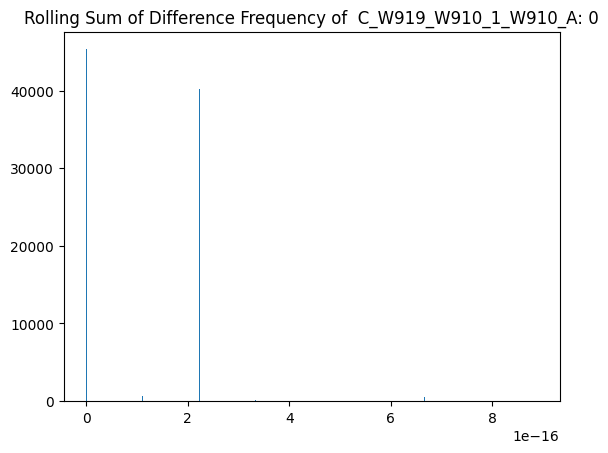

******************************************************************************


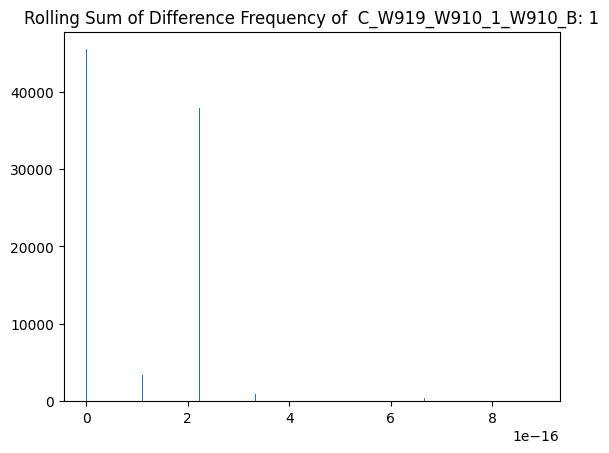

******************************************************************************


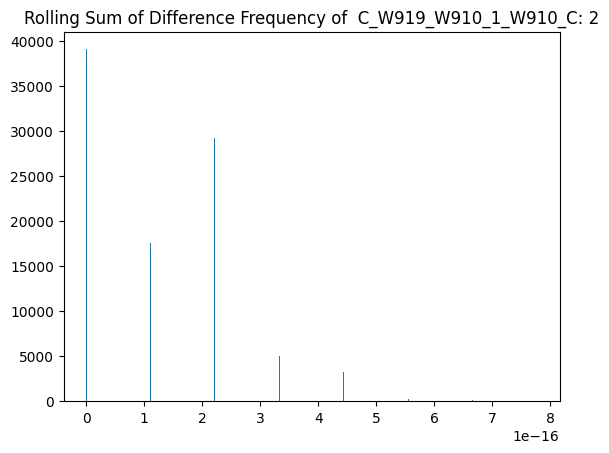

******************************************************************************


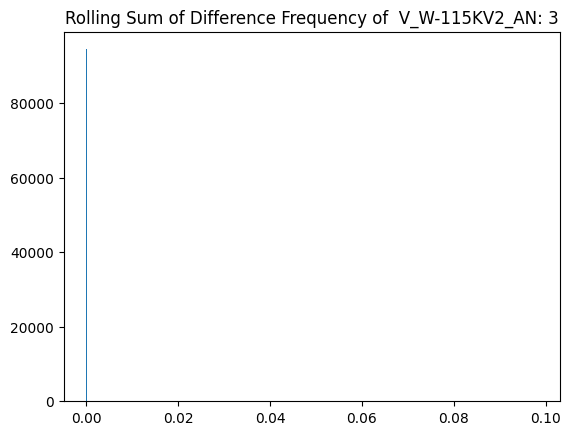

******************************************************************************


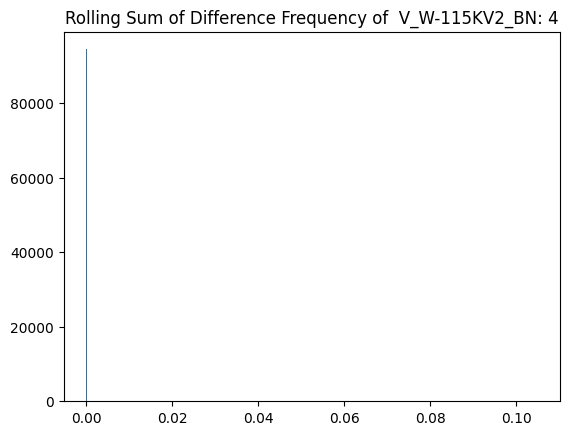

******************************************************************************


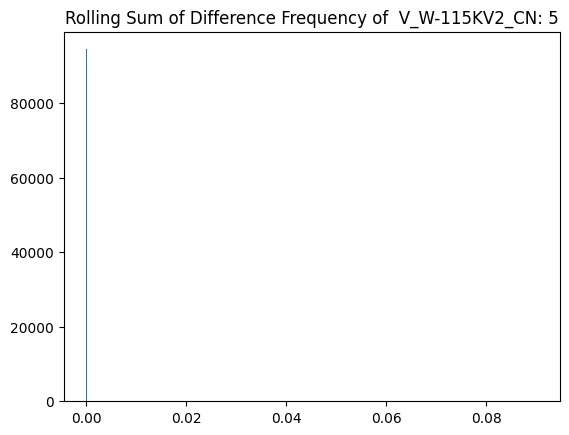

******************************************************************************


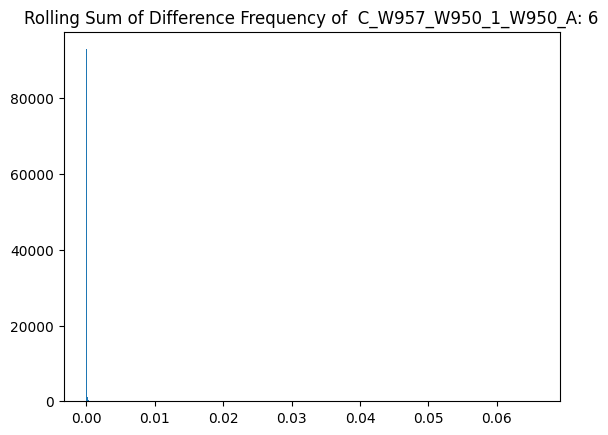

******************************************************************************


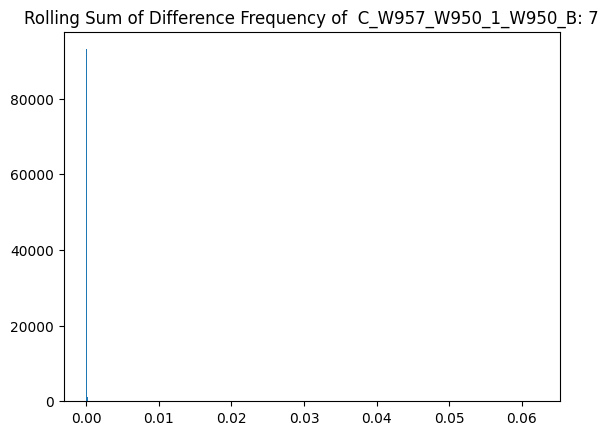

******************************************************************************


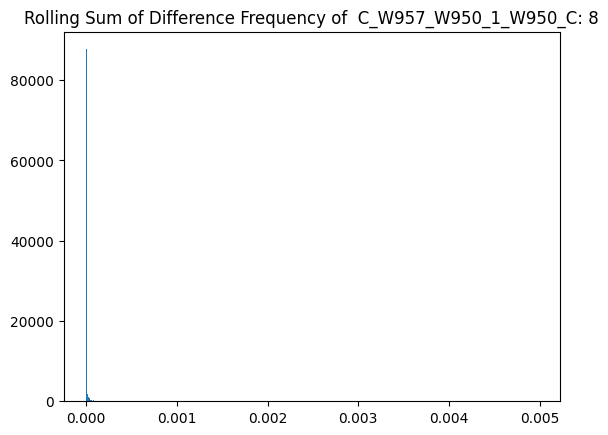

******************************************************************************


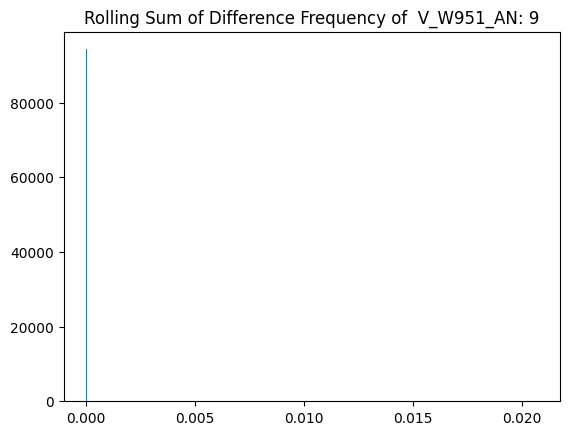

******************************************************************************


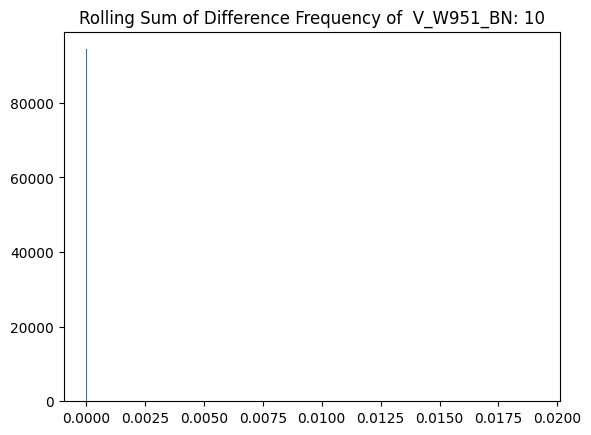

******************************************************************************


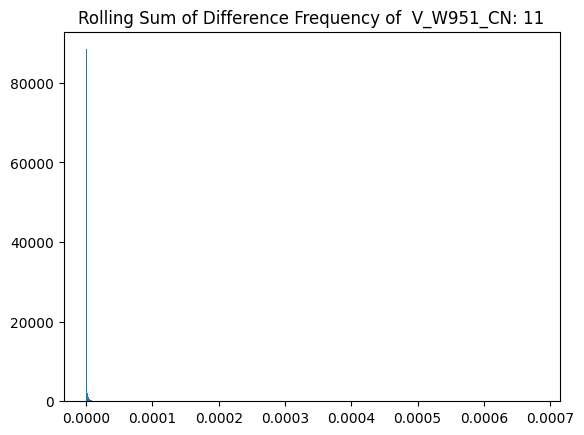

******************************************************************************


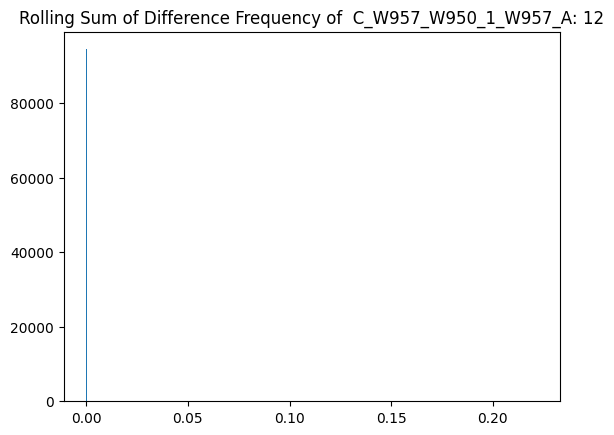

******************************************************************************


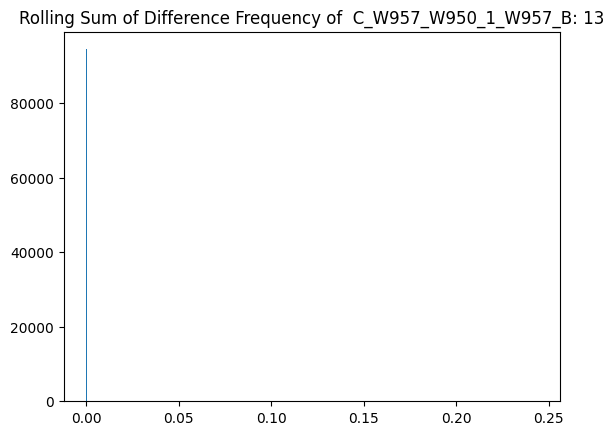

******************************************************************************


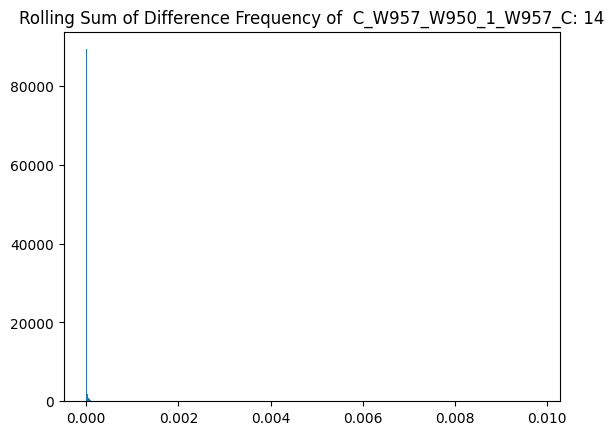

******************************************************************************


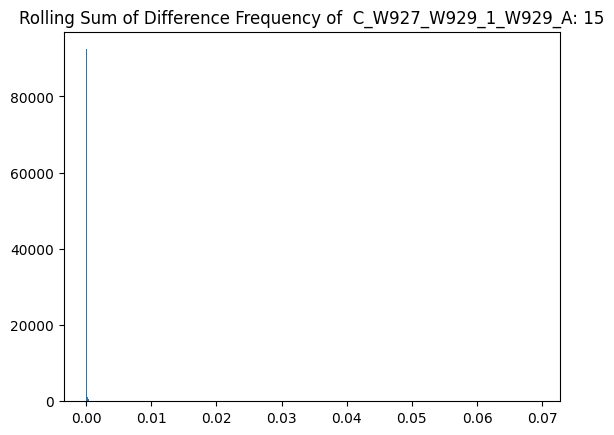

******************************************************************************


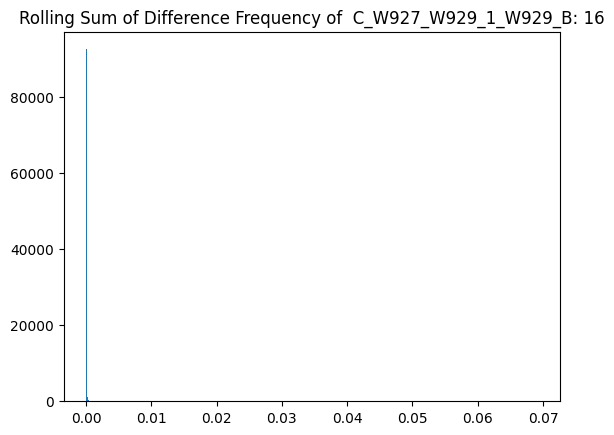

******************************************************************************


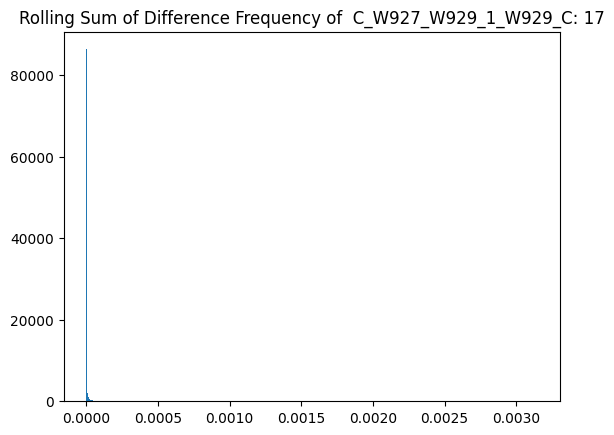

******************************************************************************


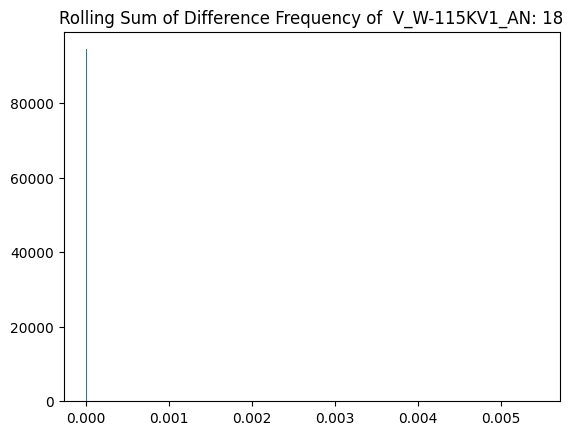

******************************************************************************


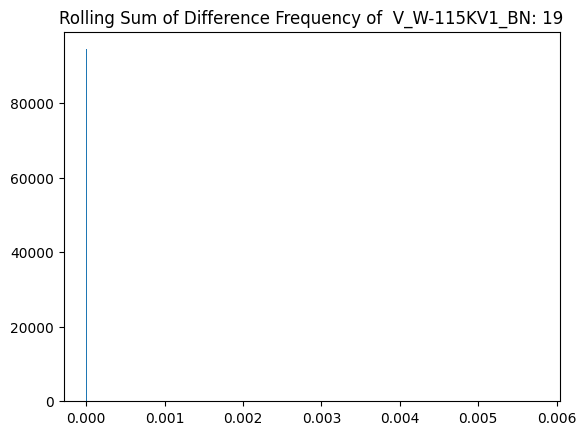

******************************************************************************


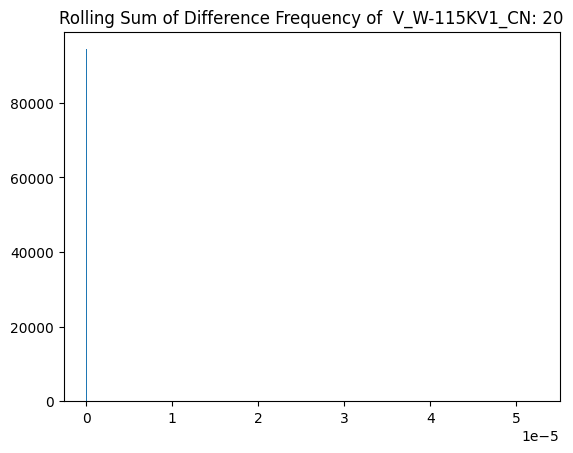

******************************************************************************


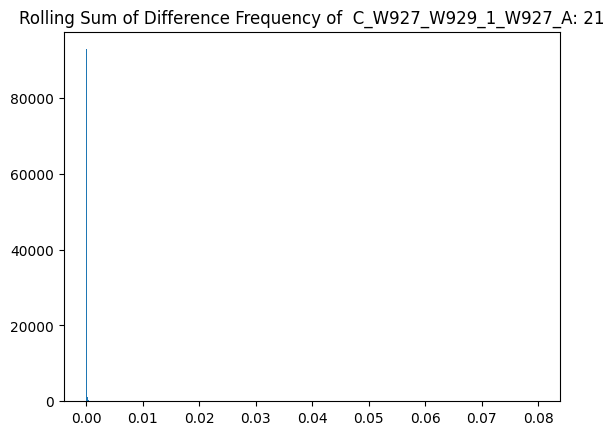

******************************************************************************


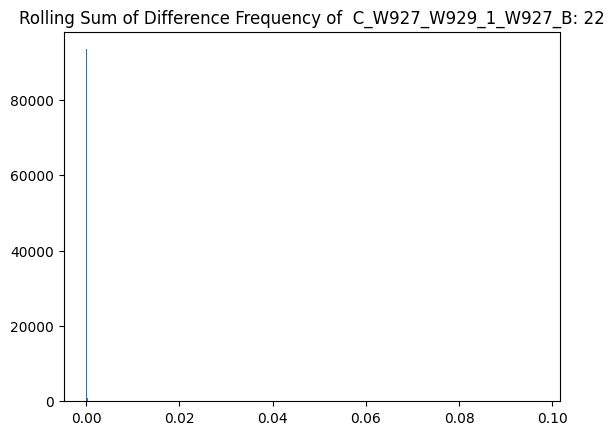

******************************************************************************


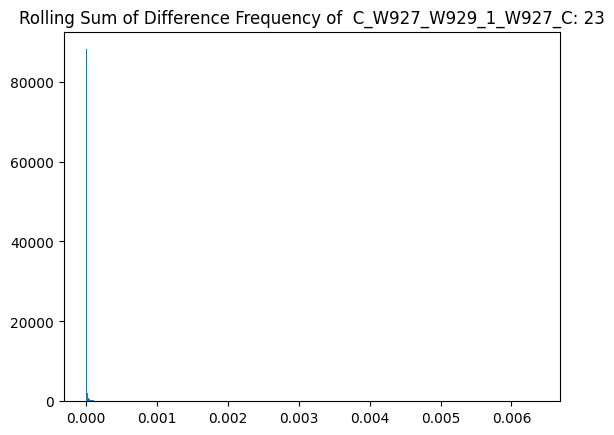

******************************************************************************


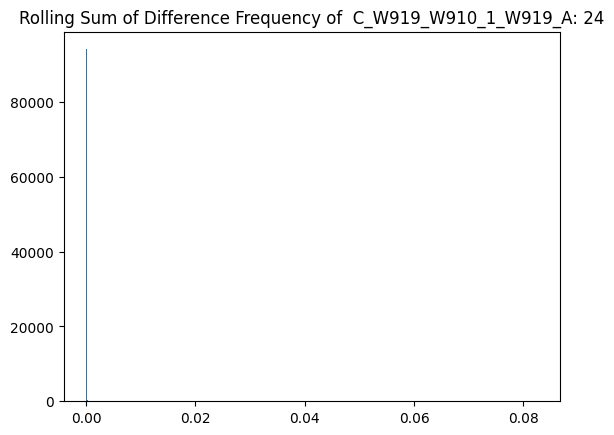

******************************************************************************


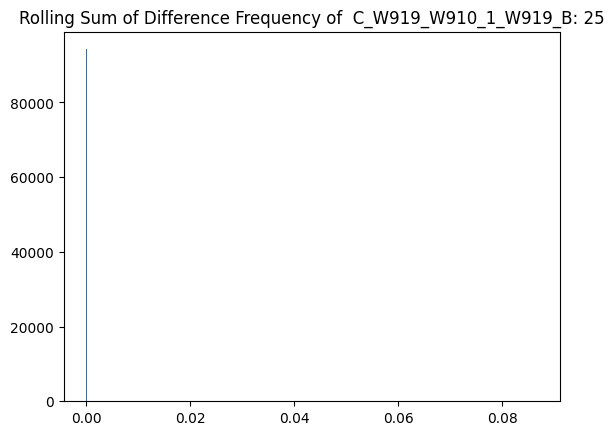

******************************************************************************


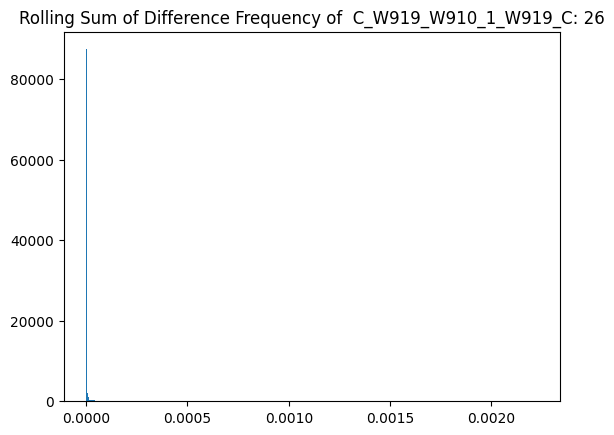

******************************************************************************


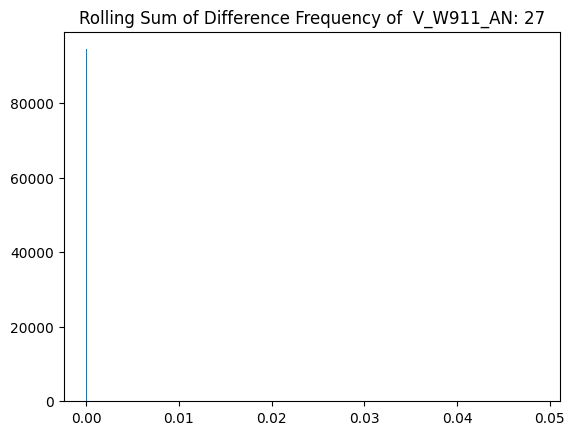

******************************************************************************


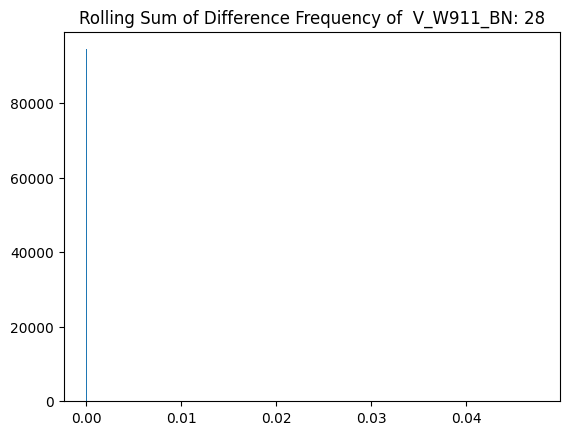

******************************************************************************


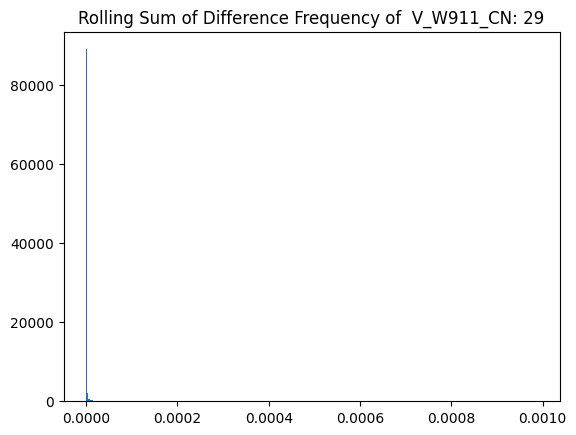

******************************************************************************


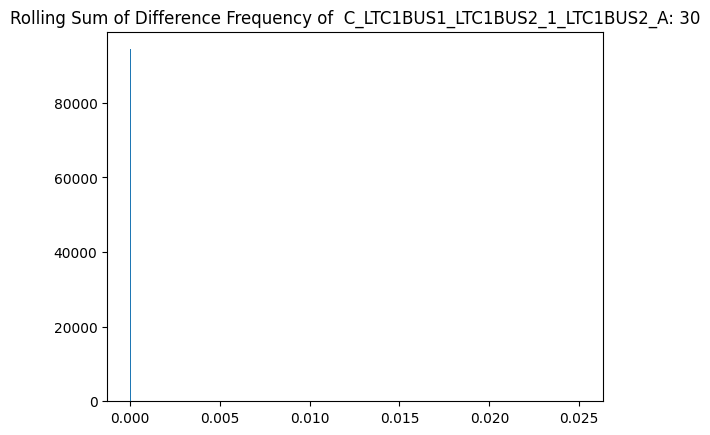

******************************************************************************


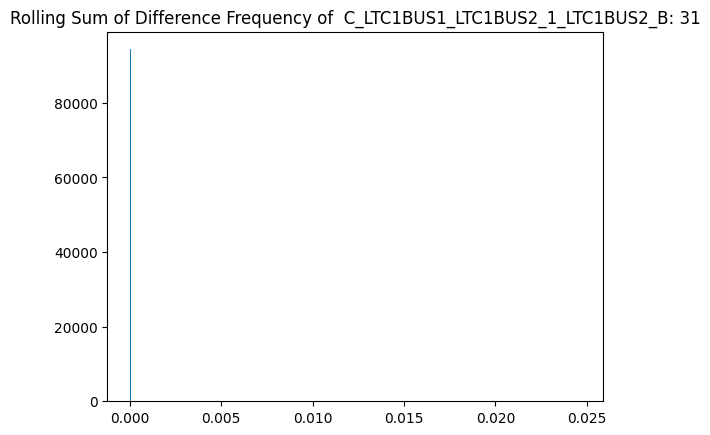

******************************************************************************


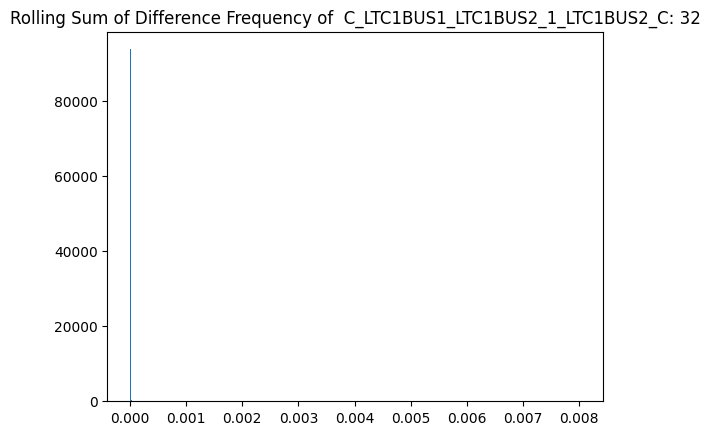

******************************************************************************


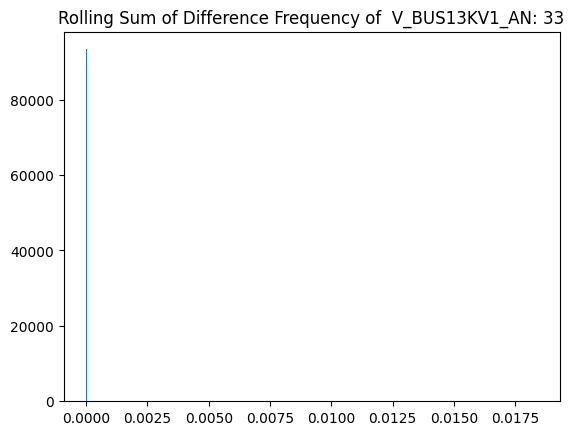

******************************************************************************


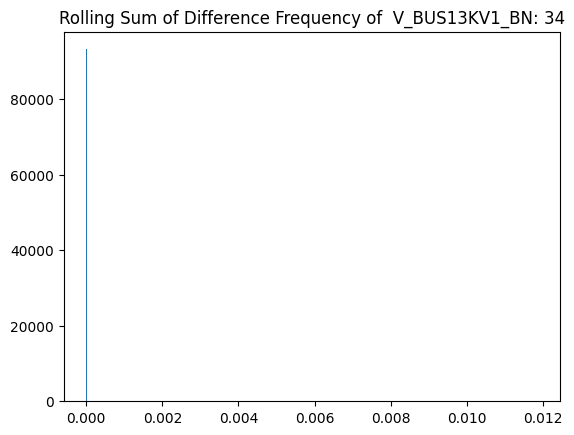

******************************************************************************


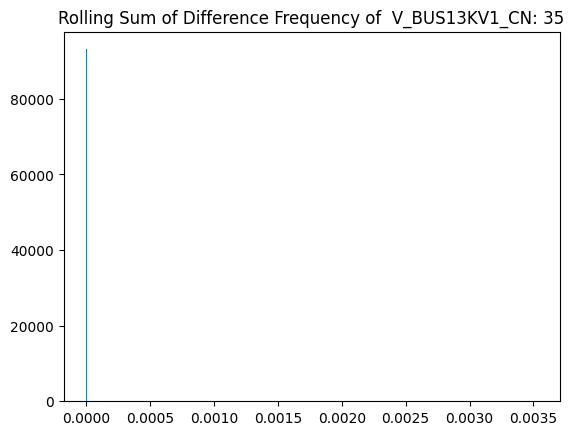

******************************************************************************


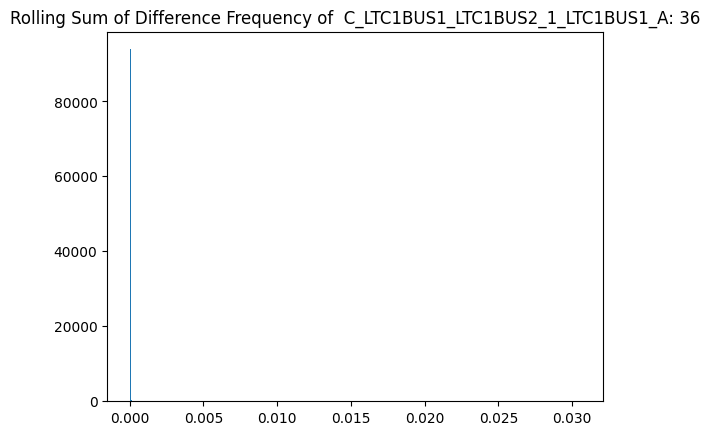

******************************************************************************


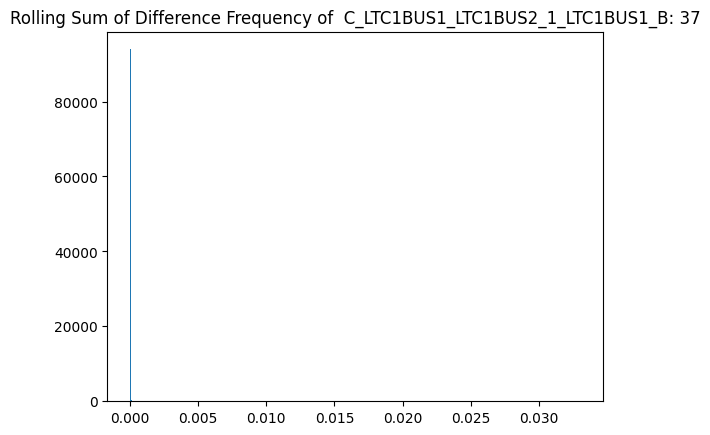

******************************************************************************


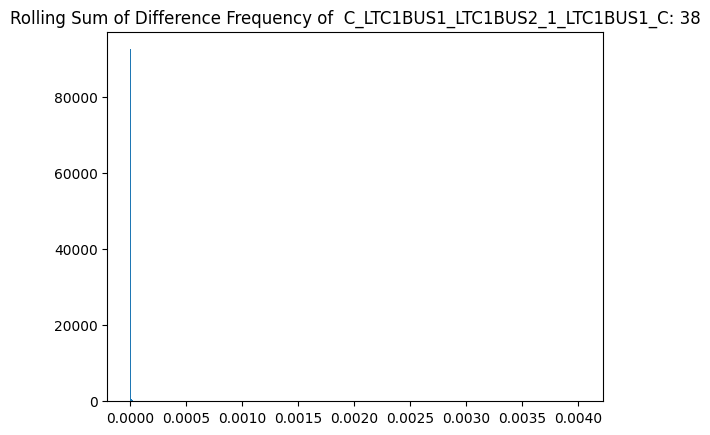

******************************************************************************


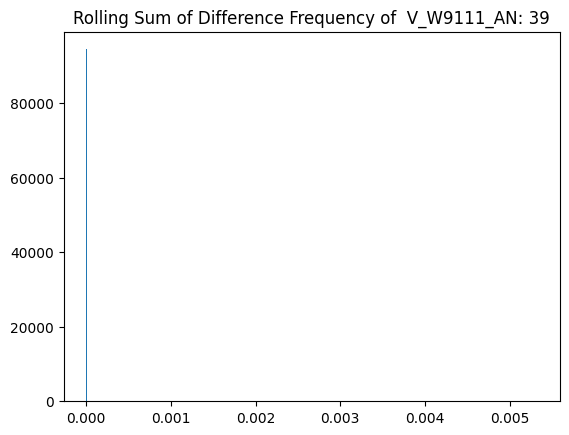

******************************************************************************


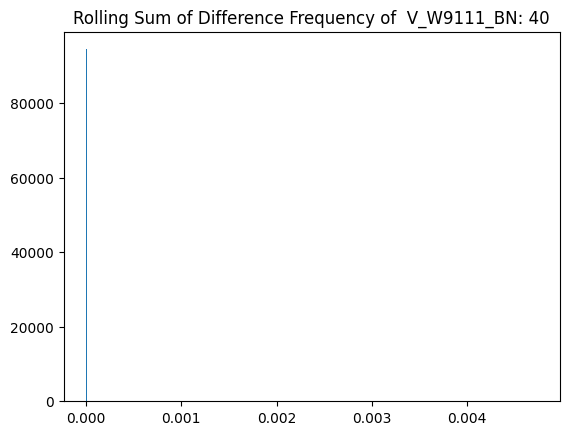

******************************************************************************


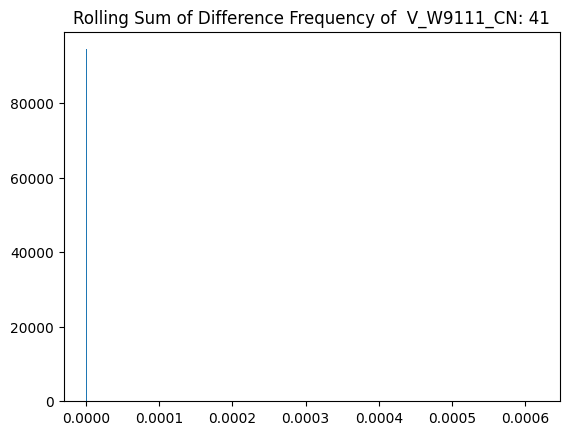

******************************************************************************


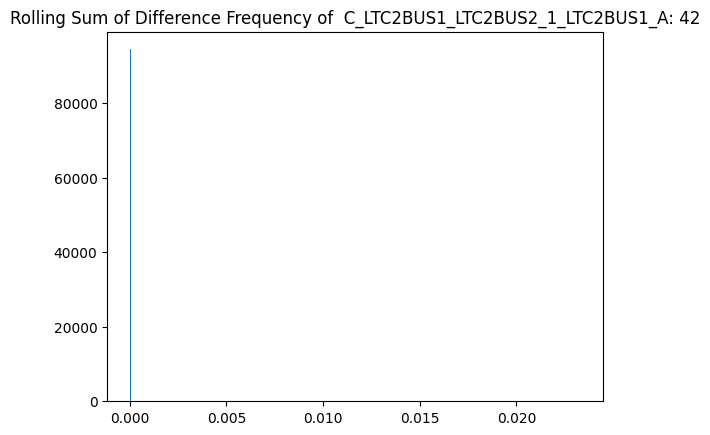

******************************************************************************


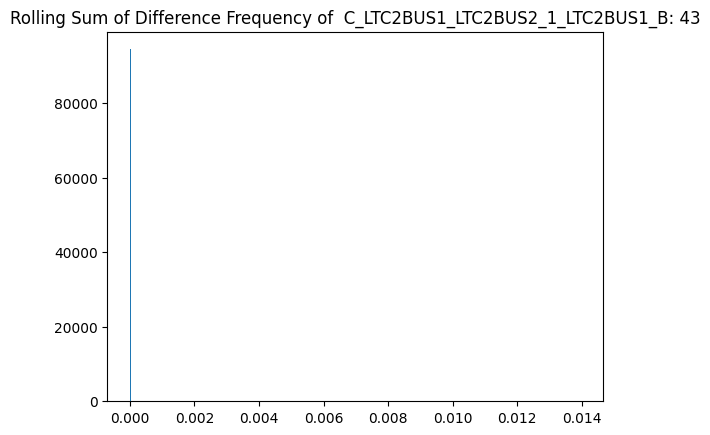

******************************************************************************


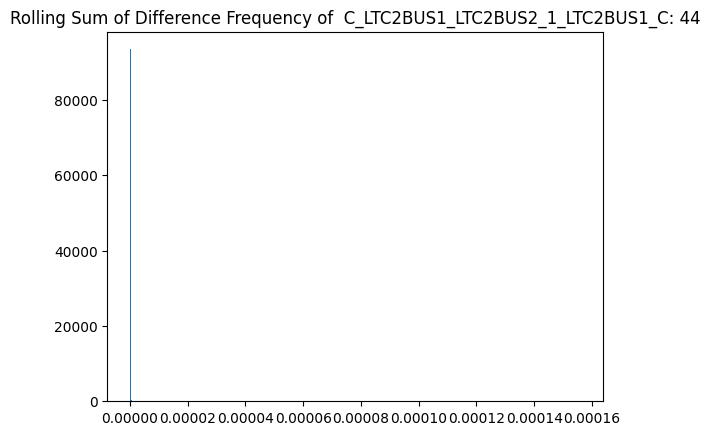

******************************************************************************


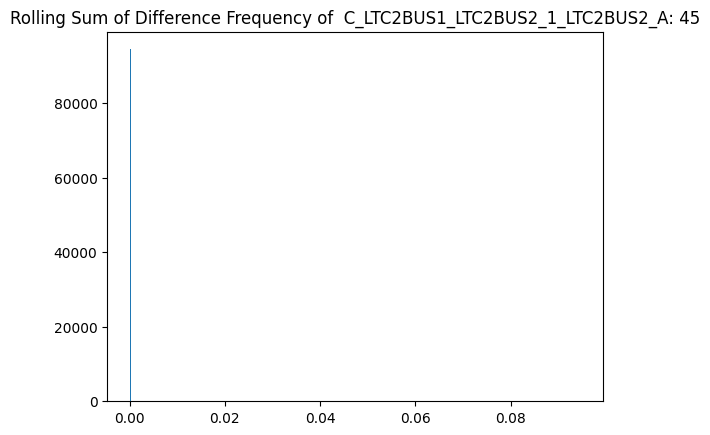

******************************************************************************


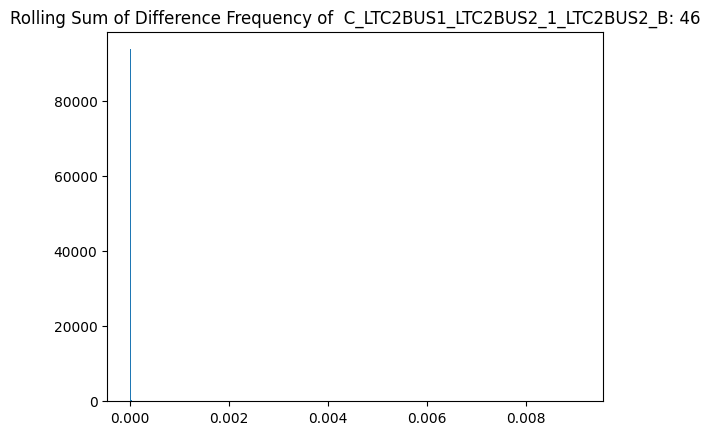

******************************************************************************


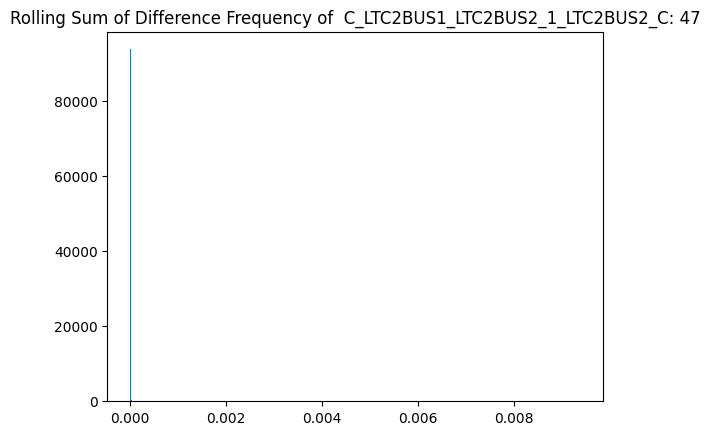

******************************************************************************


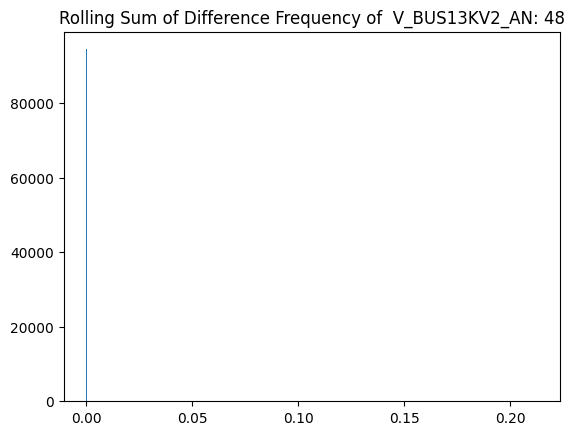

******************************************************************************


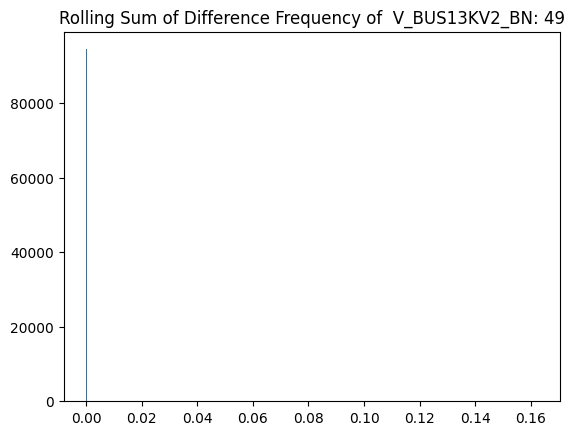

******************************************************************************


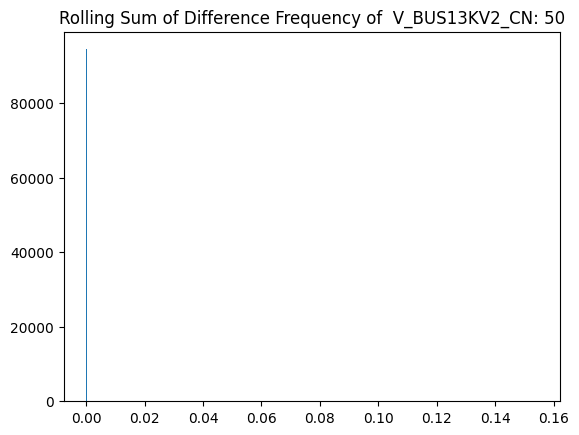

******************************************************************************


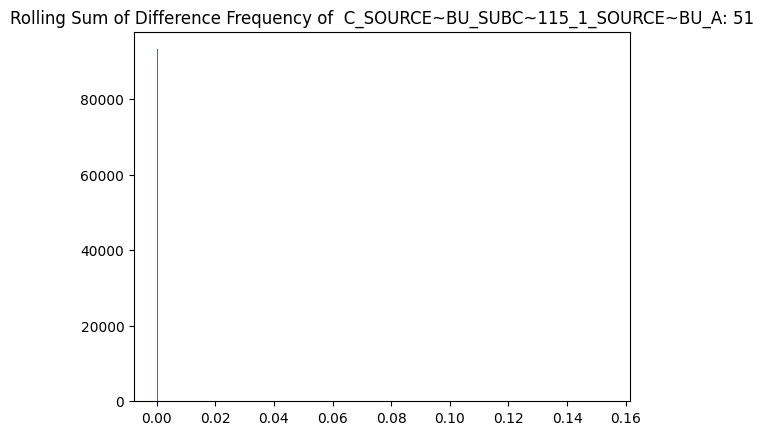

******************************************************************************


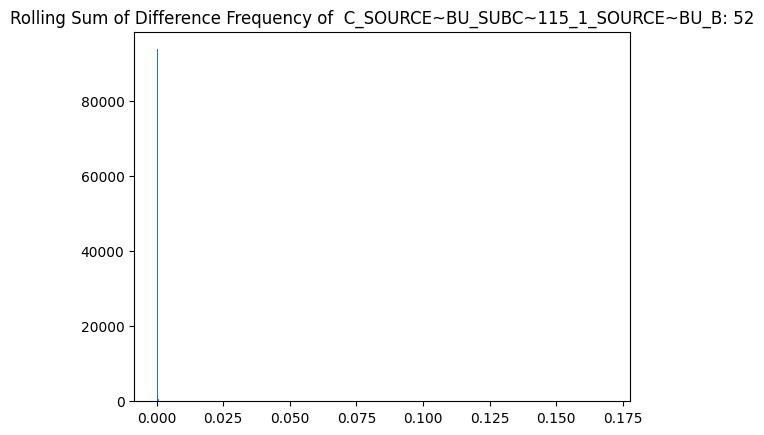

******************************************************************************


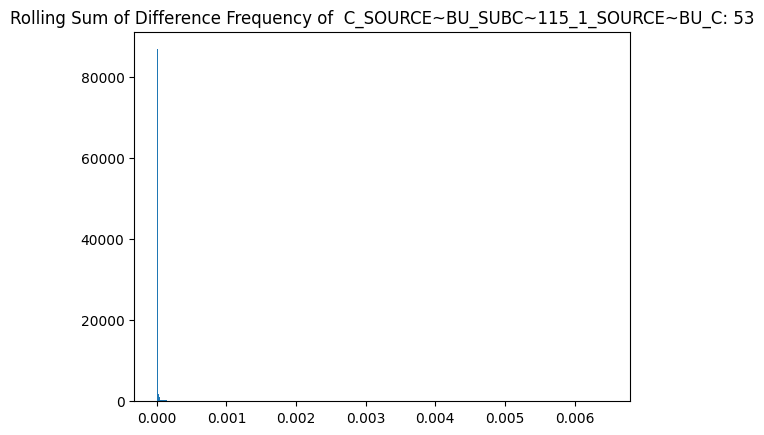

******************************************************************************


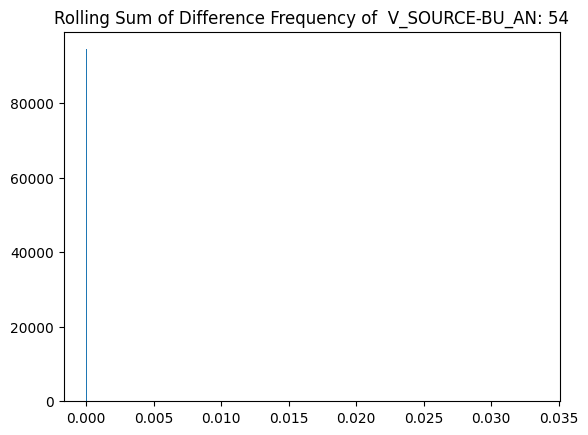

******************************************************************************


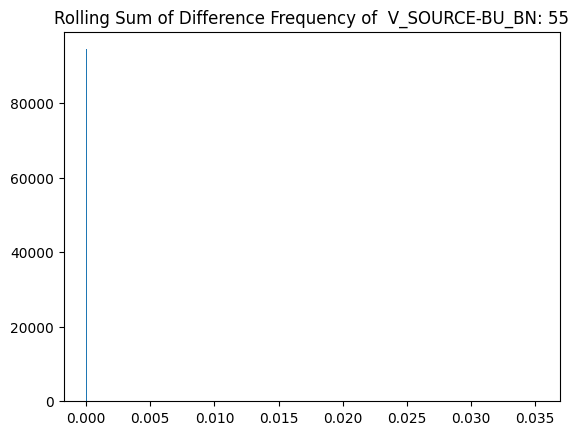

******************************************************************************


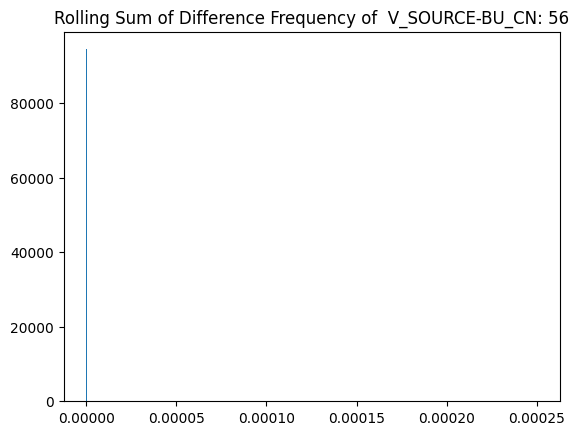

******************************************************************************


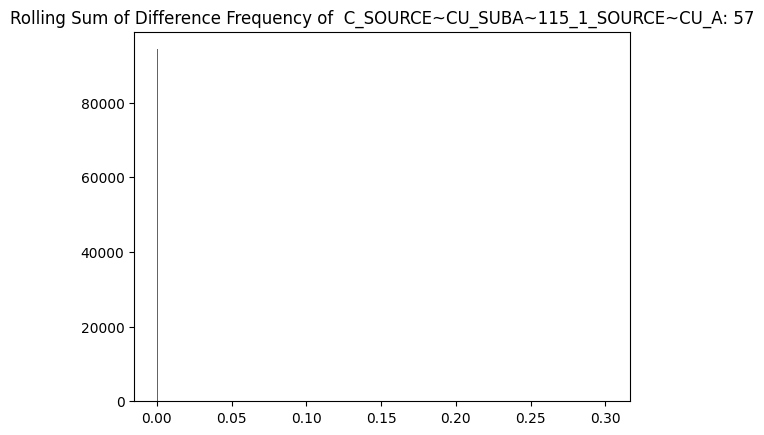

******************************************************************************


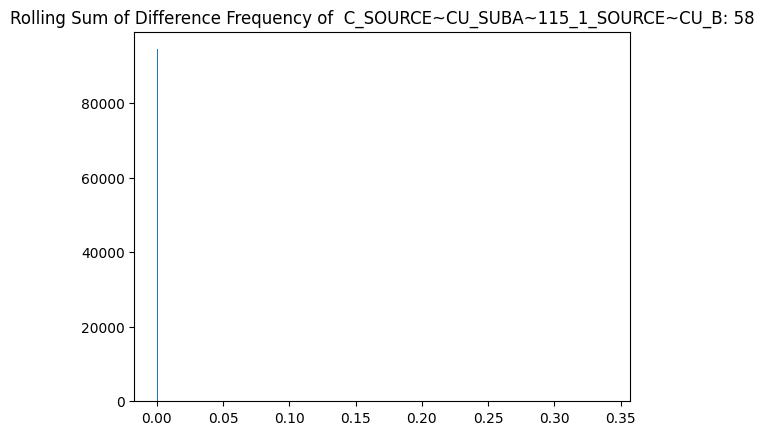

******************************************************************************


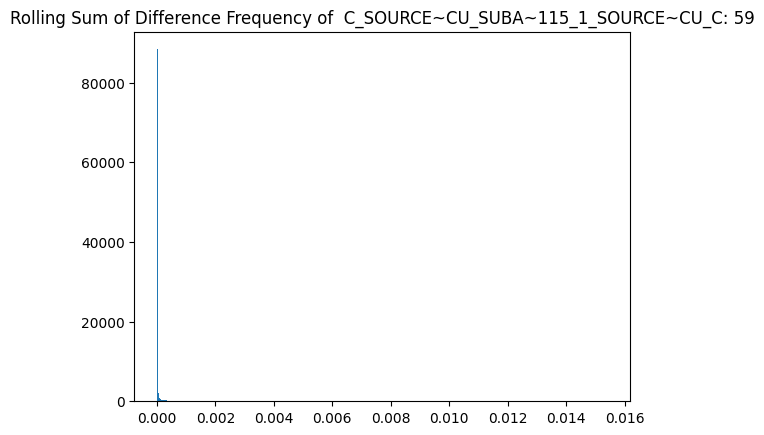

******************************************************************************


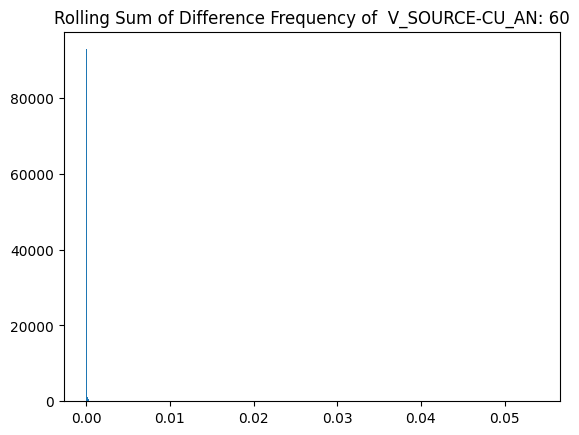

******************************************************************************


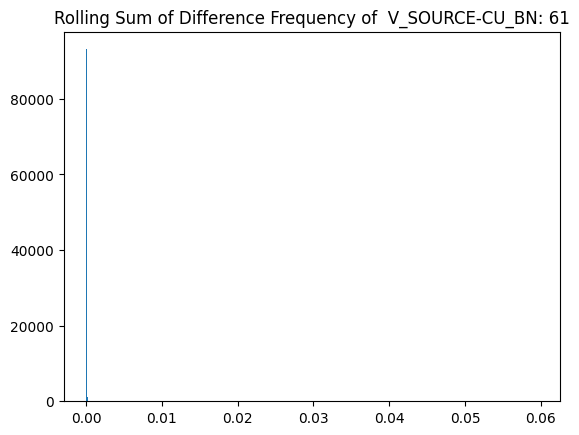

******************************************************************************


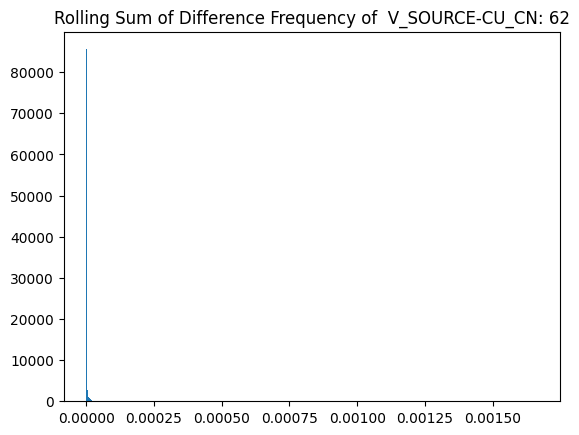

******************************************************************************


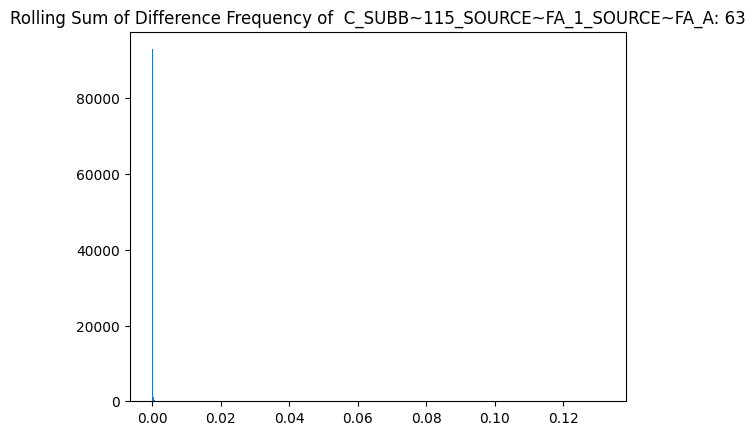

******************************************************************************


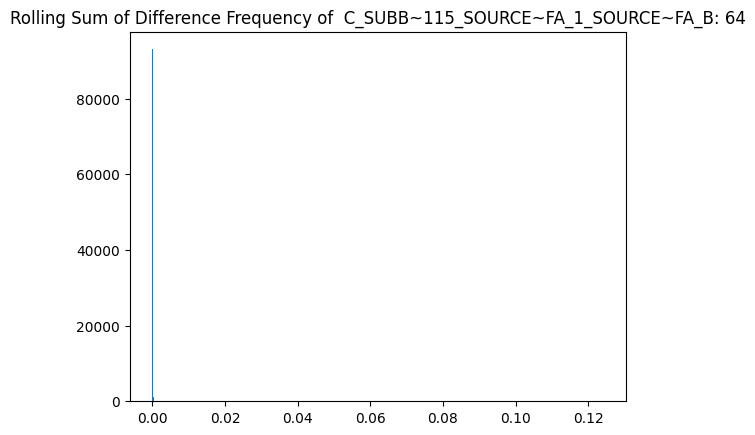

******************************************************************************


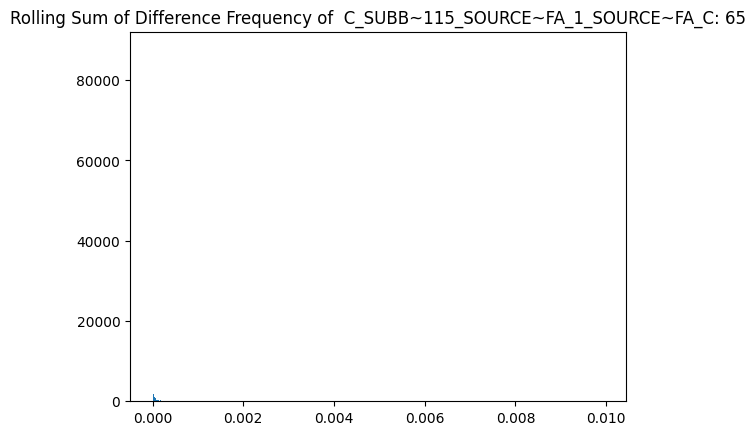

******************************************************************************


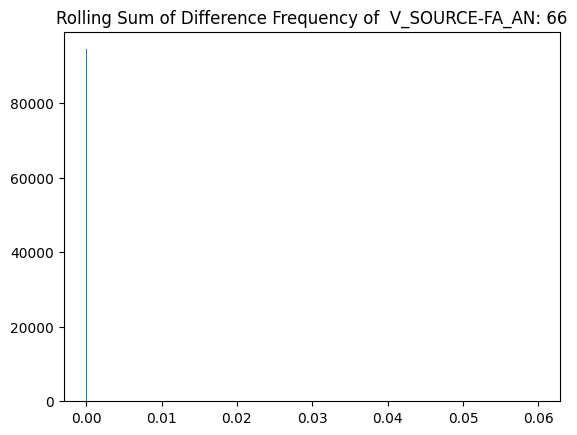

******************************************************************************


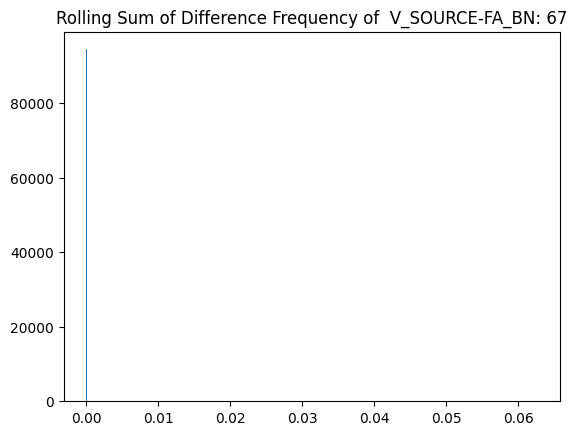

******************************************************************************


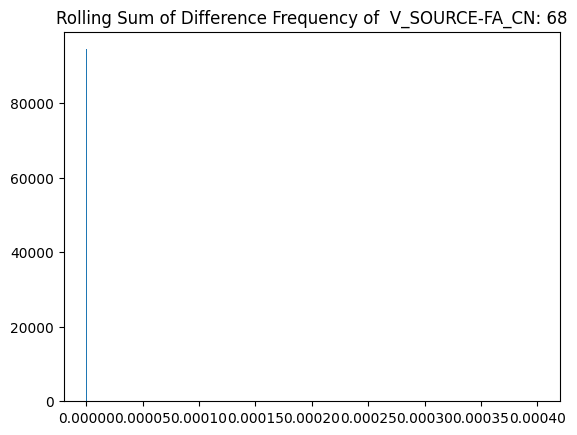

******************************************************************************


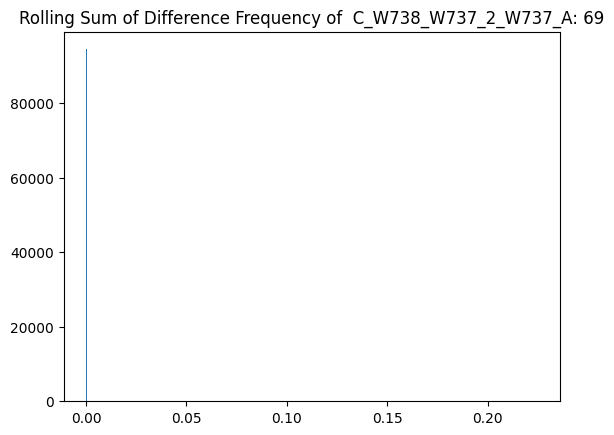

******************************************************************************


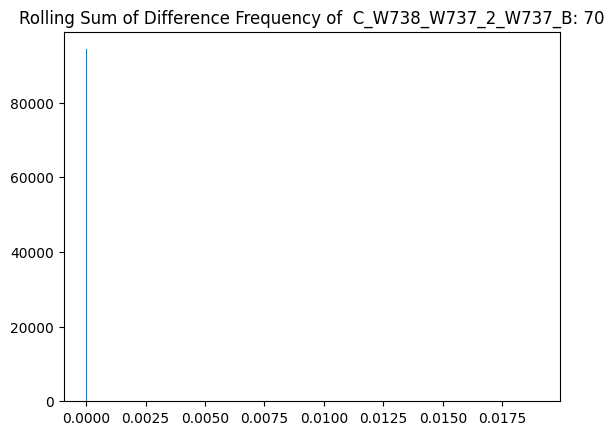

******************************************************************************


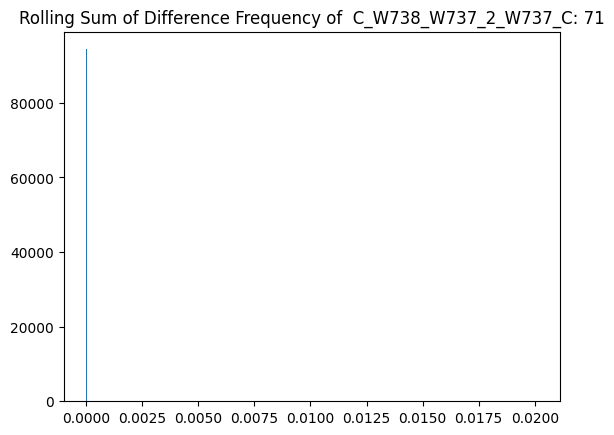

******************************************************************************


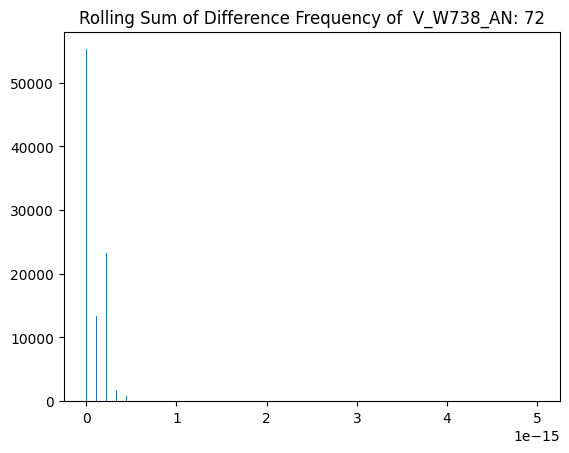

******************************************************************************


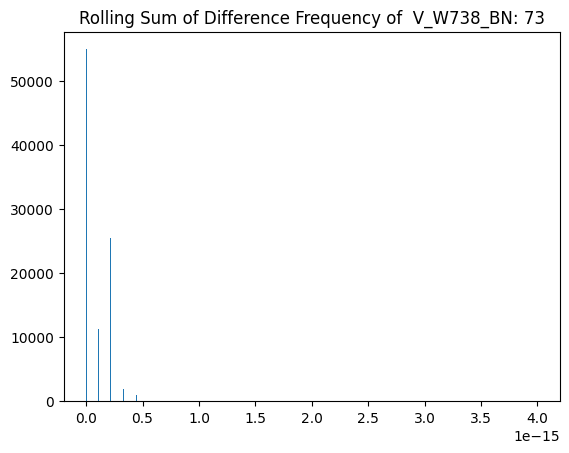

******************************************************************************


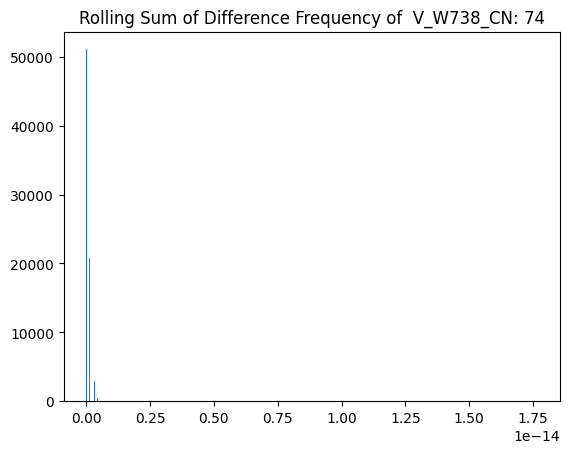

******************************************************************************


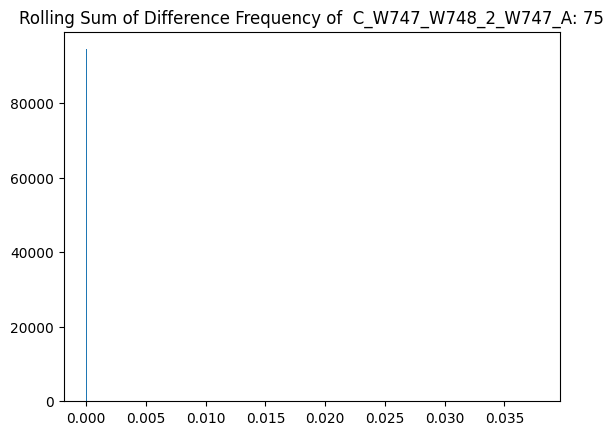

******************************************************************************


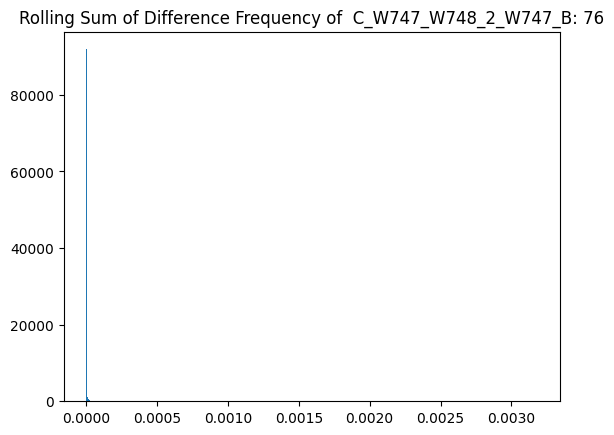

******************************************************************************


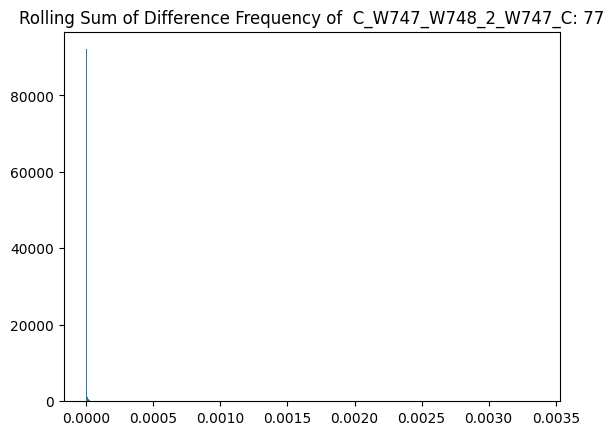

******************************************************************************


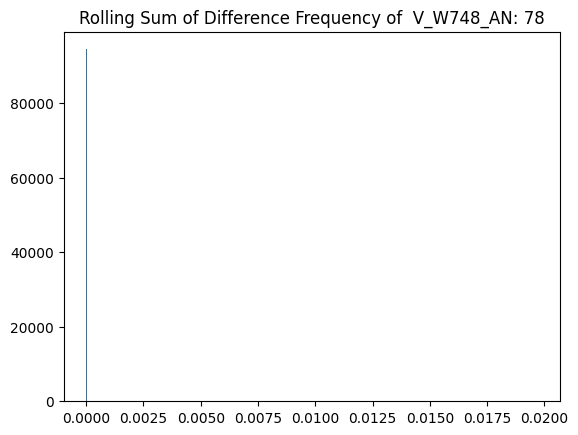

******************************************************************************


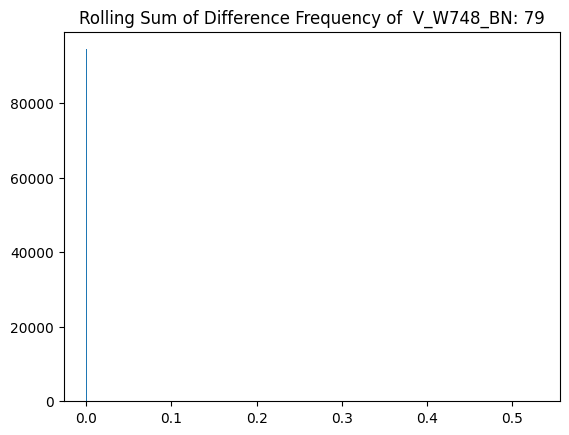

******************************************************************************


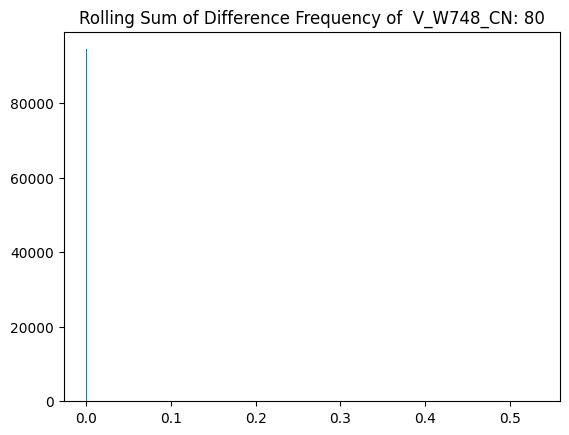

******************************************************************************


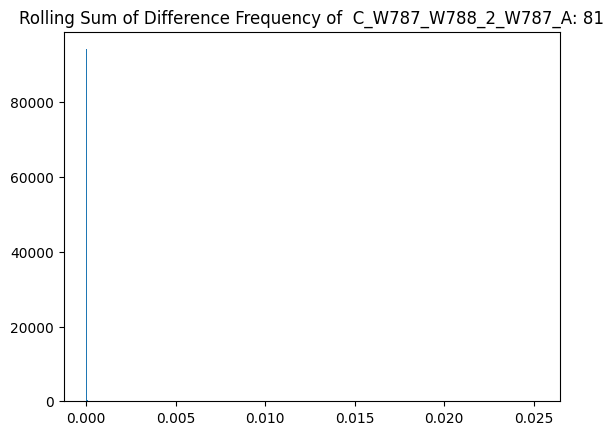

******************************************************************************


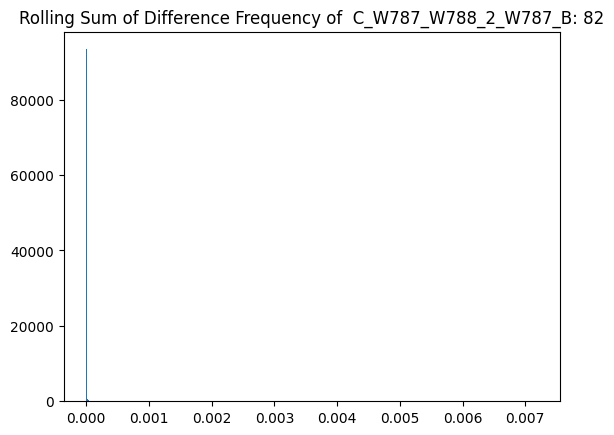

******************************************************************************


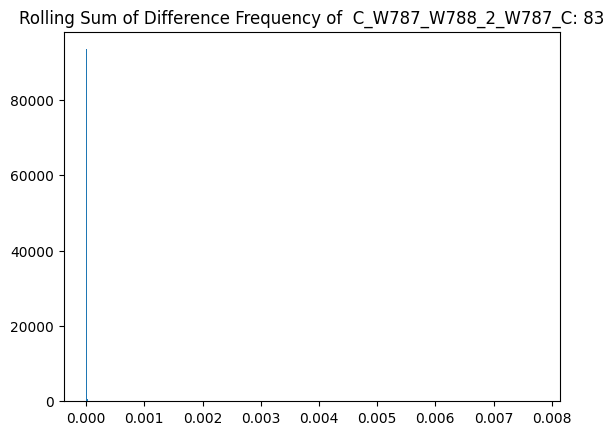

******************************************************************************


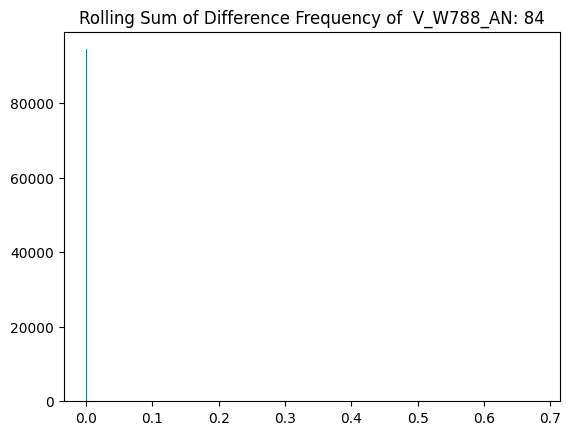

******************************************************************************


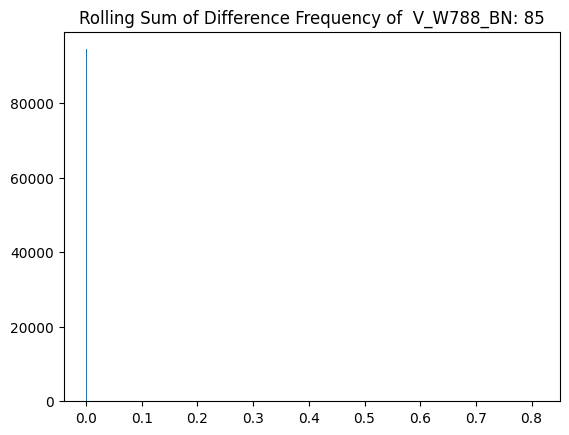

******************************************************************************


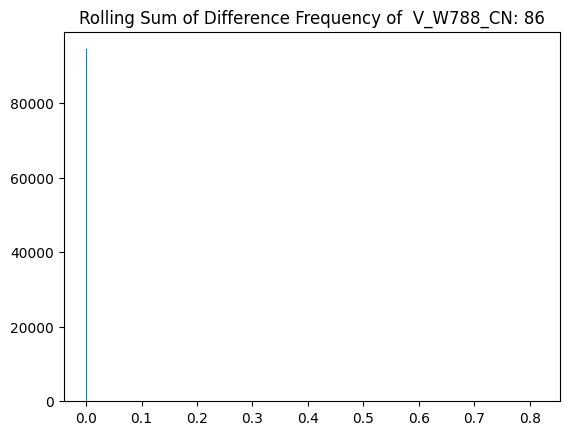

******************************************************************************


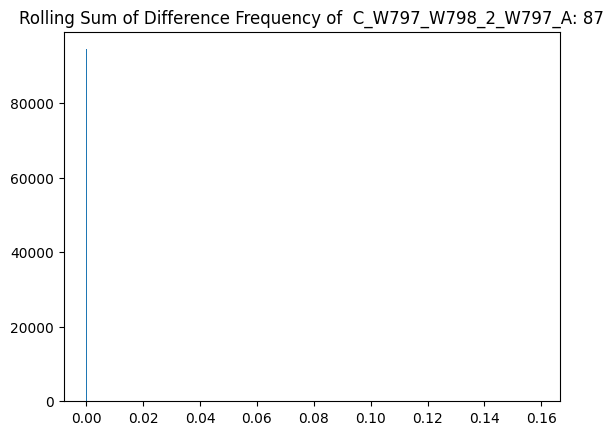

******************************************************************************


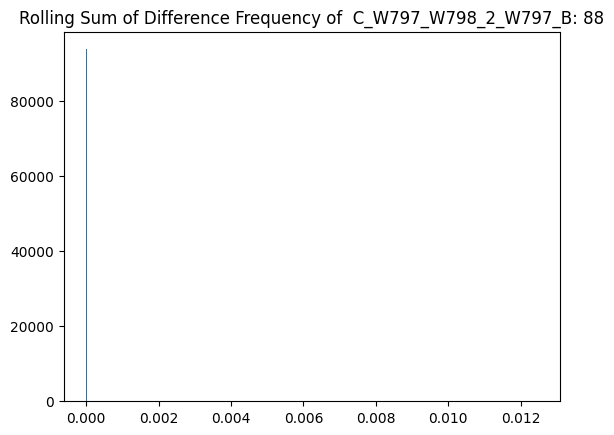

******************************************************************************


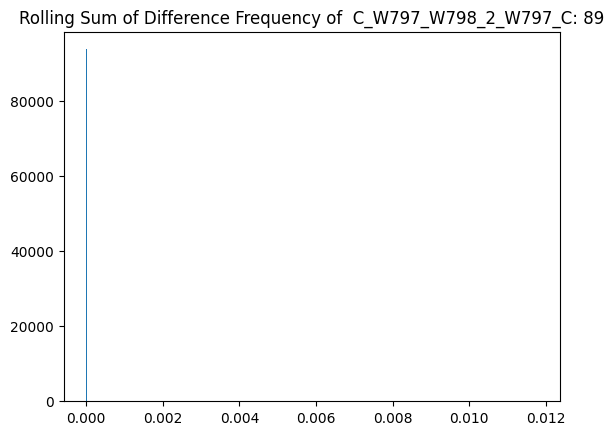

******************************************************************************


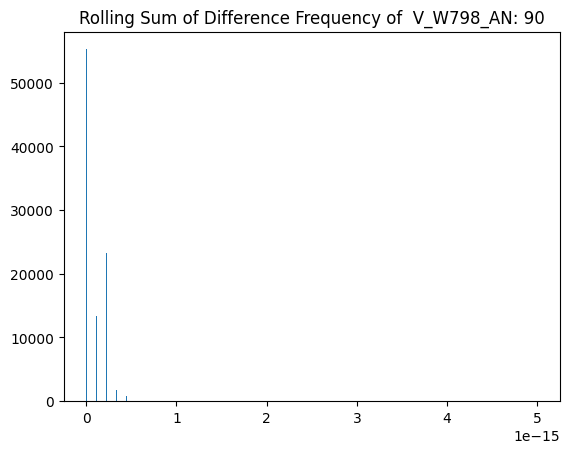

******************************************************************************


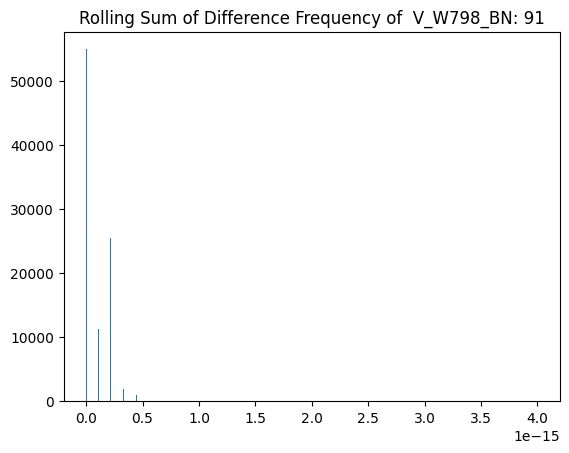

******************************************************************************


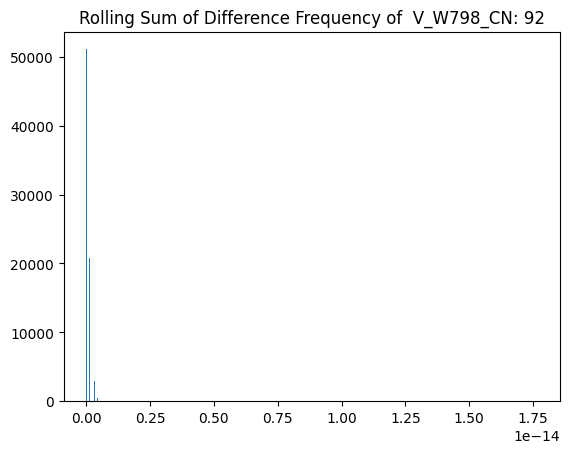

******************************************************************************


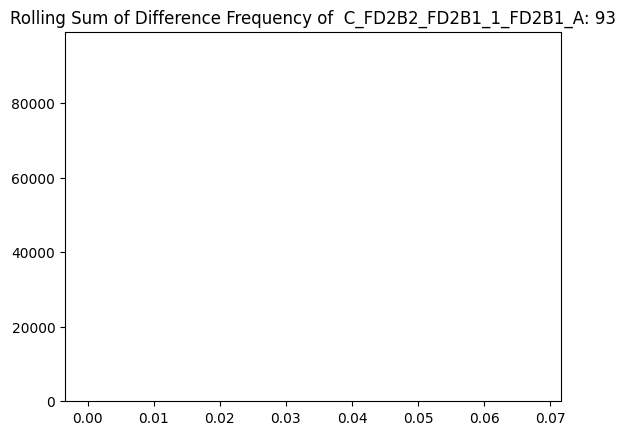

******************************************************************************


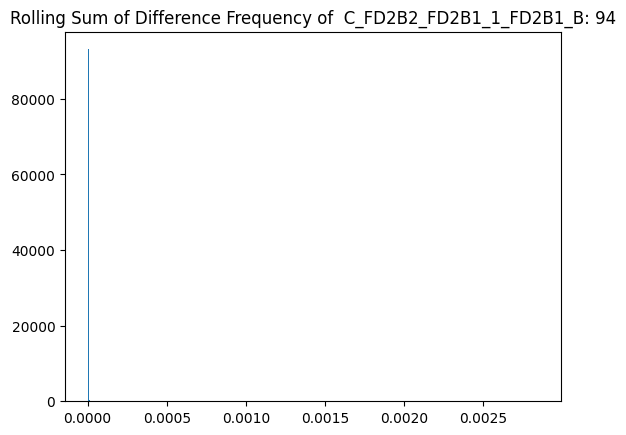

******************************************************************************


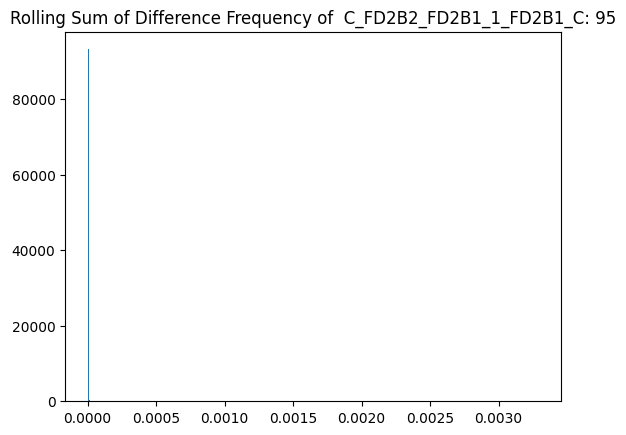

******************************************************************************


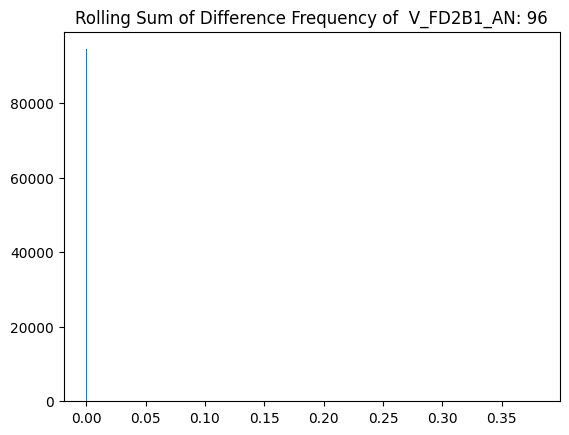

******************************************************************************


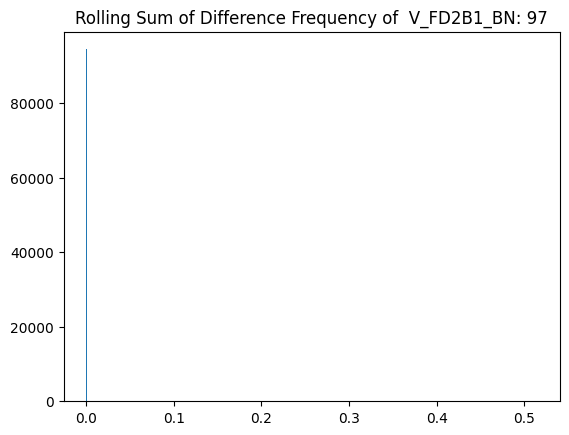

******************************************************************************


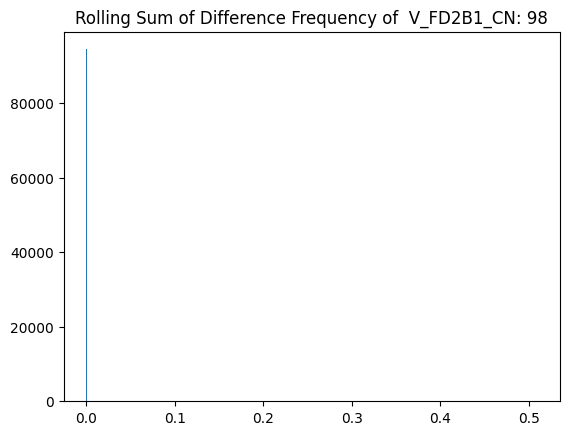

******************************************************************************


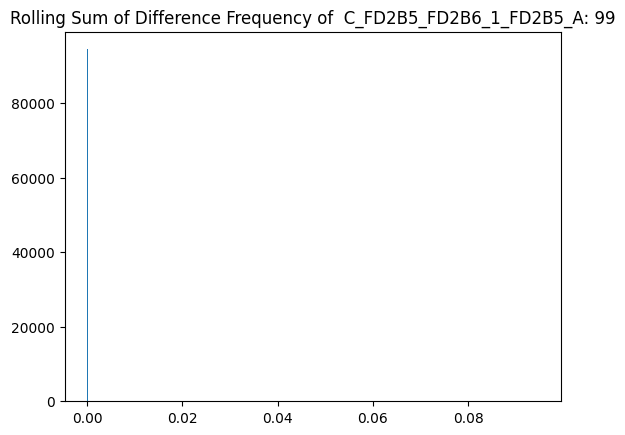

******************************************************************************


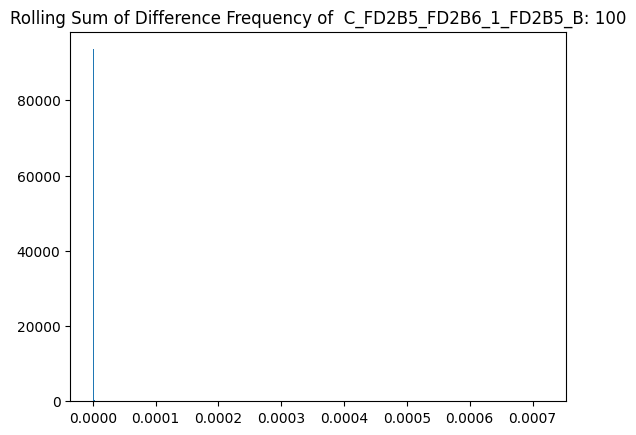

******************************************************************************


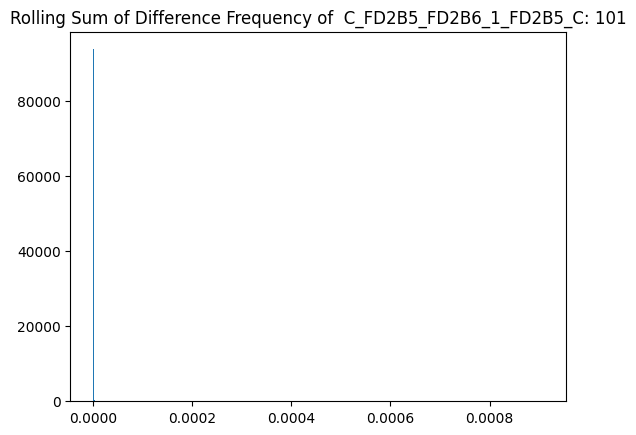

******************************************************************************


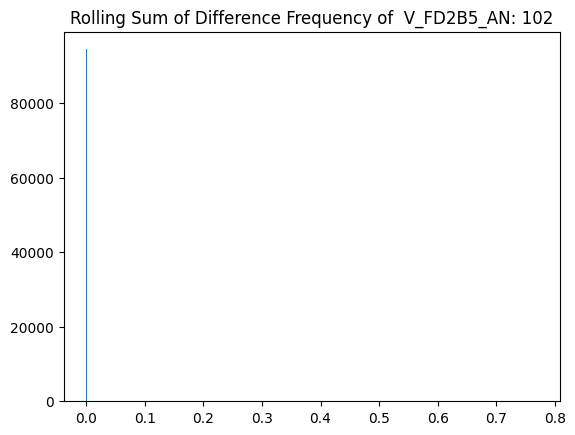

******************************************************************************


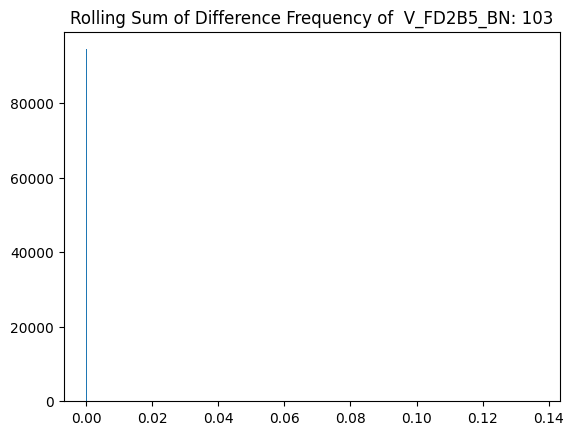

******************************************************************************


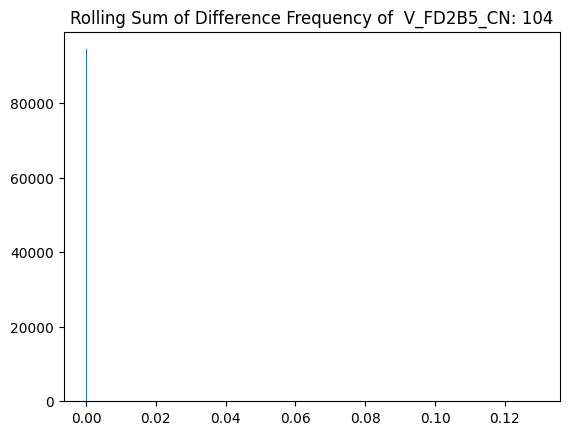

******************************************************************************


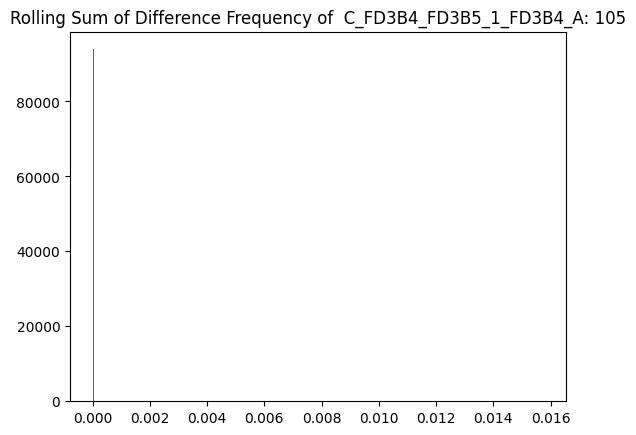

******************************************************************************


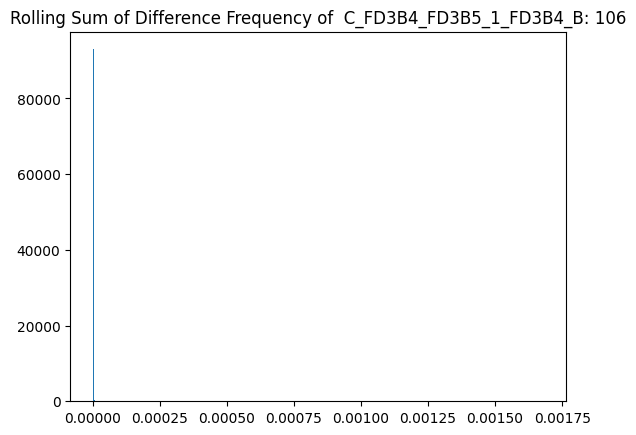

******************************************************************************


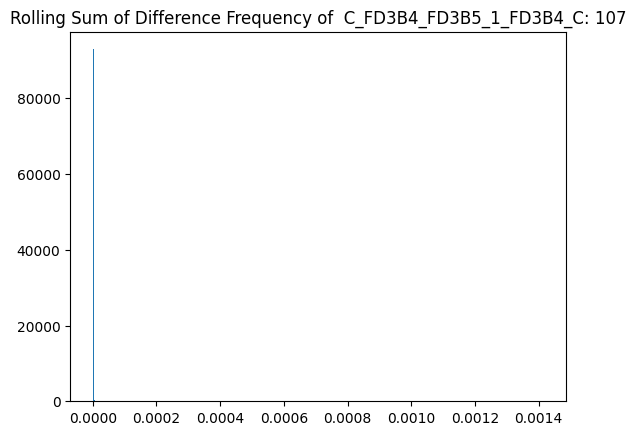

******************************************************************************


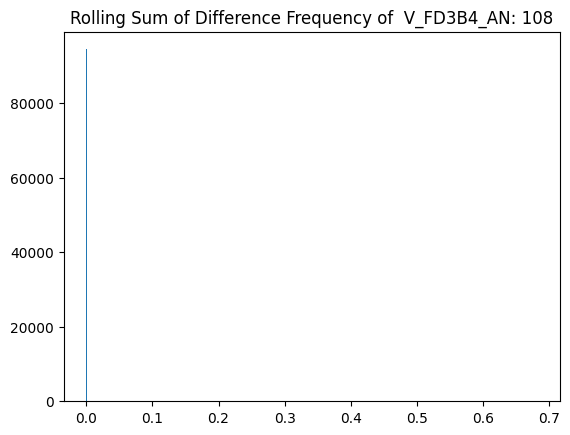

******************************************************************************


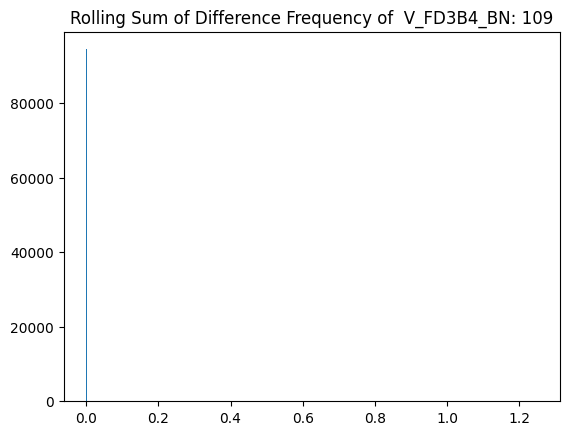

******************************************************************************


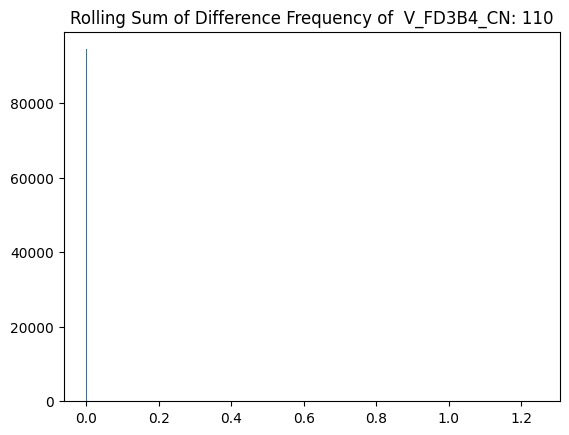

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [ ]:
window = 320
w = 1
cols = data.columns

corr_fn = correlation_pair
thresholds_corr, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_corr_99, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=corr_multi_list, collate_fn="sum")
thresholds_corr_95, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=corr_multi_list, collate_fn="sum")

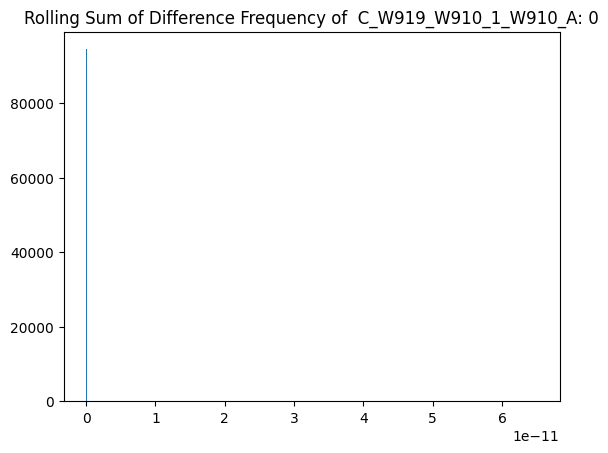

******************************************************************************
[0. 0. 0. ... 0. 0. 0.]
[1]


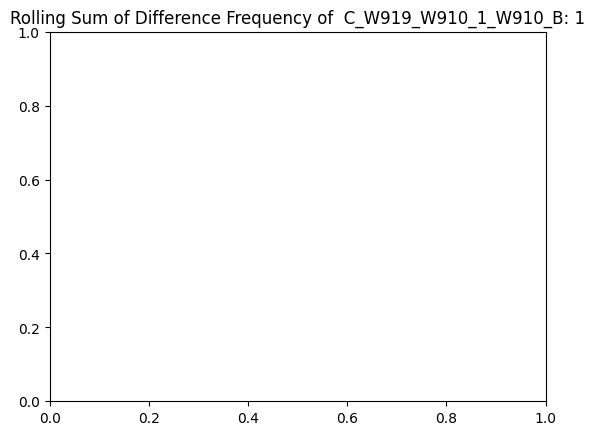

******************************************************************************


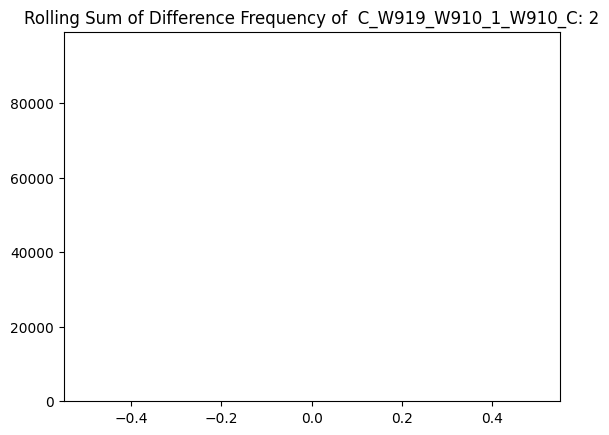

******************************************************************************


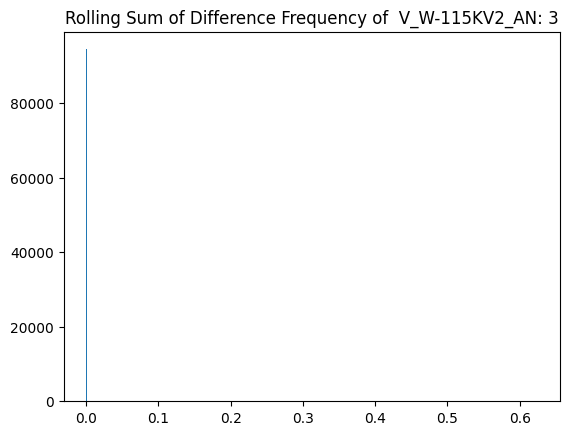

******************************************************************************


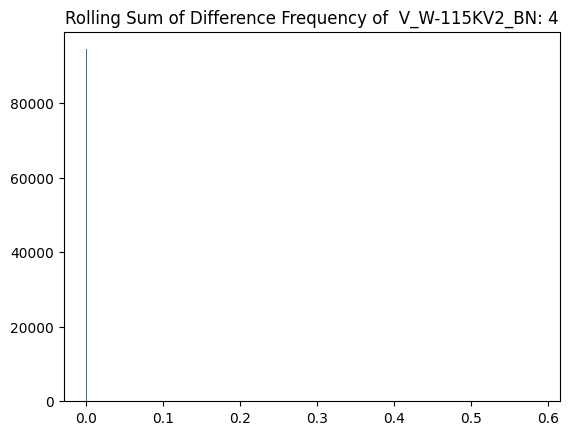

******************************************************************************


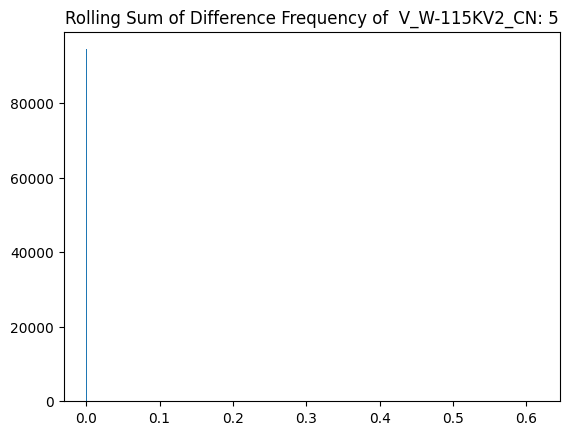

******************************************************************************


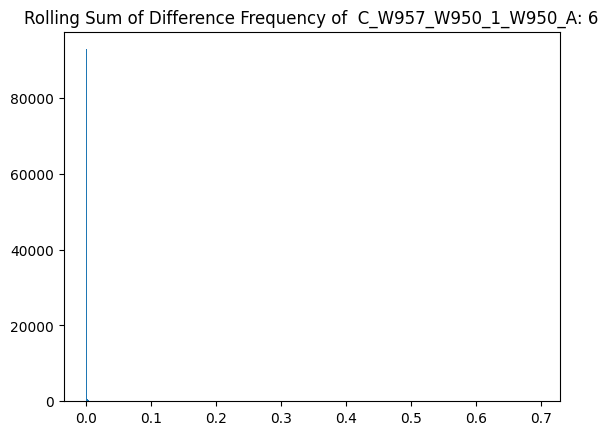

******************************************************************************


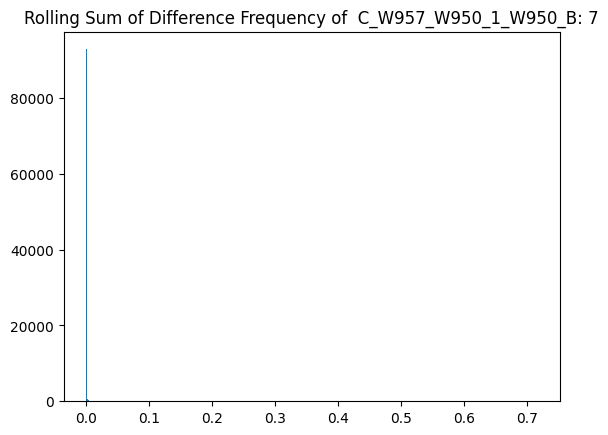

******************************************************************************


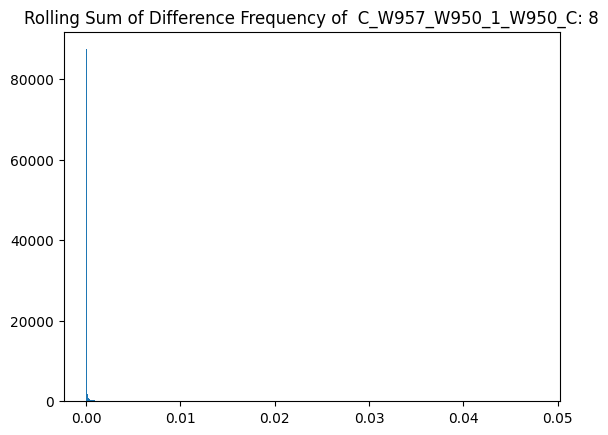

******************************************************************************


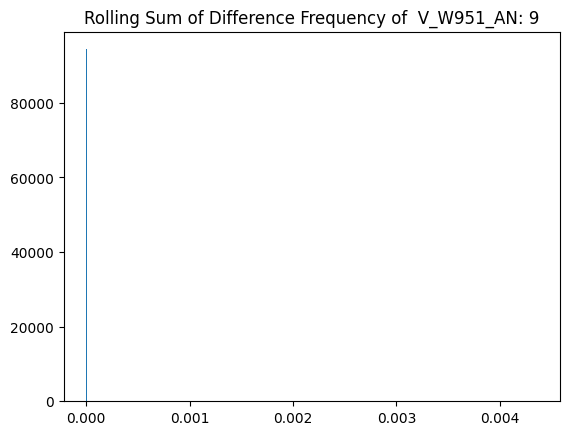

******************************************************************************


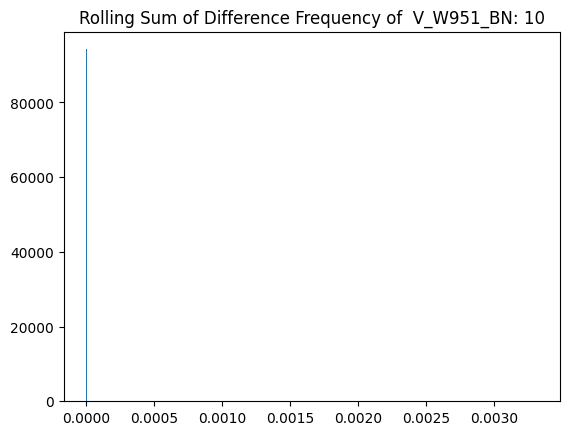

******************************************************************************


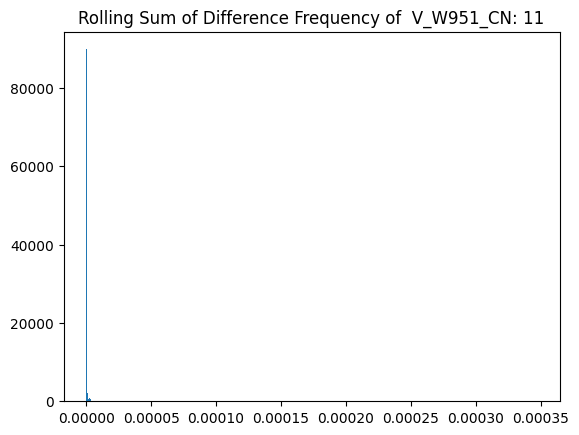

******************************************************************************


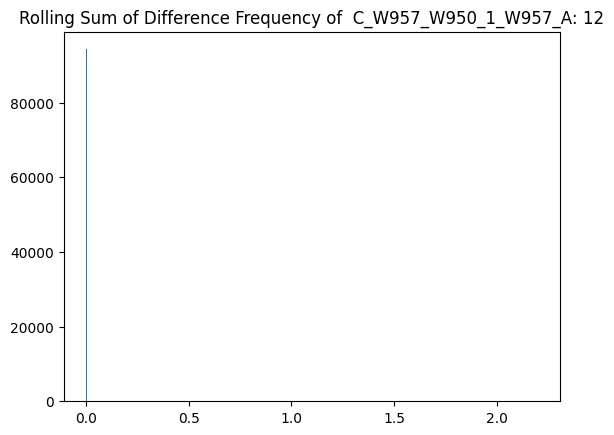

******************************************************************************


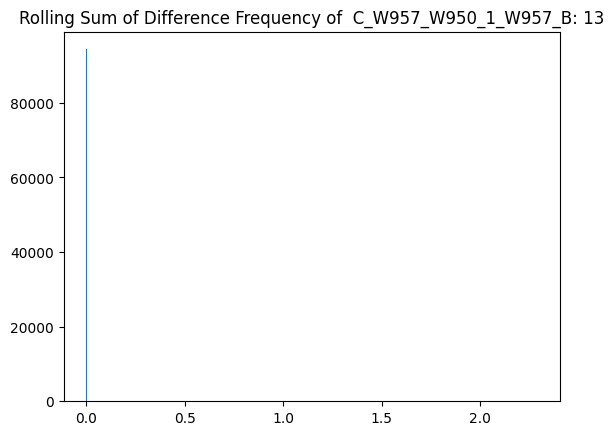

******************************************************************************


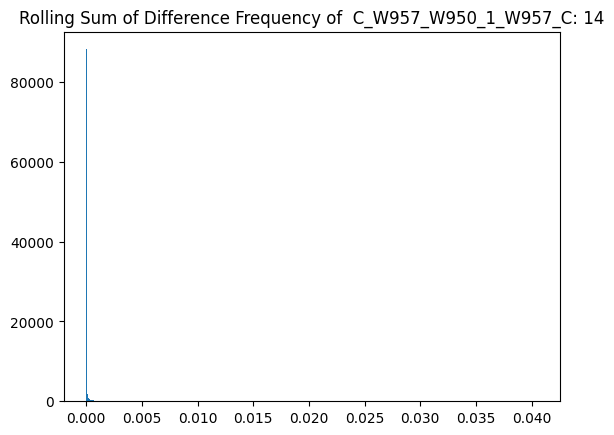

******************************************************************************


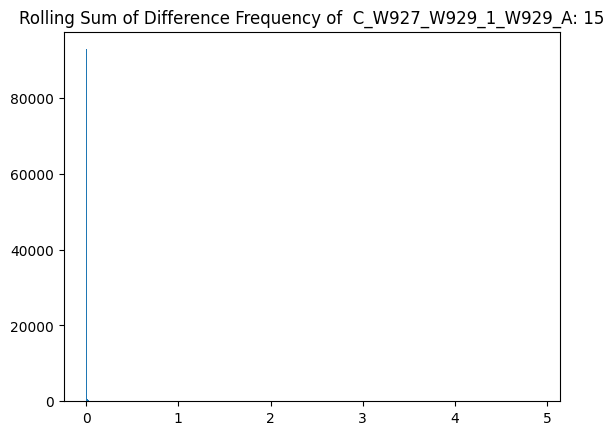

******************************************************************************


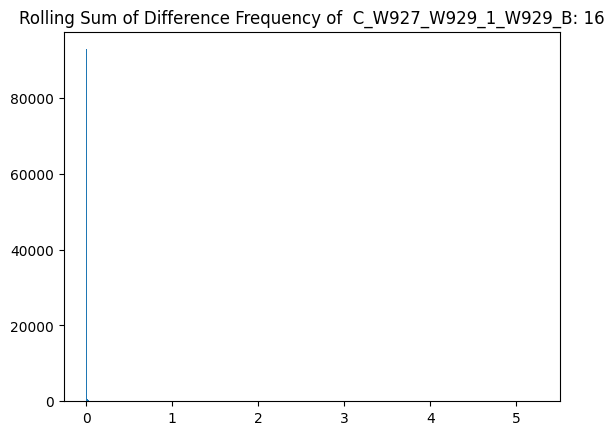

******************************************************************************


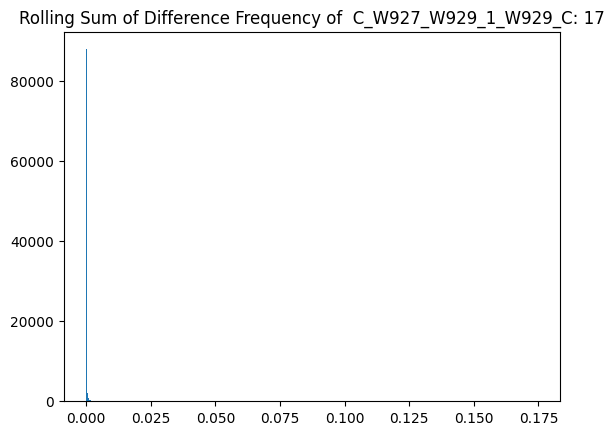

******************************************************************************


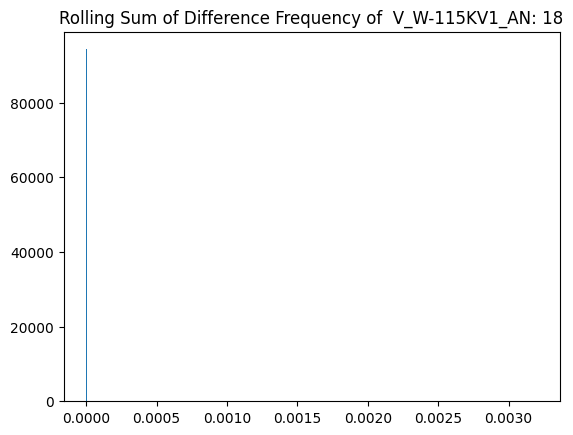

******************************************************************************


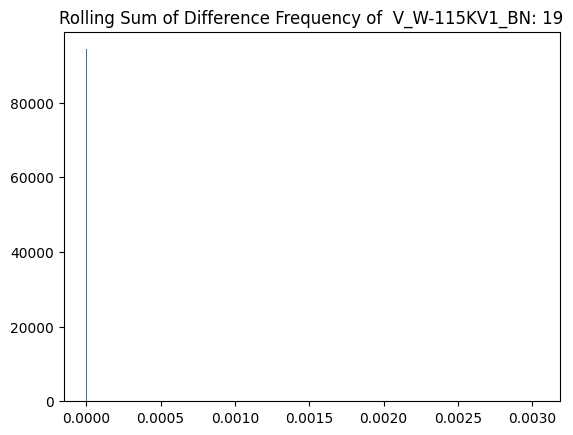

******************************************************************************


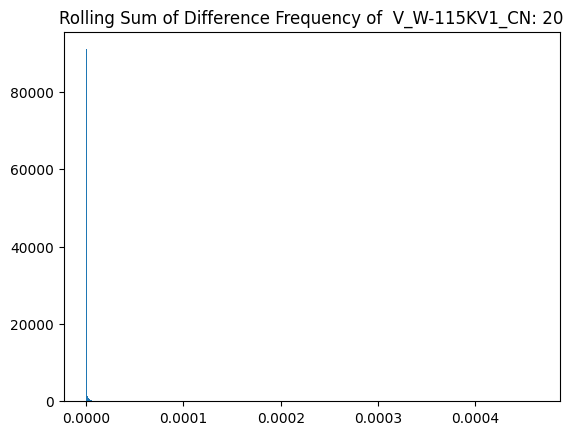

******************************************************************************


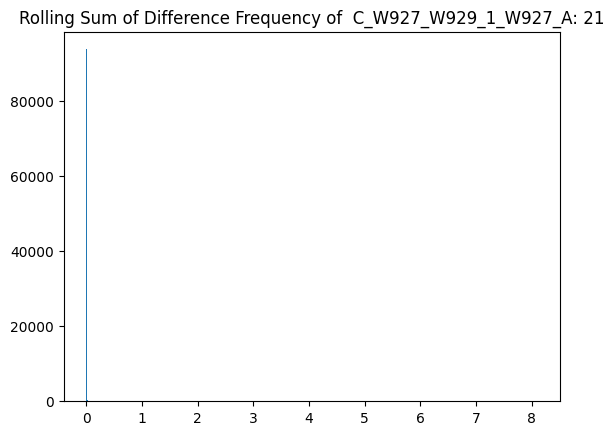

******************************************************************************


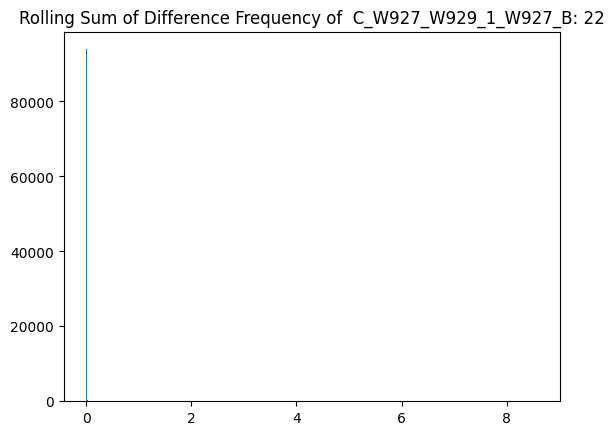

******************************************************************************


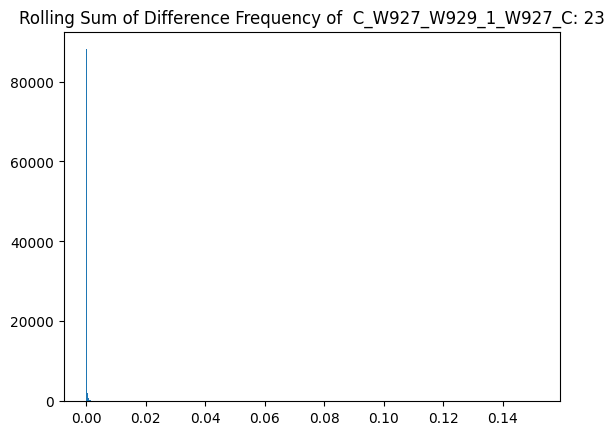

******************************************************************************


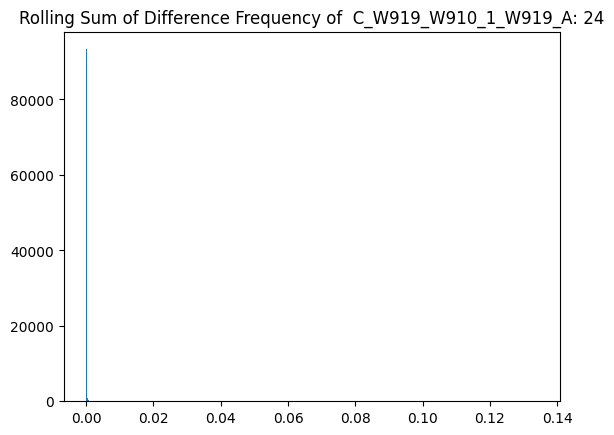

******************************************************************************


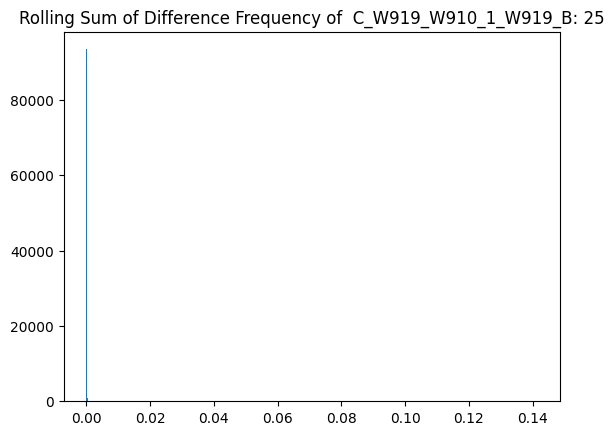

******************************************************************************


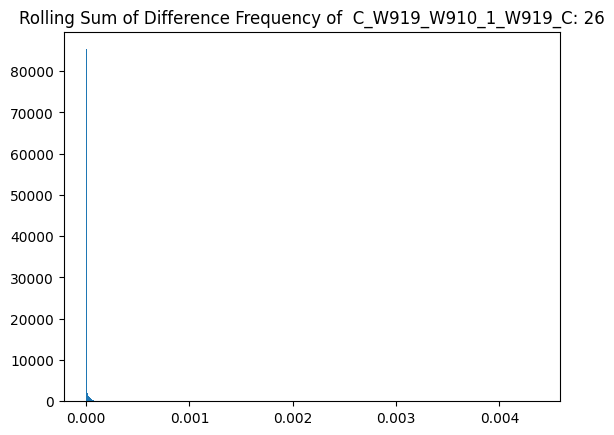

******************************************************************************


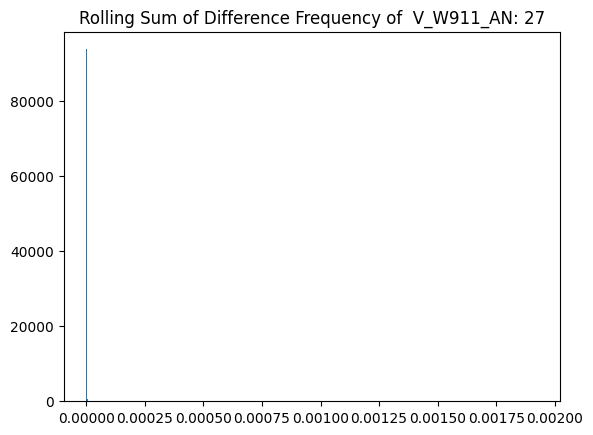

******************************************************************************


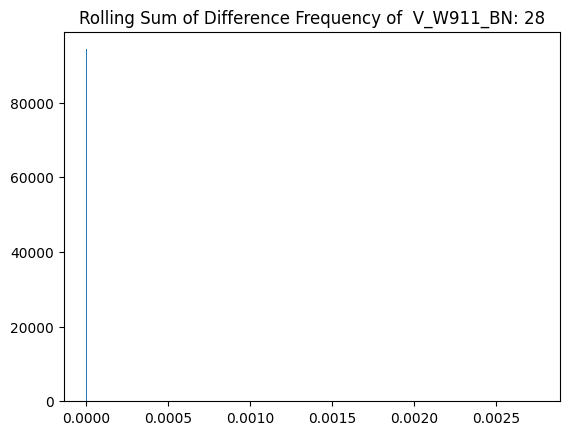

******************************************************************************


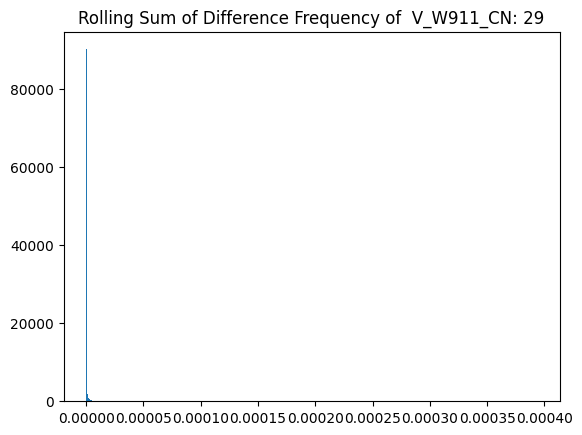

******************************************************************************


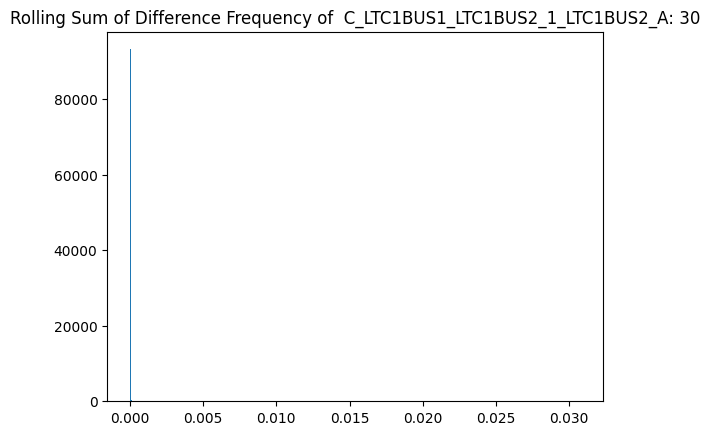

******************************************************************************


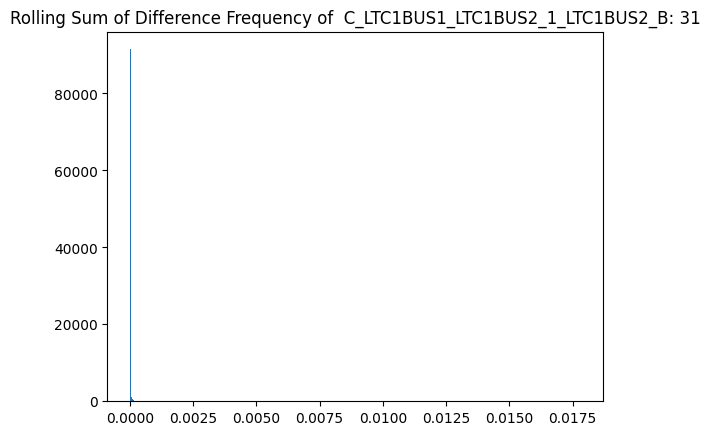

******************************************************************************


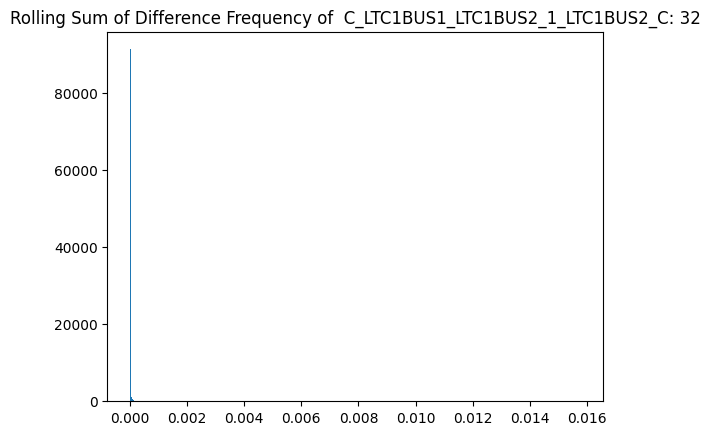

******************************************************************************


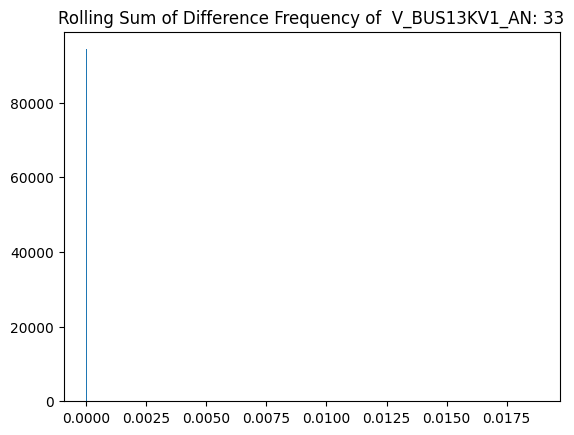

******************************************************************************


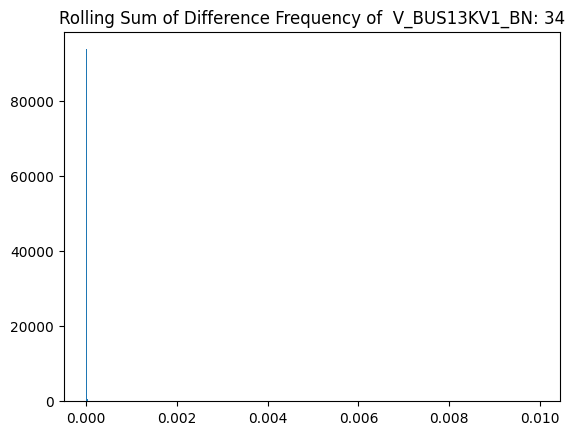

******************************************************************************


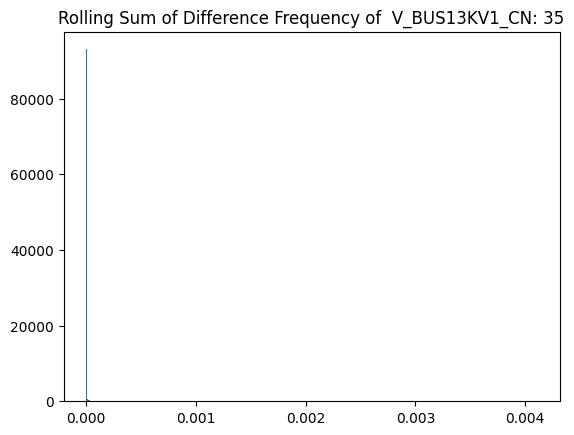

******************************************************************************


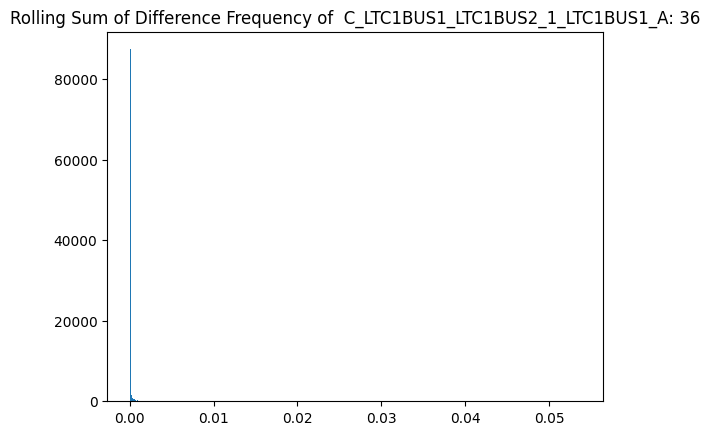

******************************************************************************


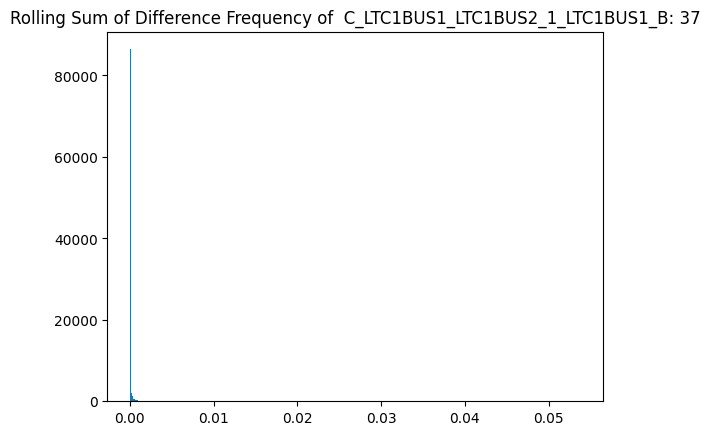

******************************************************************************


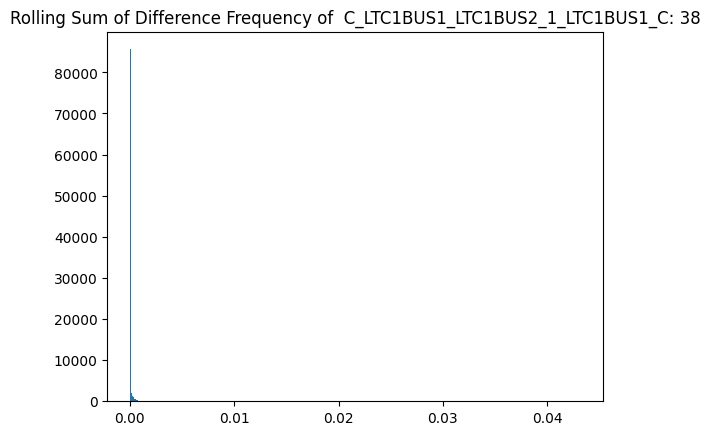

******************************************************************************


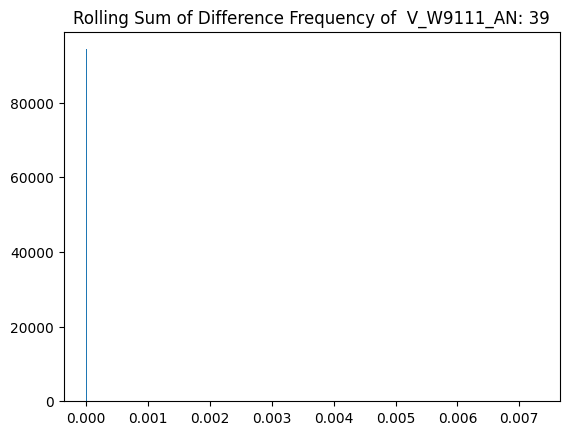

******************************************************************************


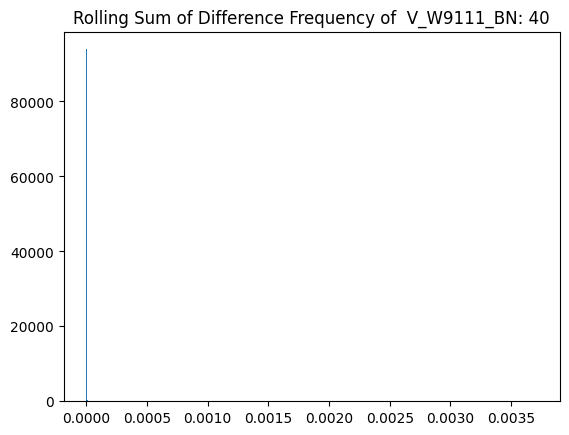

******************************************************************************


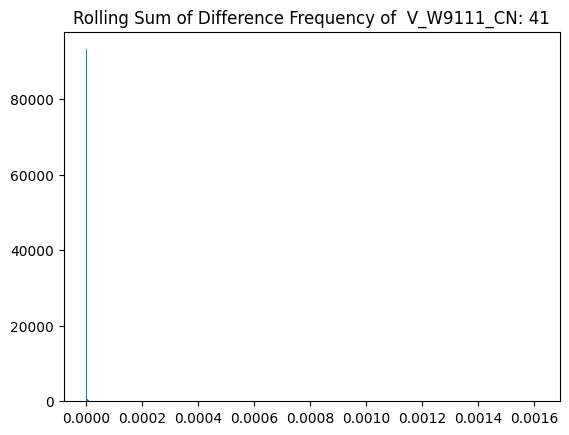

******************************************************************************


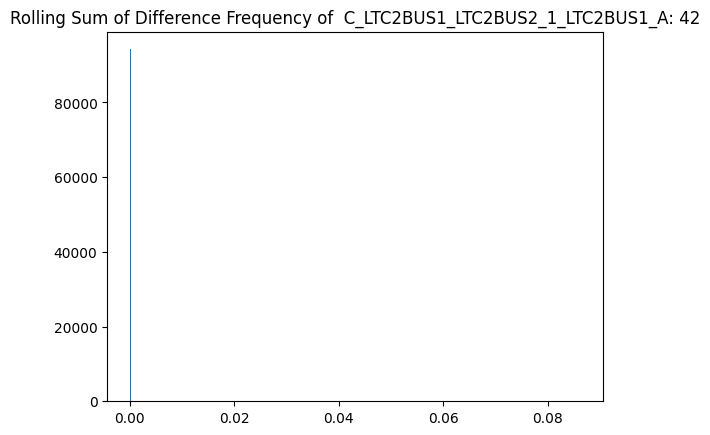

******************************************************************************


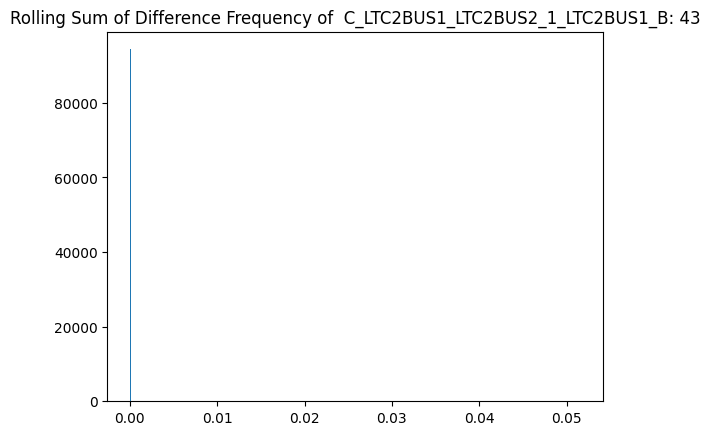

******************************************************************************


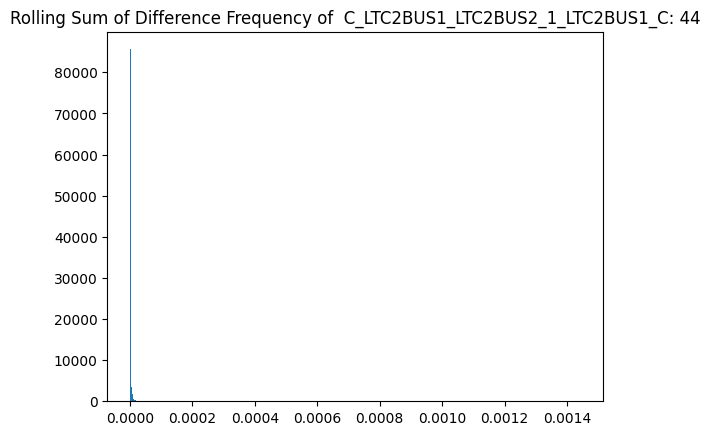

******************************************************************************


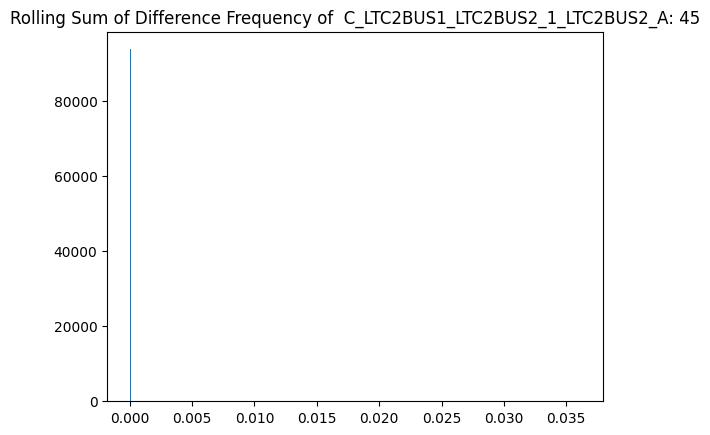

******************************************************************************


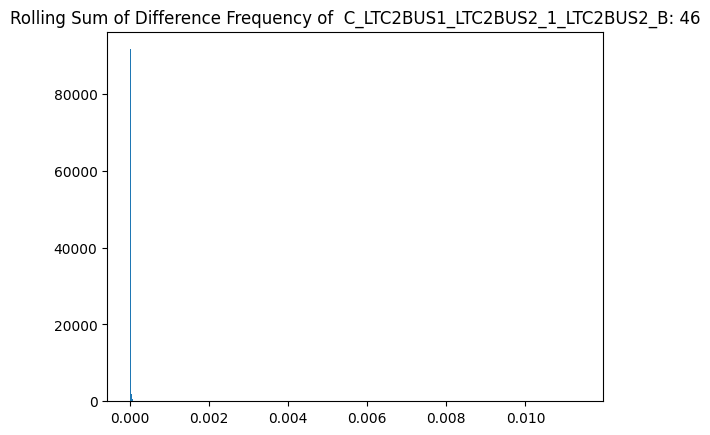

******************************************************************************


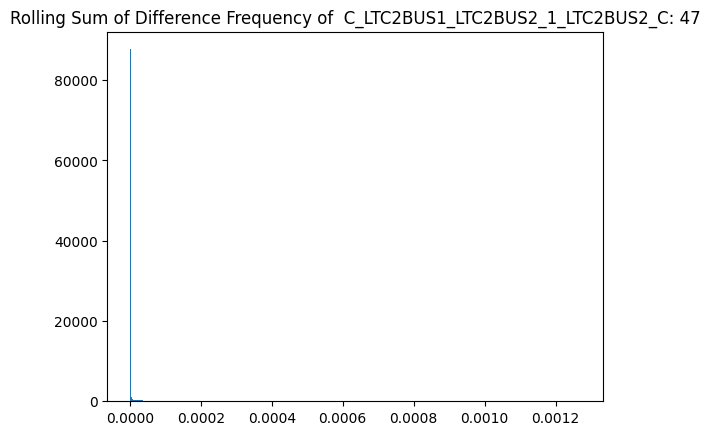

******************************************************************************


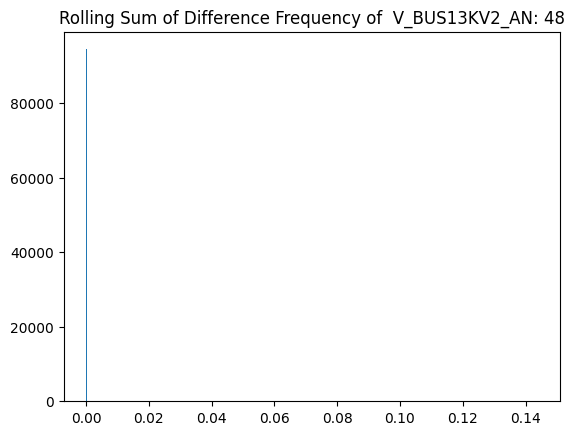

******************************************************************************


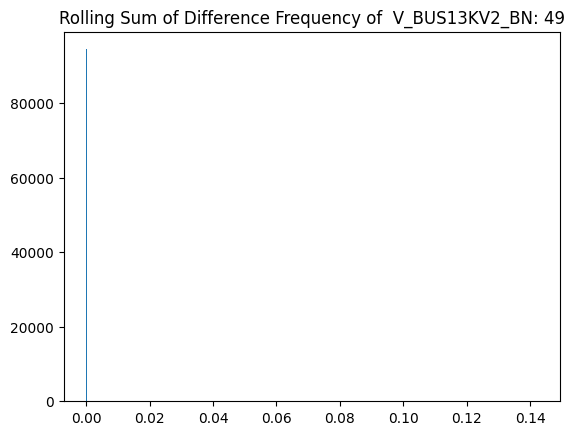

******************************************************************************


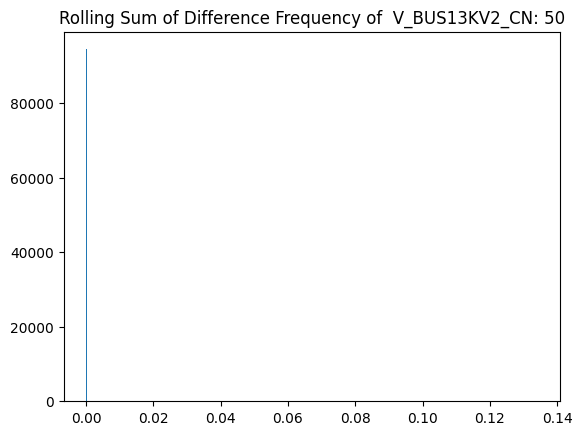

******************************************************************************


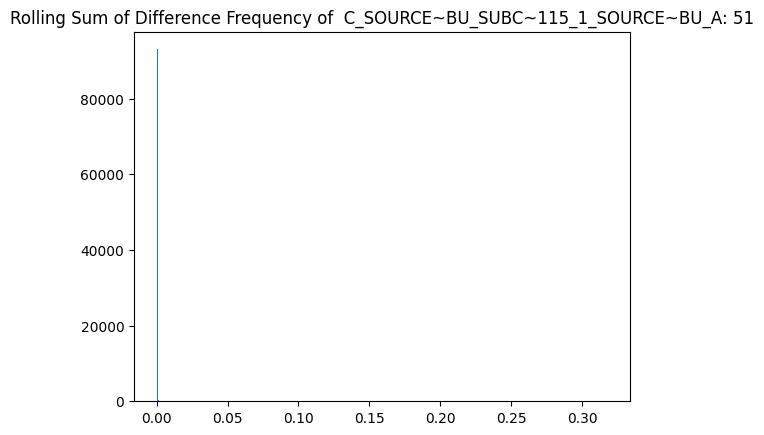

******************************************************************************


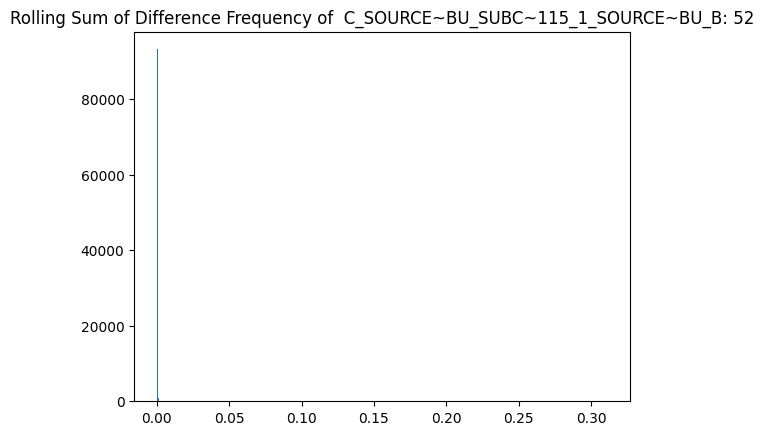

******************************************************************************


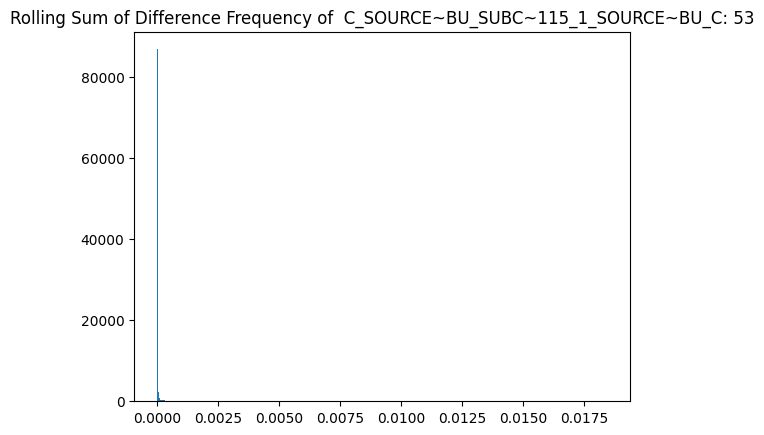

******************************************************************************


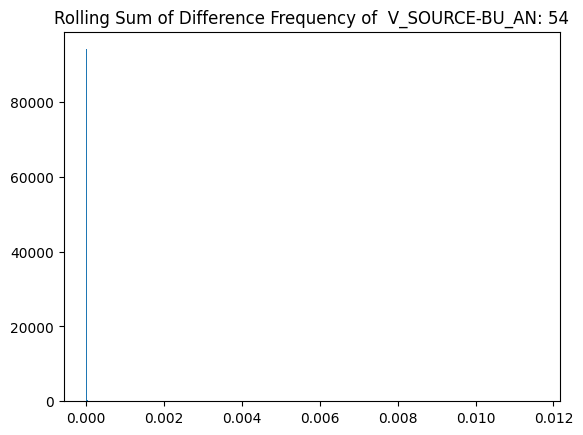

******************************************************************************


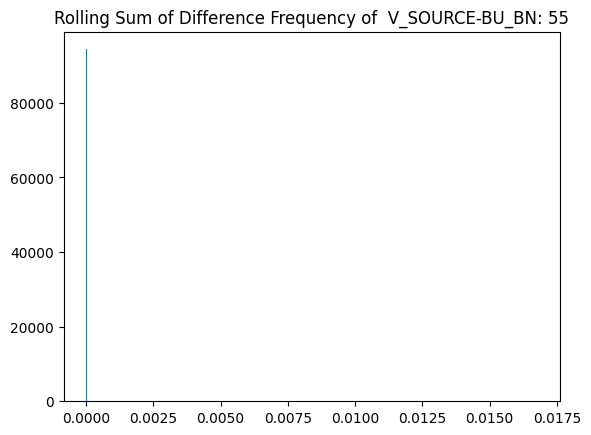

******************************************************************************


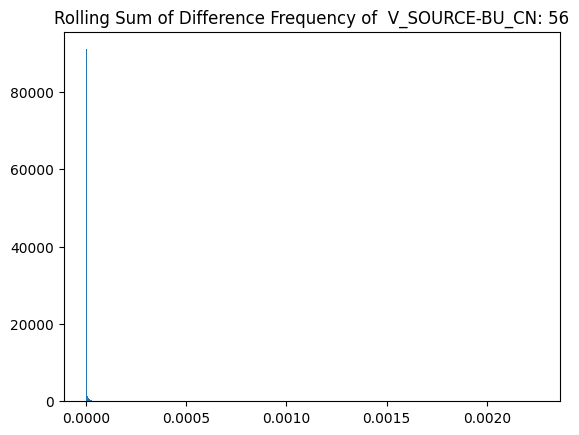

******************************************************************************


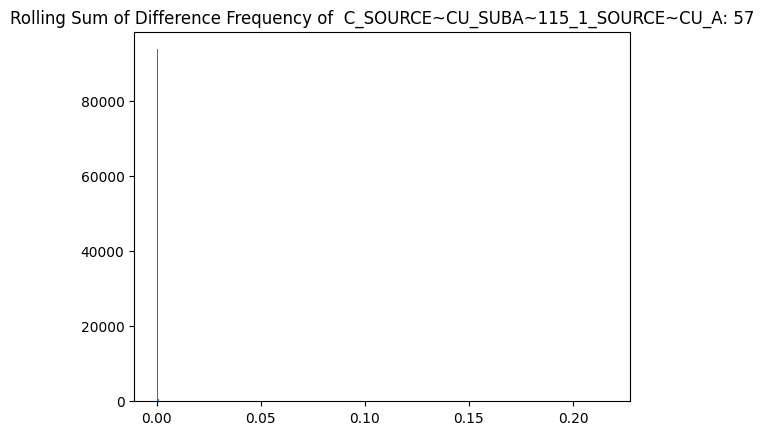

******************************************************************************


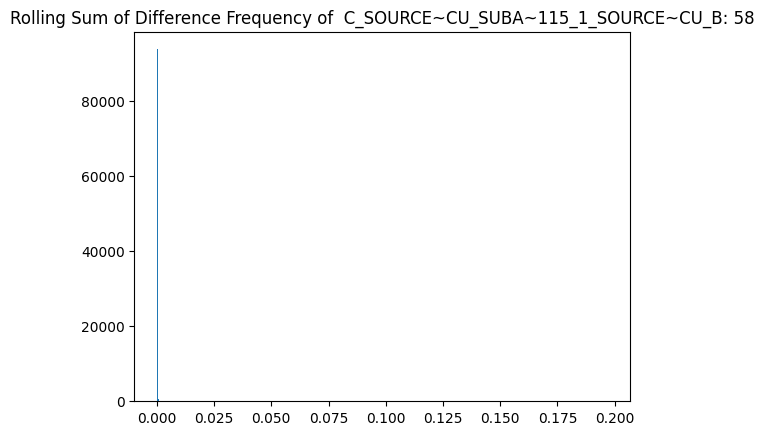

******************************************************************************


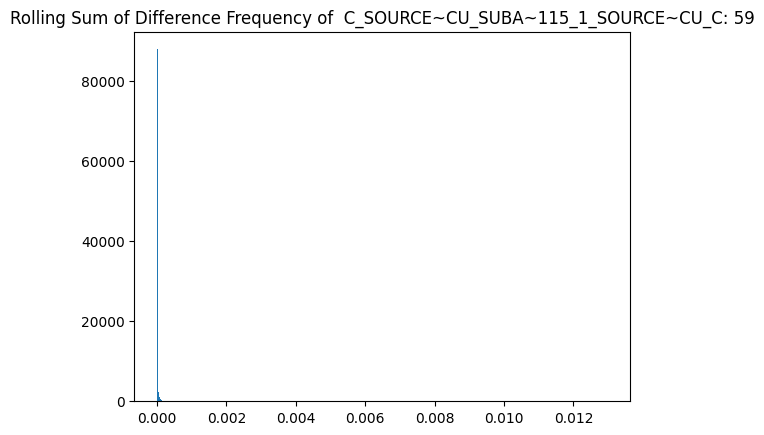

******************************************************************************


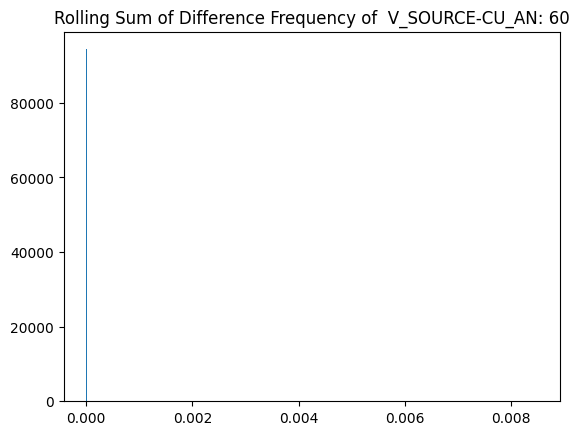

******************************************************************************


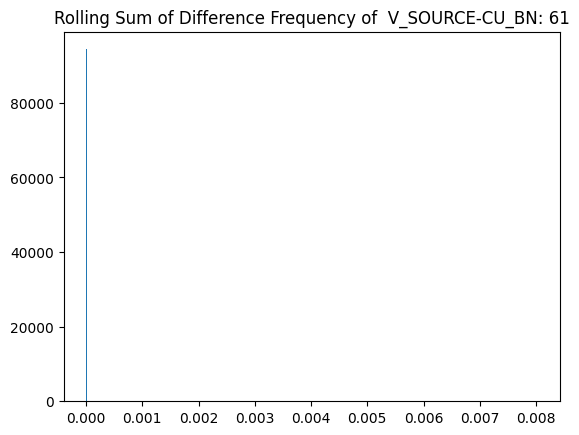

******************************************************************************


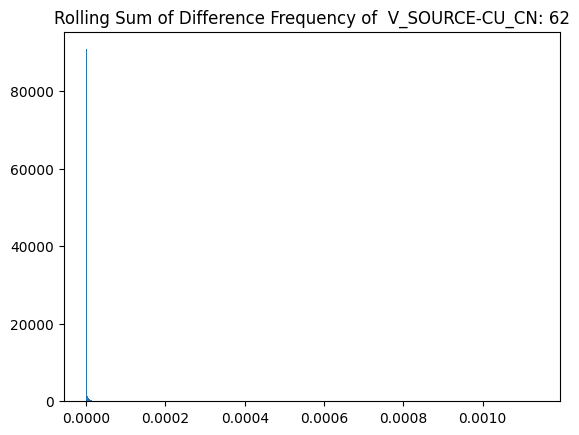

******************************************************************************


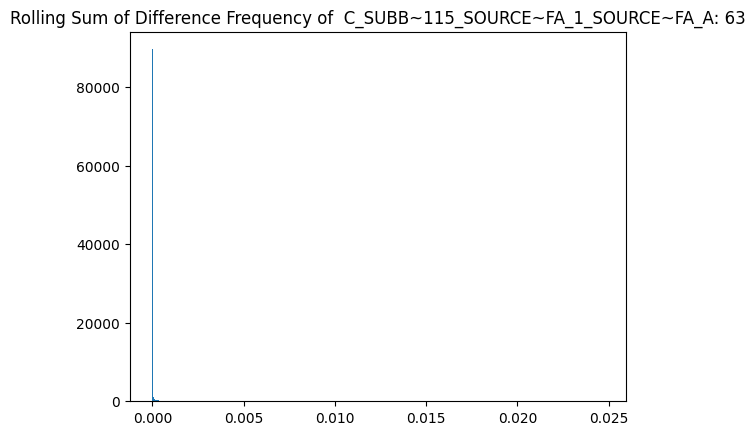

******************************************************************************


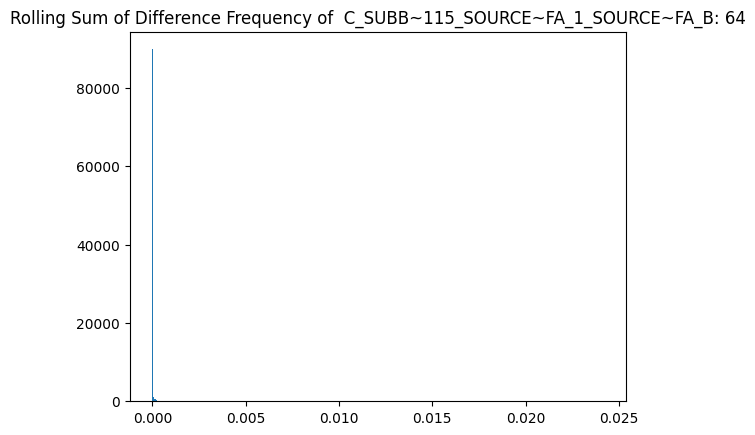

******************************************************************************


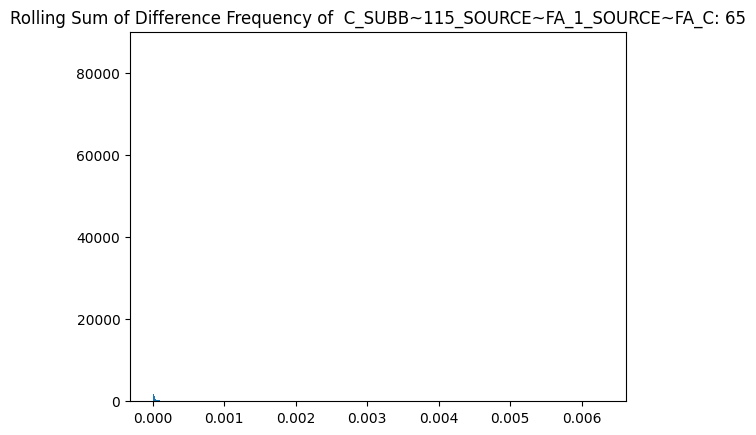

******************************************************************************


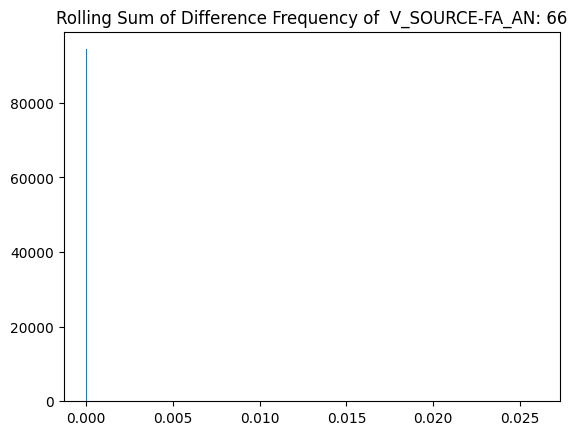

******************************************************************************


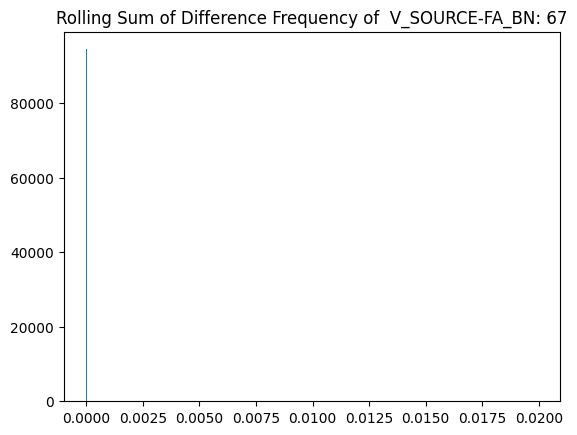

******************************************************************************


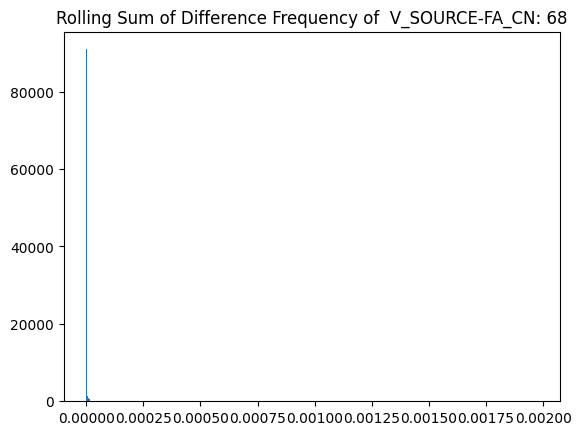

******************************************************************************


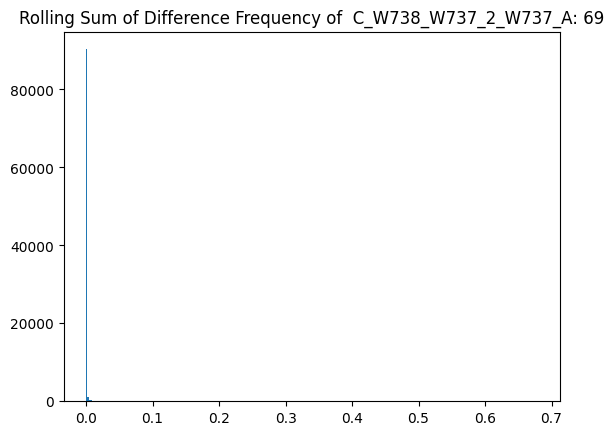

******************************************************************************


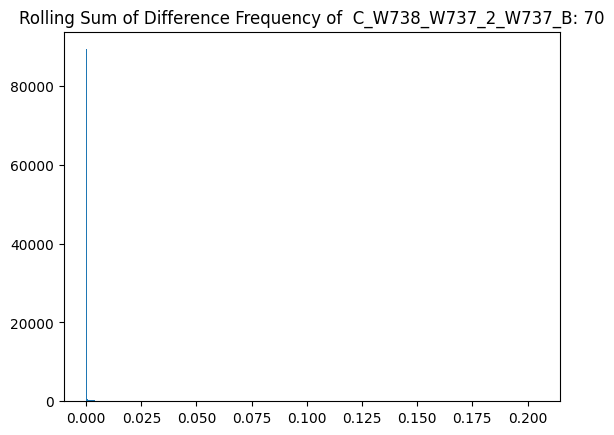

******************************************************************************


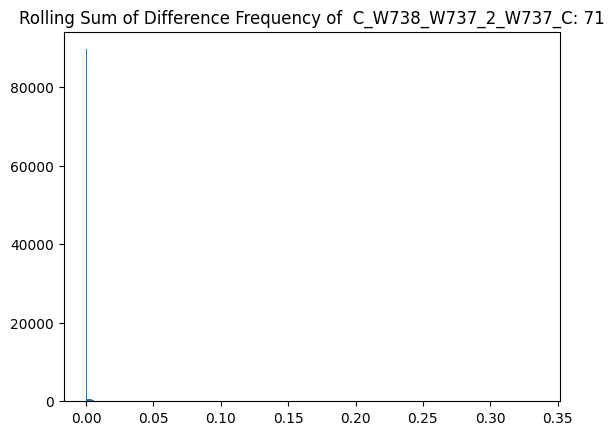

******************************************************************************


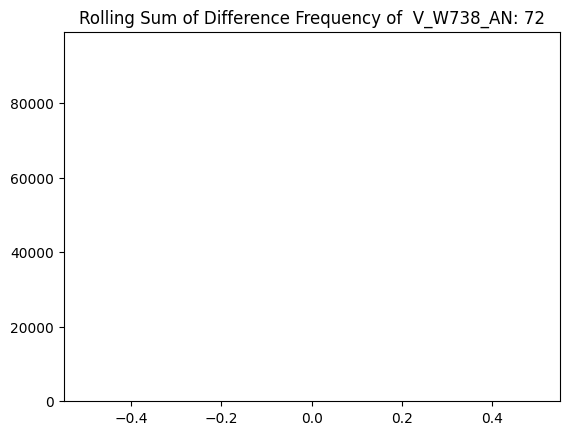

******************************************************************************


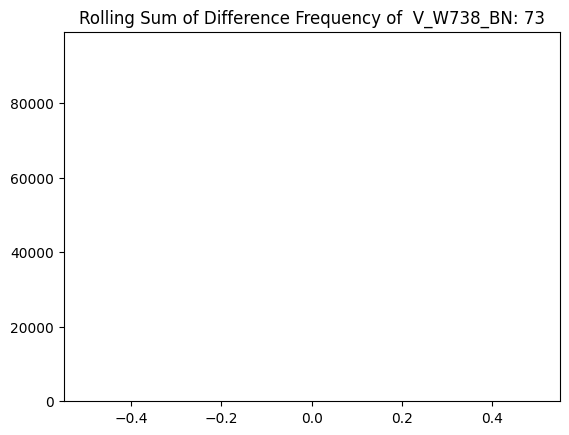

******************************************************************************


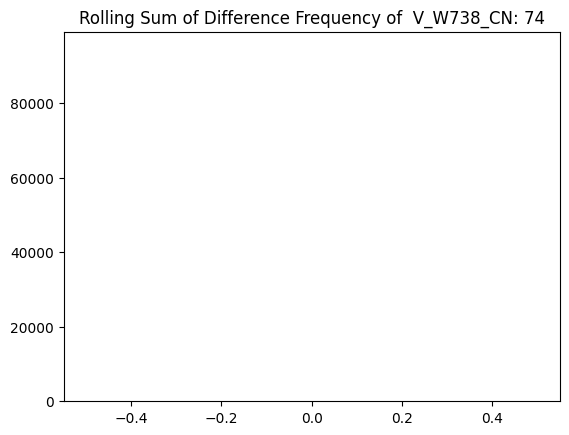

******************************************************************************


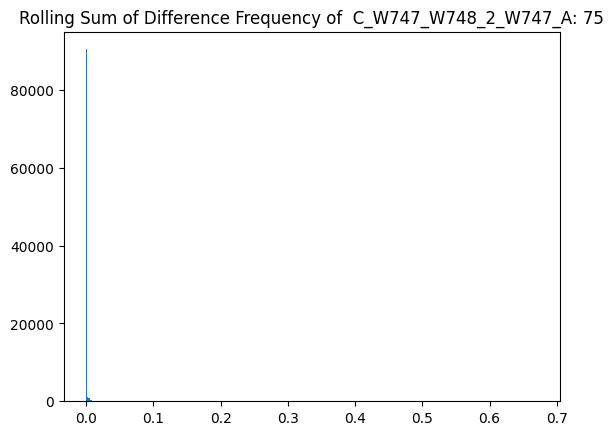

******************************************************************************


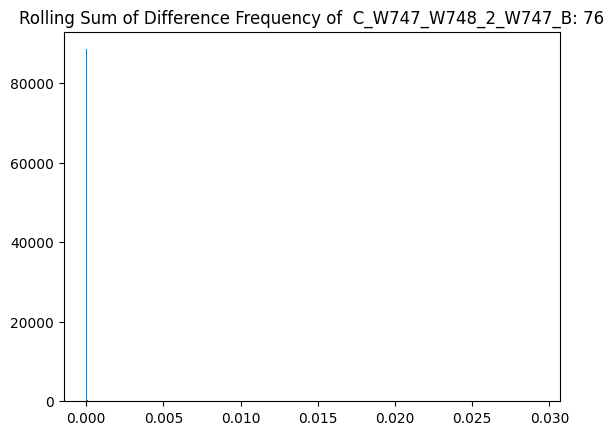

******************************************************************************


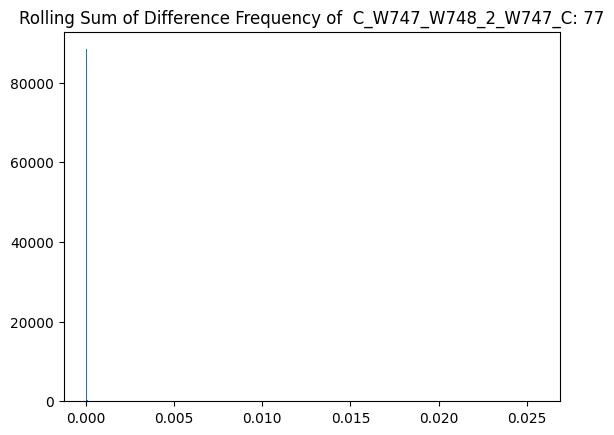

******************************************************************************


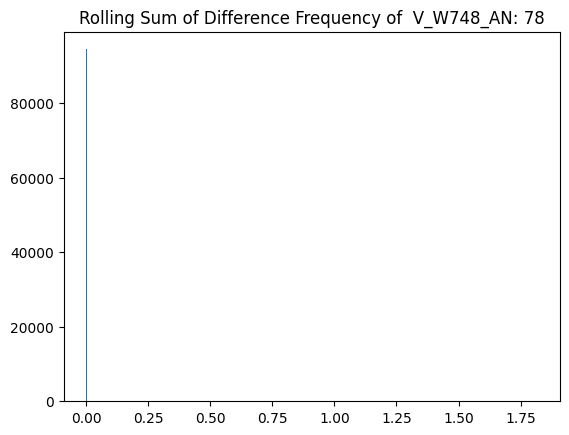

******************************************************************************


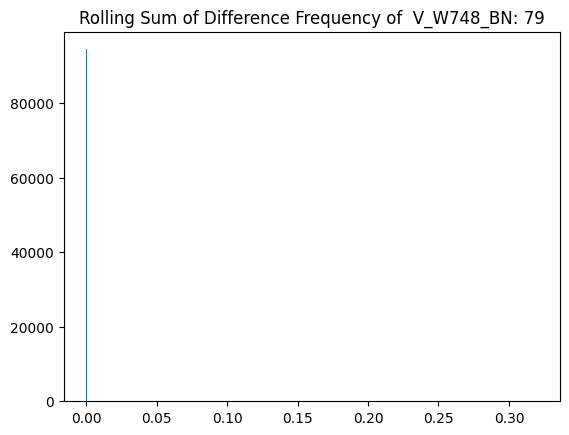

******************************************************************************


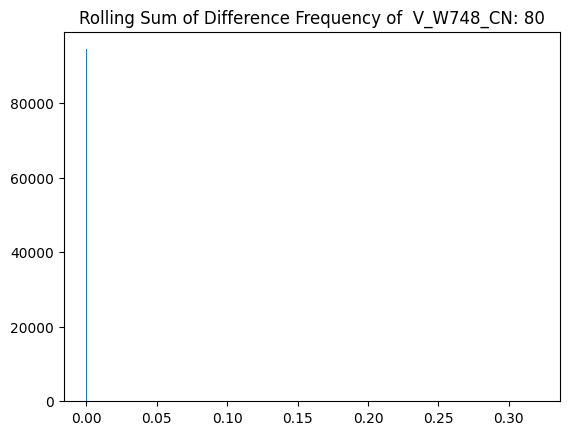

******************************************************************************


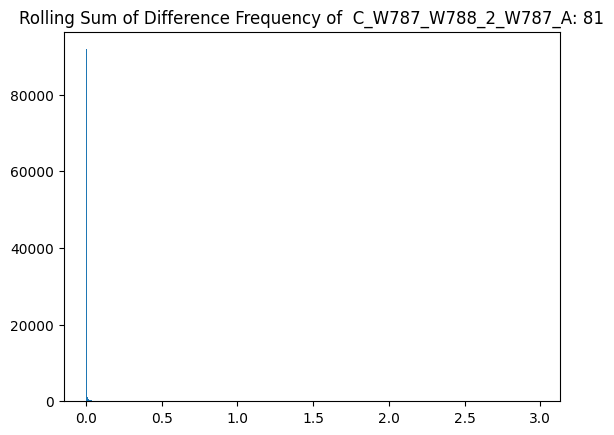

******************************************************************************


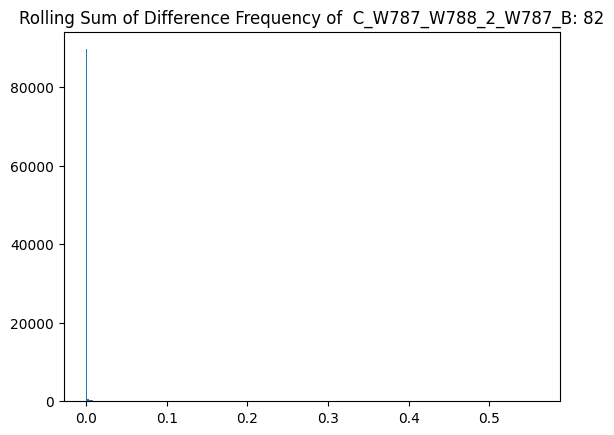

******************************************************************************


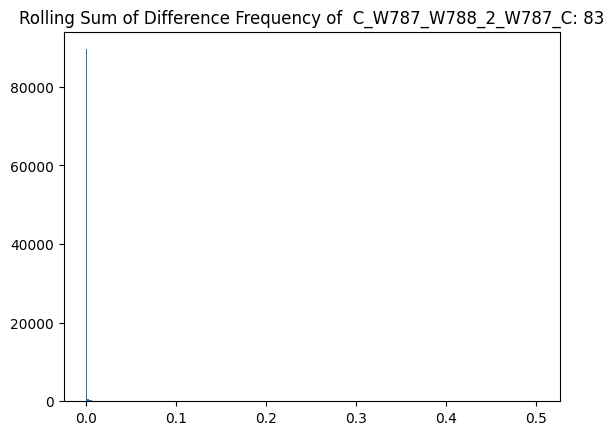

******************************************************************************


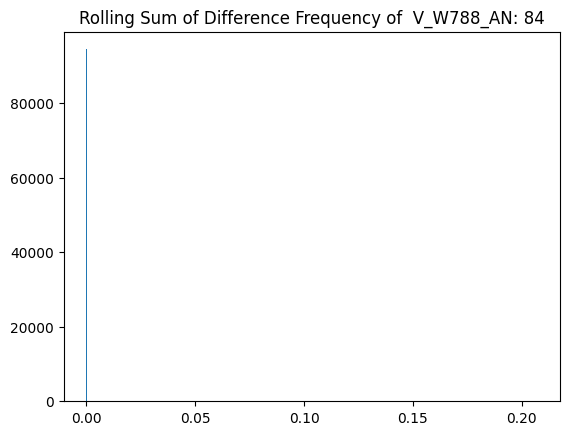

******************************************************************************


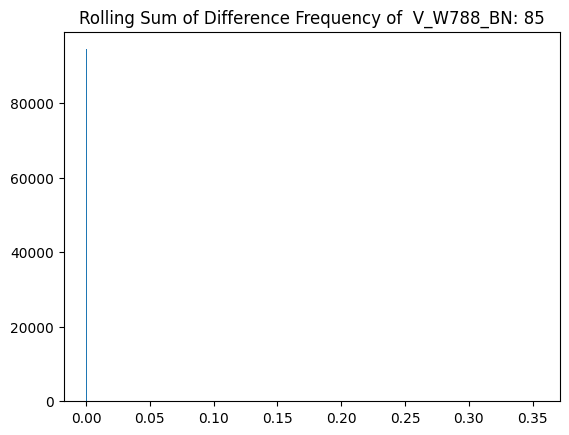

******************************************************************************


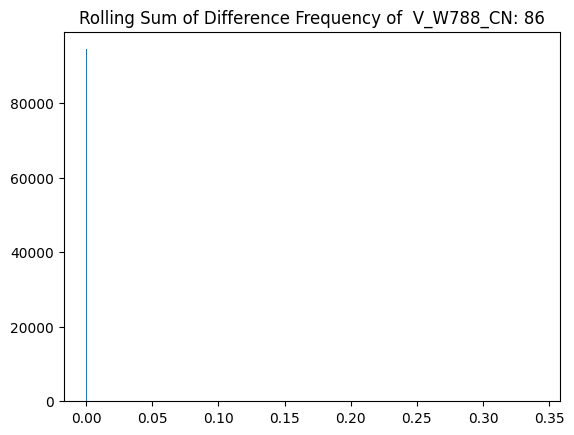

******************************************************************************


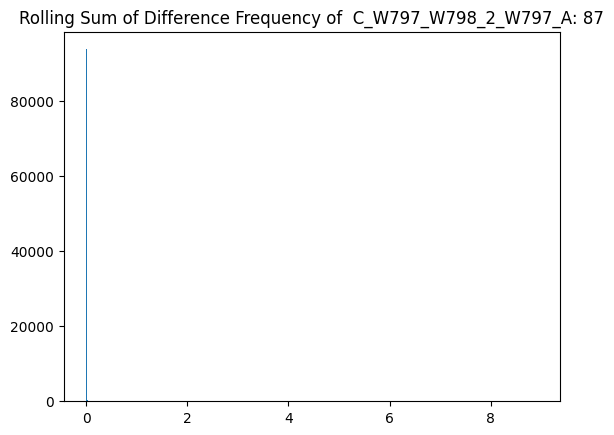

******************************************************************************


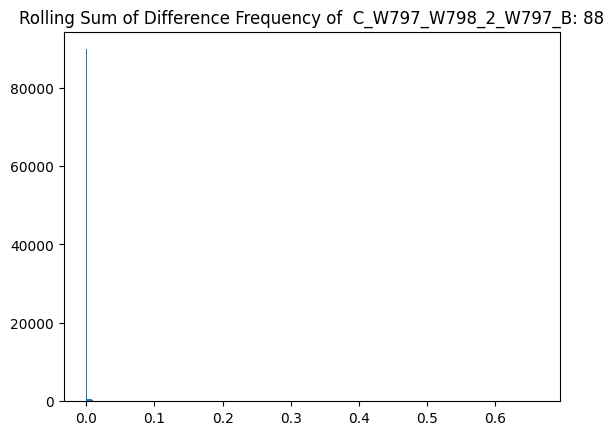

******************************************************************************


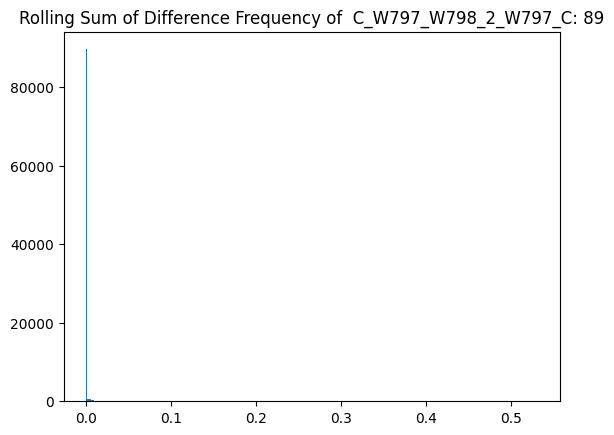

******************************************************************************


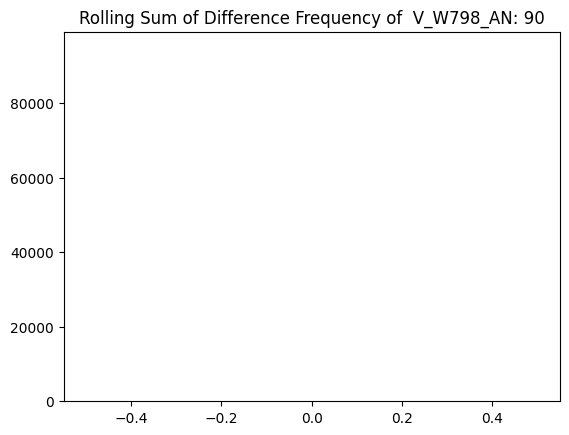

******************************************************************************


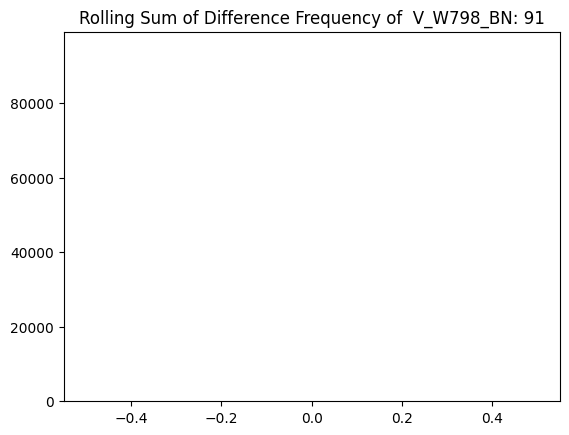

******************************************************************************


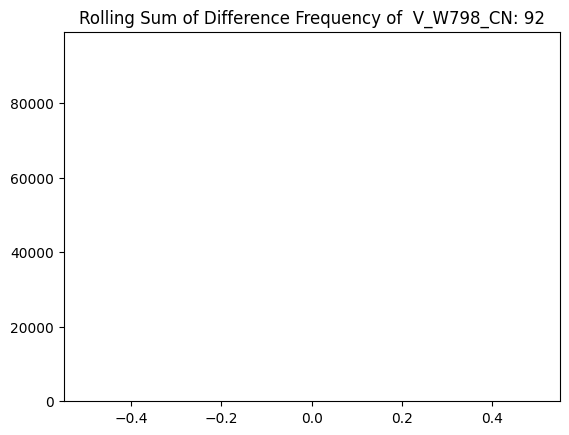

******************************************************************************


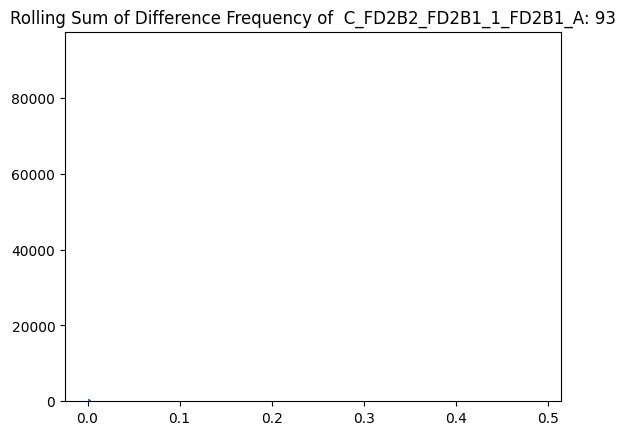

******************************************************************************


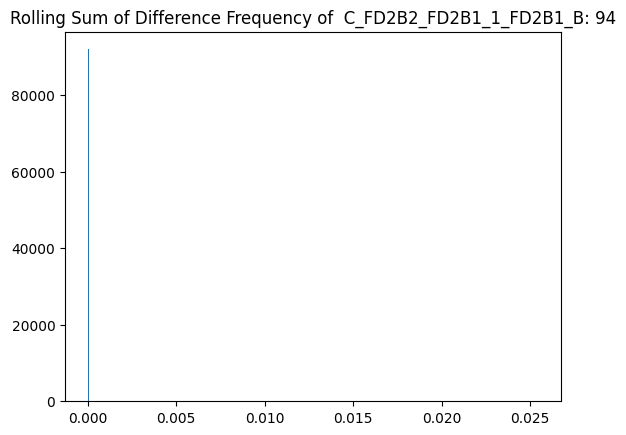

******************************************************************************


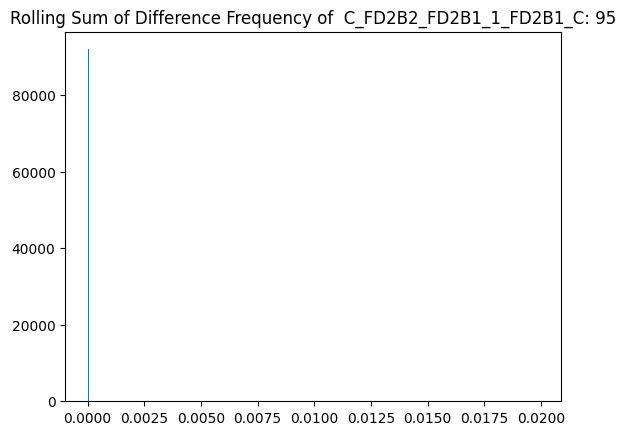

******************************************************************************


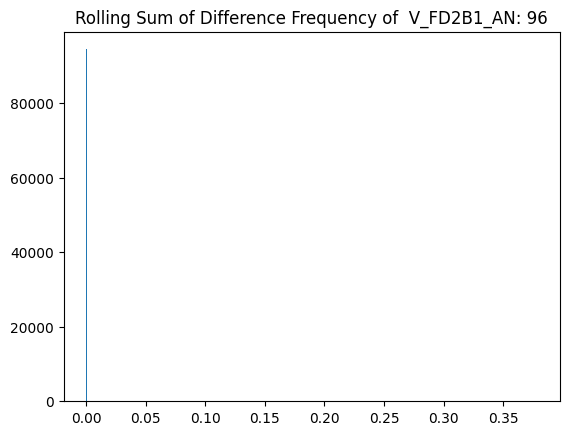

******************************************************************************


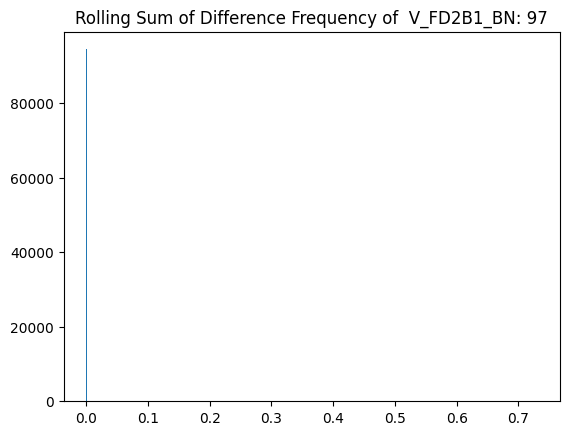

******************************************************************************


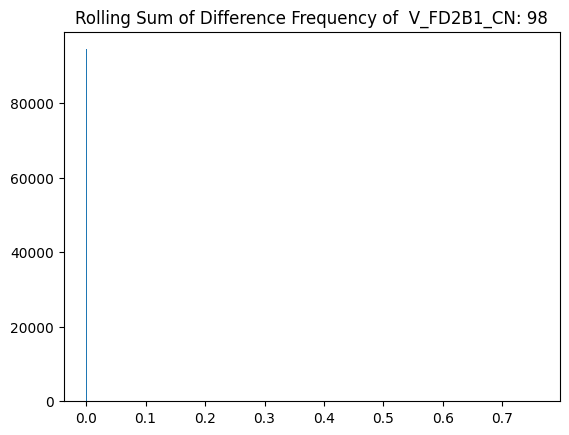

******************************************************************************


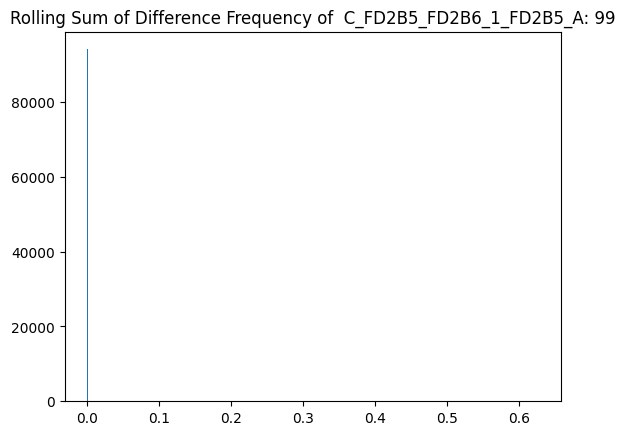

******************************************************************************


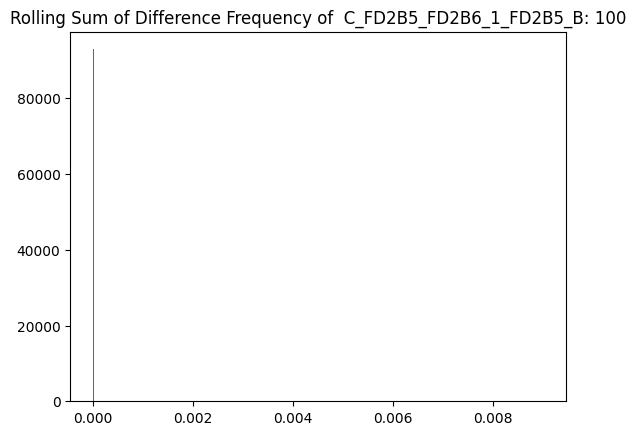

******************************************************************************


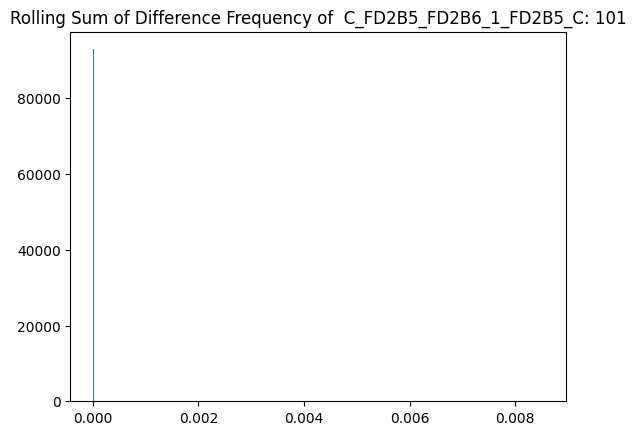

******************************************************************************


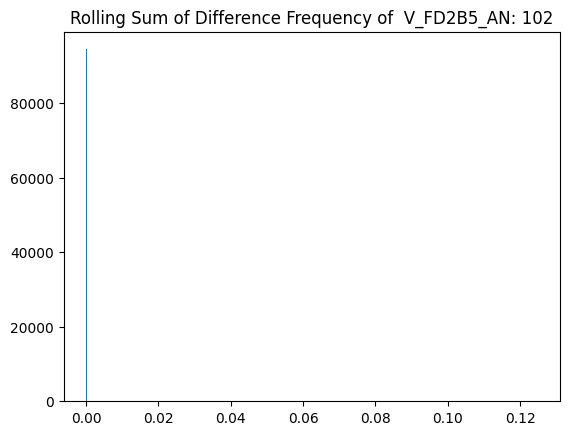

******************************************************************************


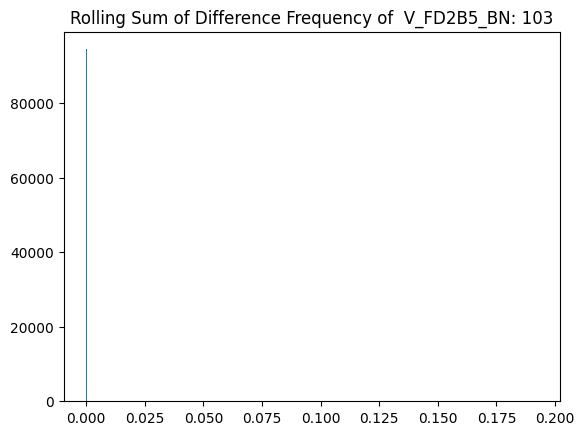

******************************************************************************


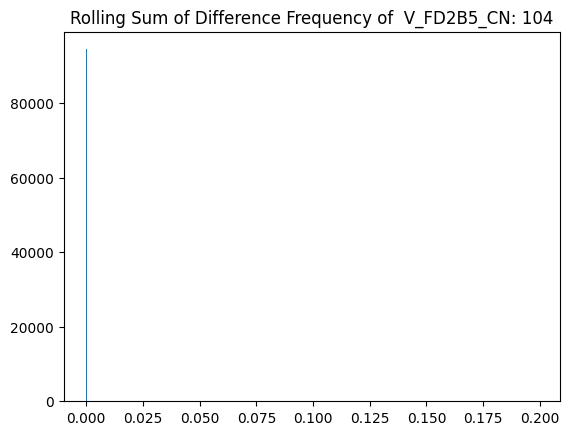

******************************************************************************


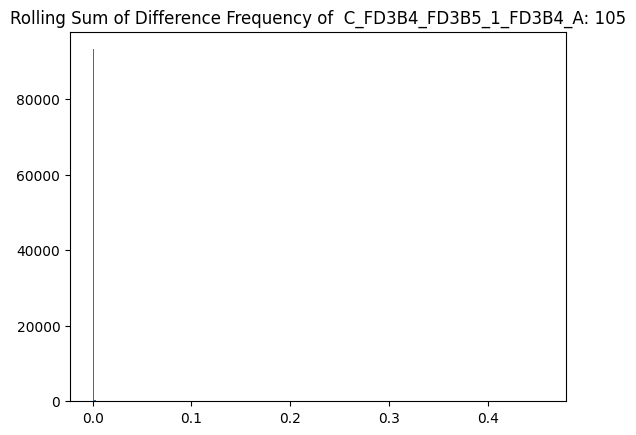

******************************************************************************


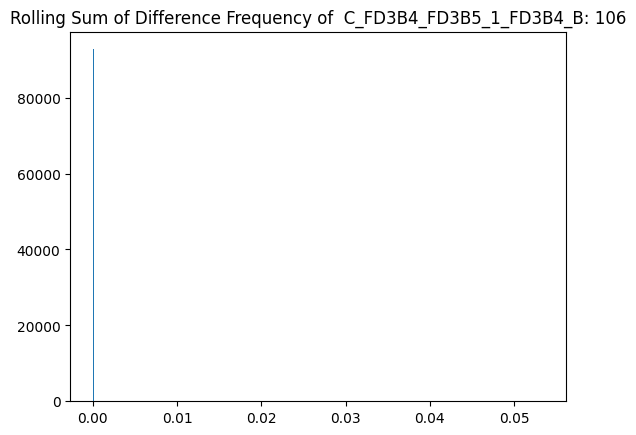

******************************************************************************


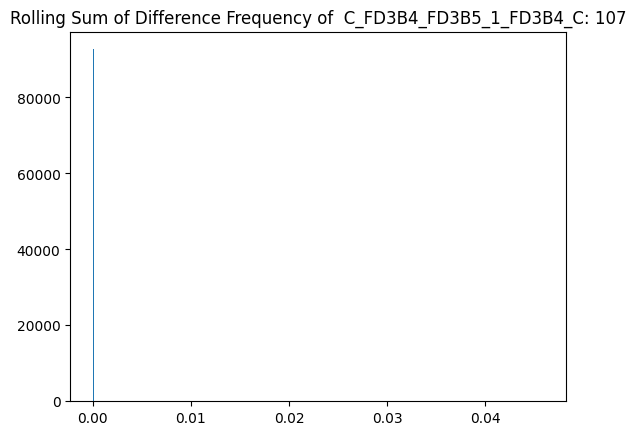

******************************************************************************


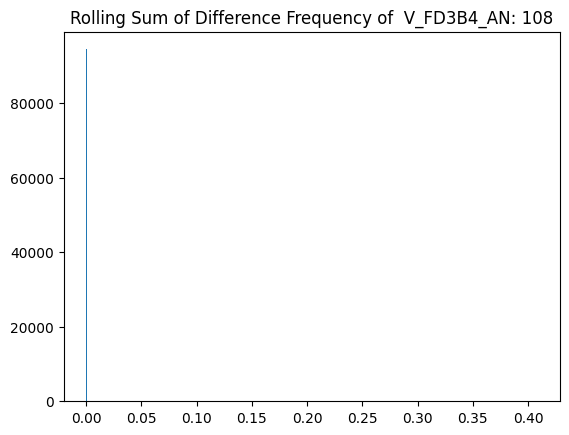

******************************************************************************


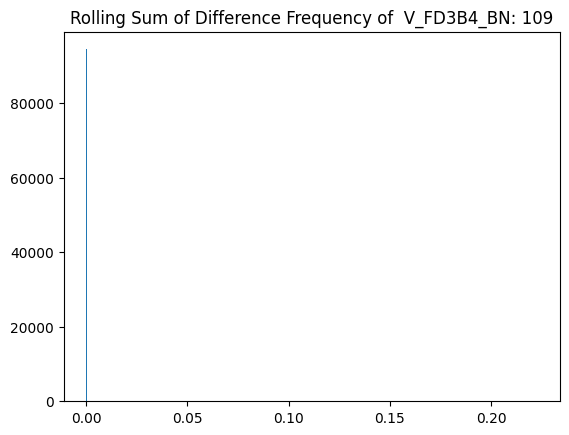

******************************************************************************


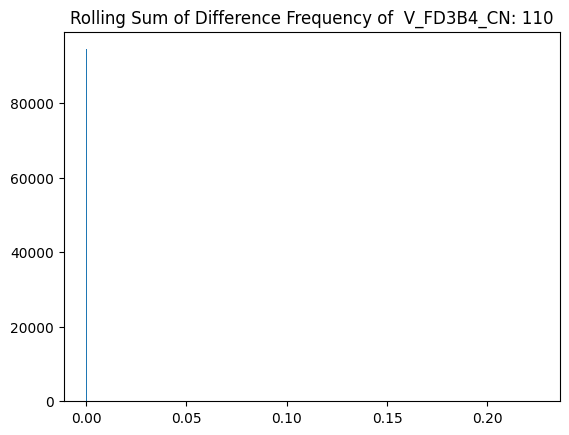

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [ ]:
window = 320
w = 1

var_fn = var_pair
thresholds_var, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_var_99, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=var_multi_list, collate_fn="sum")
thresholds_var_95, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=var_multi_list, collate_fn="sum")

### Testing Data

In [ ]:
data_dir = "/content/drive/MyDrive/"
test_path = "Event4_NORMALIZED.csv"
df_test = pd.read_csv(data_dir + test_path, skiprows=[0,1,2,4,5])

df_test

,Time,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,C_W919_W910_1_W910_N,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,...,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,C_FD3B4_FD3B5_1_FD3B4_N,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
0,0.0,-6.684060e-08,1.212030e-07,-0.000001,4.611740e-07,0.000016,0.000012,-0.000010,1.004940e-07,5.475740e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,208.0,1.283476e-02,-5.888832e-03,-0.007083,5.010930e-04,0.367226,-0.168209,-0.181638,6.462823e-02,-3.120257e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,417.0,-3.284655e-02,1.613125e-02,0.016073,2.174634e-03,1.610717,-0.690574,-0.868499,1.483780e-02,-4.026480e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,625.0,-6.217071e-02,2.716786e-02,0.034487,2.319873e-03,1.846532,-0.709703,-1.130589,-2.728976e-02,1.641890e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,833.0,-7.537570e-02,2.854412e-02,0.046703,6.067210e-04,1.058202,-0.275230,-0.880059,-8.482745e-02,4.140878e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.896013,-0.118346,-0.776272,0.017132,-0.005138,-0.011989,-2.899270e-07,0.893290,-0.116225,-0.776429
96008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.863105,-0.041938,-0.819528,0.016760,-0.003797,-0.012951,-1.127090e-06,0.860269,-0.040039,-0.819451
96009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.824823,0.034710,-0.857751,0.016285,-0.002433,-0.013834,-1.953130e-06,0.821927,0.036415,-0.857386
96010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.781481,0.111148,-0.890647,0.015708,-0.001054,-0.014632,-2.764360e-06,0.778510,0.112631,-0.890045


In [ ]:
data_test = preprocess(df_test, time=0.25e6, remove_neutral=True)
cols = data_test.columns

data_test

,C_W919_W910_1_W910_A,C_W919_W910_1_W910_B,C_W919_W910_1_W910_C,V_W-115KV2_AN,V_W-115KV2_BN,V_W-115KV2_CN,C_W957_W950_1_W950_A,C_W957_W950_1_W950_B,C_W957_W950_1_W950_C,V_W951_AN,...,C_FD2B5_FD2B6_1_FD2B5_C,V_FD2B5_AN,V_FD2B5_BN,V_FD2B5_CN,C_FD3B4_FD3B5_1_FD3B4_A,C_FD3B4_FD3B5_1_FD3B4_B,C_FD3B4_FD3B5_1_FD3B4_C,V_FD3B4_AN,V_FD3B4_BN,V_FD3B4_CN
1201,-0.059371,0.036746,0.022632,0.997140,-0.444226,-0.553440,-0.029014,0.021424,0.007618,0.997140,...,-0.005735,0.975578,-0.505000,-0.470852,0.017310,-0.011608,-0.005733,0.973639,-0.502187,-0.472170
1202,-0.059862,0.032921,0.026949,0.989016,-0.372610,-0.616909,-0.029580,0.019730,0.009893,0.989016,...,-0.006697,0.973833,-0.437787,-0.536014,0.017516,-0.010528,-0.007013,0.971737,-0.435081,-0.537114
1203,-0.059982,0.028893,0.031104,0.974799,-0.298699,-0.676602,-0.029965,0.017912,0.012107,0.974799,...,-0.007616,0.966086,-0.367878,-0.597882,0.017614,-0.009382,-0.008250,0.963808,-0.365266,-0.598767
1204,-0.059735,0.024681,0.035071,0.954578,-0.222960,-0.732087,-0.030166,0.015984,0.014247,0.954578,...,-0.008490,0.952371,-0.295723,-0.656050,0.017604,-0.008178,-0.009437,0.949957,-0.293248,-0.656716
1205,-0.059121,0.020316,0.038827,0.928484,-0.145825,-0.783101,-0.030179,0.013956,0.016300,0.928484,...,-0.009311,0.932794,-0.221711,-0.710185,0.017484,-0.006924,-0.010565,0.930223,-0.219384,-0.710624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,-0.060255,0.045428,0.014827,0.996919,-0.553635,-0.443861,-0.029212,0.025251,0.003972,0.996919,...,-0.004061,0.964725,-0.607167,-0.358068,0.016736,-0.013205,-0.003567,0.963138,-0.604275,-0.359676
96001,-0.061401,0.041858,0.019549,0.998729,-0.486700,-0.512597,-0.030099,0.023691,0.006431,0.998729,...,-0.005073,0.972786,-0.545286,-0.427670,0.017114,-0.012245,-0.004900,0.970962,-0.542468,-0.429073
96002,-0.062171,0.038018,0.024160,0.994402,-0.416758,-0.578152,-0.030800,0.021983,0.008852,0.994402,...,-0.006055,0.974810,-0.480080,-0.494608,0.017386,-0.011209,-0.006202,0.972829,-0.477328,-0.495851
96003,-0.062561,0.033946,0.028627,0.983894,-0.344242,-0.640163,-0.031310,0.020138,0.011221,0.983894,...,-0.007002,0.970867,-0.411938,-0.558511,0.017552,-0.010104,-0.007465,0.968706,-0.409269,-0.559561


In [ ]:
print(all_attack_times)

all_attack_indices = set()

for start, end in all_attack_times:
    attack_indices = df_test.index[(df_test['Time'] >= start * 1e6) & (df_test['Time'] <= end * 1e6)] - 1201
    all_attack_indices.add((attack_indices[0], attack_indices[-1]))

all_attack_indice = sorted(list(all_attack_indices))

attacks_in = {}
co = 0
for key, value in attacks.items():
    attacks_in[sorted(all_attack_indice)[co][0]] = value
    co+=1

all_attack_indices

{(6.2, 7.1), (3.8, 4.5), (14.6, 15.8), (2.2, 3.5), (4.5, 5.9), (8.5, 9.4), (16.5, 17.5), (11.7, 12.7), (10.5, 11.5)}


{(9360, 15599),
 (17040, 20399),
 (20400, 27119),
 (28560, 32879),
 (39600, 43919),
 (49200, 53999),
 (54960, 59759),
 (68880, 74639),
 (78000, 82799)}

In [ ]:
# cov_list = []

# for var1_index, var2_indices in adj_list.items():

#     var1_index -= 1
#     var2_indices = np.array(var2_indices) - 1

#     cov_list.append(
#         stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=covariance_pair, fn="sum")
#     )

# rsum_list_cov = np.array(cov_list)

In [ ]:
import time

window = 80

In [ ]:
corr_list = dict()
var_list = dict()

start_time = time.time()

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    for i, var2_index in enumerate(var2_indices):
        c = correlation_pair(data_test, var1_index, var2_index, window, diff=0, pct_change=False)
        v = var_pair(data_test, var1_index, var2_index, window, diff=0, pct_change=False)
        if i == 0:
            corr_list[var1_index+1] = [c]
            var_list[var1_index+1] = [v]
        else:
            corr_list[var1_index+1].append(c)
            var_list[var1_index+1].append(v)

end_time = time.time()


rsum_list_corr = np.array(corr_list)
rsum_list_var = np.array(var_list)

time_taken_total = end_time - start_time
avg_time = time_taken_total / (len(data_test) - window - w + 1)
print(time_taken_total, avg_time)
# in seconds


6.482188940048218 6.843238186782883e-05


In [ ]:
corr_list

{1: [1280    -1.0
  1281    -1.0
  1282    -1.0
  1283    -1.0
  1284    -1.0
          ... 
  96000   -1.0
  96001   -1.0
  96002   -1.0
  96003   -1.0
  96004   -1.0
  Length: 94725, dtype: float64],
 2: [1280    -1.0
  1281    -1.0
  1282    -1.0
  1283    -1.0
  1284    -1.0
          ... 
  96000   -1.0
  96001   -1.0
  96002   -1.0
  96003   -1.0
  96004   -1.0
  Length: 94725, dtype: float64],
 3: [1280    -1.0
  1281    -1.0
  1282    -1.0
  1283    -1.0
  1284    -1.0
          ... 
  96000   -1.0
  96001   -1.0
  96002   -1.0
  96003   -1.0
  96004   -1.0
  Length: 94725, dtype: float64],
 4: [1280     1.0
  1281     1.0
  1282     1.0
  1283     1.0
  1284     1.0
          ... 
  96000    1.0
  96001    1.0
  96002    1.0
  96003    1.0
  96004    1.0
  Length: 94725, dtype: float64,
  1280     1.0
  1281     1.0
  1282     1.0
  1283     1.0
  1284     1.0
          ... 
  96000    1.0
  96001    1.0
  96002    1.0
  96003    1.0
  96004    1.0
  Length: 94725, dtype: floa

In [ ]:
total_normal = rsum_list_var.shape[1] + 1
for start, end in all_attack_indices:
    total_normal -= (end - start + 1 + 2 * (window + w - 1))
print(total_normal)

48165


In [ ]:
thresholds_corr = np.array(thresholds_corr)
thresholds_corr_99 = np.array(thresholds_corr_99)
thresholds_corr_95 = np.array(thresholds_corr_95)

thresholds_var = np.array(thresholds_var)
thresholds_var_99 = np.array(thresholds_var_99)
thresholds_var_95 = np.array(thresholds_var_95)


# Correlation

In [ ]:
quantiles = [1., 0.99, 0.95]

rsum_list = rsum_list_corr

print("Correlation")

for i, threshold in enumerate([thresholds_corr, thresholds_corr_99, thresholds_corr_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Correlation
Threshold: 1.0
Persistency: 1
DD: [None, 0, 0, 6, 0, None, None, 7, 76]
LD: [[nan, nan, nan], [0], [nan, nan, nan], [6], [0, 0, 0, nan, nan, 0], [nan, nan, nan], [nan, nan, nan], [7], [nan, nan, 76, nan, nan, nan]]
FPR 0.00020761964081802137
FPR Localisation (Detection): 2.057491936034446e-06 +- 1.3921958632013564e-05
####################################################
FPR Localisation: 0.002719536546856134 +- 0.015912891073798535
FPR Localisation: [0.07641752577319588, 0.07575171821305841, 0.13152920962199313, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0013960481099656358, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0036082474226804126, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0028350515463917525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0029424398625429553, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0016108247422680412, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

# Variance

In [ ]:
quantiles = [1., 0.99, 0.95]
rsum_list = rsum_list_var

print("Variance")


for i, threshold in enumerate([thresholds_var, thresholds_var_99, thresholds_var_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Variance
Threshold: 1.0
Persistency: 1
DD: [0, 0, 0, 0, 0, 0, 0, 0, 0]
LD: [[nan, nan, nan], [0], [nan, 20, 1], [6], [0, 0, 0, 5, 0, 0], [nan, nan, 0], [nan, nan, nan], [7], [5, 0, 0, nan, nan, nan]]
FPR 0.9828506176684314
FPR Localisation (Detection): 0.020651794740863563 +- 0.11362019412099864
####################################################
FPR Localisation: 0.02302773133958701 +- 0.1143681431668818
FPR Localisation: [0.07641752577319588, 0.07575171821305841, 0.3195017182130584, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.007689003436426116, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0050472508591065295, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0027276632302405497, 0.002233676975945017, 0.0015893470790378007, 0.006013745704467354, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0027491408934707906, 0.0, 0.0, 0.0, 0.0, 0.0011812714776632302, 0.005541237113402062, 0.0, 0.0, 0.0, 0.6151632302405499, 0.6967568728522336, 0.7300687285223367, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.002233676975945017, 0.0, 0.0, 0.0, 0.0,

# Combined (Correlation and Variance Ratio)

In [ ]:
print("Combined")

t_corr = [thresholds_corr, thresholds_corr_99, thresholds_corr_95]
# t_cov = [thresholds_cov, thresholds_cov_99, thresholds_cov_95]
t_var = [thresholds_var, thresholds_var_99, thresholds_var_95]

time_total = []

for i in range(len(t_corr)):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5, 10]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_var > t_var[i].reshape(-1, 1)))
#         violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_cov > t_cov[i].reshape(-1, 1)))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        ADD = [i if i is not None else np.nan for i in ADD]
        dd_mean = np.nanmean(ADD)
#         if None in ADD:
#             dd_mean = None
#         else:
#             dd_mean = np.mean(ADD)
        print("Average DD:", dd_mean, np.nanstd(ADD))
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        lds = [ld if ld is not None else np.nan for sublist in LD for ld in sublist]
        ld_mean = np.nanmean(lds)
#         if None in lds:
#             ld_mean = None
#         else:
#             ld_mean = np.mean(lds)
        print("Average LD:", ld_mean, "+-", np.nanstd(lds))
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        fpr_local = FPR_Local(violations, all_attack_indices, attacks_shifted_index, window, w, persistency)
        print("FPR Localisation (Detection):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", np.mean(fpr_local), "+-", np.std(fpr_local))
        print("FPR Localisation:", fpr_local)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Combined
Threshold: 1.0
Persistency: 1
DD: [0, 0, 0, 0, 0, 0, 0, 0, 0]
Average DD: 0.0 0.0
LD: [[nan, nan, nan], [0], [nan, 20, 1], [6], [0, 0, 0, 5, 0, 0], [nan, nan, 0], [nan, nan, nan], [7], [5, 0, 0, nan, nan, nan]]
Average LD: 2.933333333333333 +- 5.208539995899896
FPR 0.9828506176684314
FPR Localisation (Detection): 0.020653104053913768 +- 0.11362066139455693
####################################################
FPR Localisation: 0.02308481161573945 +- 0.11435973231853154
FPR Localisation: [0.07641752577319588, 0.07575171821305841, 0.3195661512027491, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.007689003436426116, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0056486254295532645, 0.0, 0.0, 0.0, 0.0, 0.0, 0.004016323024054982, 0.002233676975945017, 0.0015893470790378007, 0.006013745704467354, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0031786941580756014, 0.0, 0.0, 0.0, 0.0, 0.0011812714776632302, 0.006185567010309278, 0.0, 0.0, 0.0, 0.6151632302405499, 0.6967568728522336, 0.7300687285223367, 0.0, 0.0, 

In [ ]:
all_sensors =[]
for i in attacks.values():
    for a in i:
        all_sensors += a
all_sensors

[13,
 7,
 58,
 14,
 8,
 59,
 15,
 9,
 60,
 3,
 27,
 40,
 28,
 4,
 34,
 10,
 19,
 41,
 29,
 5,
 35,
 11,
 20,
 42,
 30,
 6,
 36,
 12,
 21,
 36,
 42,
 33,
 25,
 1,
 37,
 52,
 26,
 2,
 38,
 53,
 27,
 54,
 3,
 39,
 28,
 55,
 4,
 10,
 40,
 19,
 52,
 29,
 56,
 5,
 11,
 41,
 20,
 53,
 30,
 54,
 57,
 6,
 12,
 42,
 21,
 67,
 10,
 68,
 11,
 69,
 12,
 94,
 76,
 100,
 95,
 77,
 101,
 96,
 102,
 78,
 102,
 96,
 82,
 106,
 46,
 83,
 47,
 107,
 84,
 48,
 108,
 85,
 109,
 49,
 86,
 110,
 50,
 87,
 111,
 51]

In [ ]:
attack_i = {}
for key, items in attacks_in.items():
  attack_i[key] = []
  for i in items:
    attack_i[key] += i
attack_i

{9360: [13, 7, 58, 14, 8, 59, 15, 9, 60],
 17040: [3, 27],
 20400: [40, 28, 4, 34, 10, 19, 41, 29, 5, 35, 11, 20, 42, 30, 6, 36, 12, 21],
 28560: [36, 42, 33],
 39600: [25,
  1,
  37,
  52,
  26,
  2,
  38,
  53,
  27,
  54,
  3,
  39,
  28,
  55,
  4,
  10,
  40,
  19,
  52,
  29,
  56,
  5,
  11,
  41,
  20,
  53,
  30,
  54,
  57,
  6,
  12,
  42,
  21],
 49200: [67, 10, 68, 11, 69, 12],
 54960: [94, 76, 100, 95, 77, 101, 96, 102, 78],
 68880: [102, 96],
 78000: [82,
  106,
  46,
  83,
  47,
  107,
  84,
  48,
  108,
  85,
  109,
  49,
  86,
  110,
  50,
  87,
  111,
  51]}

In [ ]:
normal_dict = {6.10: ('L+', '1500kw+10kvar', 'Bus_3DB211'), 8.00: ('L+', '4500kw+1000kvar', 'Bus_TRAIN1'),
                   10.20: ('L-', '1500kw+10kvar', 'Bus_3DB211'), 13.50: ('L+', '6500kw+2000kvar', 'Bus_FDR12LOAD'),
                   14.00: ('L+', '1500kw+10kvar', 'Bus_2DB112'), 14.40: ('L-', '4500kw+1000kvar', 'Bus_TRAIN1'),
                   18.80: ('L-', '6500kw+2000kvar', 'FDR12LOAD'), 19.50: ('L-', '1500kw+10kvar', 'Bus_2DB112'),
                   19.80: ('L+', '1500kw+10kvar', 'Bus_3DB211')}

In [ ]:
def colour_attacks(index, color='red'):
    attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[index][0] * 1e6) &
            (df_test['Time'] <= attack_dict[index][1] * 1e6)] - 1201

    for start, end in sorted(list(all_attack_indices)):

        # if this is the attack time of the sensor, plot solid red lines
        if attack_indices[0] == start:
            start_w = start+window*10
            end_w = end+window*16
            plt.axvline(start_w, color=color)
            plt.axvline(end_w+window, color=color)
#             plt.fill_betweenx(color='red', alpha=0.5)


def plot_edge_stats(stat_list, stat="Correlation"):

    for index, list_of_statistics in stat_list.items():
        print("***********************************************************************************************")
        print(f"Sensor {index}: {cols[index-1]}")
        neighbour_indices = adj_list[index]

        plt.title(f"Sensor {index}: {cols[index-1]}")
        plt.xlabel("(Windowed) Timesteps")
        plt.ylabel(stat)

        for i,tup in normal_dict.items():
            normals = df_test.index[df_test['Time'] >= i * 1e6]-1201
            normal = normals[0]
            plt.axvline(normal+window*10, color='grey', alpha=0.75)

        for start, end in sorted(list(all_attack_indices)):

            # otherwise, plot pink lines as default (non-attacks)
            start_w = start+window*10
            end_w = end+window*16
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w+window, color='pink', alpha=0.75)
    #       plt.fill_betweenx(color='red', alpha=0.25)

        if index in attack_dict:
            #if sensor is being attacked
            # colour in the x axis

            colour_attacks(index)

        for neighbour_index, statistic in zip(neighbour_indices, list_of_statistics):
            s = str(neighbour_index+1)
            if neighbour_index in attack_dict:
                #if sensor is being attacked
                # colour in the x axis

                colour_attacks(neighbour_index, color='orange')
                s += " (Att)"

            plt.plot(statistic, label=s, alpha=0.8)

        plt.legend()
        plt.tight_layout()
        plt.show()

***********************************************************************************************
Sensor 1:  C_W919_W910_1_W910_A


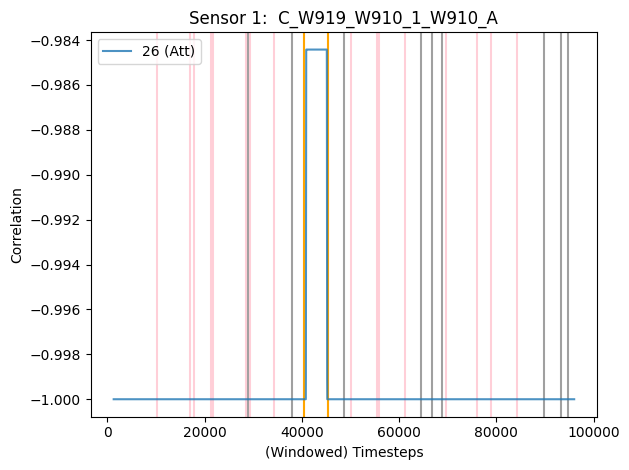

***********************************************************************************************
Sensor 2:  C_W919_W910_1_W910_B


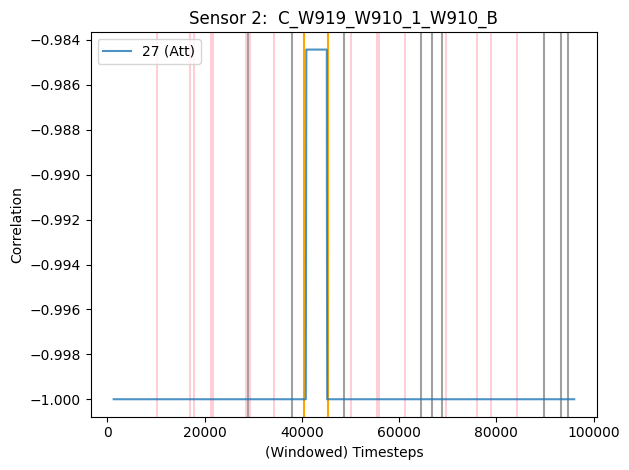

***********************************************************************************************
Sensor 3:  C_W919_W910_1_W910_C


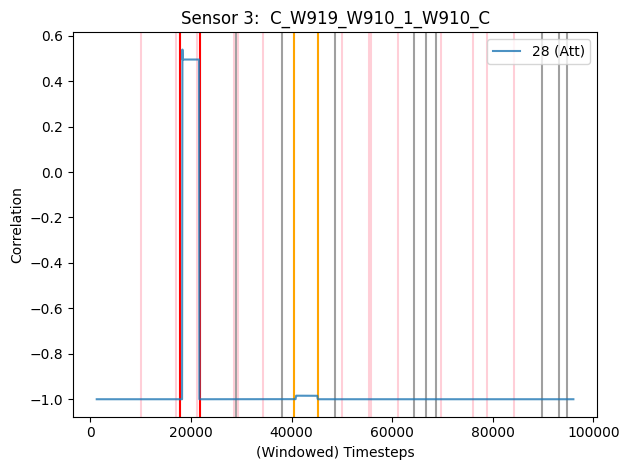

***********************************************************************************************
Sensor 4:  V_W-115KV2_AN


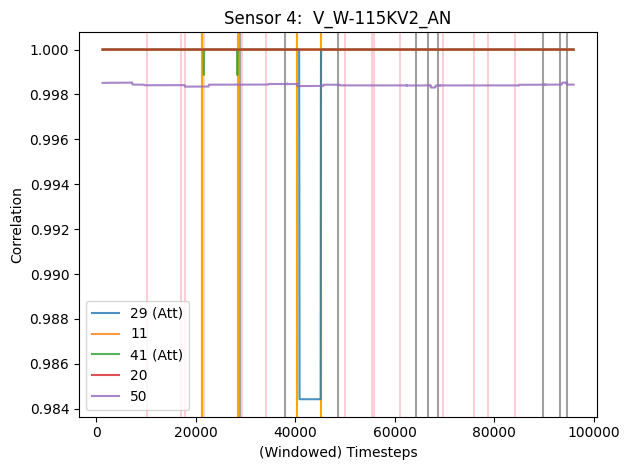

***********************************************************************************************
Sensor 5:  V_W-115KV2_BN


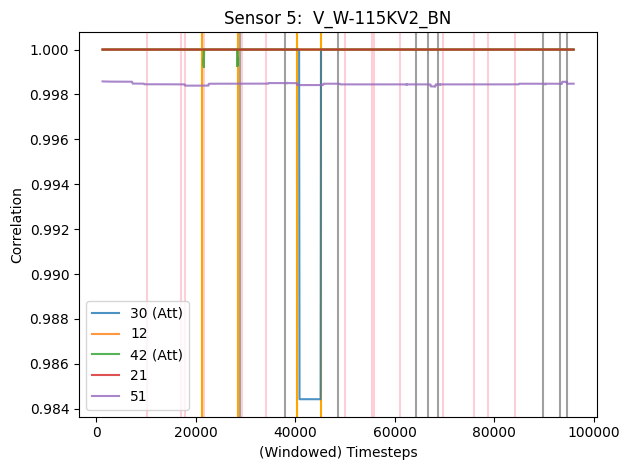

***********************************************************************************************
Sensor 6:  V_W-115KV2_CN


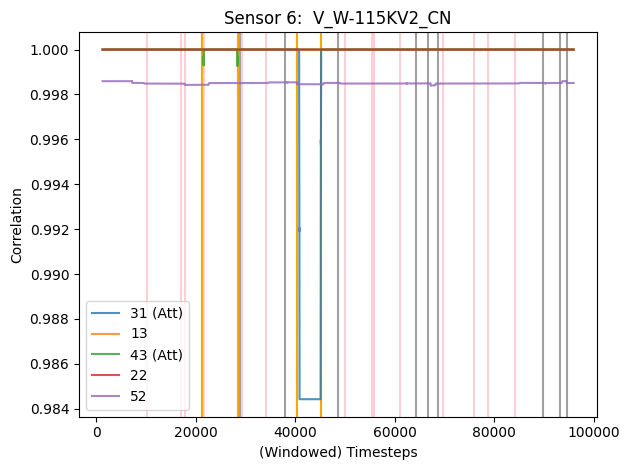

***********************************************************************************************
Sensor 7:  C_W957_W950_1_W950_A


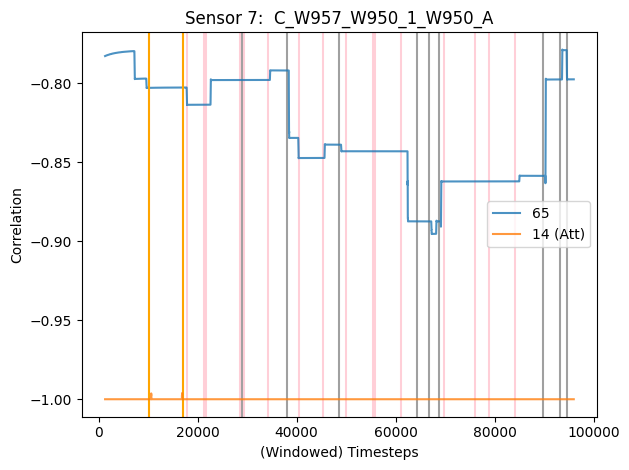

***********************************************************************************************
Sensor 8:  C_W957_W950_1_W950_B


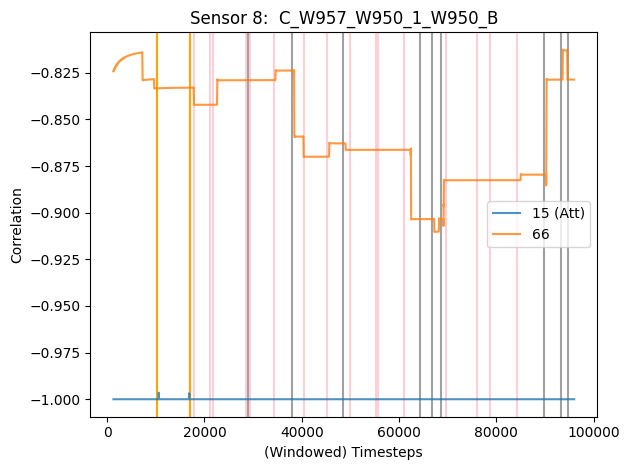

***********************************************************************************************
Sensor 9:  C_W957_W950_1_W950_C


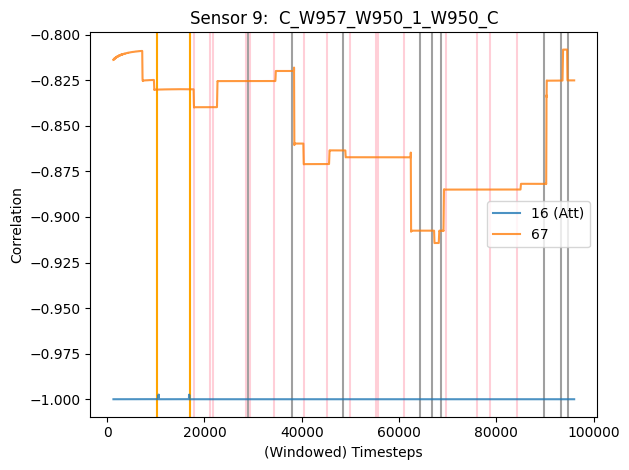

***********************************************************************************************
Sensor 10:  V_W951_AN


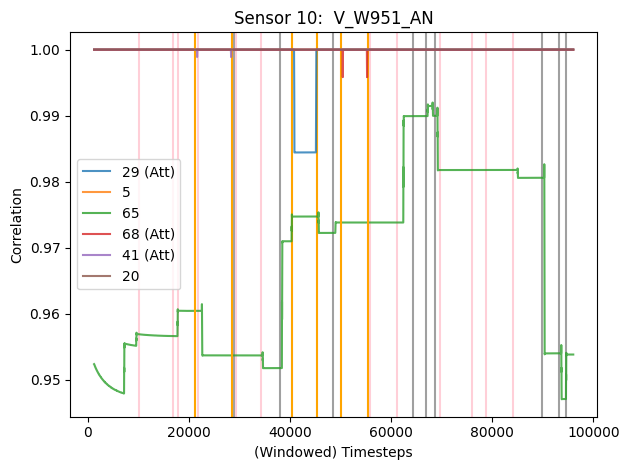

***********************************************************************************************
Sensor 11:  V_W951_BN


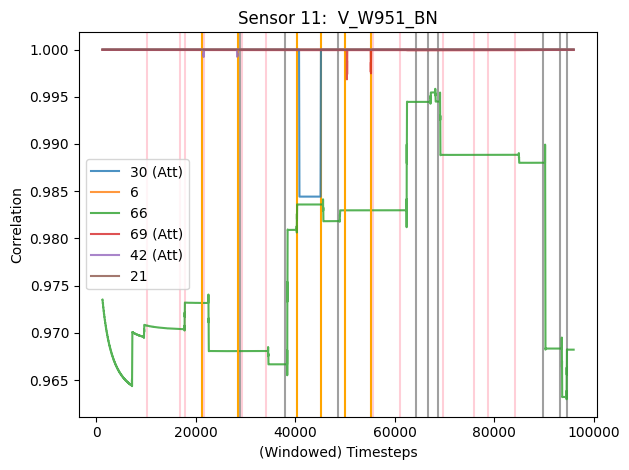

***********************************************************************************************
Sensor 12:  V_W951_CN


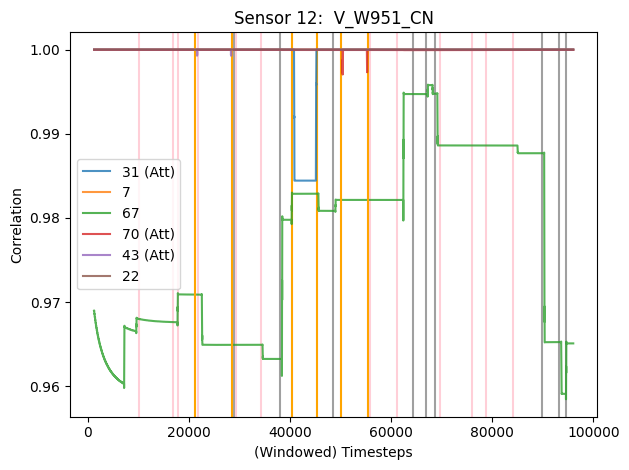

***********************************************************************************************
Sensor 13:  C_W957_W950_1_W957_A


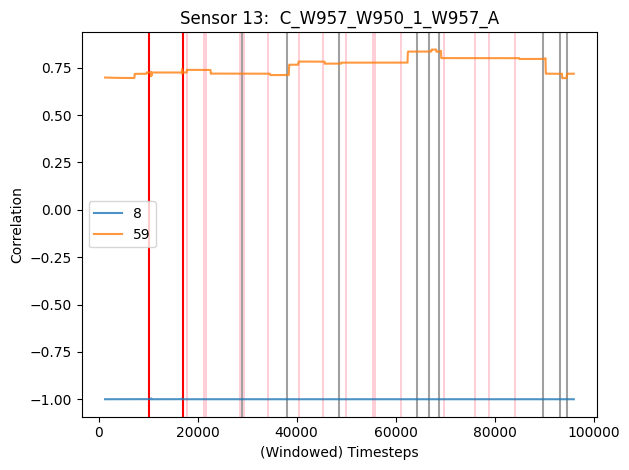

***********************************************************************************************
Sensor 14:  C_W957_W950_1_W957_B


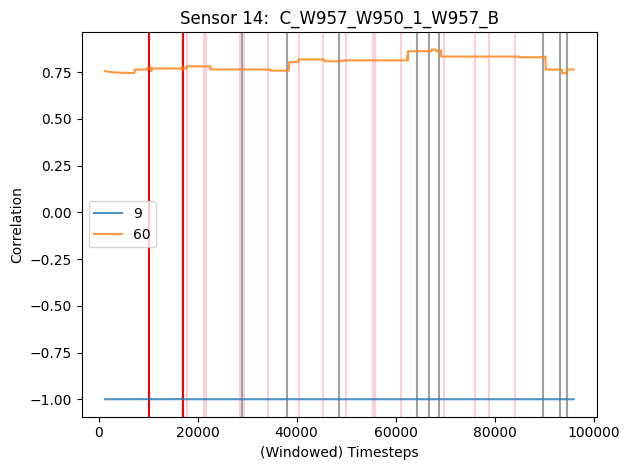

***********************************************************************************************
Sensor 15:  C_W957_W950_1_W957_C


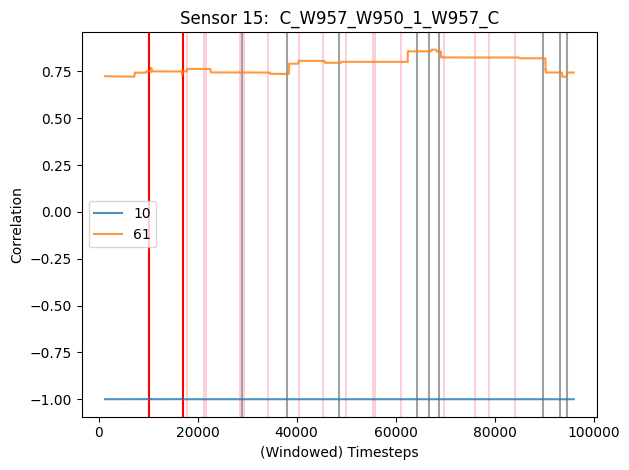

***********************************************************************************************
Sensor 16:  C_W927_W929_1_W929_A


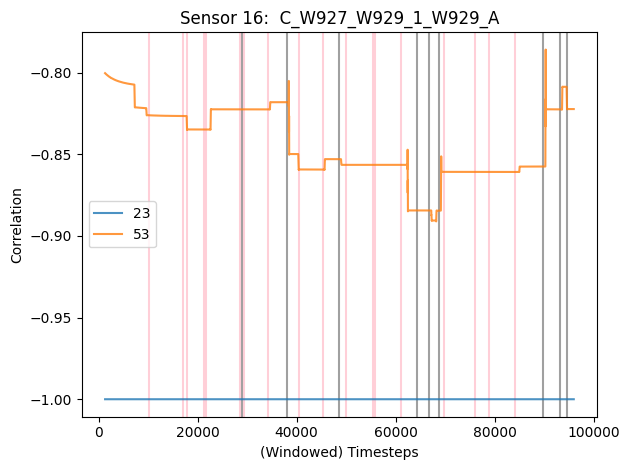

***********************************************************************************************
Sensor 17:  C_W927_W929_1_W929_B


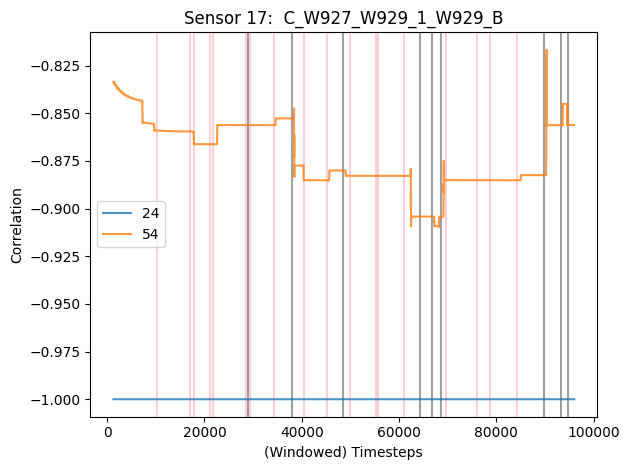

***********************************************************************************************
Sensor 18:  C_W927_W929_1_W929_C


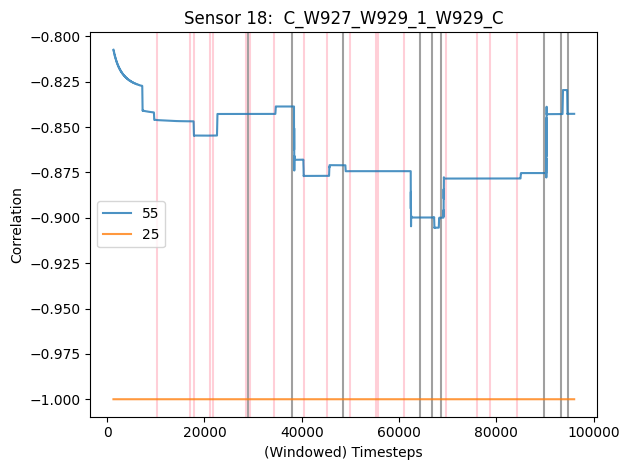

***********************************************************************************************
Sensor 19:  V_W-115KV1_AN


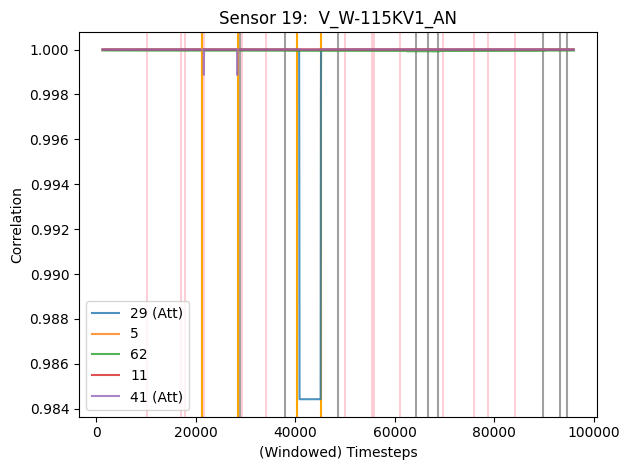

***********************************************************************************************
Sensor 20:  V_W-115KV1_BN


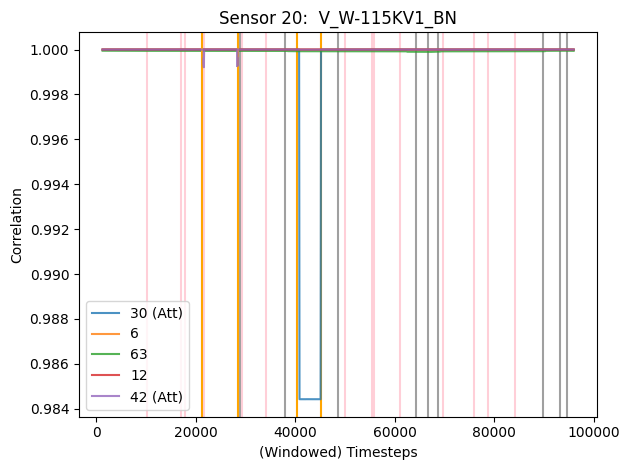

***********************************************************************************************
Sensor 21:  V_W-115KV1_CN


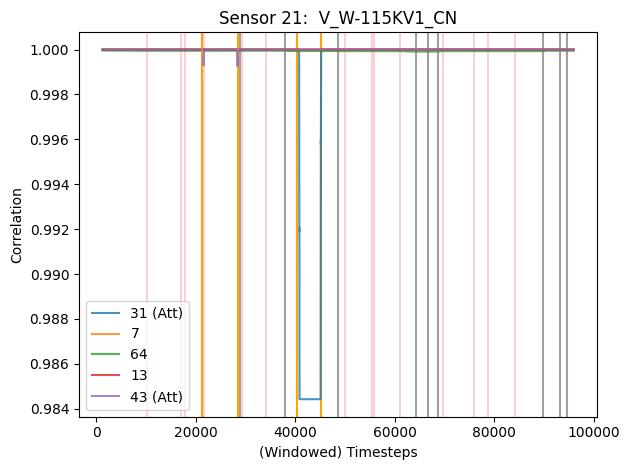

***********************************************************************************************
Sensor 22:  C_W927_W929_1_W927_A


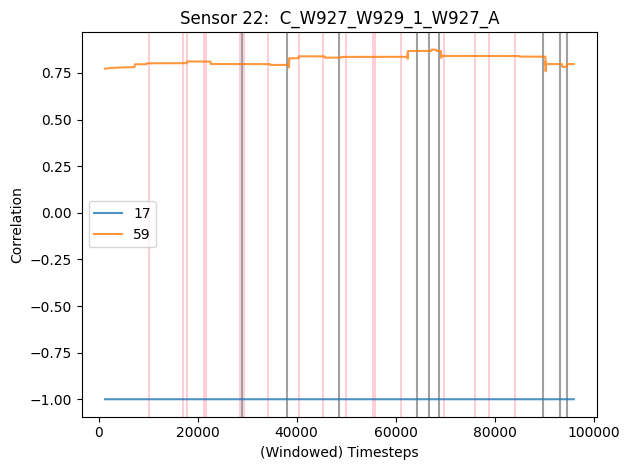

***********************************************************************************************
Sensor 23:  C_W927_W929_1_W927_B


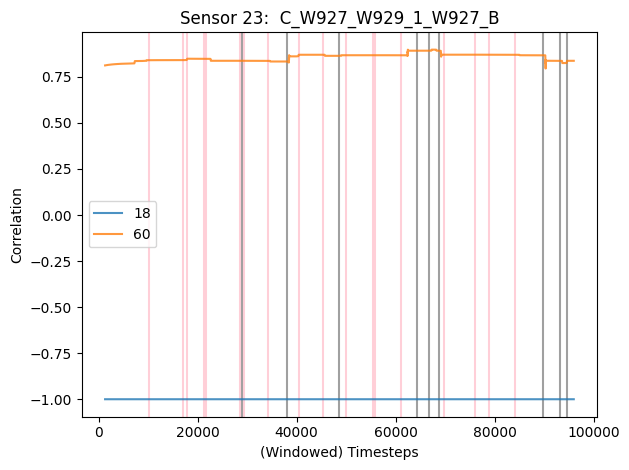

***********************************************************************************************
Sensor 24:  C_W927_W929_1_W927_C


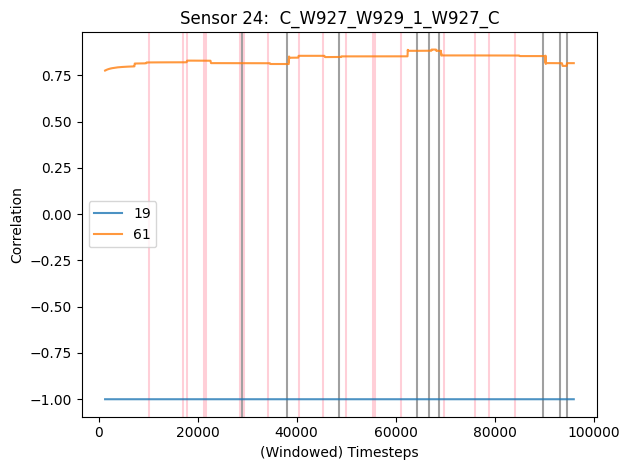

***********************************************************************************************
Sensor 25:  C_W919_W910_1_W919_A


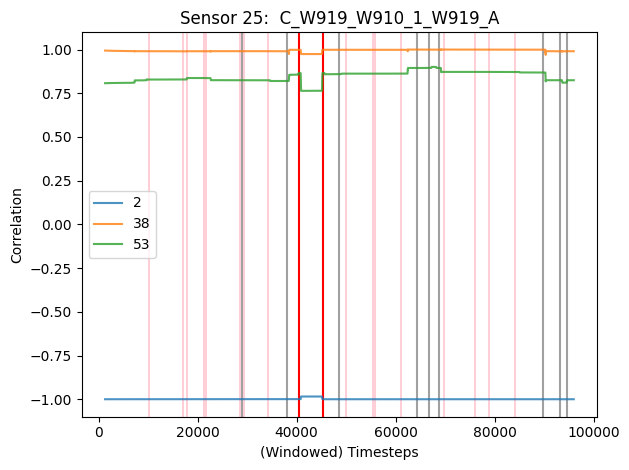

***********************************************************************************************
Sensor 26:  C_W919_W910_1_W919_B


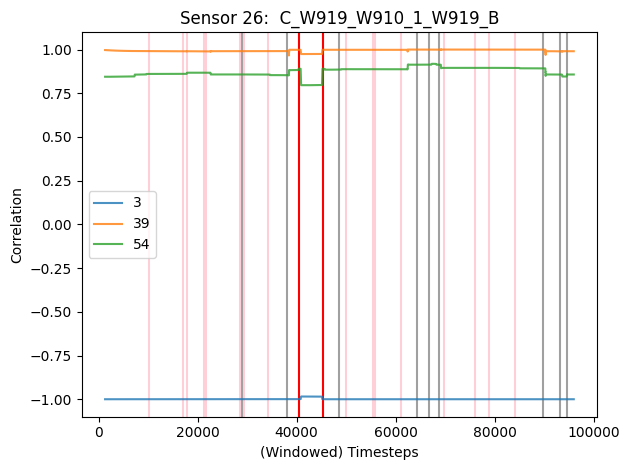

***********************************************************************************************
Sensor 27:  C_W919_W910_1_W919_C


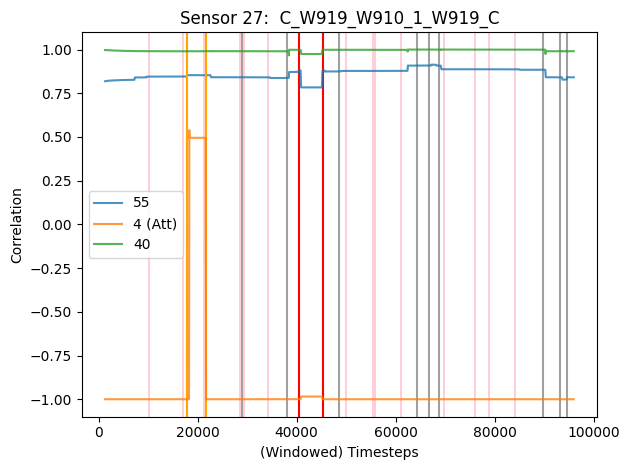

***********************************************************************************************
Sensor 28:  V_W911_AN


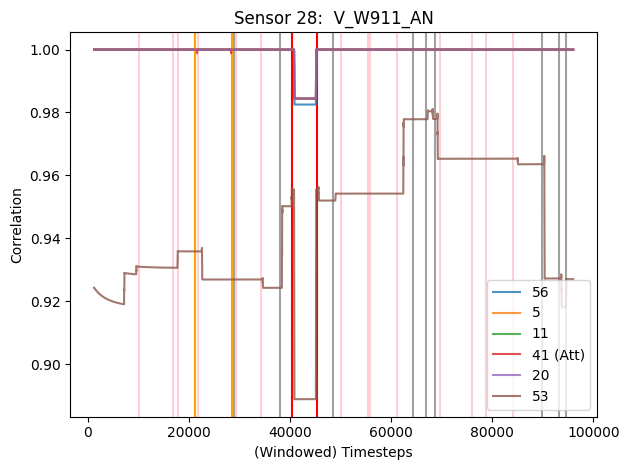

***********************************************************************************************
Sensor 29:  V_W911_BN


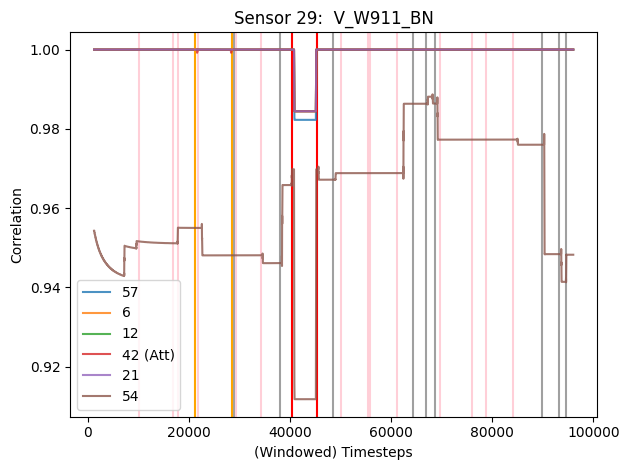

***********************************************************************************************
Sensor 30:  V_W911_CN


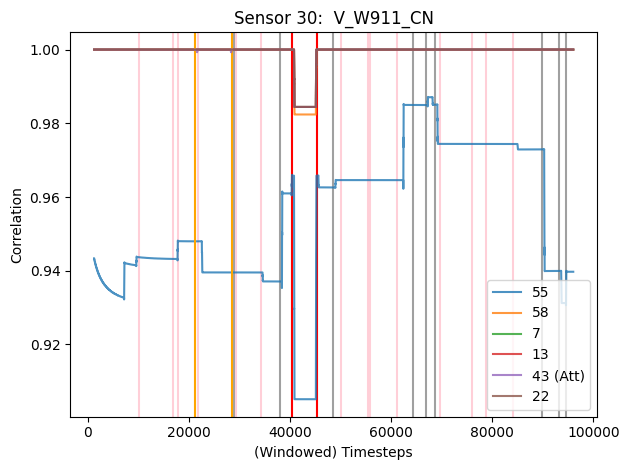

***********************************************************************************************
Sensor 31:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


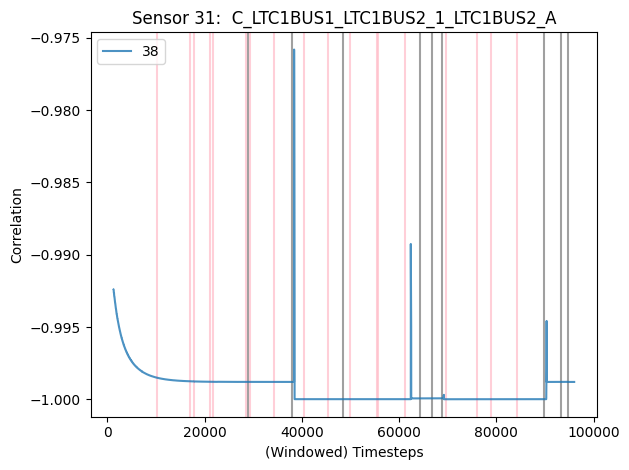

***********************************************************************************************
Sensor 32:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B


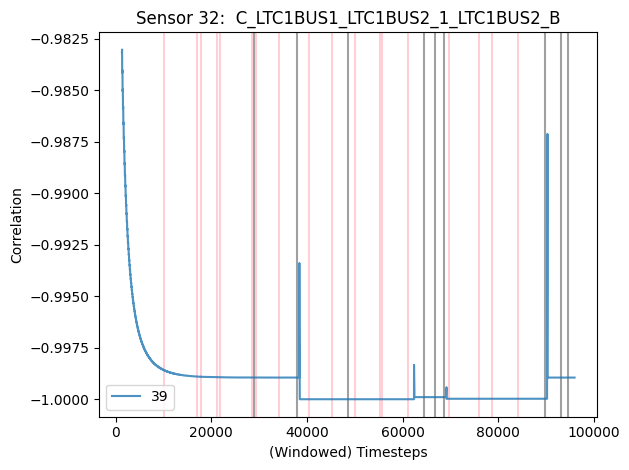

***********************************************************************************************
Sensor 33:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


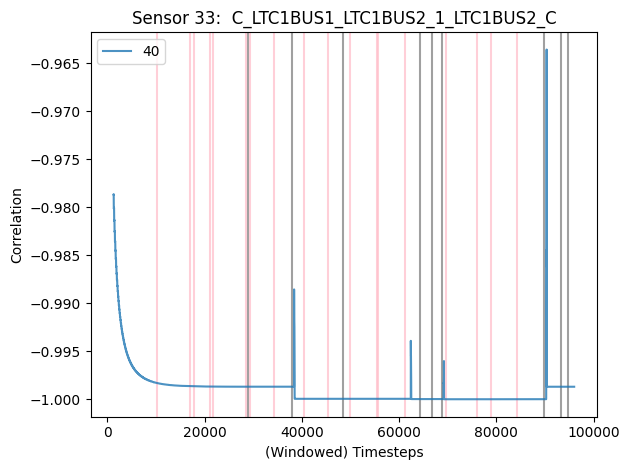

***********************************************************************************************
Sensor 34:  V_BUS13KV1_AN


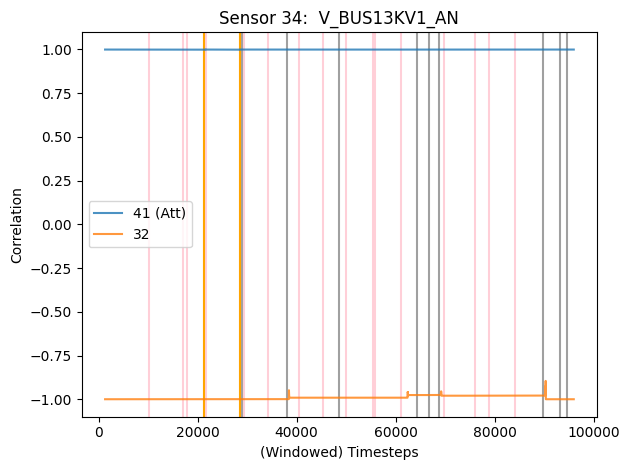

***********************************************************************************************
Sensor 35:  V_BUS13KV1_BN


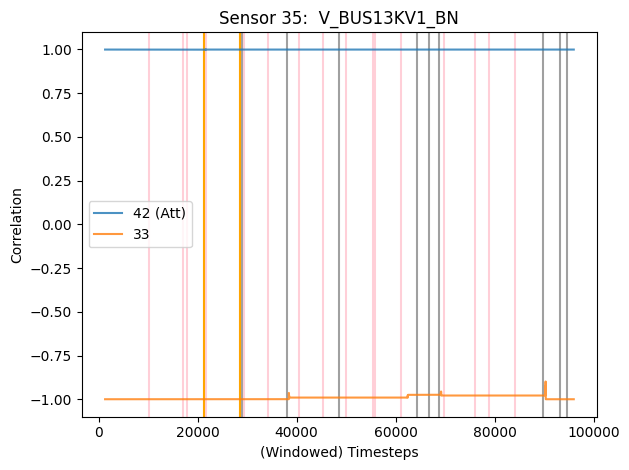

***********************************************************************************************
Sensor 36:  V_BUS13KV1_CN


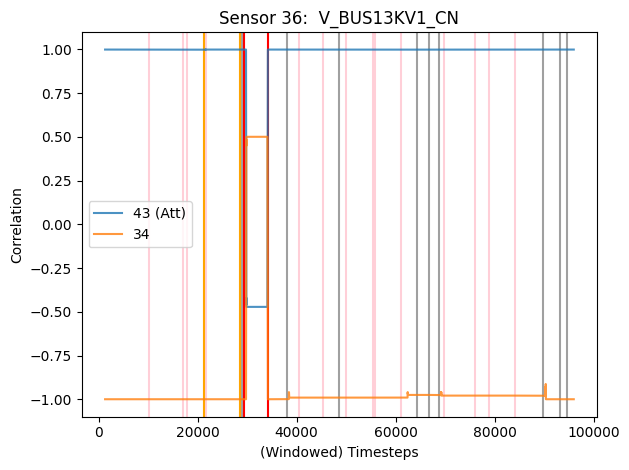

***********************************************************************************************
Sensor 37:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


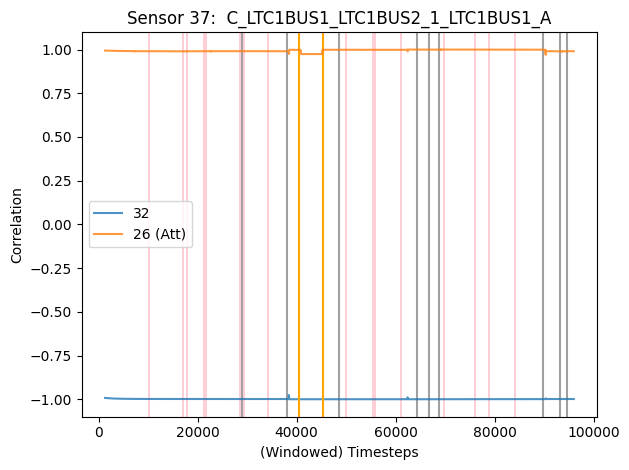

***********************************************************************************************
Sensor 38:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B


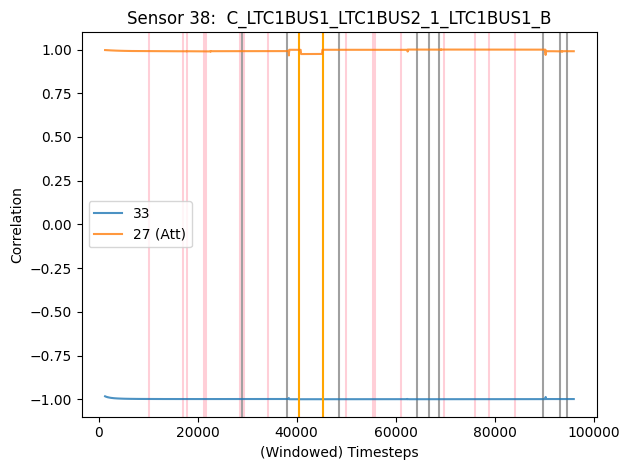

***********************************************************************************************
Sensor 39:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


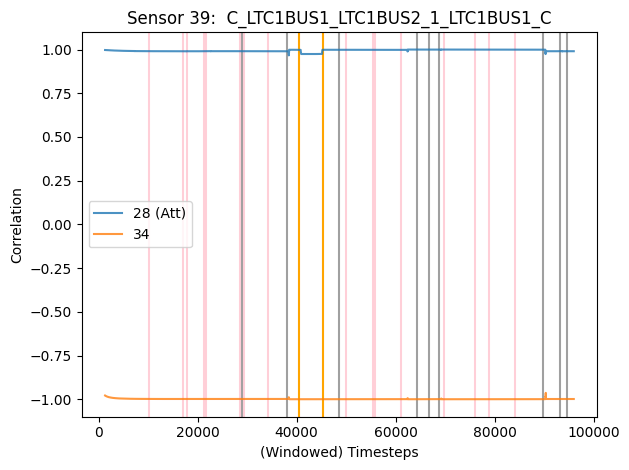

***********************************************************************************************
Sensor 40:  V_W9111_AN


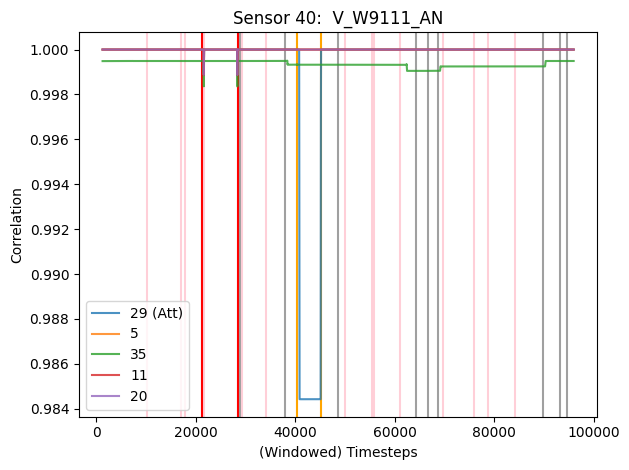

***********************************************************************************************
Sensor 41:  V_W9111_BN


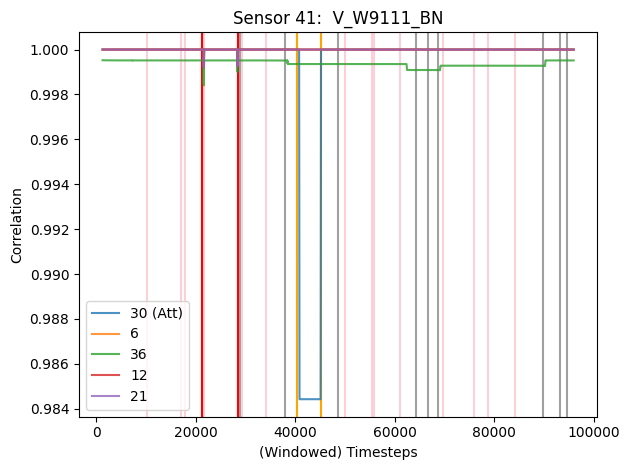

***********************************************************************************************
Sensor 42:  V_W9111_CN


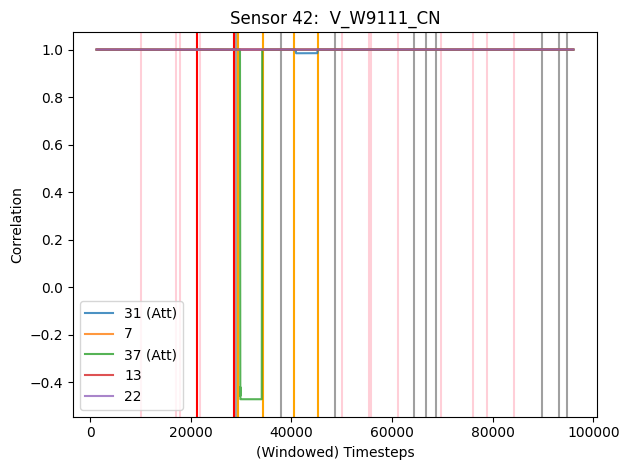

***********************************************************************************************
Sensor 43:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A


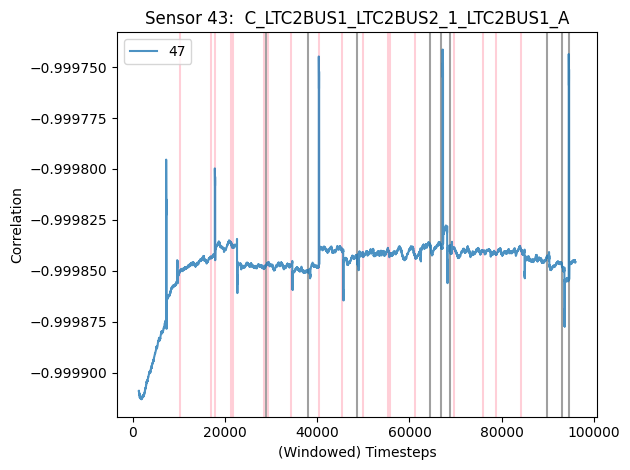

***********************************************************************************************
Sensor 44:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B


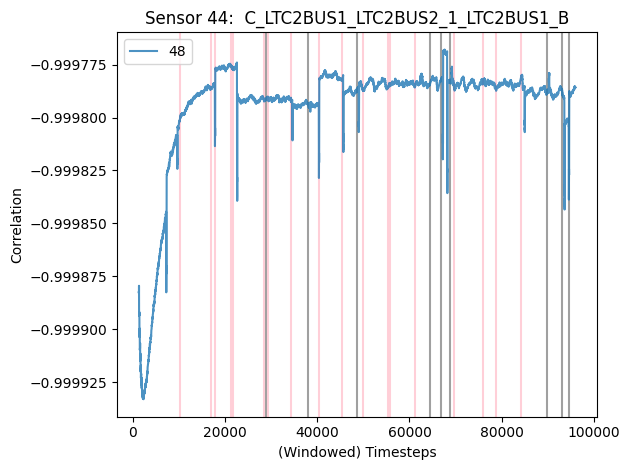

***********************************************************************************************
Sensor 45:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C


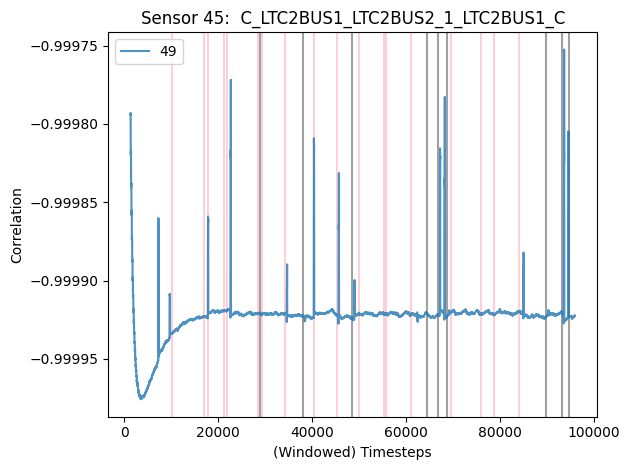

***********************************************************************************************
Sensor 46:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A


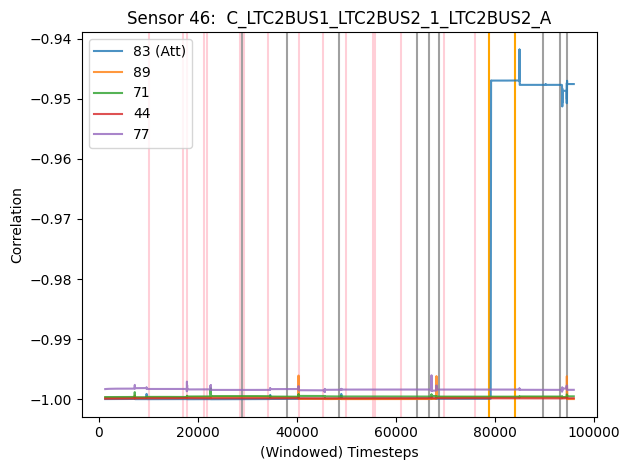

***********************************************************************************************
Sensor 47:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B


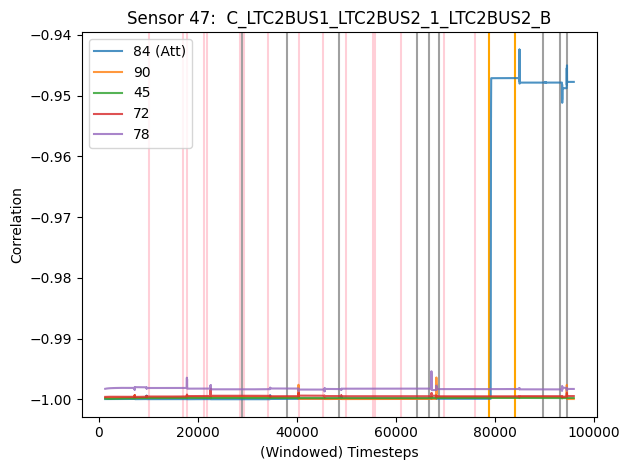

***********************************************************************************************
Sensor 48:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C


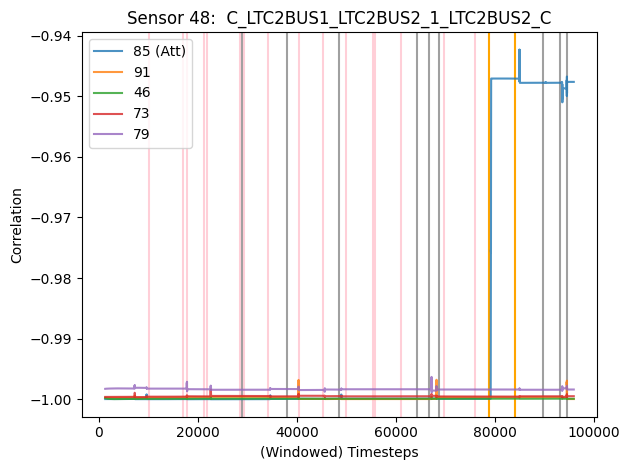

***********************************************************************************************
Sensor 49:  V_BUS13KV2_AN


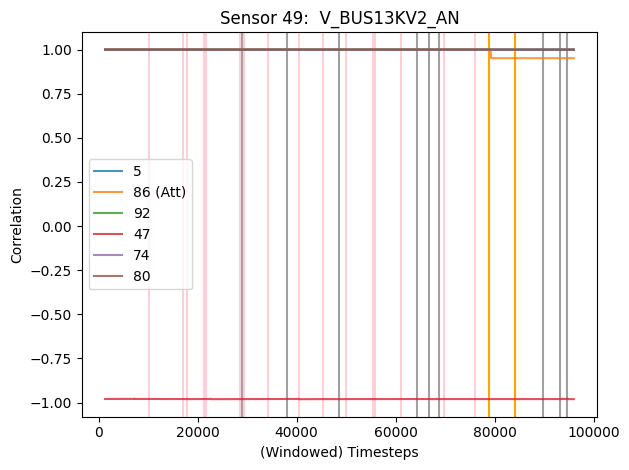

***********************************************************************************************
Sensor 50:  V_BUS13KV2_BN


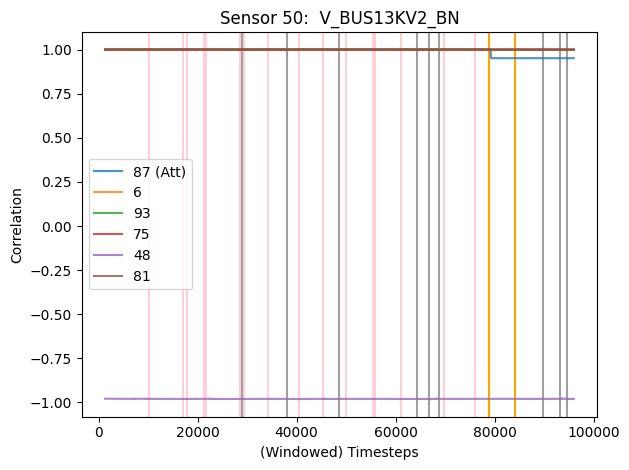

***********************************************************************************************
Sensor 51:  V_BUS13KV2_CN


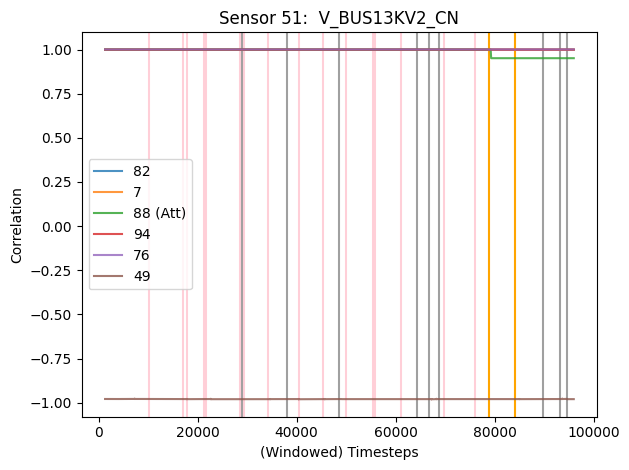

***********************************************************************************************
Sensor 52:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_A


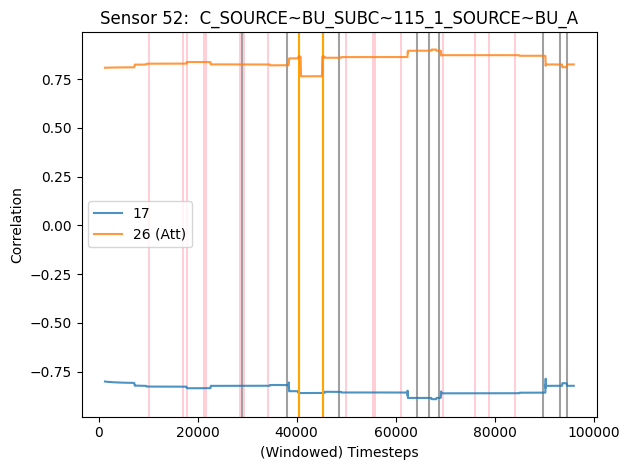

***********************************************************************************************
Sensor 53:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_B


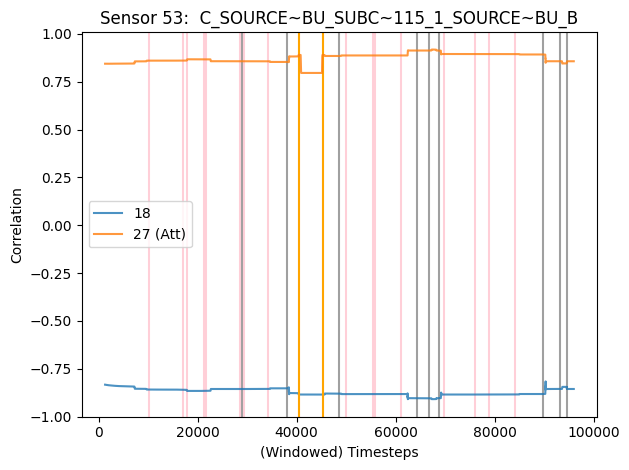

***********************************************************************************************
Sensor 54:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_C


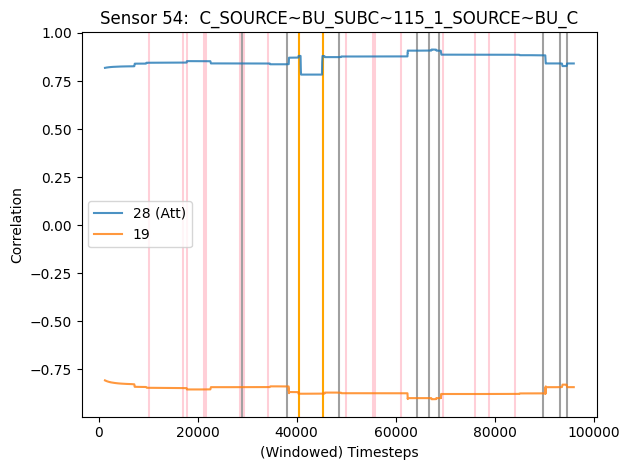

***********************************************************************************************
Sensor 55:  V_SOURCE-BU_AN


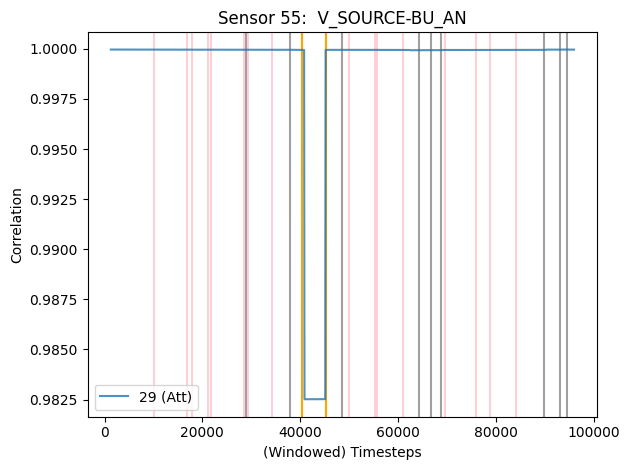

***********************************************************************************************
Sensor 56:  V_SOURCE-BU_BN


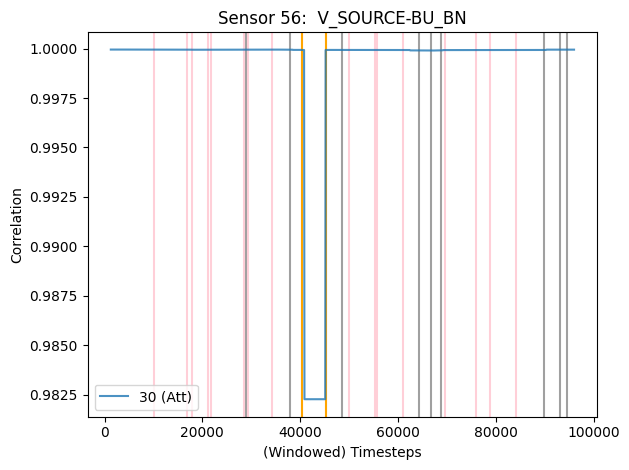

***********************************************************************************************
Sensor 57:  V_SOURCE-BU_CN


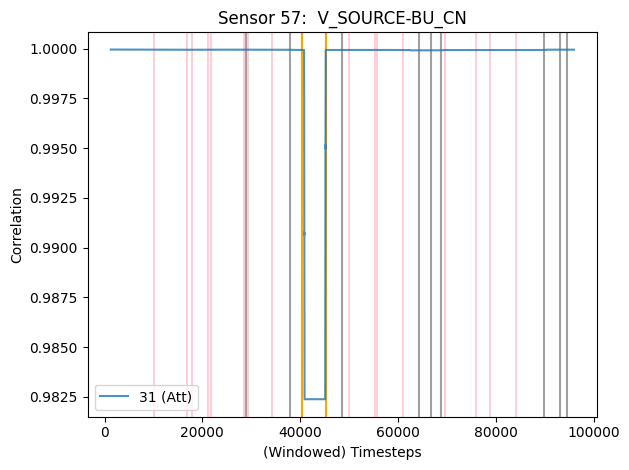

***********************************************************************************************
Sensor 58:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_A


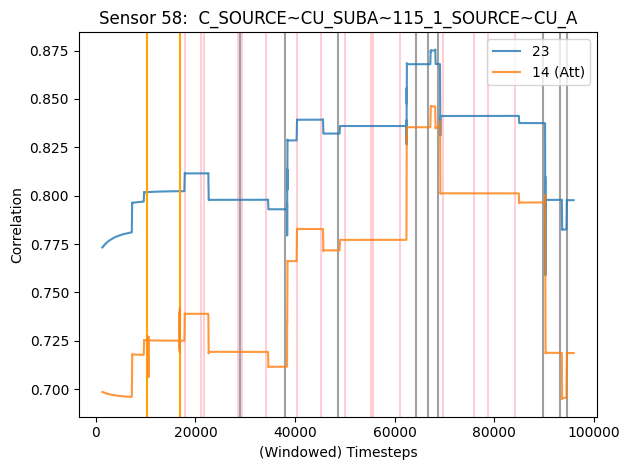

***********************************************************************************************
Sensor 59:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_B


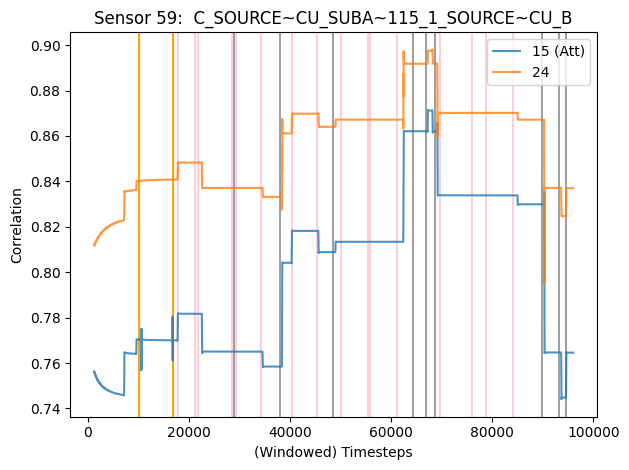

***********************************************************************************************
Sensor 60:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_C


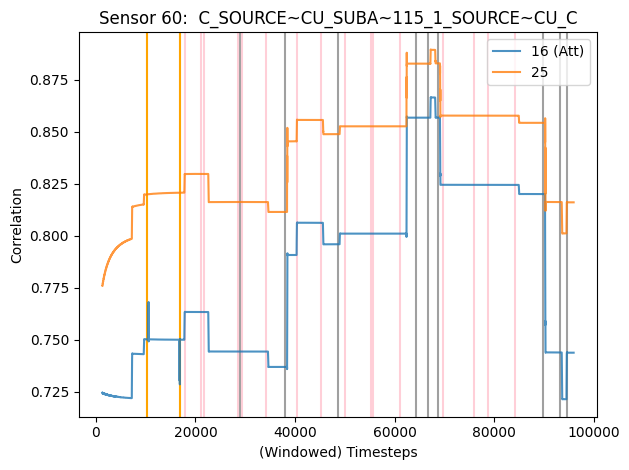

***********************************************************************************************
Sensor 61:  V_SOURCE-CU_AN


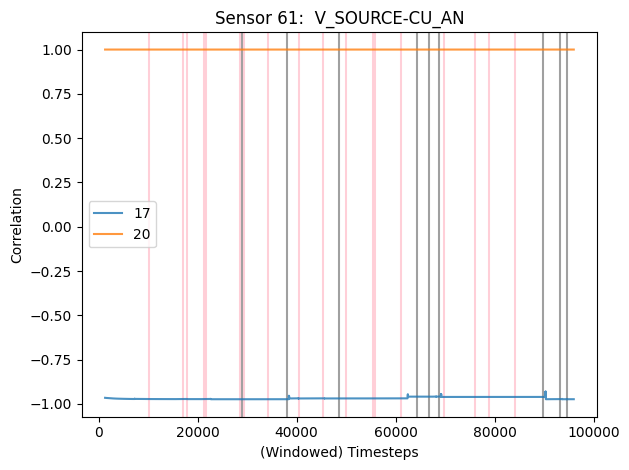

***********************************************************************************************
Sensor 62:  V_SOURCE-CU_BN


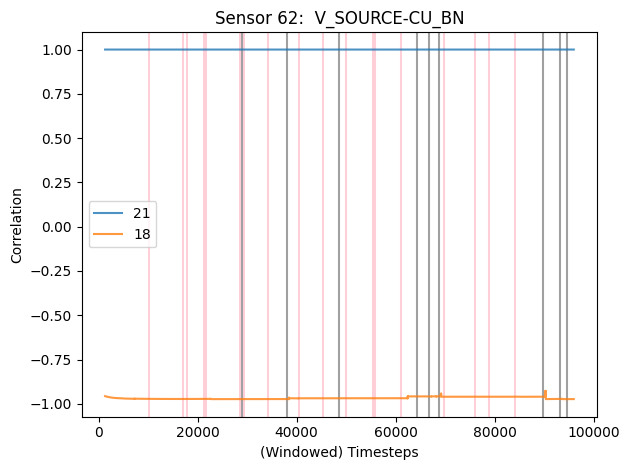

***********************************************************************************************
Sensor 63:  V_SOURCE-CU_CN


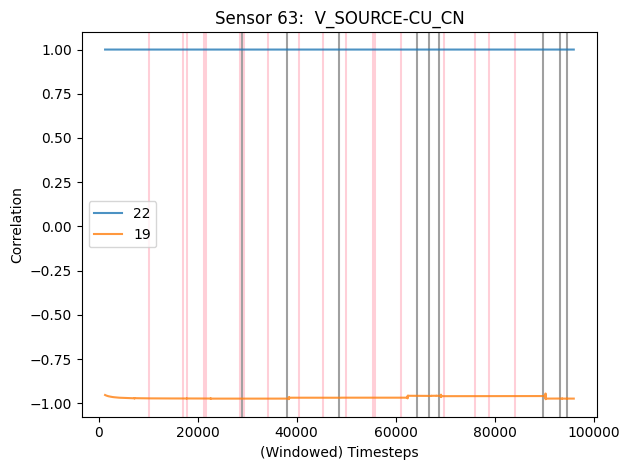

***********************************************************************************************
Sensor 64:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_A


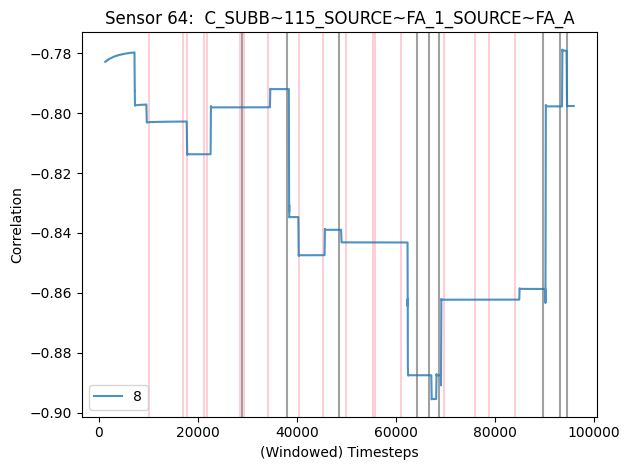

***********************************************************************************************
Sensor 65:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_B


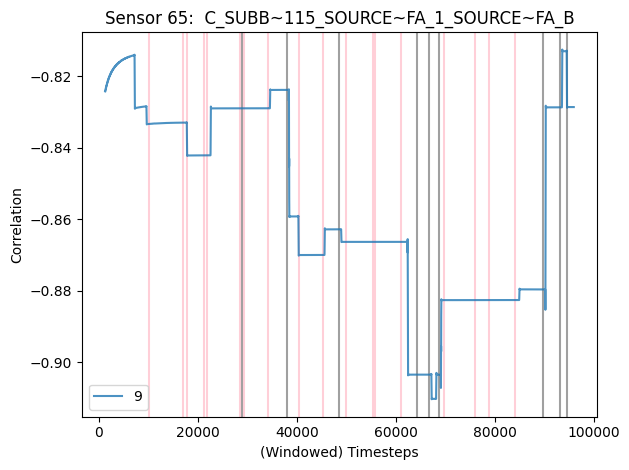

***********************************************************************************************
Sensor 66:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_C


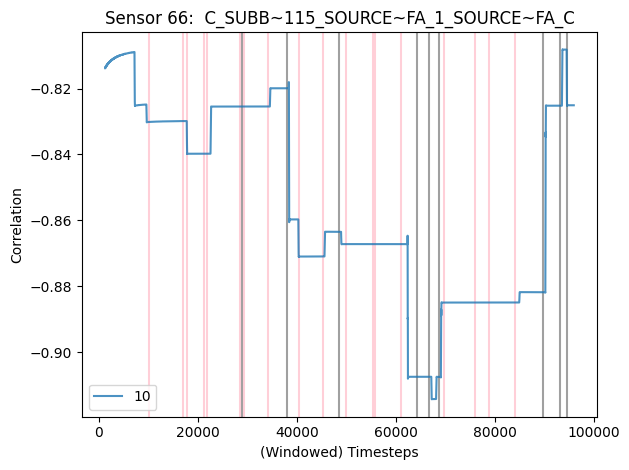

***********************************************************************************************
Sensor 67:  V_SOURCE-FA_AN


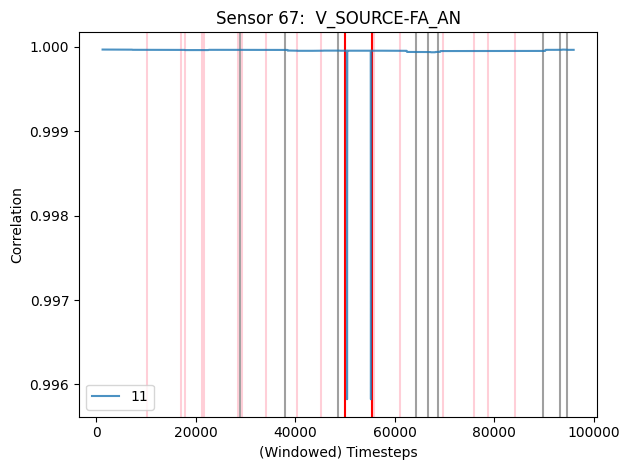

***********************************************************************************************
Sensor 68:  V_SOURCE-FA_BN


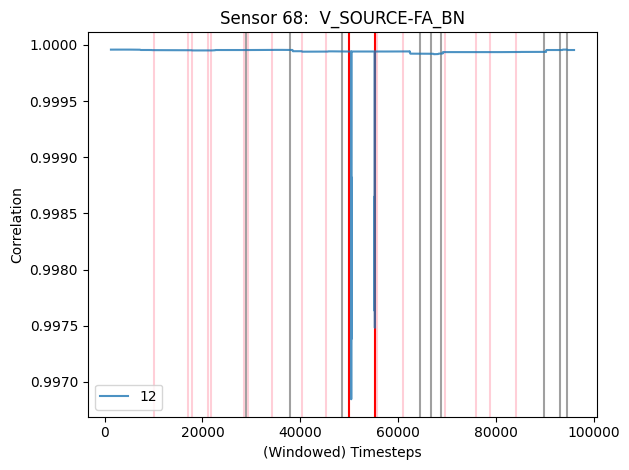

***********************************************************************************************
Sensor 69:  V_SOURCE-FA_CN


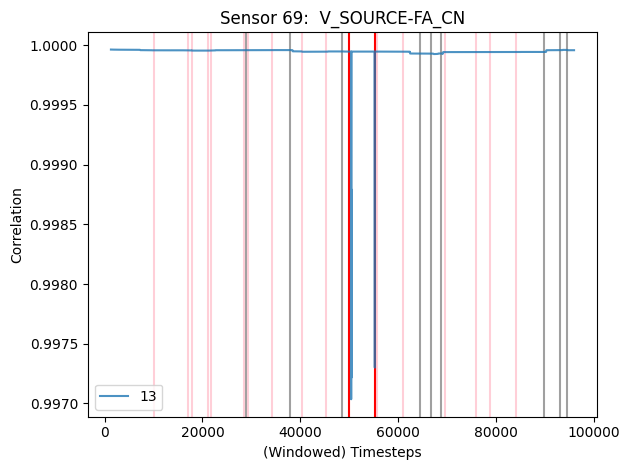

***********************************************************************************************
Sensor 70:  C_W738_W737_2_W737_A


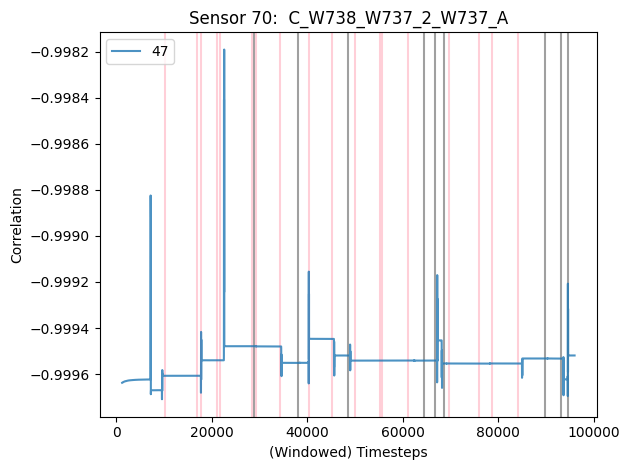

***********************************************************************************************
Sensor 71:  C_W738_W737_2_W737_B


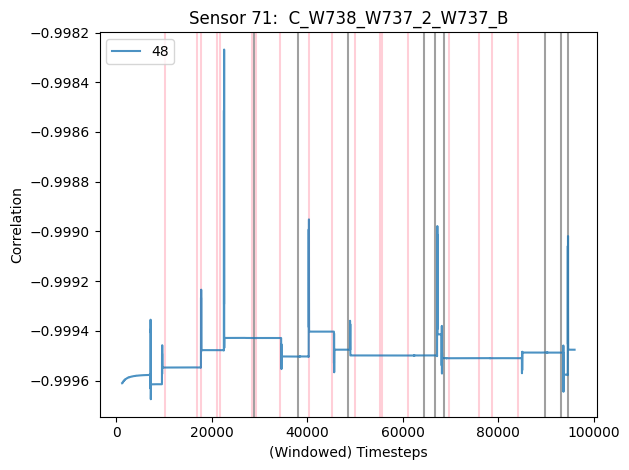

***********************************************************************************************
Sensor 72:  C_W738_W737_2_W737_C


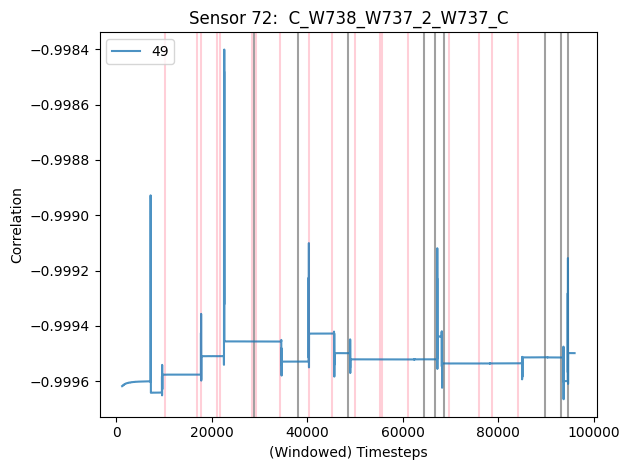

***********************************************************************************************
Sensor 73:  V_W738_AN


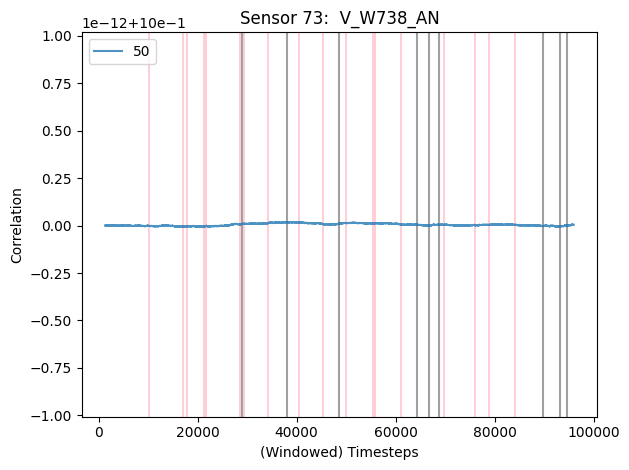

***********************************************************************************************
Sensor 74:  V_W738_BN


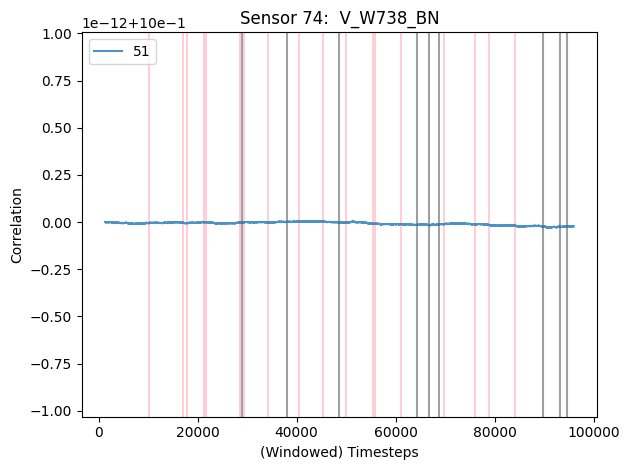

***********************************************************************************************
Sensor 75:  V_W738_CN


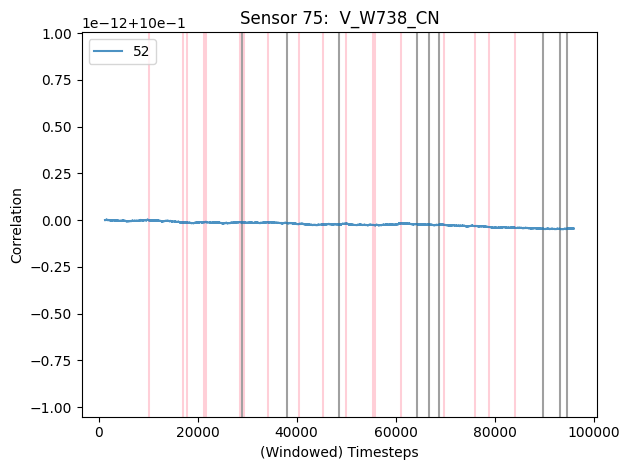

***********************************************************************************************
Sensor 76:  C_W747_W748_2_W747_A


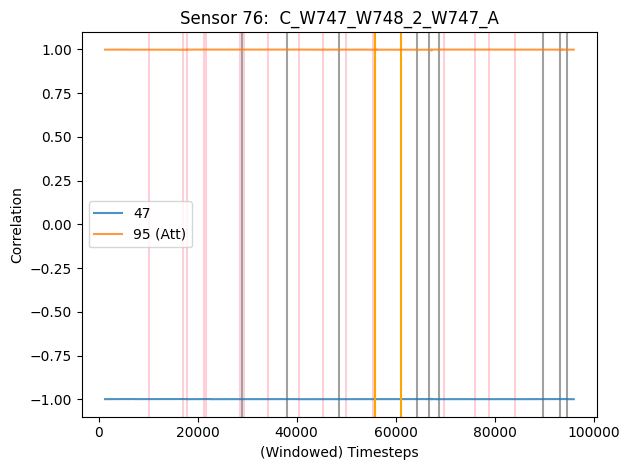

***********************************************************************************************
Sensor 77:  C_W747_W748_2_W747_B


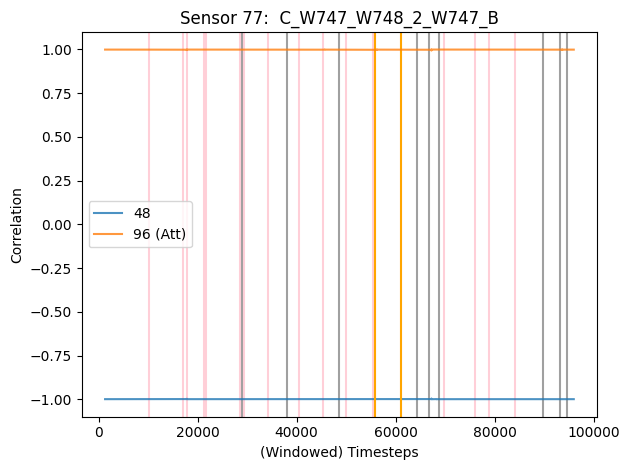

***********************************************************************************************
Sensor 78:  C_W747_W748_2_W747_C


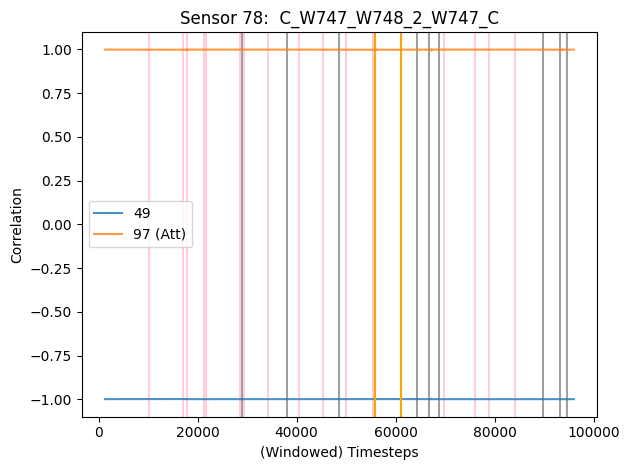

***********************************************************************************************
Sensor 79:  V_W748_AN


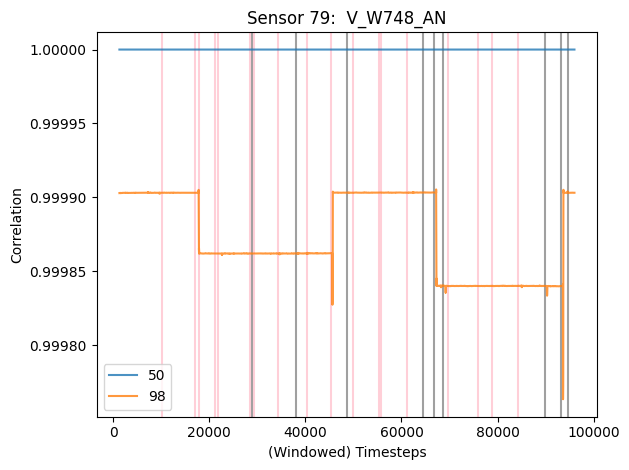

***********************************************************************************************
Sensor 80:  V_W748_BN


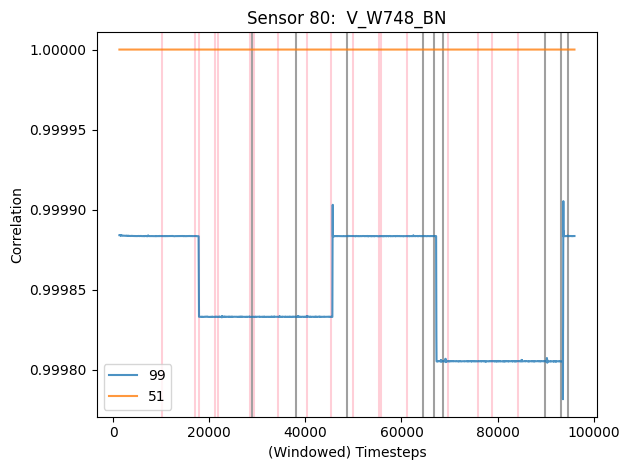

***********************************************************************************************
Sensor 81:  V_W748_CN


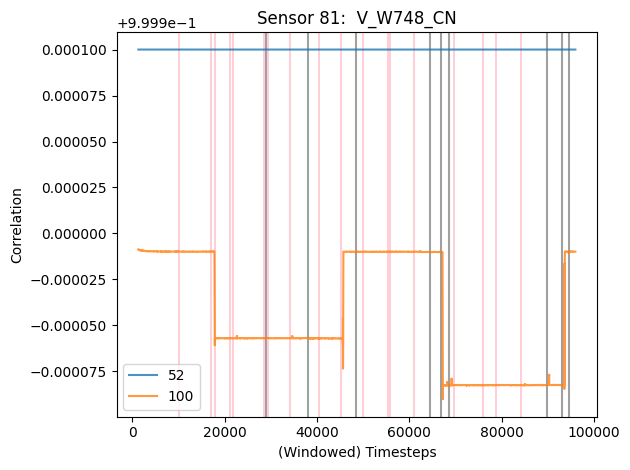

***********************************************************************************************
Sensor 82:  C_W787_W788_2_W787_A


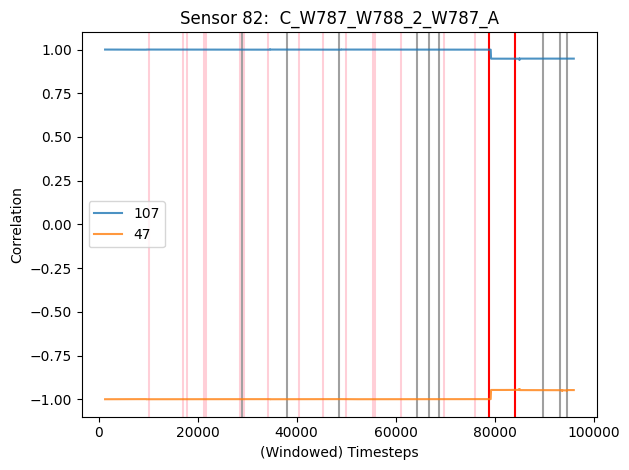

***********************************************************************************************
Sensor 83:  C_W787_W788_2_W787_B


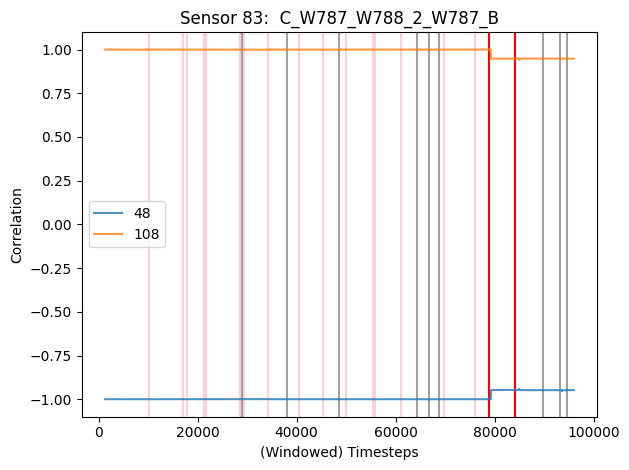

***********************************************************************************************
Sensor 84:  C_W787_W788_2_W787_C


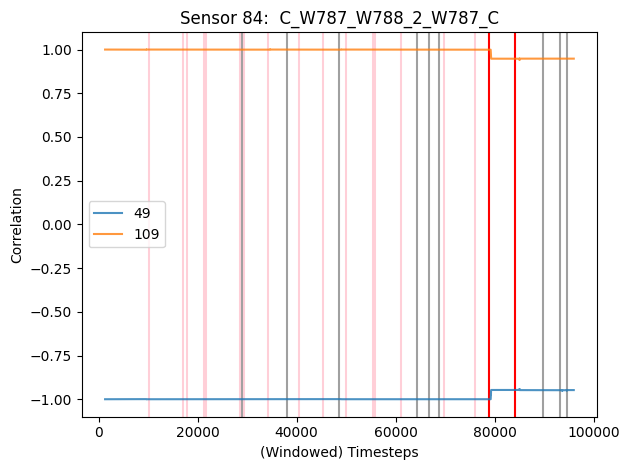

***********************************************************************************************
Sensor 85:  V_W788_AN


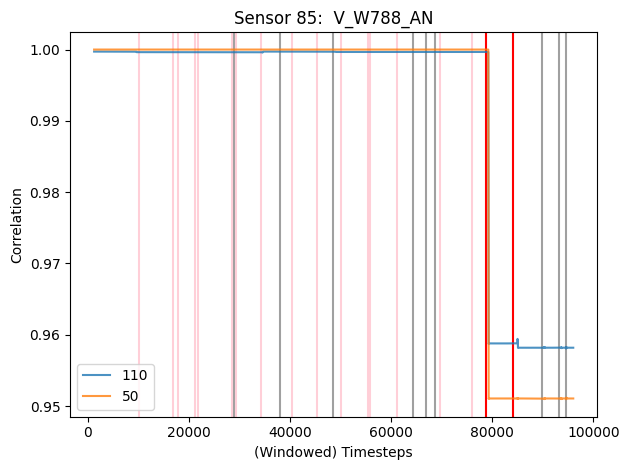

***********************************************************************************************
Sensor 86:  V_W788_BN


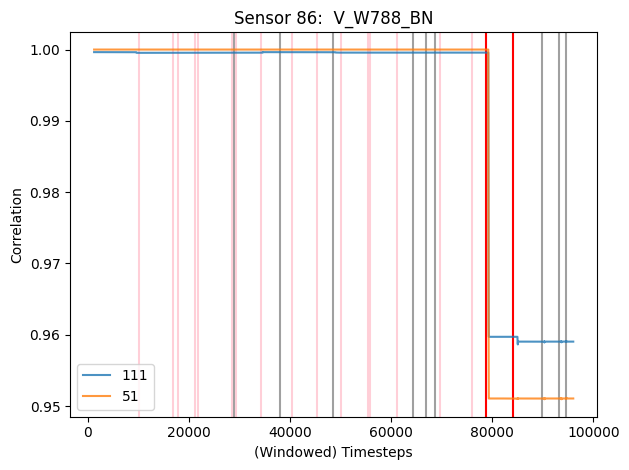

***********************************************************************************************
Sensor 87:  V_W788_CN


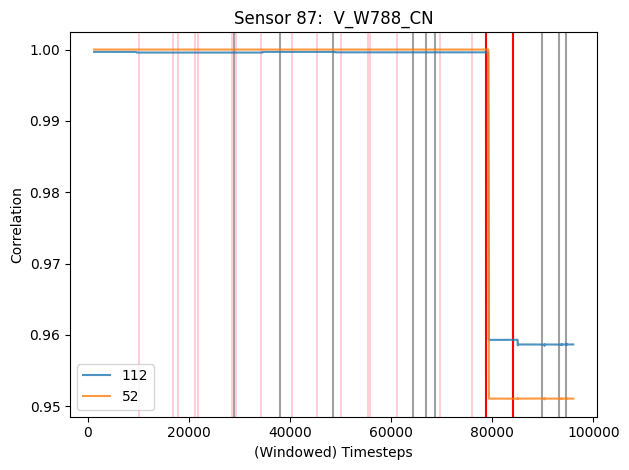

***********************************************************************************************
Sensor 88:  C_W797_W798_2_W797_A


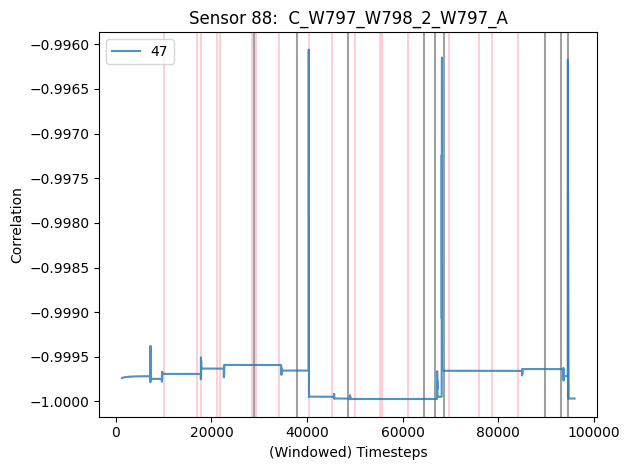

***********************************************************************************************
Sensor 89:  C_W797_W798_2_W797_B


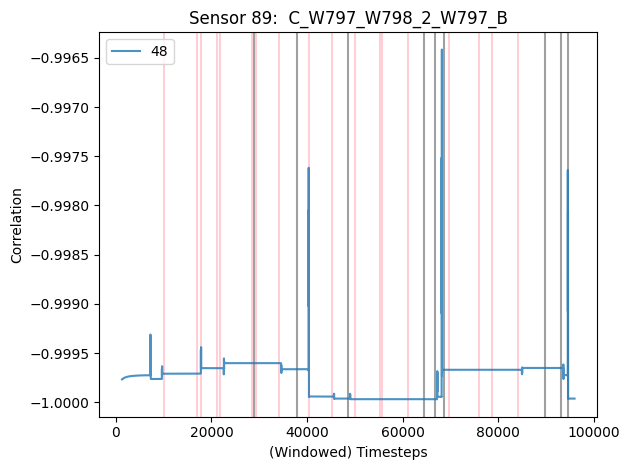

***********************************************************************************************
Sensor 90:  C_W797_W798_2_W797_C


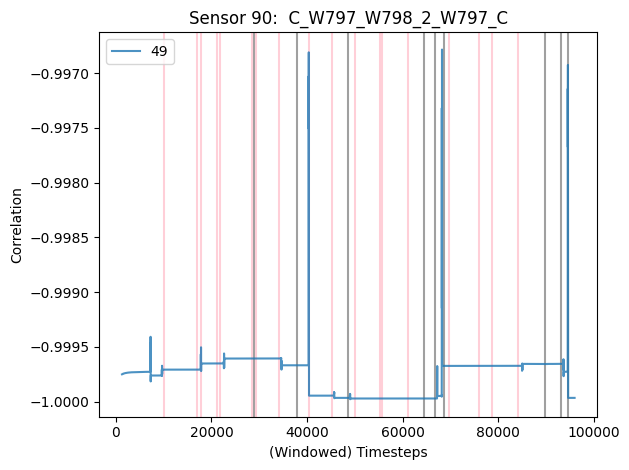

***********************************************************************************************
Sensor 91:  V_W798_AN


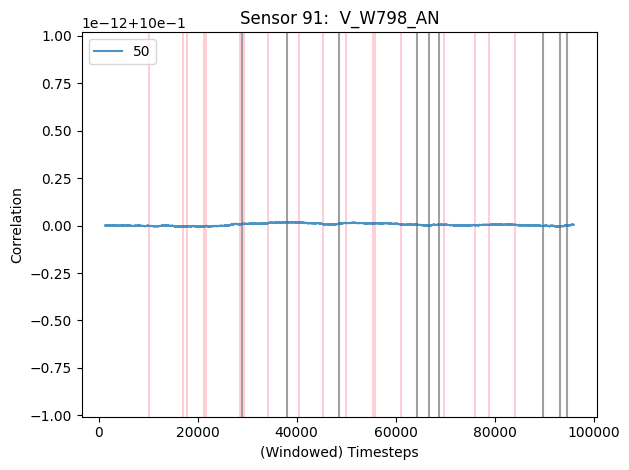

***********************************************************************************************
Sensor 92:  V_W798_BN


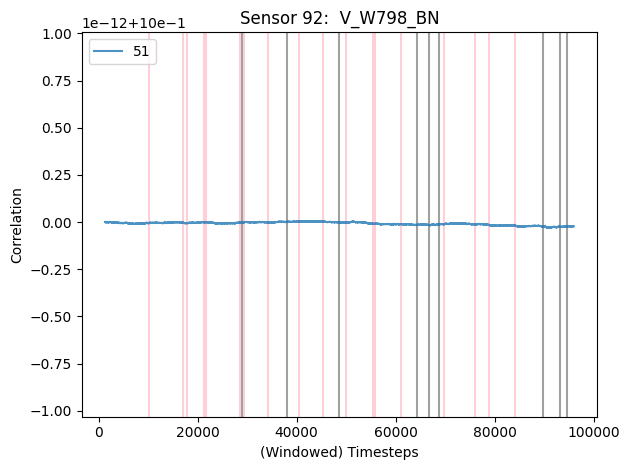

***********************************************************************************************
Sensor 93:  V_W798_CN


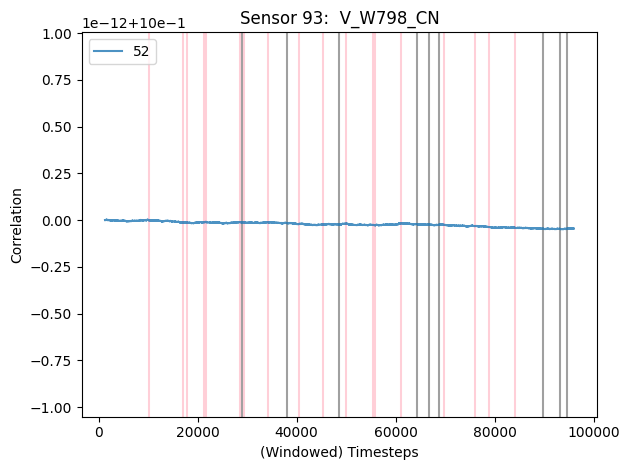

***********************************************************************************************
Sensor 94:  C_FD2B2_FD2B1_1_FD2B1_A


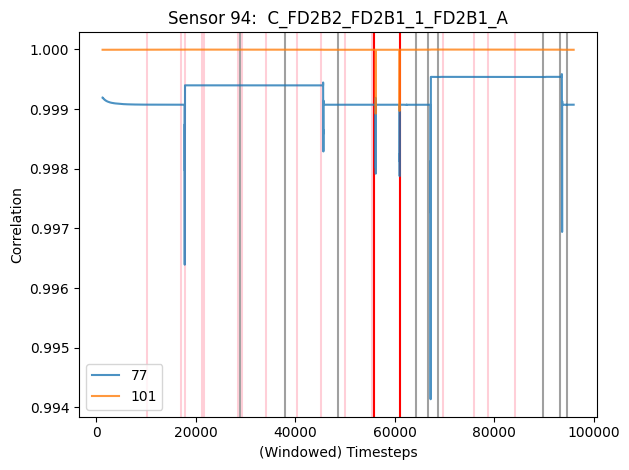

***********************************************************************************************
Sensor 95:  C_FD2B2_FD2B1_1_FD2B1_B


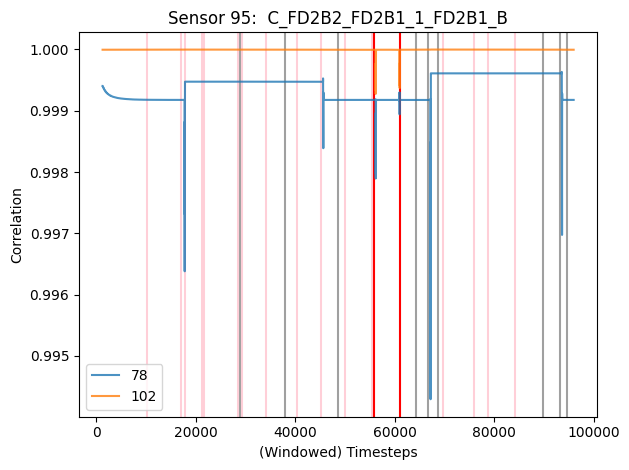

***********************************************************************************************
Sensor 96:  C_FD2B2_FD2B1_1_FD2B1_C


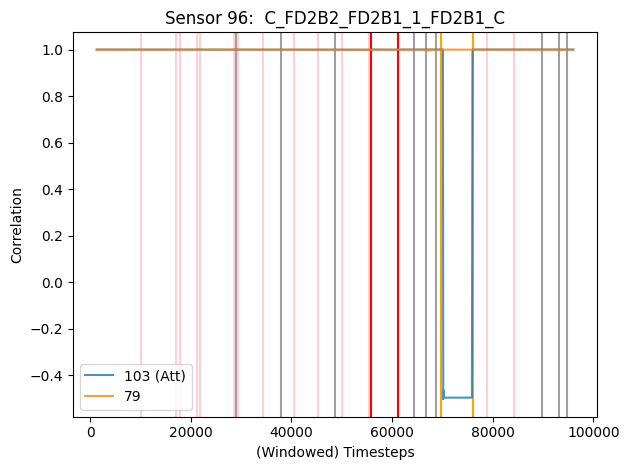

***********************************************************************************************
Sensor 97:  V_FD2B1_AN


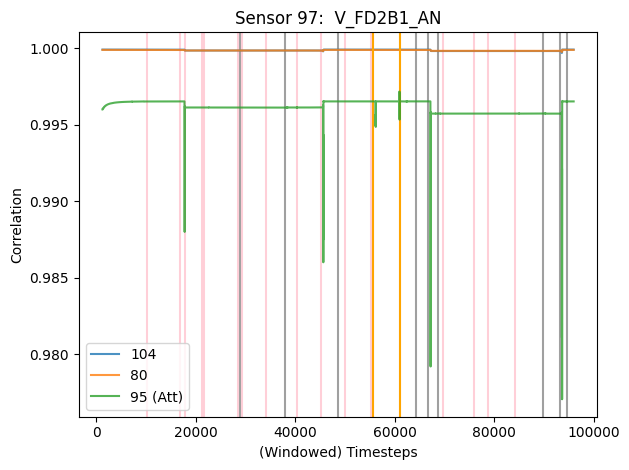

***********************************************************************************************
Sensor 98:  V_FD2B1_BN


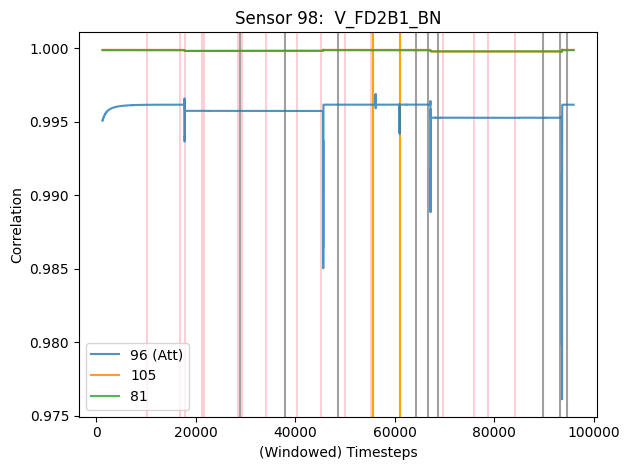

***********************************************************************************************
Sensor 99:  V_FD2B1_CN


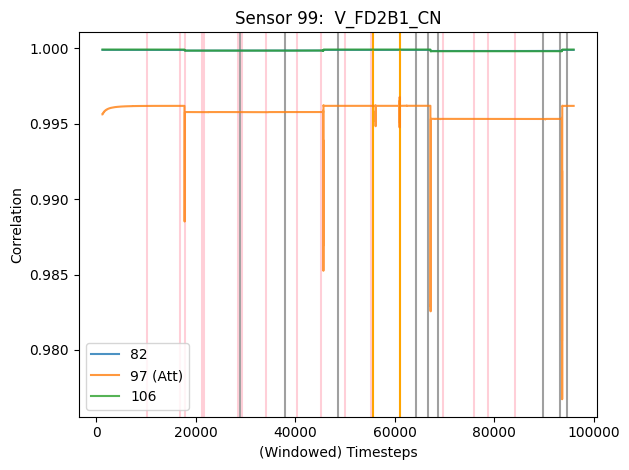

***********************************************************************************************
Sensor 100:  C_FD2B5_FD2B6_1_FD2B5_A


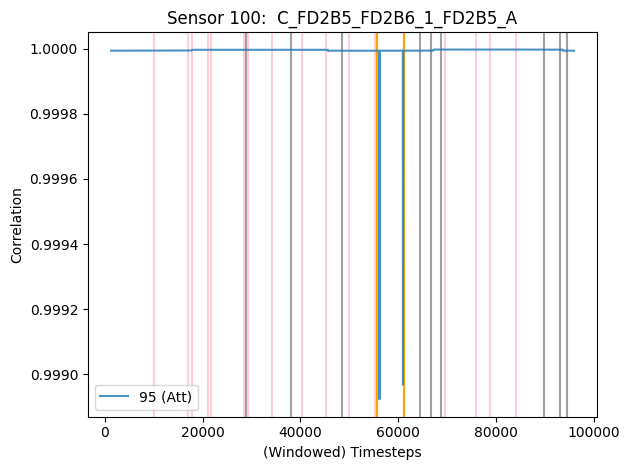

***********************************************************************************************
Sensor 101:  C_FD2B5_FD2B6_1_FD2B5_B


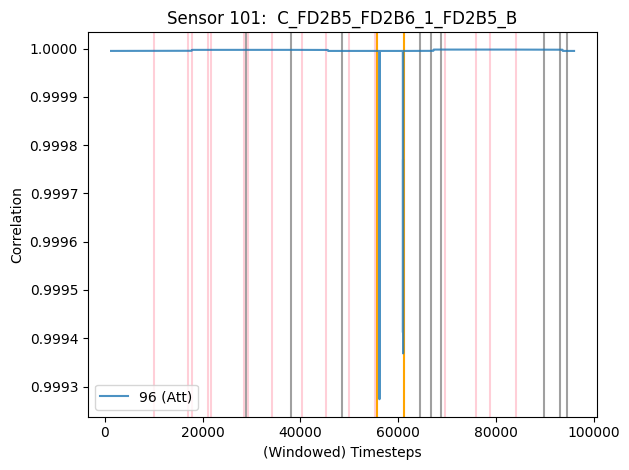

***********************************************************************************************
Sensor 102:  C_FD2B5_FD2B6_1_FD2B5_C


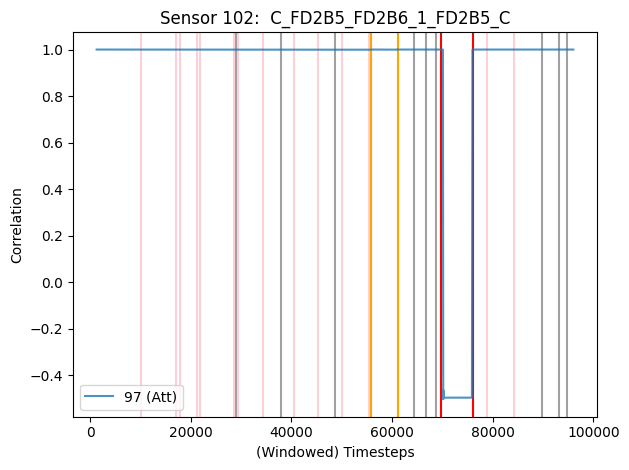

***********************************************************************************************
Sensor 103:  V_FD2B5_AN


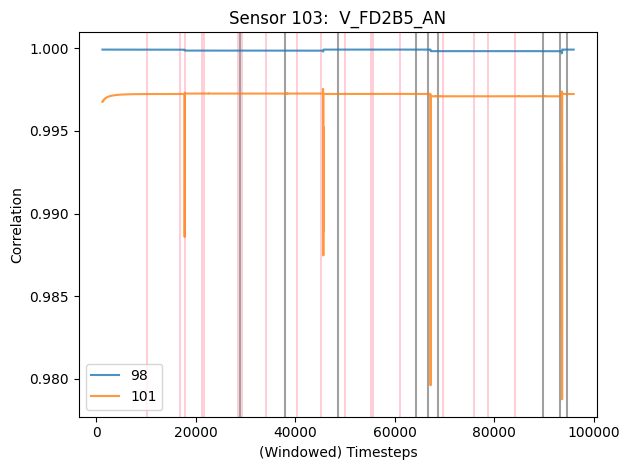

***********************************************************************************************
Sensor 104:  V_FD2B5_BN


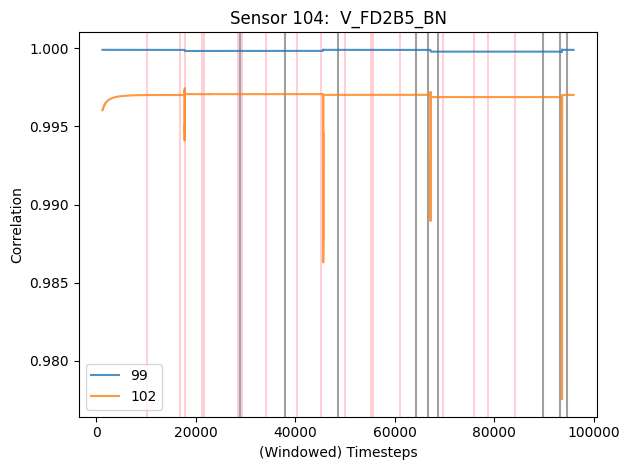

***********************************************************************************************
Sensor 105:  V_FD2B5_CN


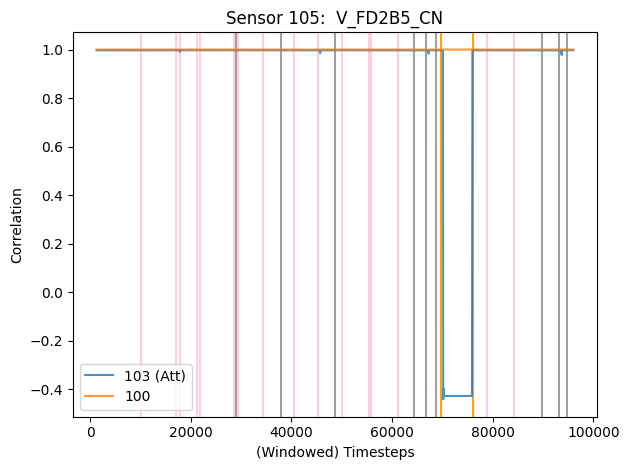

***********************************************************************************************
Sensor 106:  C_FD3B4_FD3B5_1_FD3B4_A


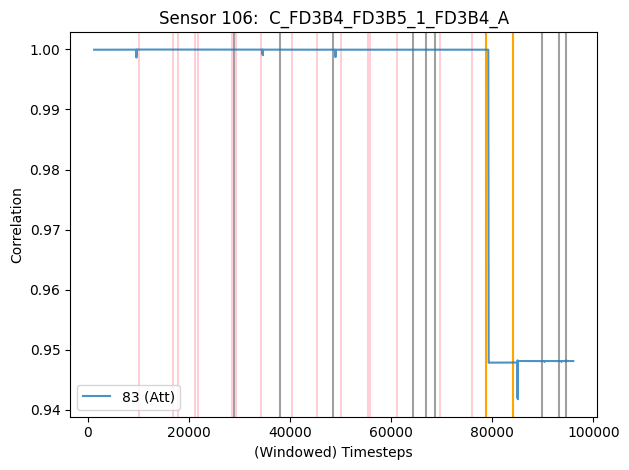

***********************************************************************************************
Sensor 107:  C_FD3B4_FD3B5_1_FD3B4_B


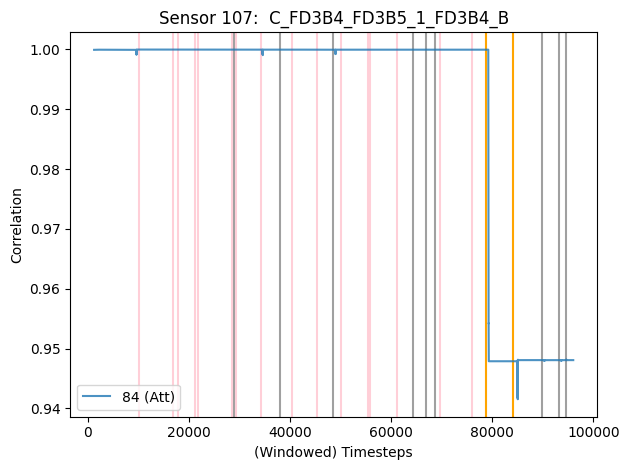

***********************************************************************************************
Sensor 108:  C_FD3B4_FD3B5_1_FD3B4_C


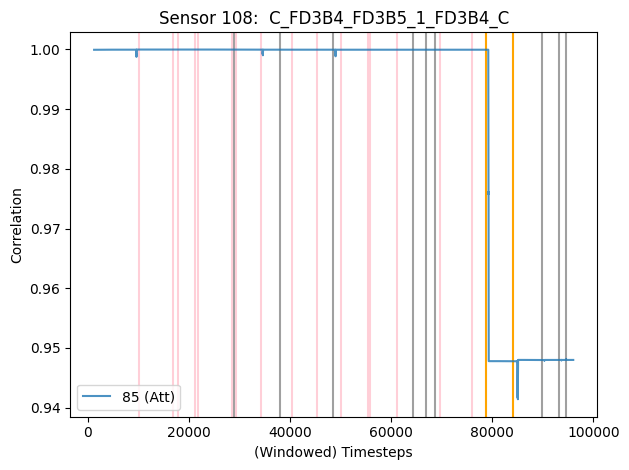

***********************************************************************************************
Sensor 109:  V_FD3B4_AN


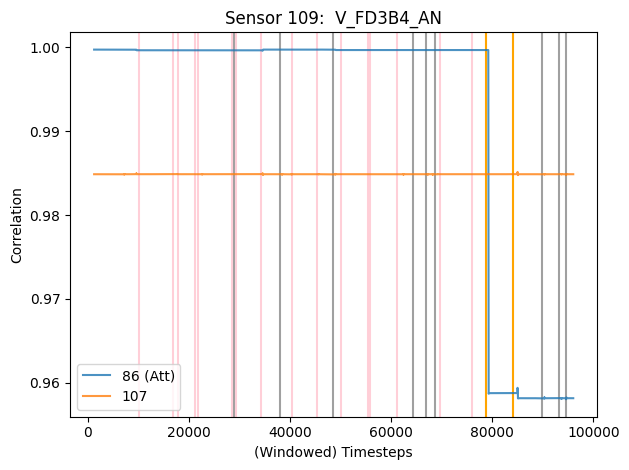

***********************************************************************************************
Sensor 110:  V_FD3B4_BN


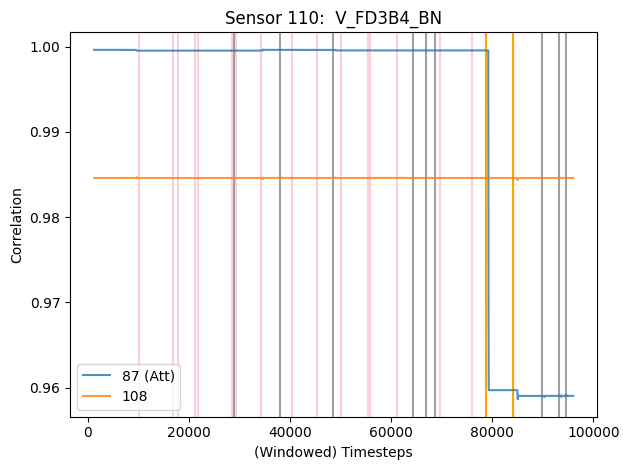

***********************************************************************************************
Sensor 111:  V_FD3B4_CN


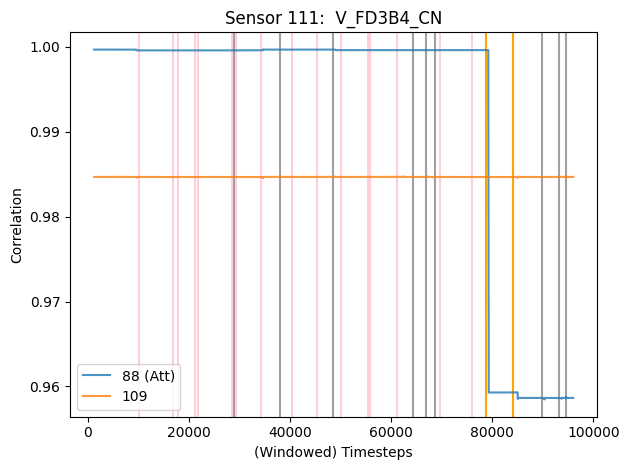

In [ ]:
plot_edge_stats(stat_list=corr_list)

***********************************************************************************************
Sensor 1:  C_W919_W910_1_W910_A


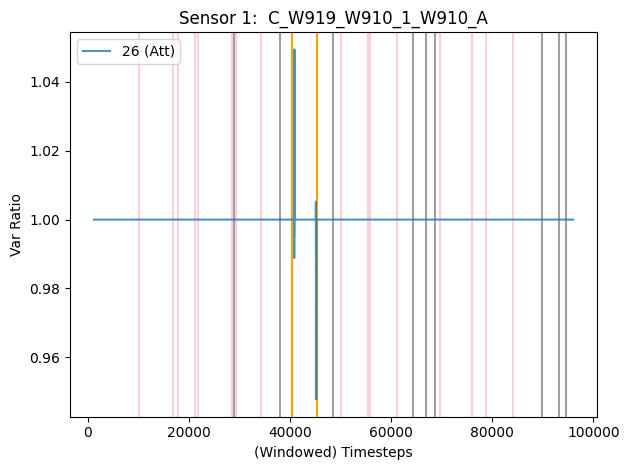

***********************************************************************************************
Sensor 2:  C_W919_W910_1_W910_B


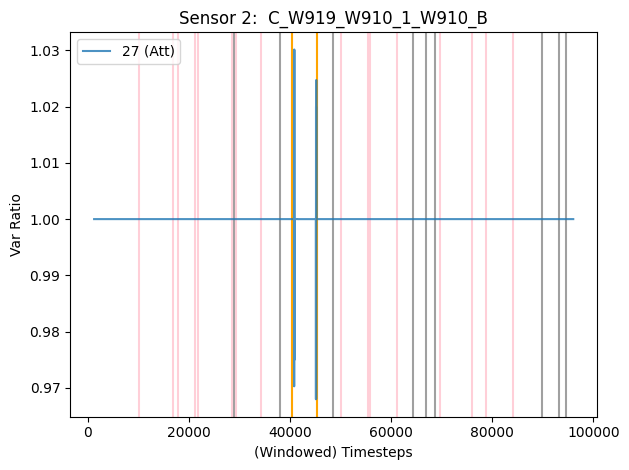

***********************************************************************************************
Sensor 3:  C_W919_W910_1_W910_C


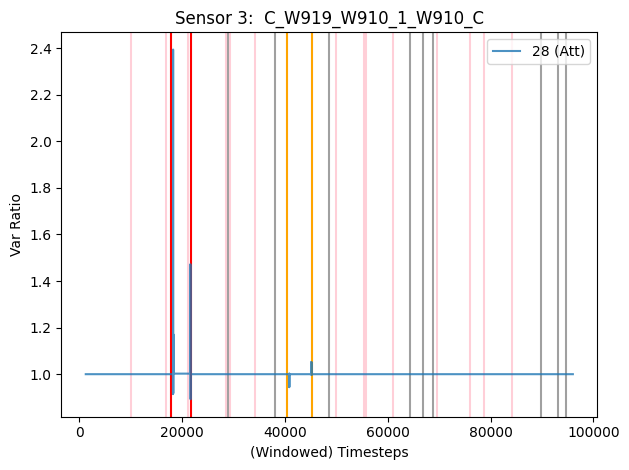

***********************************************************************************************
Sensor 4:  V_W-115KV2_AN


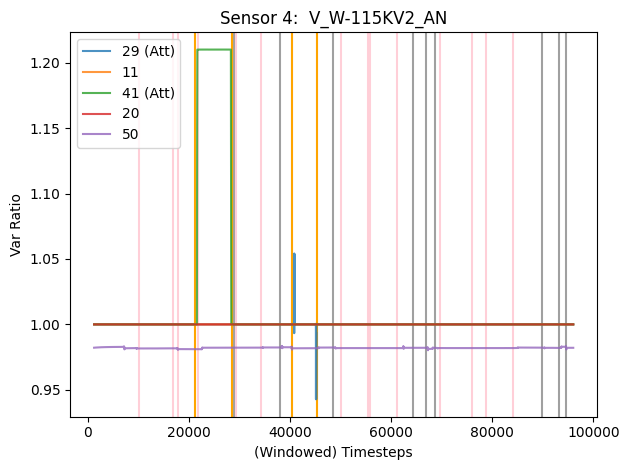

***********************************************************************************************
Sensor 5:  V_W-115KV2_BN


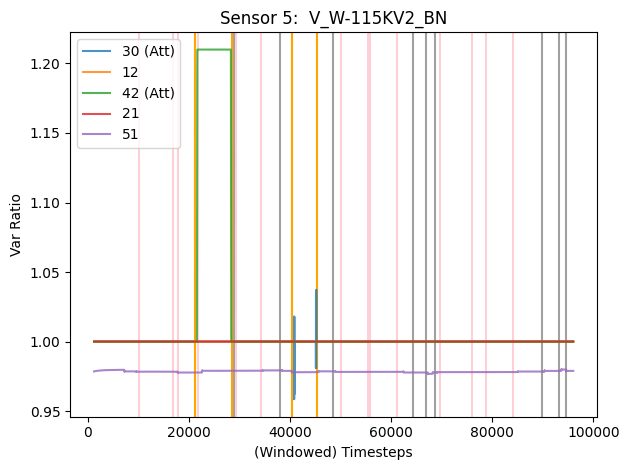

***********************************************************************************************
Sensor 6:  V_W-115KV2_CN


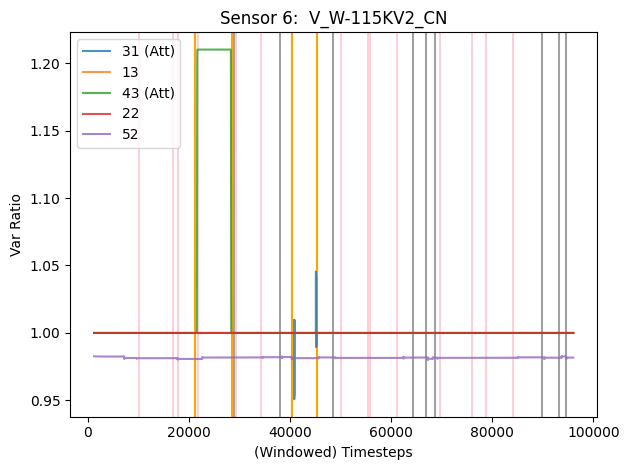

***********************************************************************************************
Sensor 7:  C_W957_W950_1_W950_A


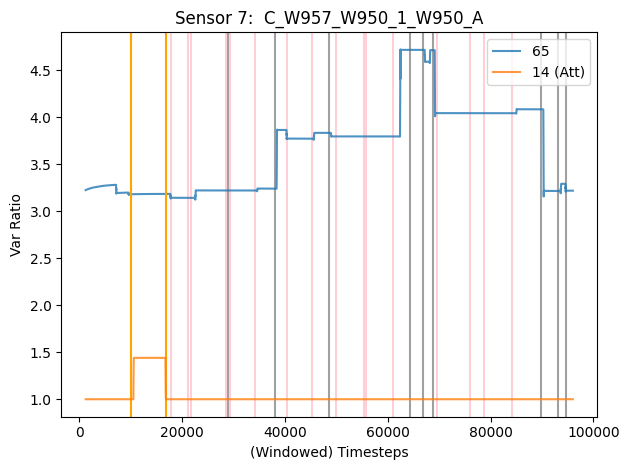

***********************************************************************************************
Sensor 8:  C_W957_W950_1_W950_B


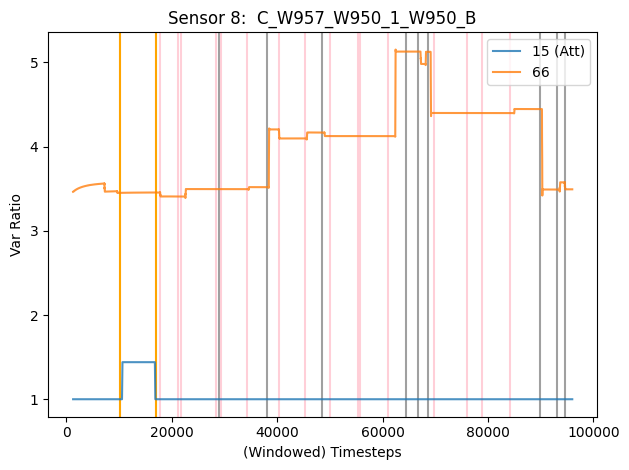

***********************************************************************************************
Sensor 9:  C_W957_W950_1_W950_C


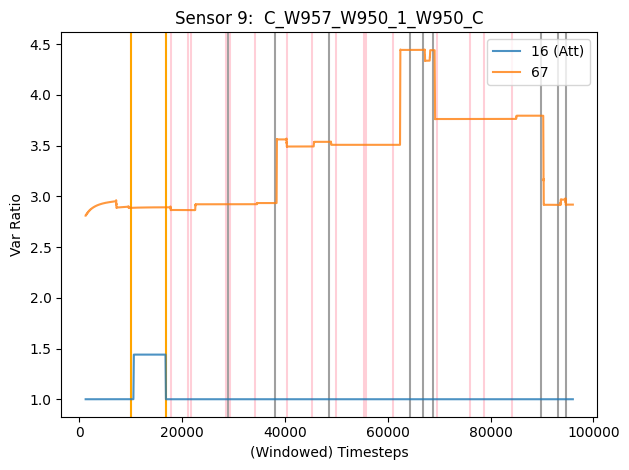

***********************************************************************************************
Sensor 10:  V_W951_AN


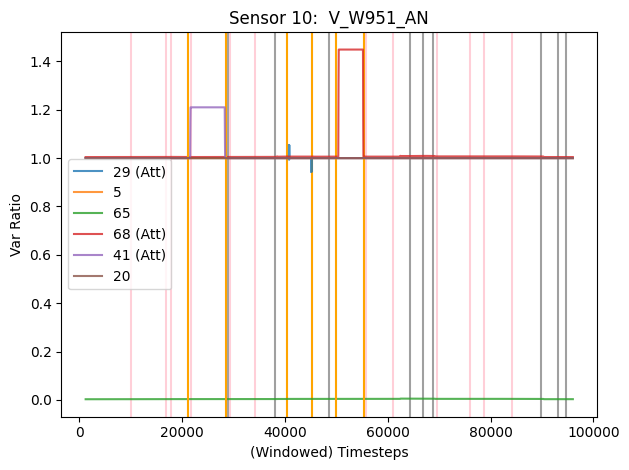

***********************************************************************************************
Sensor 11:  V_W951_BN


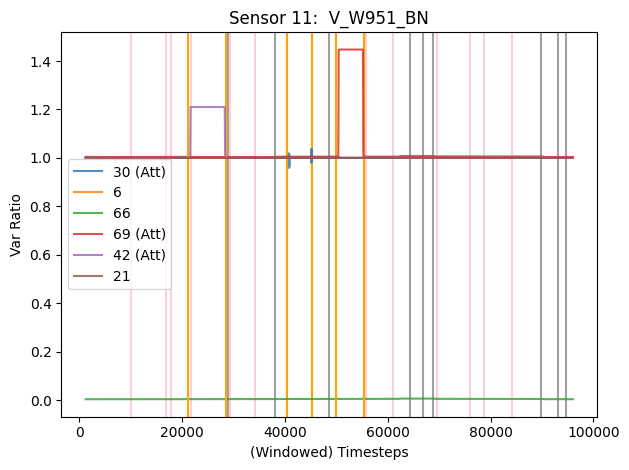

***********************************************************************************************
Sensor 12:  V_W951_CN


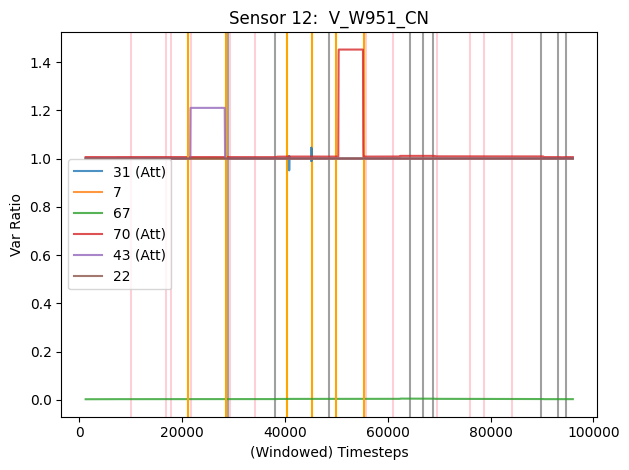

***********************************************************************************************
Sensor 13:  C_W957_W950_1_W957_A


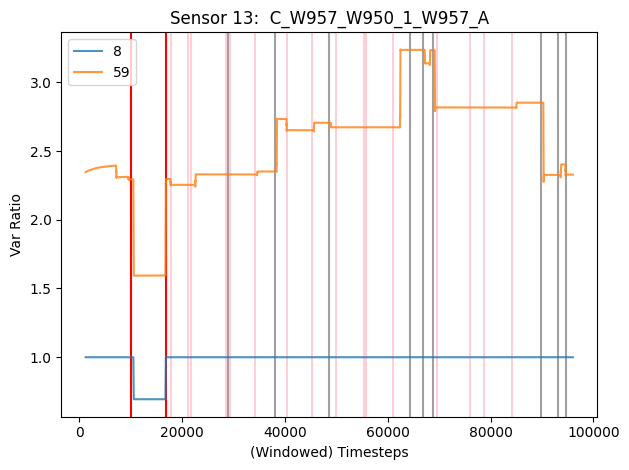

***********************************************************************************************
Sensor 14:  C_W957_W950_1_W957_B


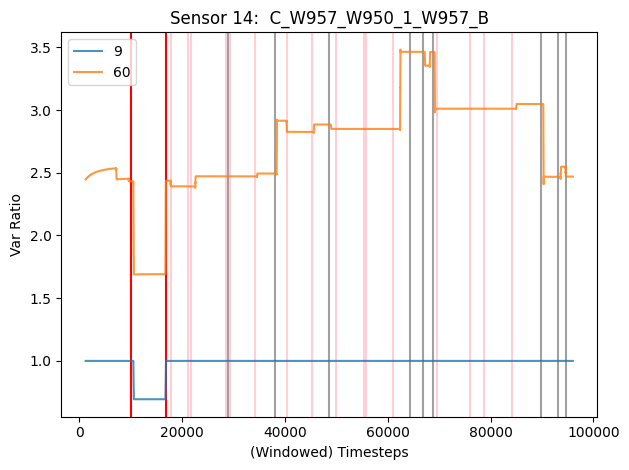

***********************************************************************************************
Sensor 15:  C_W957_W950_1_W957_C


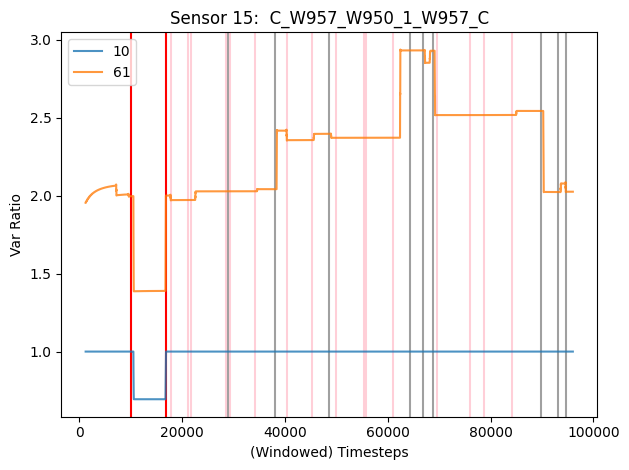

***********************************************************************************************
Sensor 16:  C_W927_W929_1_W929_A


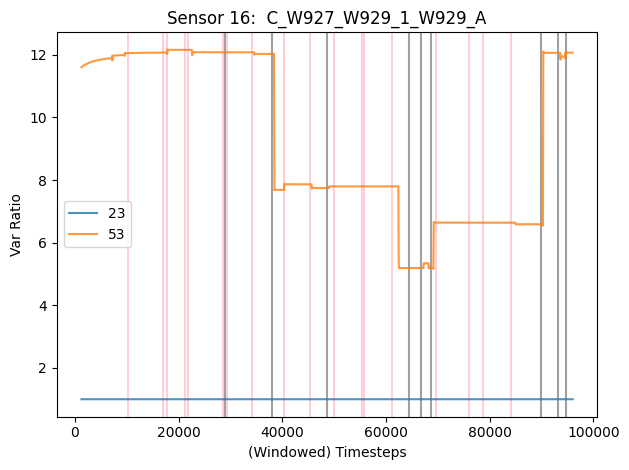

***********************************************************************************************
Sensor 17:  C_W927_W929_1_W929_B


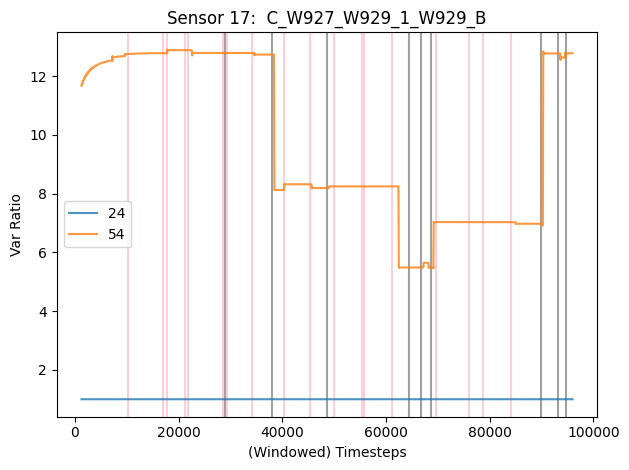

***********************************************************************************************
Sensor 18:  C_W927_W929_1_W929_C


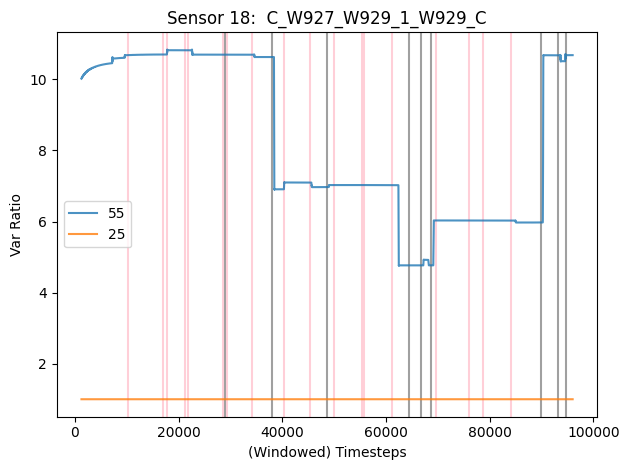

***********************************************************************************************
Sensor 19:  V_W-115KV1_AN


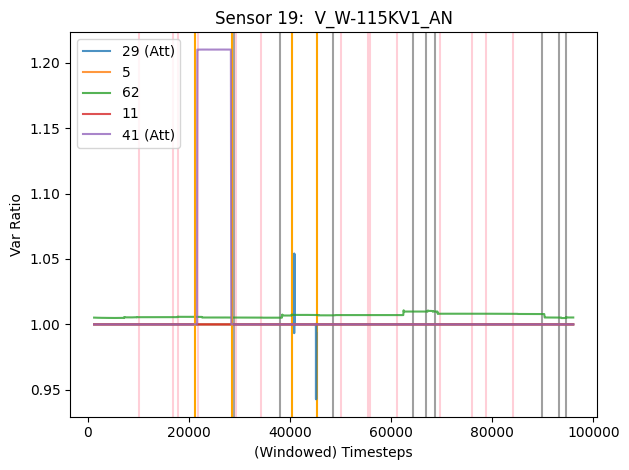

***********************************************************************************************
Sensor 20:  V_W-115KV1_BN


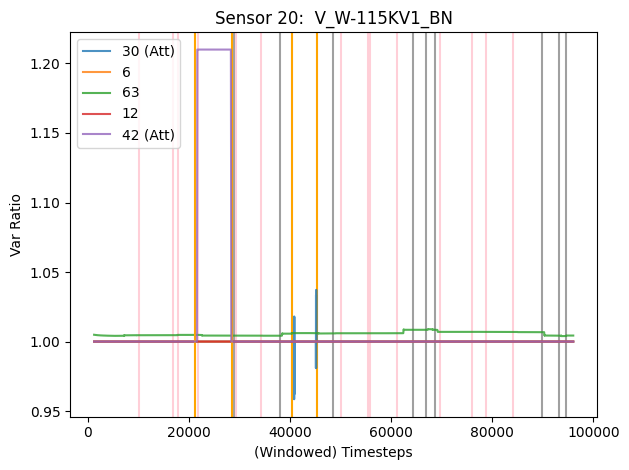

***********************************************************************************************
Sensor 21:  V_W-115KV1_CN


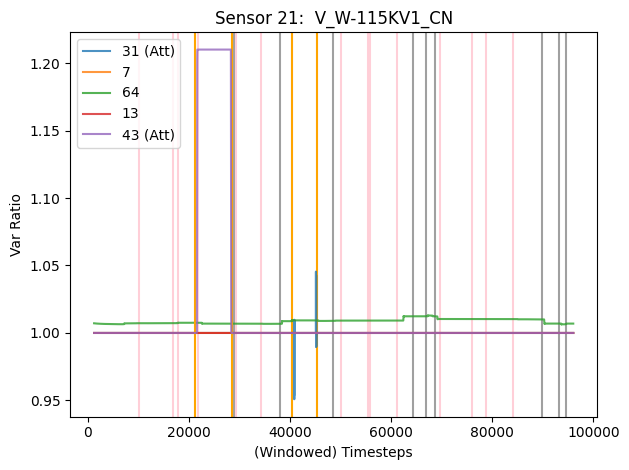

***********************************************************************************************
Sensor 22:  C_W927_W929_1_W927_A


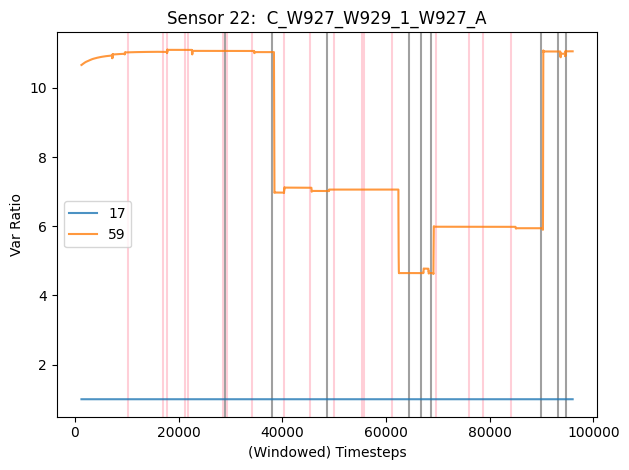

***********************************************************************************************
Sensor 23:  C_W927_W929_1_W927_B


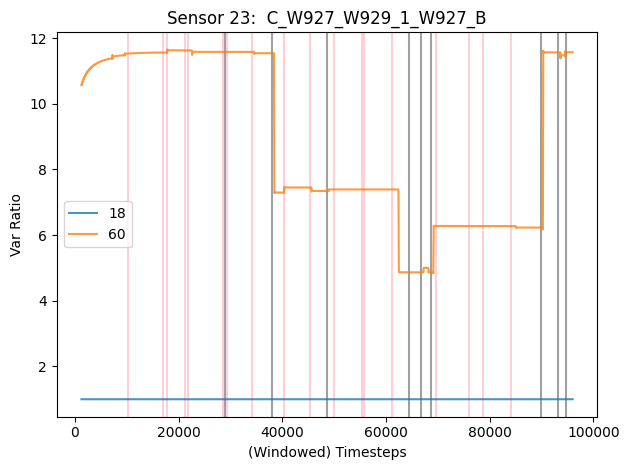

***********************************************************************************************
Sensor 24:  C_W927_W929_1_W927_C


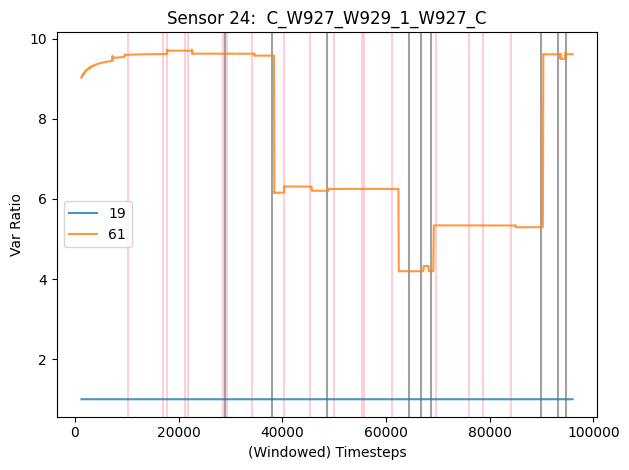

***********************************************************************************************
Sensor 25:  C_W919_W910_1_W919_A


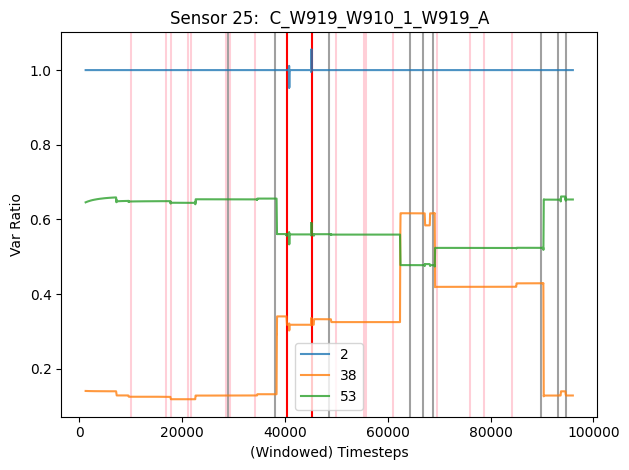

***********************************************************************************************
Sensor 26:  C_W919_W910_1_W919_B


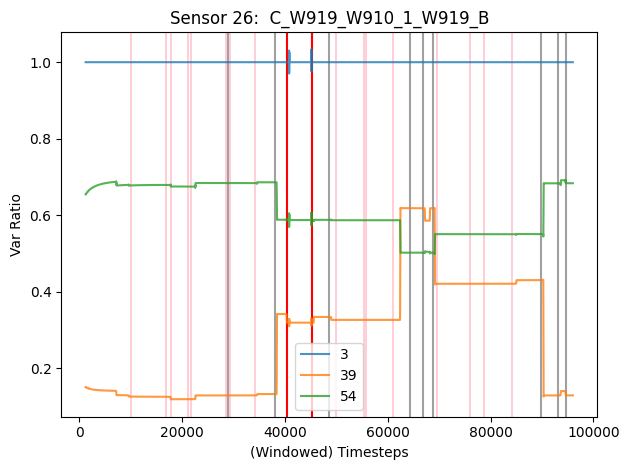

***********************************************************************************************
Sensor 27:  C_W919_W910_1_W919_C


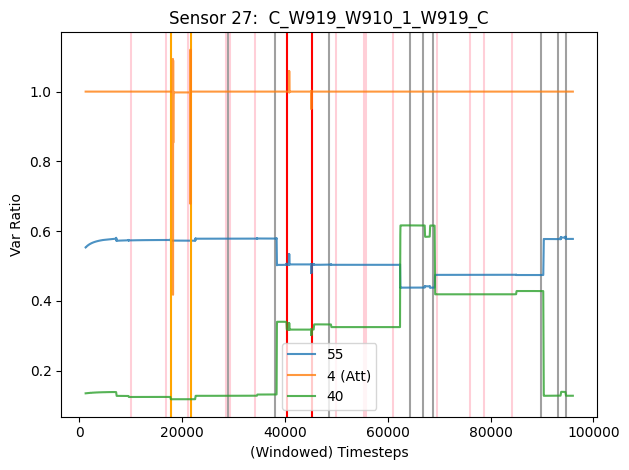

***********************************************************************************************
Sensor 28:  V_W911_AN


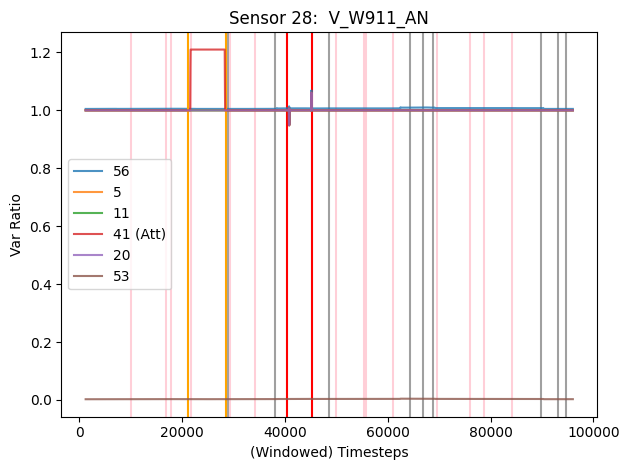

***********************************************************************************************
Sensor 29:  V_W911_BN


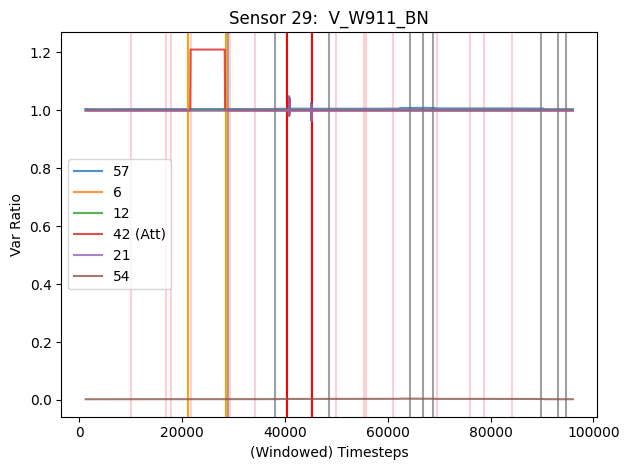

***********************************************************************************************
Sensor 30:  V_W911_CN


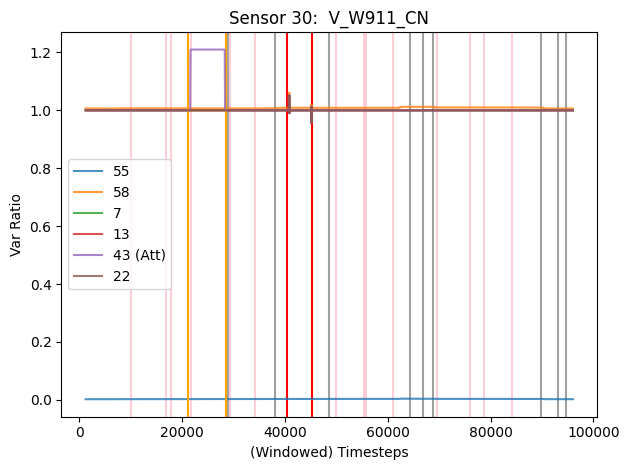

***********************************************************************************************
Sensor 31:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


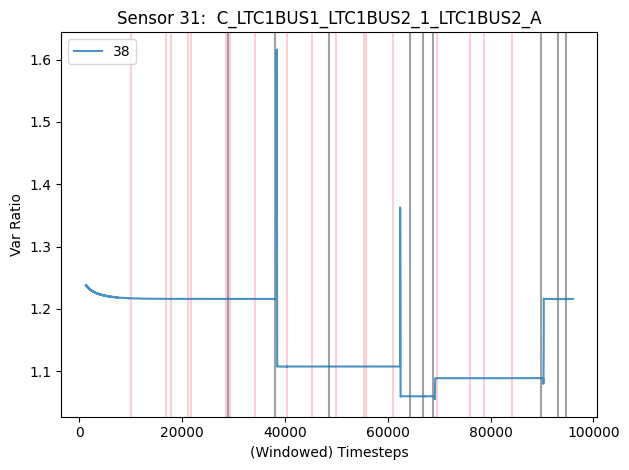

***********************************************************************************************
Sensor 32:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B


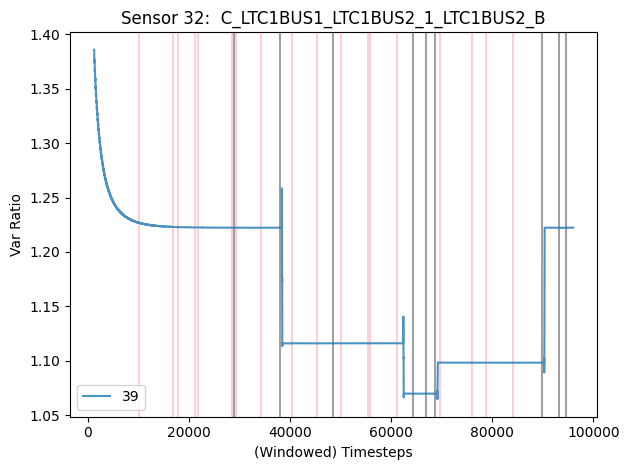

***********************************************************************************************
Sensor 33:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


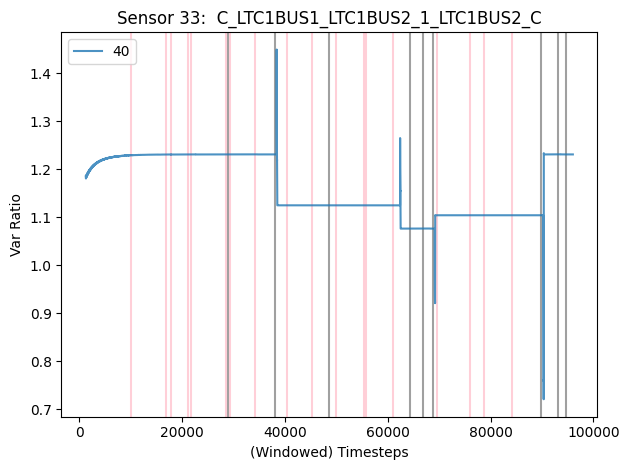

***********************************************************************************************
Sensor 34:  V_BUS13KV1_AN


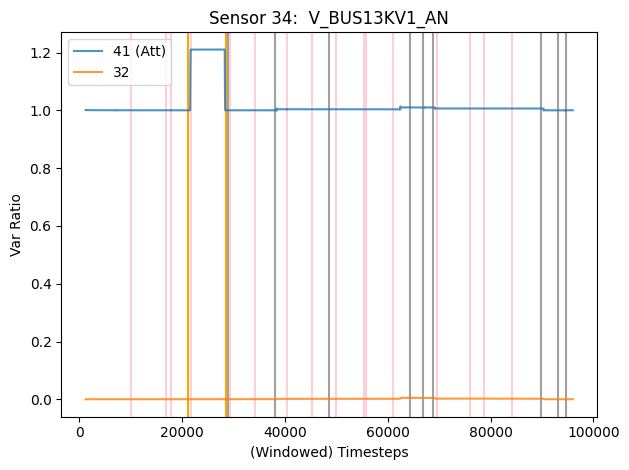

***********************************************************************************************
Sensor 35:  V_BUS13KV1_BN


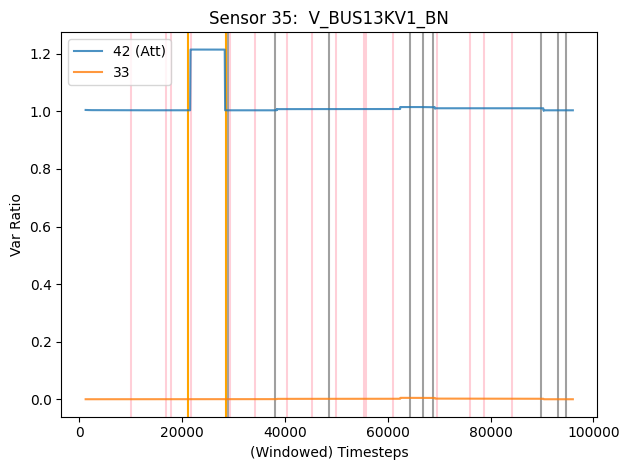

***********************************************************************************************
Sensor 36:  V_BUS13KV1_CN


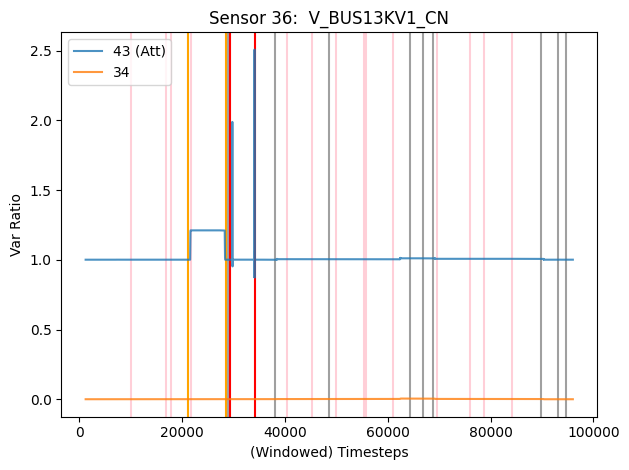

***********************************************************************************************
Sensor 37:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


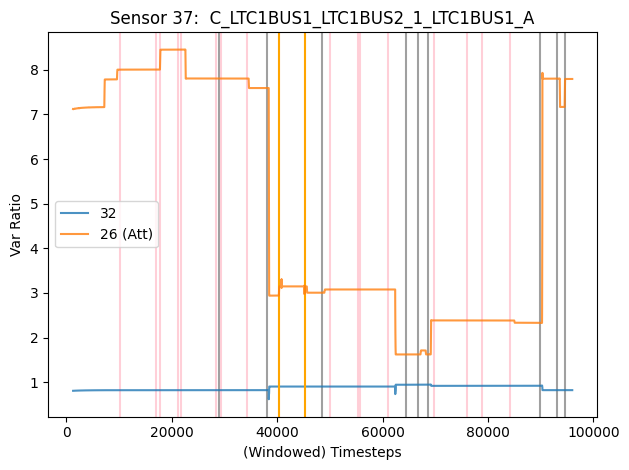

***********************************************************************************************
Sensor 38:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B


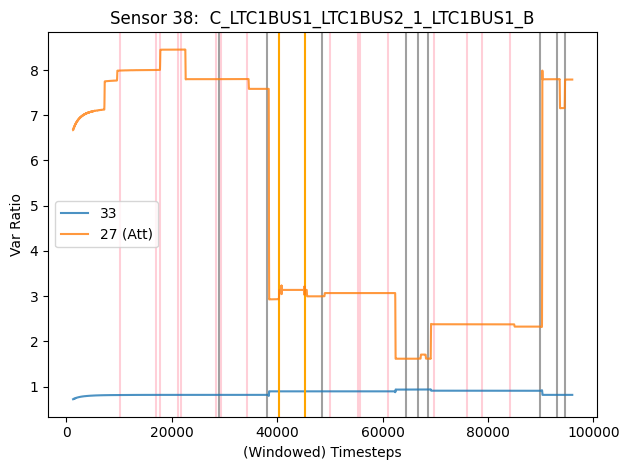

***********************************************************************************************
Sensor 39:  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


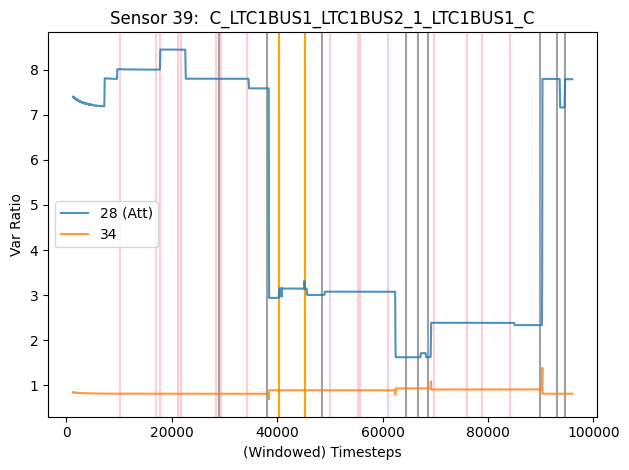

***********************************************************************************************
Sensor 40:  V_W9111_AN


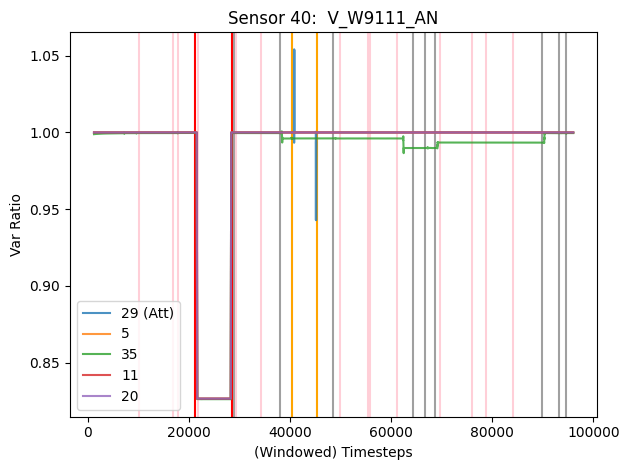

***********************************************************************************************
Sensor 41:  V_W9111_BN


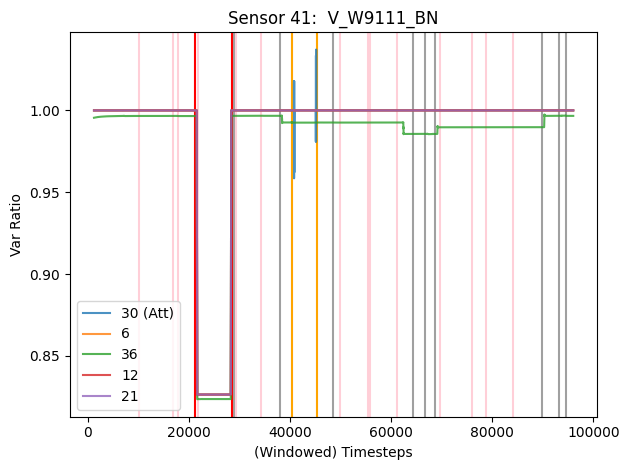

***********************************************************************************************
Sensor 42:  V_W9111_CN


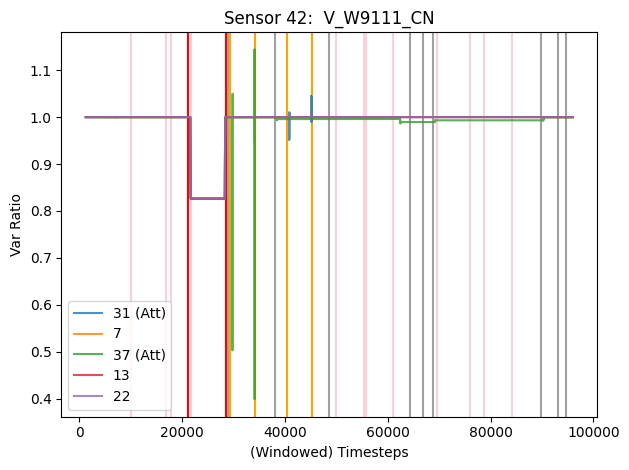

***********************************************************************************************
Sensor 43:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A


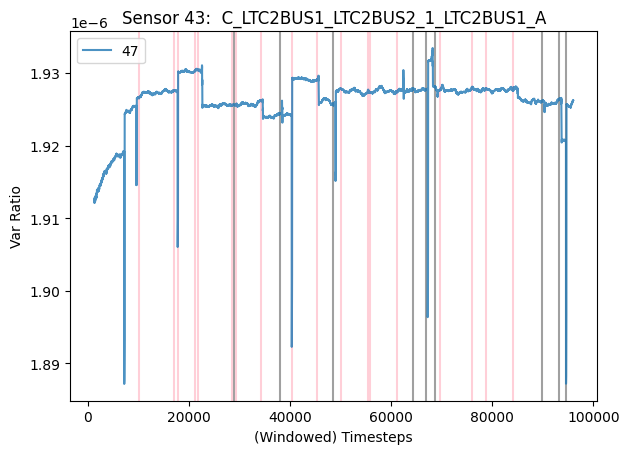

***********************************************************************************************
Sensor 44:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B


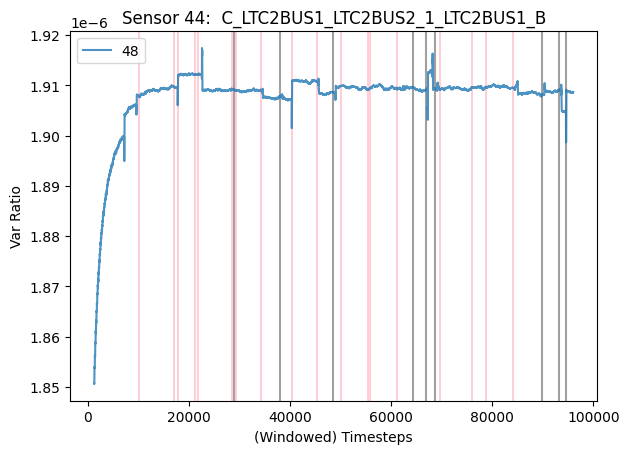

***********************************************************************************************
Sensor 45:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C


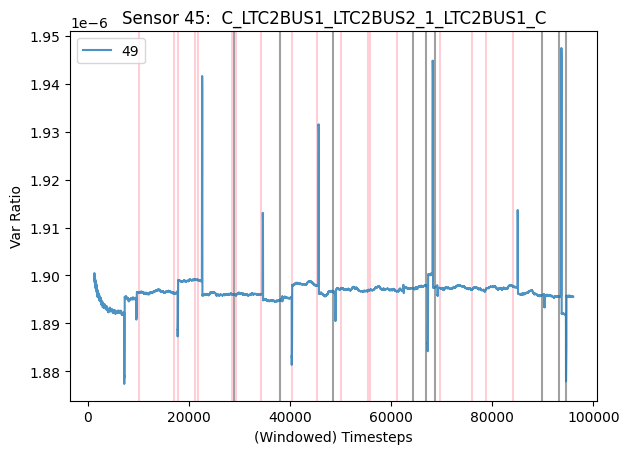

***********************************************************************************************
Sensor 46:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A


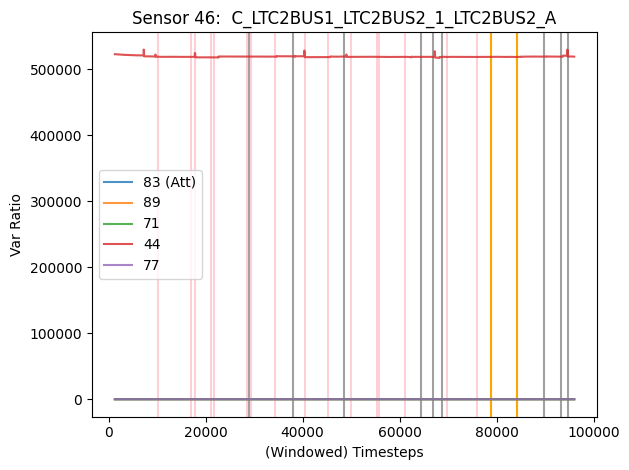

***********************************************************************************************
Sensor 47:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B


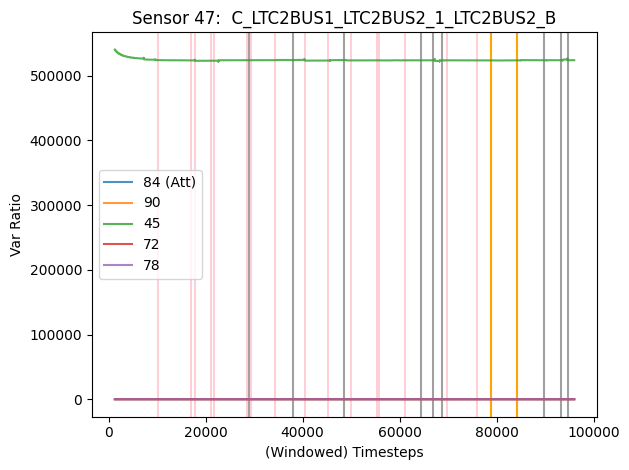

***********************************************************************************************
Sensor 48:  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C


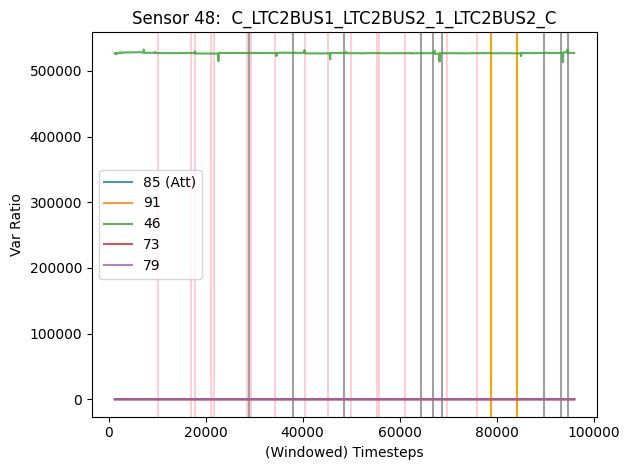

***********************************************************************************************
Sensor 49:  V_BUS13KV2_AN


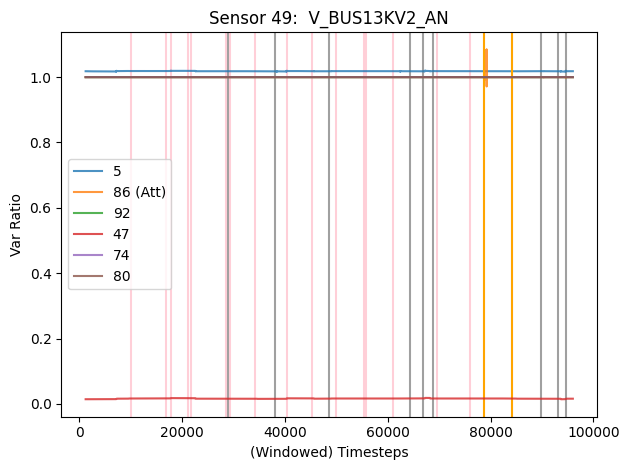

***********************************************************************************************
Sensor 50:  V_BUS13KV2_BN


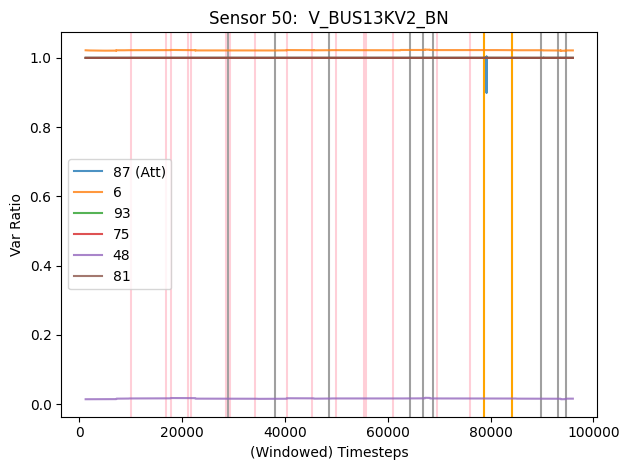

***********************************************************************************************
Sensor 51:  V_BUS13KV2_CN


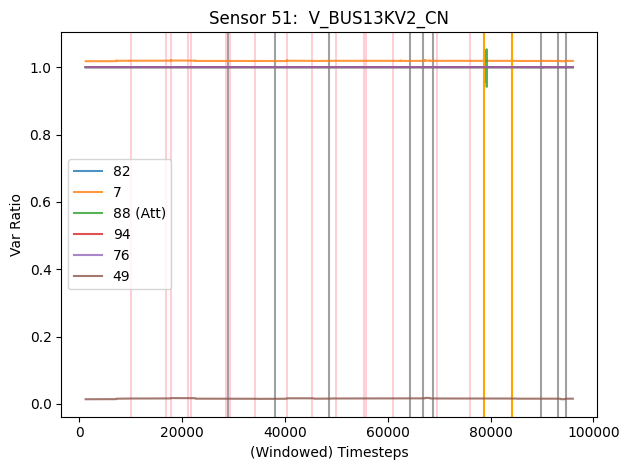

***********************************************************************************************
Sensor 52:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_A


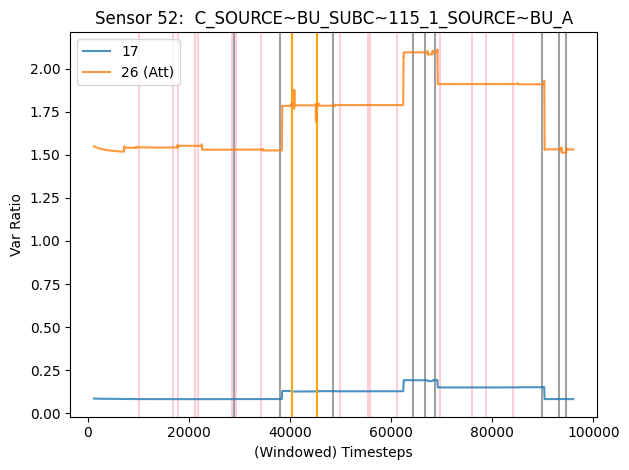

***********************************************************************************************
Sensor 53:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_B


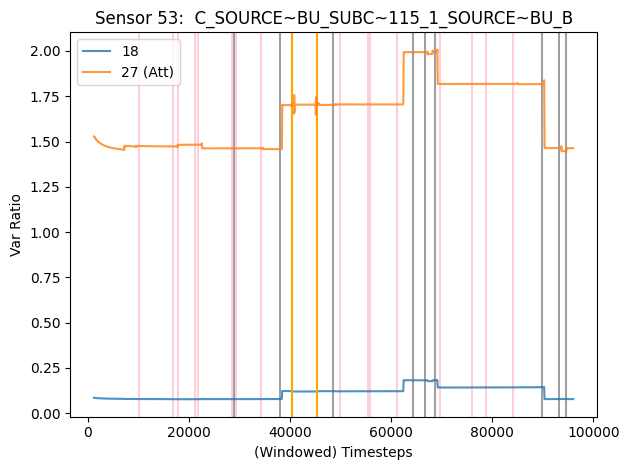

***********************************************************************************************
Sensor 54:  C_SOURCE~BU_SUBC~115_1_SOURCE~BU_C


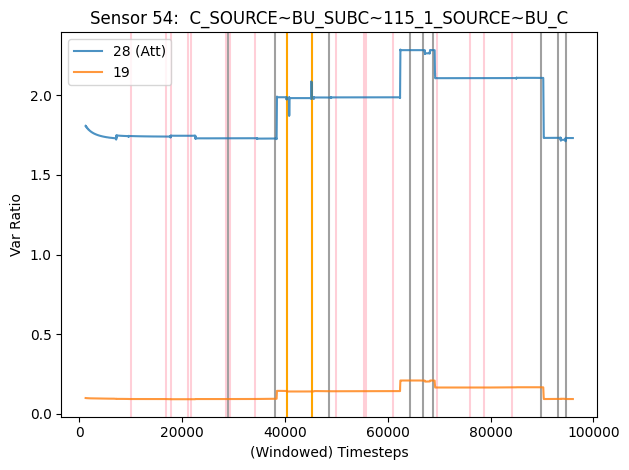

***********************************************************************************************
Sensor 55:  V_SOURCE-BU_AN


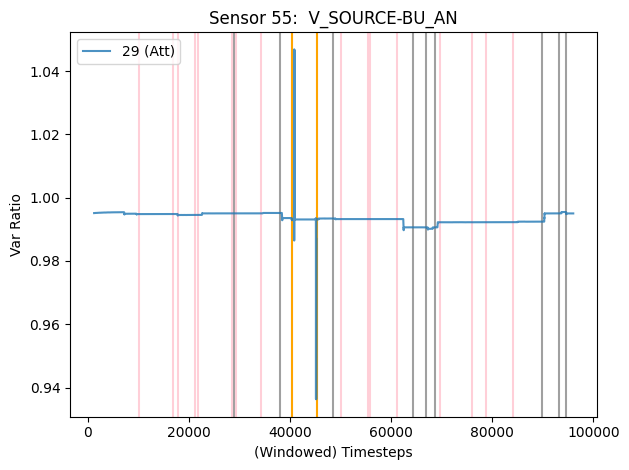

***********************************************************************************************
Sensor 56:  V_SOURCE-BU_BN


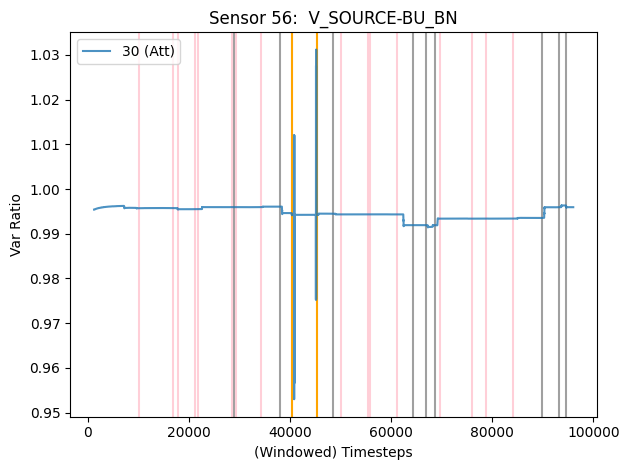

***********************************************************************************************
Sensor 57:  V_SOURCE-BU_CN


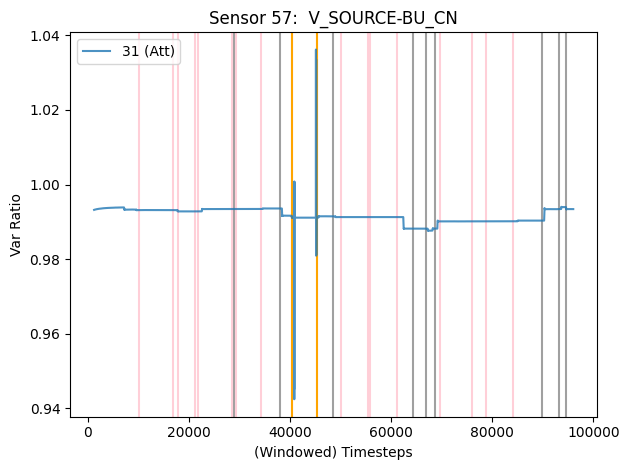

***********************************************************************************************
Sensor 58:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_A


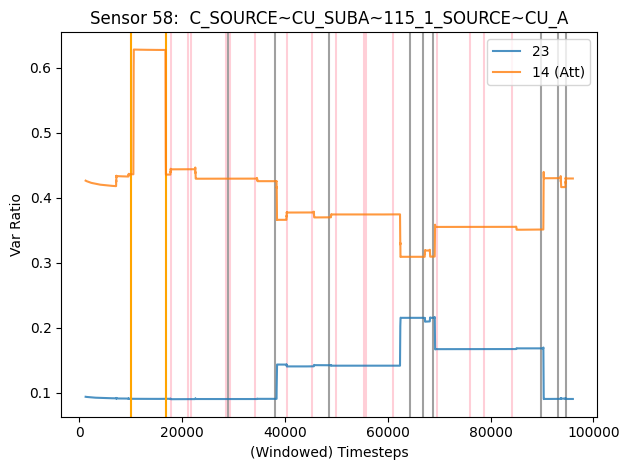

***********************************************************************************************
Sensor 59:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_B


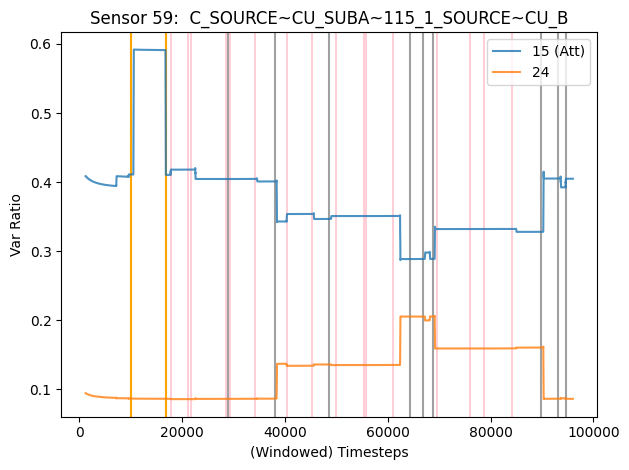

***********************************************************************************************
Sensor 60:  C_SOURCE~CU_SUBA~115_1_SOURCE~CU_C


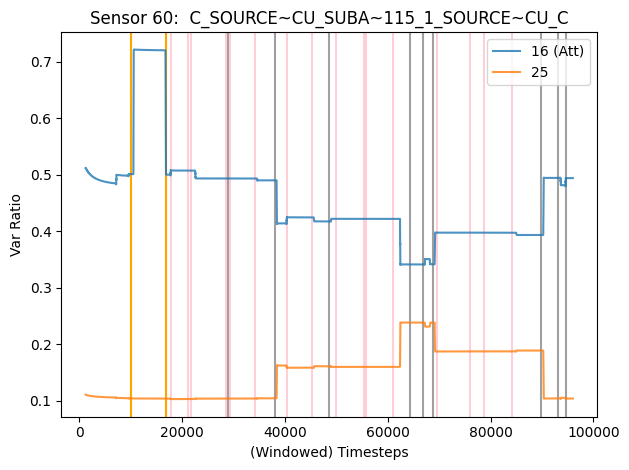

***********************************************************************************************
Sensor 61:  V_SOURCE-CU_AN


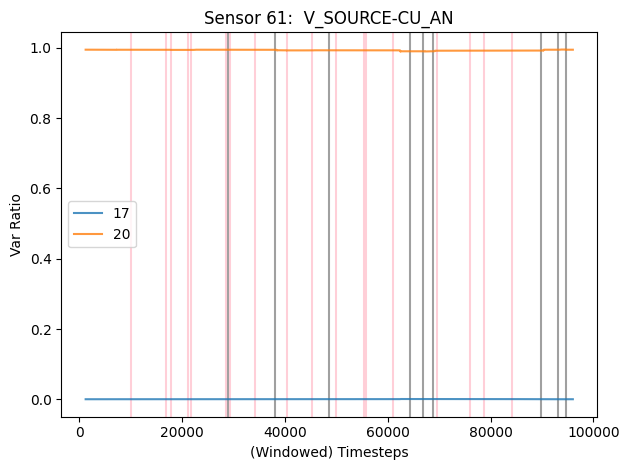

***********************************************************************************************
Sensor 62:  V_SOURCE-CU_BN


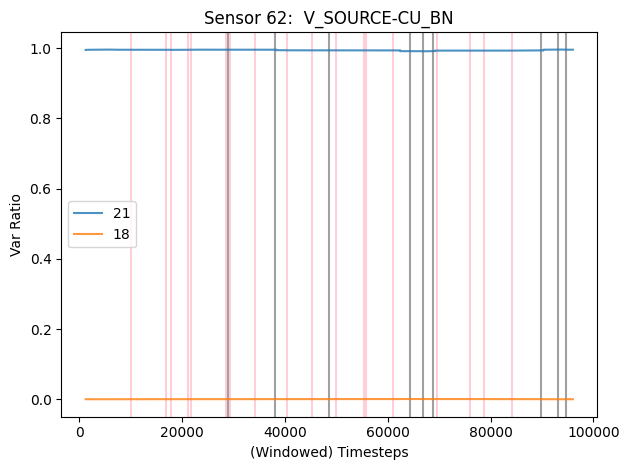

***********************************************************************************************
Sensor 63:  V_SOURCE-CU_CN


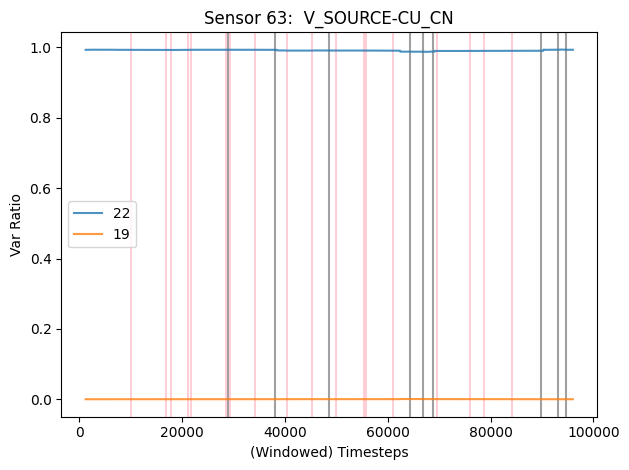

***********************************************************************************************
Sensor 64:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_A


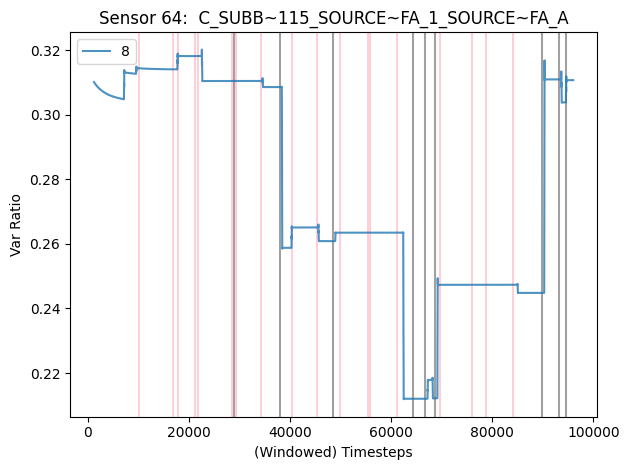

***********************************************************************************************
Sensor 65:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_B


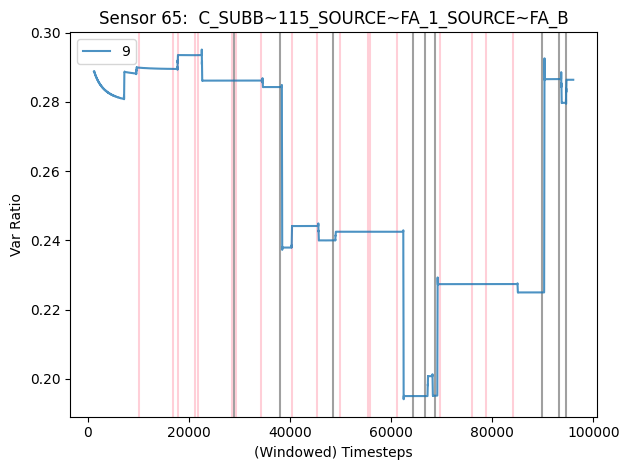

***********************************************************************************************
Sensor 66:  C_SUBB~115_SOURCE~FA_1_SOURCE~FA_C


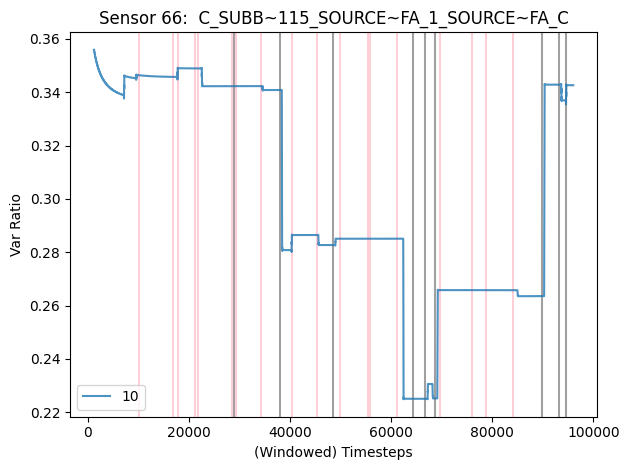

***********************************************************************************************
Sensor 67:  V_SOURCE-FA_AN


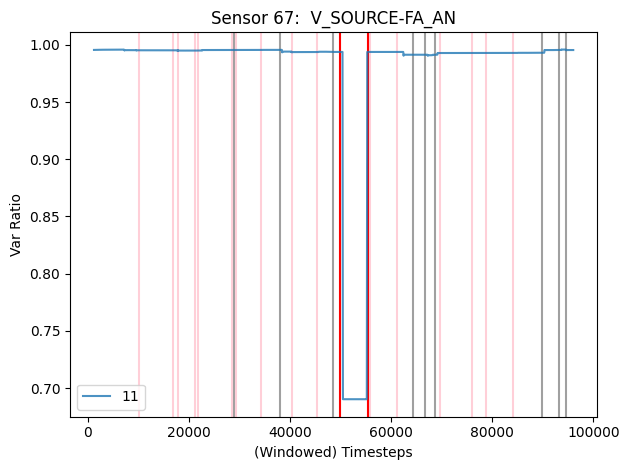

***********************************************************************************************
Sensor 68:  V_SOURCE-FA_BN


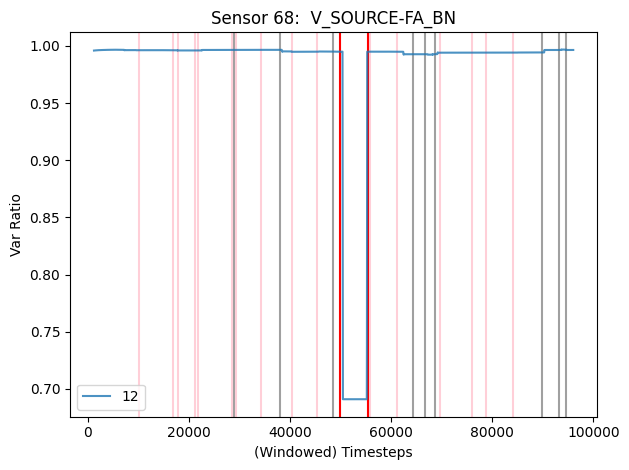

***********************************************************************************************
Sensor 69:  V_SOURCE-FA_CN


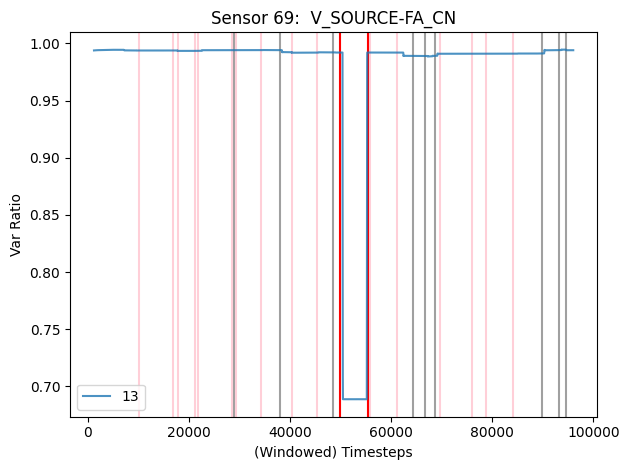

***********************************************************************************************
Sensor 70:  C_W738_W737_2_W737_A


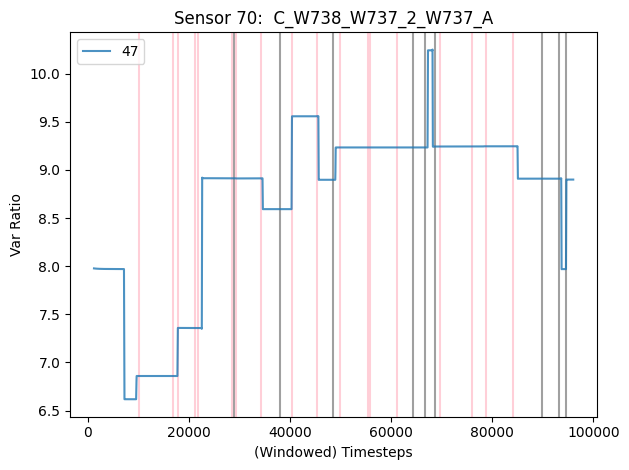

***********************************************************************************************
Sensor 71:  C_W738_W737_2_W737_B


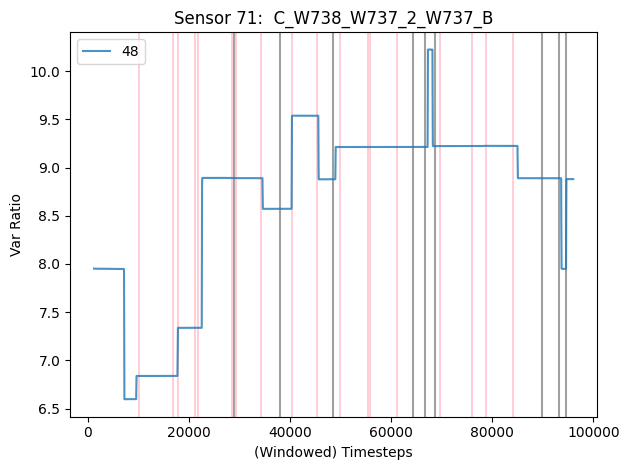

***********************************************************************************************
Sensor 72:  C_W738_W737_2_W737_C


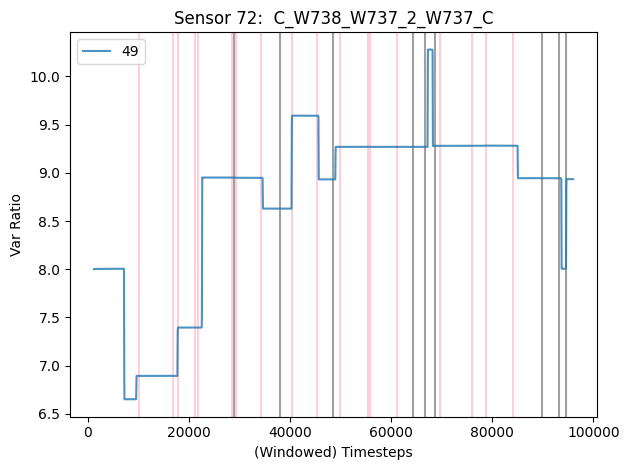

***********************************************************************************************
Sensor 73:  V_W738_AN


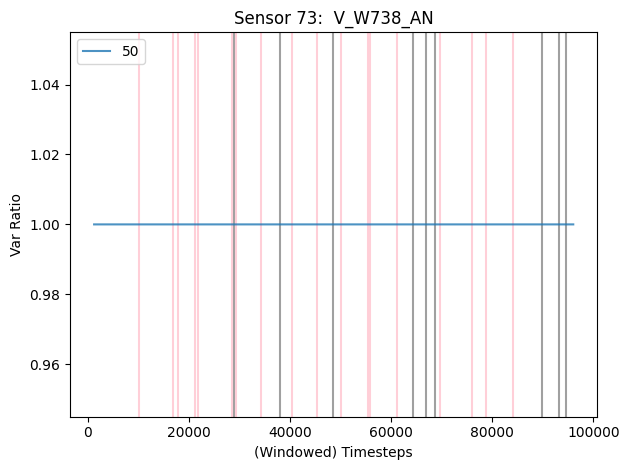

***********************************************************************************************
Sensor 74:  V_W738_BN


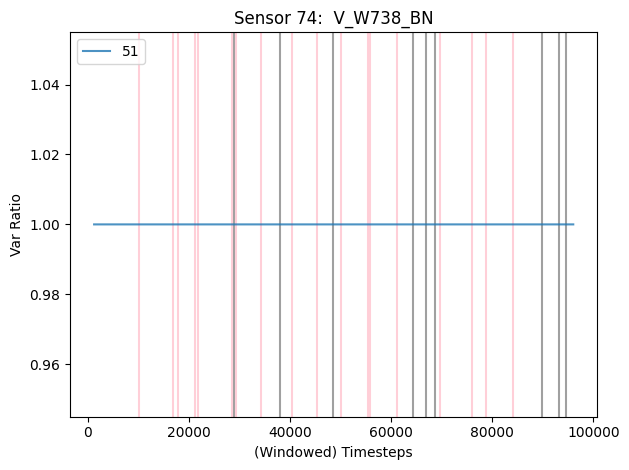

***********************************************************************************************
Sensor 75:  V_W738_CN


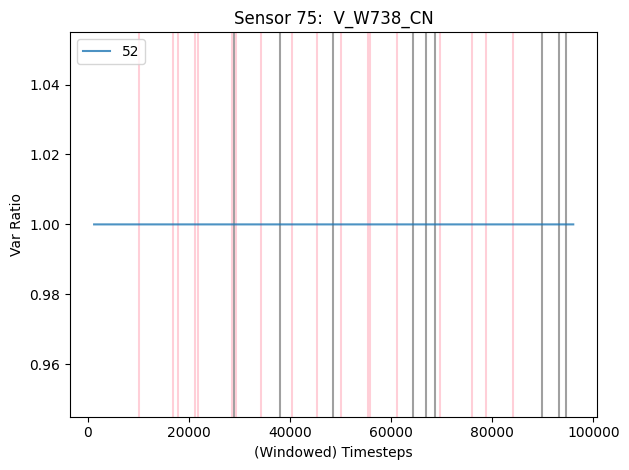

***********************************************************************************************
Sensor 76:  C_W747_W748_2_W747_A


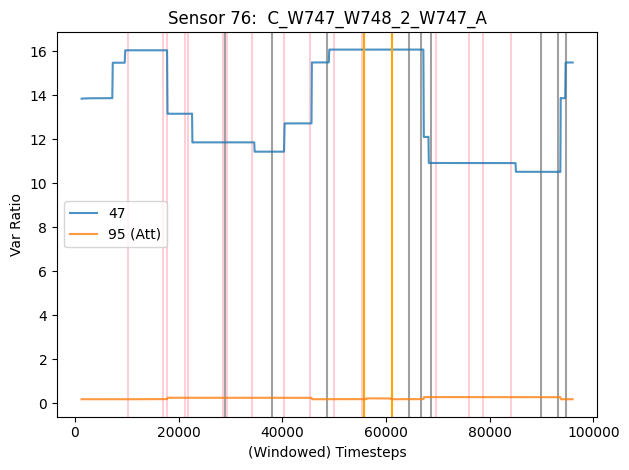

***********************************************************************************************
Sensor 77:  C_W747_W748_2_W747_B


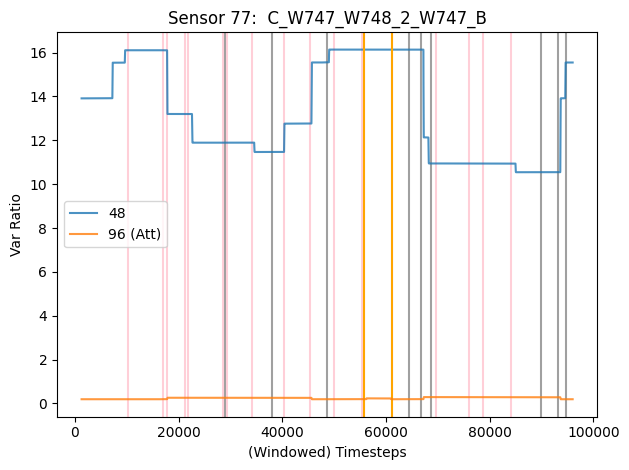

***********************************************************************************************
Sensor 78:  C_W747_W748_2_W747_C


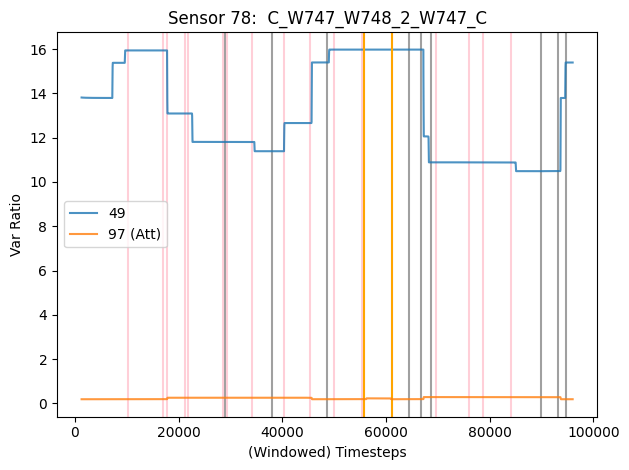

***********************************************************************************************
Sensor 79:  V_W748_AN


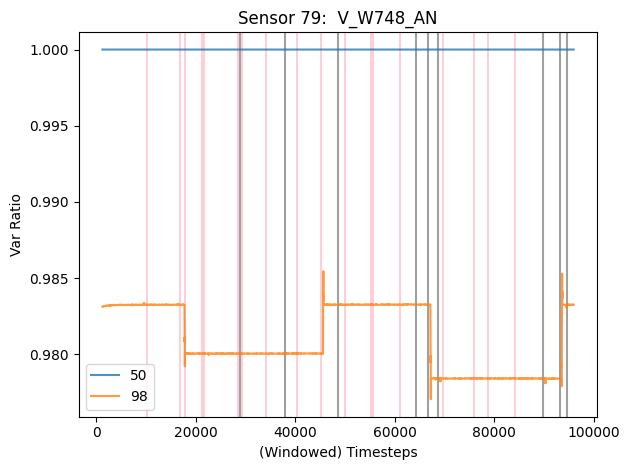

***********************************************************************************************
Sensor 80:  V_W748_BN


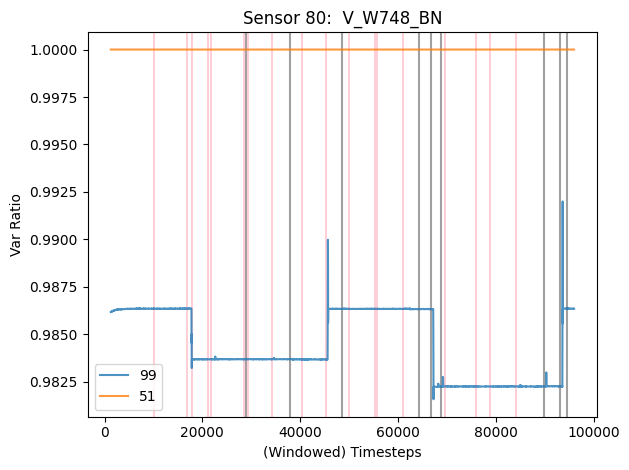

***********************************************************************************************
Sensor 81:  V_W748_CN


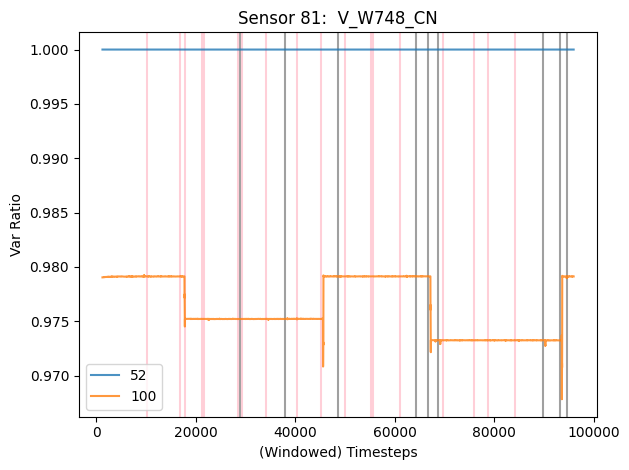

***********************************************************************************************
Sensor 82:  C_W787_W788_2_W787_A


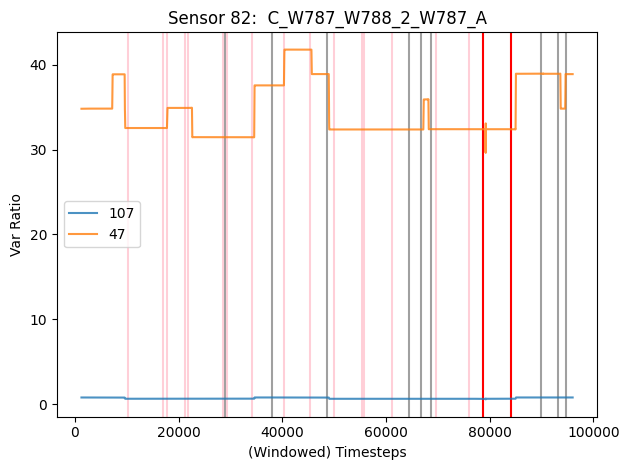

***********************************************************************************************
Sensor 83:  C_W787_W788_2_W787_B


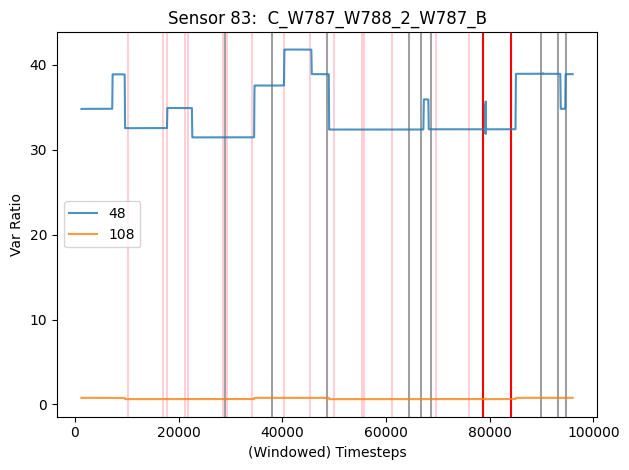

***********************************************************************************************
Sensor 84:  C_W787_W788_2_W787_C


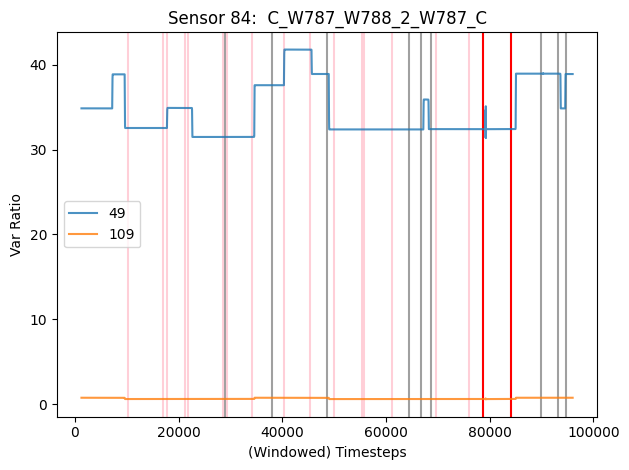

***********************************************************************************************
Sensor 85:  V_W788_AN


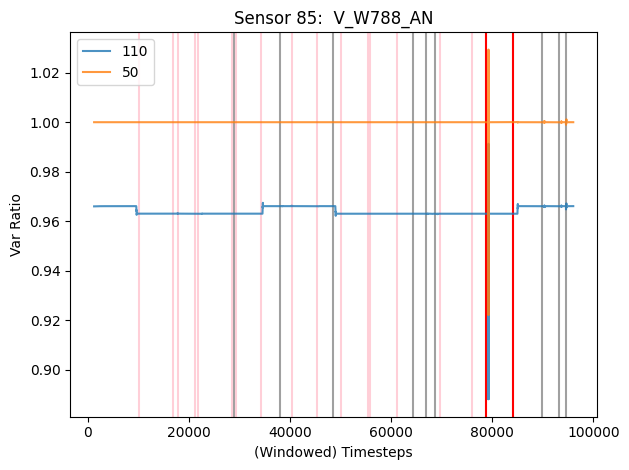

***********************************************************************************************
Sensor 86:  V_W788_BN


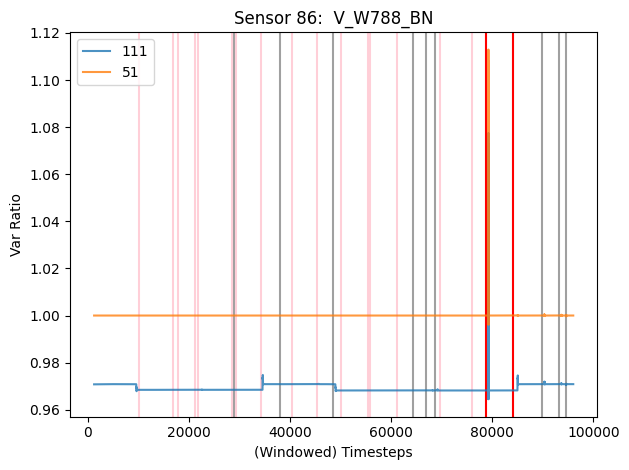

***********************************************************************************************
Sensor 87:  V_W788_CN


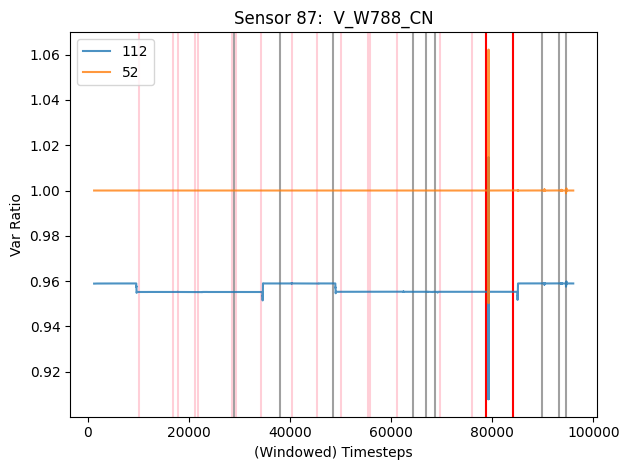

***********************************************************************************************
Sensor 88:  C_W797_W798_2_W797_A


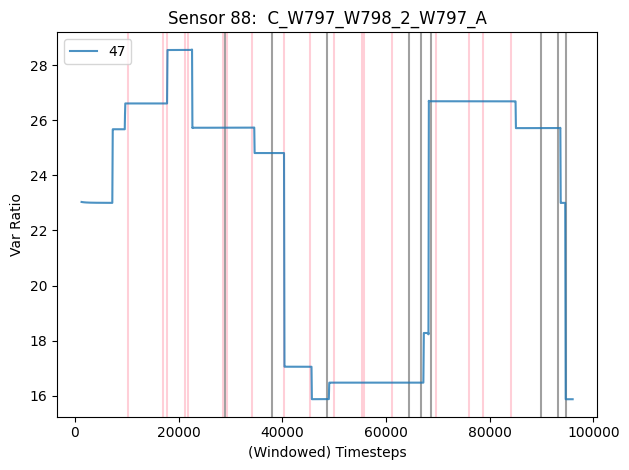

***********************************************************************************************
Sensor 89:  C_W797_W798_2_W797_B


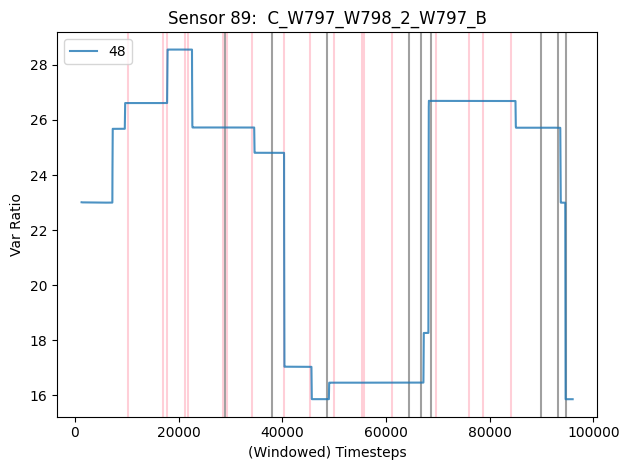

***********************************************************************************************
Sensor 90:  C_W797_W798_2_W797_C


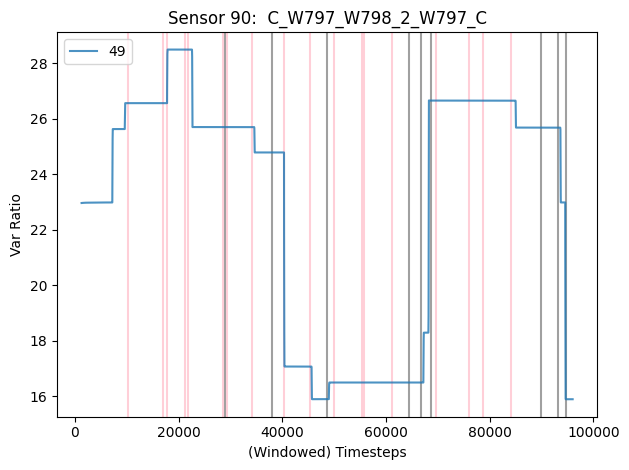

***********************************************************************************************
Sensor 91:  V_W798_AN


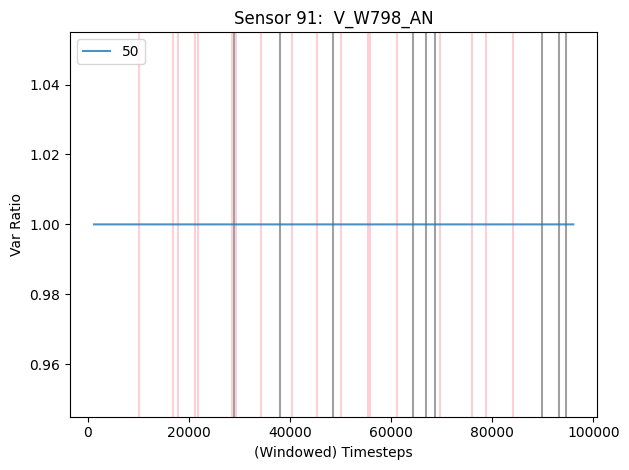

***********************************************************************************************
Sensor 92:  V_W798_BN


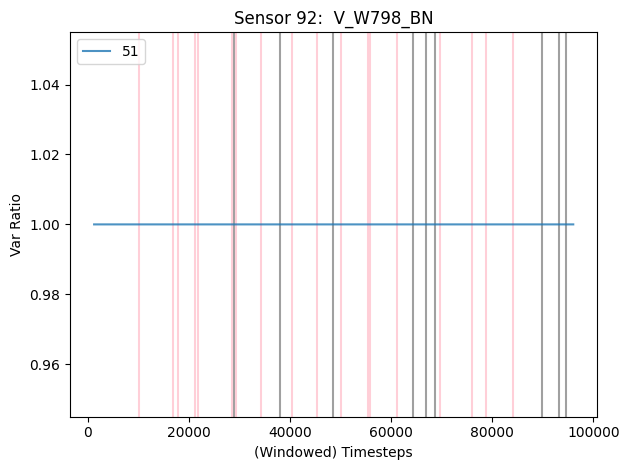

***********************************************************************************************
Sensor 93:  V_W798_CN


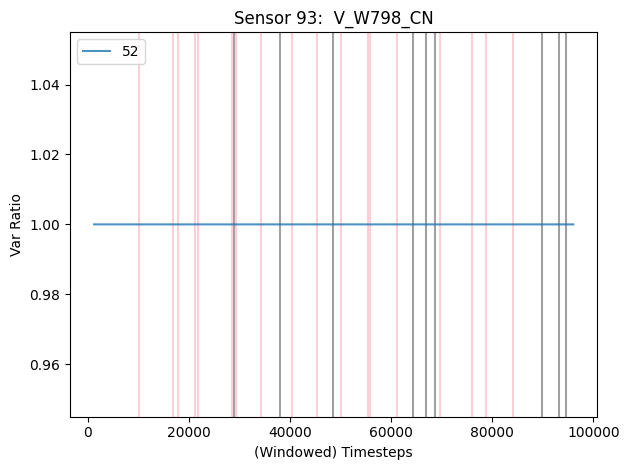

***********************************************************************************************
Sensor 94:  C_FD2B2_FD2B1_1_FD2B1_A


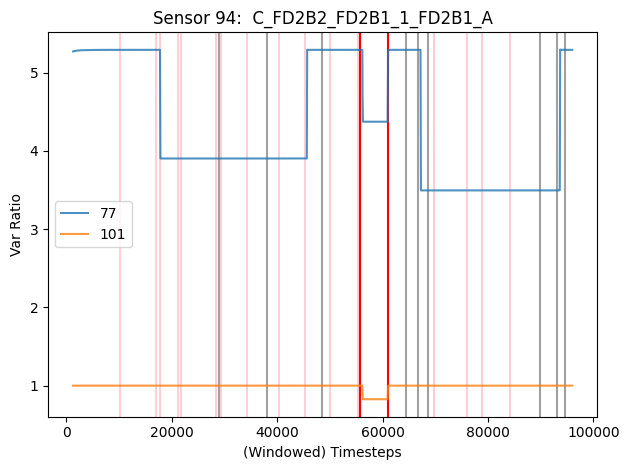

***********************************************************************************************
Sensor 95:  C_FD2B2_FD2B1_1_FD2B1_B


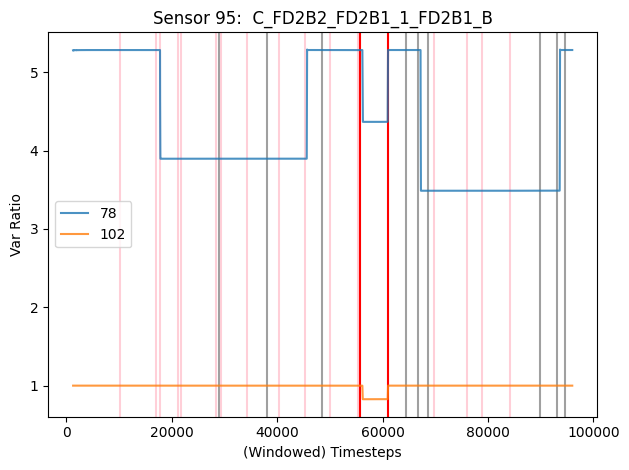

***********************************************************************************************
Sensor 96:  C_FD2B2_FD2B1_1_FD2B1_C


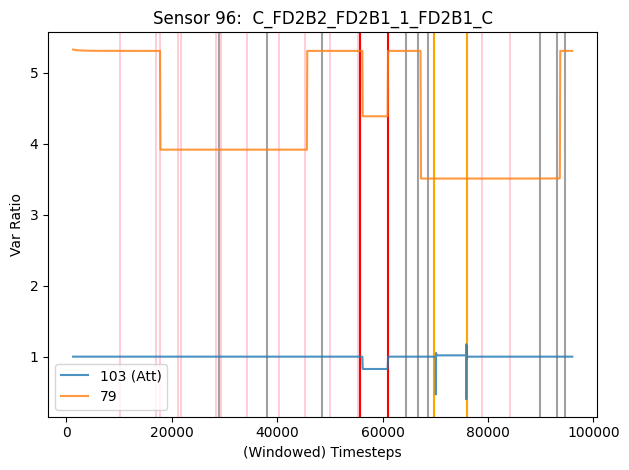

***********************************************************************************************
Sensor 97:  V_FD2B1_AN


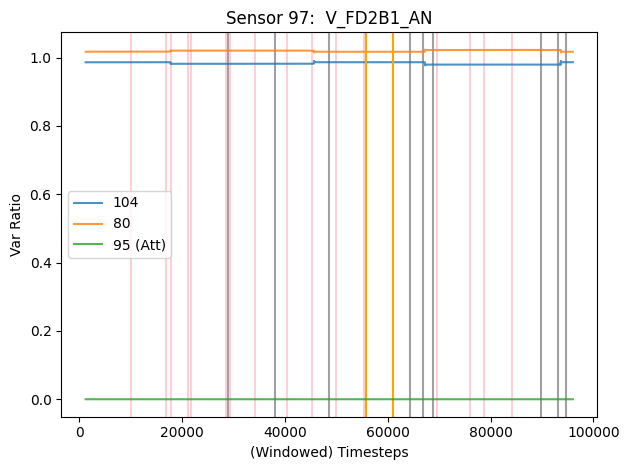

***********************************************************************************************
Sensor 98:  V_FD2B1_BN


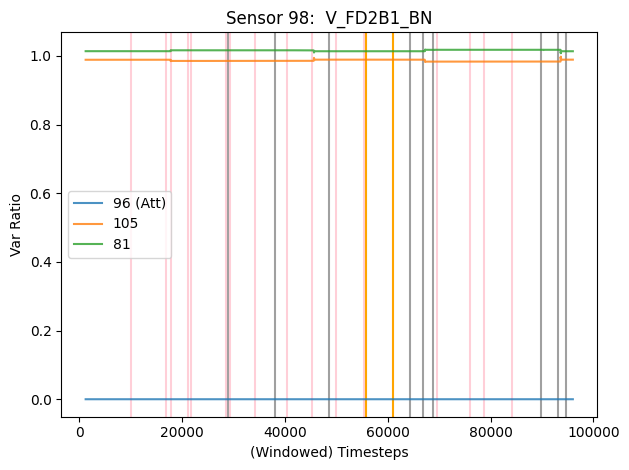

***********************************************************************************************
Sensor 99:  V_FD2B1_CN


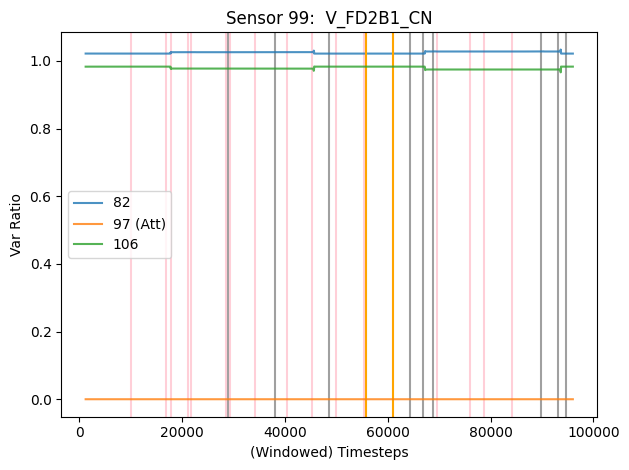

***********************************************************************************************
Sensor 100:  C_FD2B5_FD2B6_1_FD2B5_A


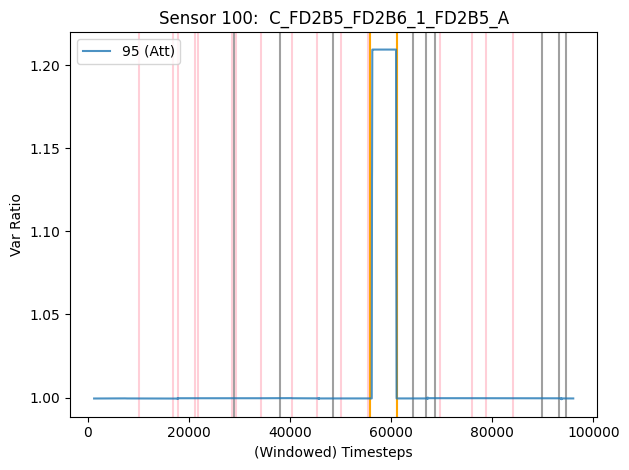

***********************************************************************************************
Sensor 101:  C_FD2B5_FD2B6_1_FD2B5_B


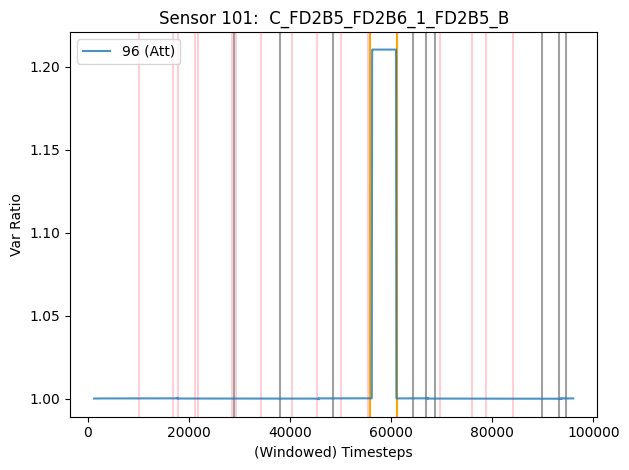

***********************************************************************************************
Sensor 102:  C_FD2B5_FD2B6_1_FD2B5_C


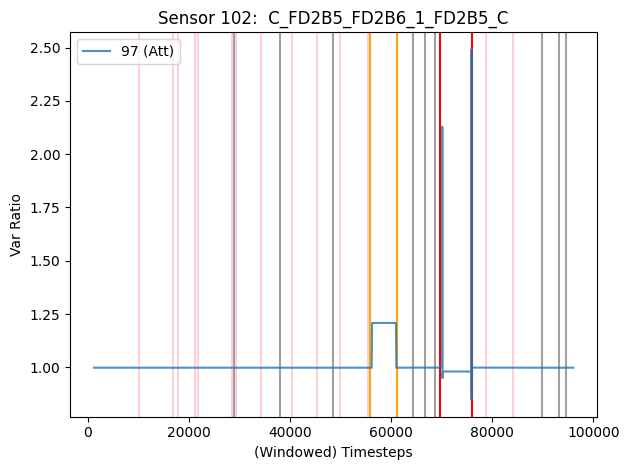

***********************************************************************************************
Sensor 103:  V_FD2B5_AN


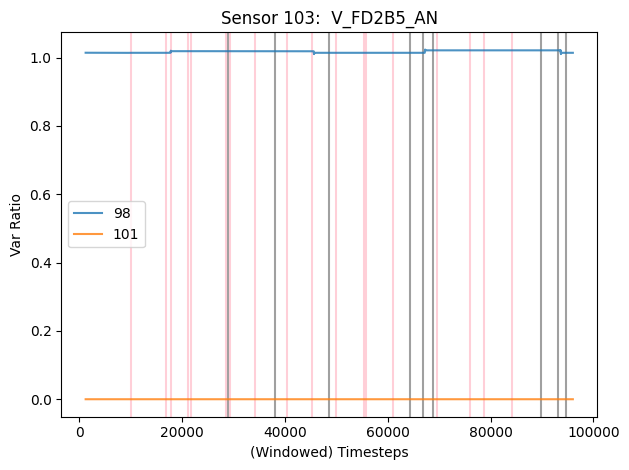

***********************************************************************************************
Sensor 104:  V_FD2B5_BN


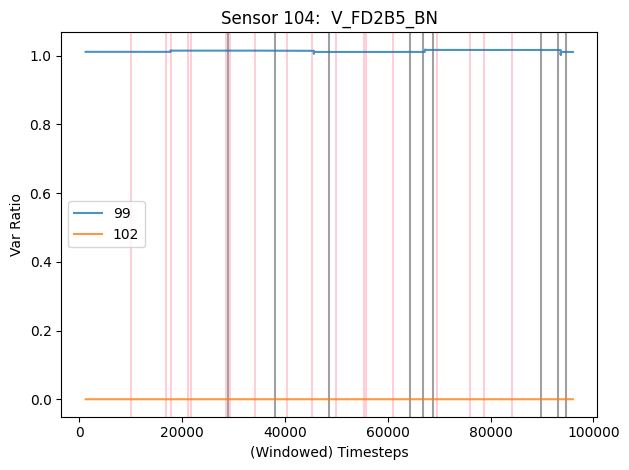

***********************************************************************************************
Sensor 105:  V_FD2B5_CN


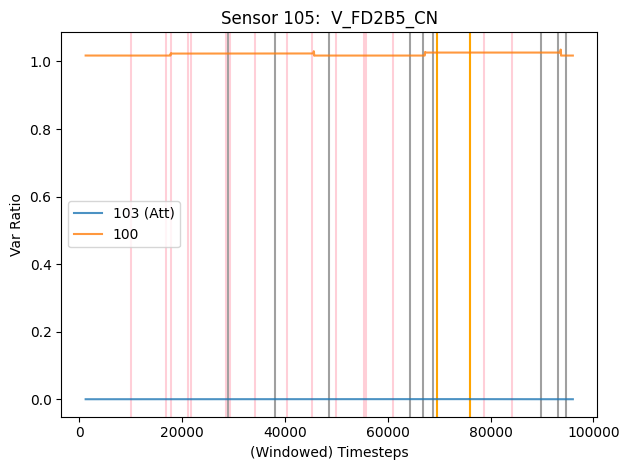

***********************************************************************************************
Sensor 106:  C_FD3B4_FD3B5_1_FD3B4_A


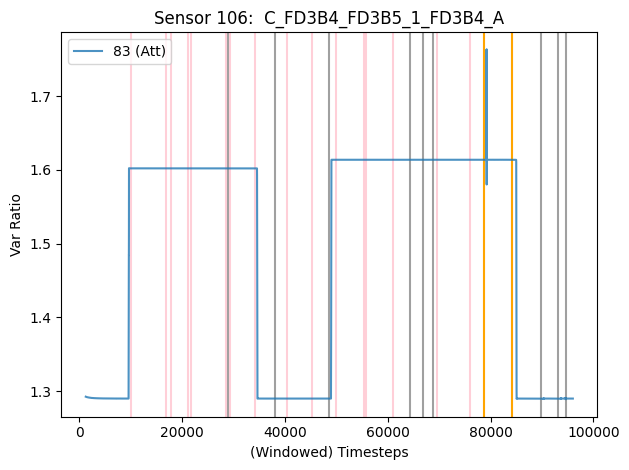

***********************************************************************************************
Sensor 107:  C_FD3B4_FD3B5_1_FD3B4_B


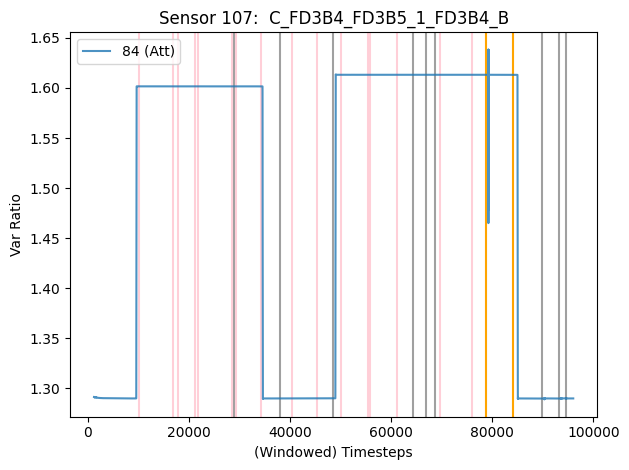

***********************************************************************************************
Sensor 108:  C_FD3B4_FD3B5_1_FD3B4_C


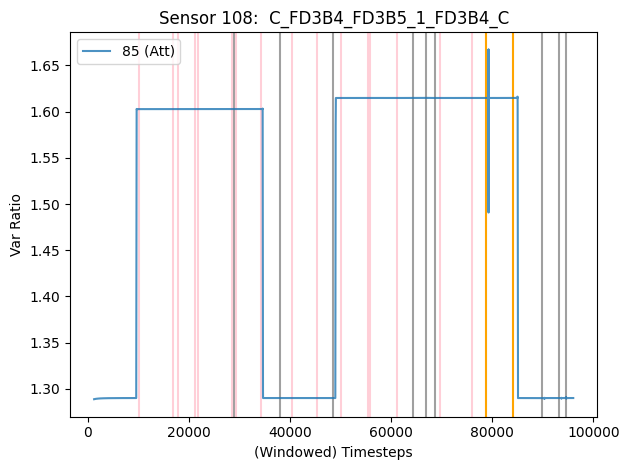

***********************************************************************************************
Sensor 109:  V_FD3B4_AN


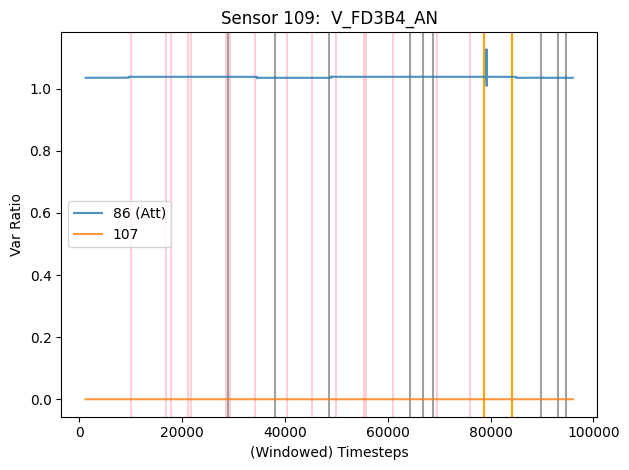

***********************************************************************************************
Sensor 110:  V_FD3B4_BN


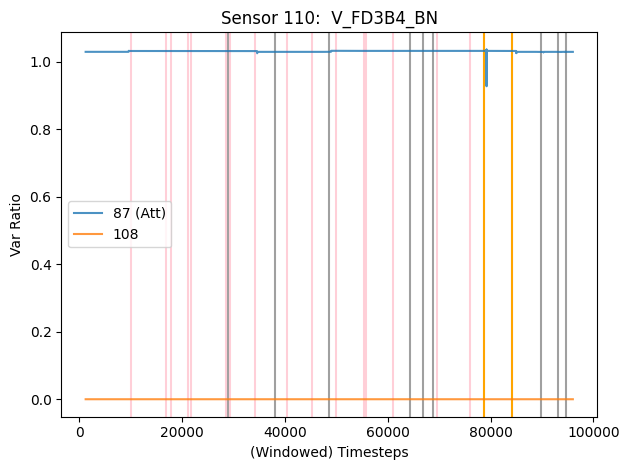

***********************************************************************************************
Sensor 111:  V_FD3B4_CN


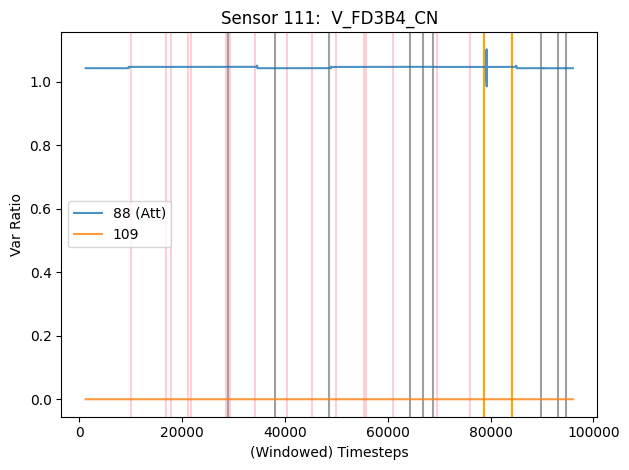

In [ ]:
plot_edge_stats(stat_list=var_list, stat="Var Ratio")